# Preprocessing

In [1]:
!module load StdEnv/2020 gcc/9.3.0 opencv python/3.8 scipy-stack hdf5 geos/3.10.2 arrow/7.0.0



Lmod is automatically replacing "intel/2020.1.217" with "gcc/9.3.0".


Due to MODULEPATH changes, the following have been reloaded:
  1) mii/1.1.2

The following have been reloaded with a version change:
  1) StdEnv/2023 => StdEnv/2020
  2) blis/0.9.0 => blis/0.8.1
  3) flexiblas/3.3.1 => flexiblas/3.0.4
  4) gcc/12.3 => gcc/9.3.0
  5) gcccore/.12.3 => gcccore/.9.3.0
  6) gentoo/2023 => gentoo/2020
  7) libfabric/1.18.0 => libfabric/1.10.1
  8) openmpi/4.1.5 => openmpi/4.0.3
  9) ucx/1.14.1 => ucx/1.8.0



In [2]:
!source ~/HIPT_Embedding_Env/bin/activate

In [3]:
import sys
import os

In [4]:
sys.path.append(os.path.abspath('/home/sorkwos/projects/rrg-senger-ab/multimodality/contrastive_learning/tab-transformer-pytorch'))

In [5]:
import os
import xml.etree.ElementTree as ET
import pandas as pd
import numpy as np
import glob
import xmltodict
from IPython.display import display, HTML


# Function to drop columns with all same values or all NaN values
def drop_constant_columns(df):
    # Drop columns with all NaN values
    df = df.dropna(axis=1, how='all')

    # Find columns where all values are the same (including columns with a single unique non-NaN value)
    nunique = df.apply(pd.Series.nunique, dropna=False)
    cols_to_drop = nunique[nunique <= 1].index

    # Drop these columns
    df = df.drop(cols_to_drop, axis=1)

    return df

# Display the DataFrame in a scrollable format
def display_scrollable_dataframe(df, max_rows=20):
    display(HTML(df.to_html(max_rows=max_rows, classes='table table-striped table-bordered table-hover')))

# Function to recursively extract tags and values
def extract_tags_and_values(elem, parent_tag="", tag_count=None):
    if tag_count is None:
        tag_count = {}

    data = {}
    for child in elem:
        # Get the base tag without any namespaces
        base_tag = child.tag.split('}')[-1]

        # If this tag has a sequence attribute, append it to the tag
        sequence = child.attrib.get('sequence')

        # Construct full tag name, including parent if necessary
        if parent_tag:
            full_tag = f"{parent_tag}.{base_tag}"
        else:
            full_tag = base_tag

        # Handle repeated tags: append index or sequence to make the tag unique
        if sequence:
            full_tag += f"_seq_{sequence}"
        elif full_tag in tag_count:
            tag_count[full_tag] += 1
            full_tag += f"_{tag_count[full_tag]}"
        else:
            tag_count[full_tag] = 1

        # If the child has text and it's not just whitespace, store the value
        if child.text and child.text.strip():
            data[full_tag] = child.text.strip()

        # Recursively call the function to process the child elements
        data.update(extract_tags_and_values(child, full_tag, tag_count))

    return data

# Function to process all XML files in subfolders and consolidate them into a DataFrame
def process_xml_files(root_folder):
    all_data = []

    # Recursively find all XML files in the root folder and subfolders
    xml_files = glob.glob(os.path.join(root_folder, '**/*.xml'), recursive=True)

    for xml_file in xml_files:
        # Load and parse each XML file
        tree = ET.parse(xml_file)
        root = tree.getroot()

        # Extract the patient data using the extract_tags_and_values function
        patient_data = extract_tags_and_values(root)

        # Add the patient data to the list
        all_data.append(patient_data)

    # Convert the list of dictionaries to a pandas DataFrame
    df = pd.DataFrame(all_data)

    # Optionally: Drop columns that have all NaN values or are constant
    df_cleaned = drop_constant_columns(df)

    return df_cleaned

# Function to extract and organize follow-up columns dynamically
def extract_and_organize_followup(df, prefix="follow_up_seq"):
    # Extract columns that match the follow-up sequence prefix
    follow_up_columns = [col for col in df.columns if prefix in col]
    
    # Extract unique sequence numbers dynamically (e.g., _1, _2, etc.)
    seq_numbers = sorted(set([col.split(f"{prefix}_")[1].split('_')[0] for col in follow_up_columns if f"{prefix}_" in col]))
    
    # Organize columns based on the sequence numbers
    organized_columns = []
    for seq in seq_numbers:
        seq_columns = [col for col in follow_up_columns if f"{prefix}_{seq}" in col]
        organized_columns.extend(seq_columns)
    
    return organized_columns

# Function to extract and organize drug columns, accounting for drug_1 being just 'patient.drugs.drug'
def extract_and_organize_drugs(df, base_prefix="patient.drugs.drug"):
    # Extract all drug-related columns (both drug_1 and drug_x)
    drug_columns = [col for col in df.columns if base_prefix in col]
    
    # Special handling for 'drug_1' columns without a suffix
    drug_1_columns = [col for col in drug_columns if base_prefix + "_" not in col]
    
    # Extract unique drug sequence numbers dynamically, handling possible extra parts in the column names
    drug_seq_numbers = sorted(set([int(col.split(f"{base_prefix}_")[1].split('.')[0])
                                   for col in drug_columns if f"{base_prefix}_" in col]))
    
    # Organize columns based on the sequence numbers
    organized_columns = drug_1_columns  # Start with drug_1 columns
    for seq in drug_seq_numbers:
        seq_columns = [col for col in drug_columns if f"{base_prefix}_{seq}." in col]
        organized_columns.extend(seq_columns)
    
    return organized_columns

/home/sorkwos/HIPT_Embedding_Env/lib/python3.8/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.0' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


Edition standardizations scripts here

In [6]:
def map_icd_to_site(icd_code):
    """Maps ICD-10 code to the corresponding AJCC site."""
    
    if icd_code in ['C02.9', 'C04.9', 'C06.9', 'C06.0', 'C03.9', 'C00.9', 'C05.0', 'C03.1', 'C04.0', 'C06.2', 'C02.1', 'C05.9', 'C03.0', 'C02.2']:
        return 'Section 3'
    
    elif icd_code in ['C32.9','C32.1']:
        return 'Section 5'
    
    elif icd_code == 'C14.8':
        return 'Section 9'
    
    elif icd_code in ['C09.9', 'C01', 'C10.9', 'C10.3','C13.9']:
        return 'Section 4'
    
    elif icd_code == 'C41.1':
        return 'Section 27'
    
    else:
        return 'Unknown Site'
    
def map_section_3_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th):
    """Maps AJCC 6th edition to 7th edition for Section 3: Lip and Oral Cavity."""
    # T4 lesions have been divided into T4a (moderately advanced local disease) 
    # and T4b (very advanced local disease), leading to the stratification of 
    # Stage IV into Stage IVA, IVB, and IVC.
    if t_stage_6th == 'T4':
        return 'T4a', n_stage_6th, m_stage_6th  # T4 has been split into T4a and T4b
    else:
        return t_stage_6th, n_stage_6th, m_stage_6th


def map_section_4_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th, tissue_or_organ):
    """Maps AJCC 6th edition to 7th edition for Section 4 using the provided mappings."""
    
    if tissue_or_organ in ['Oral Tongue', 'Oral Cavity', 'Floor of mouth', 'Tonsil', 'Base of tongue', 'Buccal Mucosa', 
                           'Alveolar Ridge', 'Hard Palate', 'Lip', 'Oropharynx', 'Hypopharynx', 'Larynx']:
        # The conditions here should match your exact categories
        if t_stage_6th == 'T4':
            return 'T4a', n_stage_6th, m_stage_6th  # Modify based on specific stratification
        else:
            return t_stage_6th, n_stage_6th, m_stage_6th
    else:
        return t_stage_6th, n_stage_6th, m_stage_6th

def map_section_5_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th):
    """Maps AJCC 6th edition to 7th edition for Section 5: Larynx."""
    # T4 lesions have been divided into T4a (moderately advanced local disease) 
    # and T4b (very advanced local disease), leading to the stratification of 
    # Stage IV into Stage IVA, IVB, and IVC.
    if t_stage_6th == 'T4':
        return 'T4a', n_stage_6th, m_stage_6th  # T4 has been split into T4a and T4b
    else:
        return t_stage_6th, n_stage_6th, m_stage_6th

def map_section_9_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th):
    """Maps AJCC 6th edition to 7th edition for Section 9: Mucosal Melanoma of the Head and Neck."""
    # No changes needed for Section 9 as it didn't exist in the 6th edition.
    return t_stage_6th, n_stage_6th, m_stage_6th

def map_section_27_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th):
    """Maps AJCC 6th edition to 7th edition for Section 27: Bone (Mandible)."""
    # Stage III is reserved for G3 and G4 grades in the 7th edition.
    return t_stage_6th, n_stage_6th, m_stage_6th


    
def map_ajcc_6th_to_7th(icd_code, t_stage_6th, n_stage_6th, m_stage_6th, tissue_or_organ, grade=None):
    """Maps AJCC 6th edition to 7th edition based on the section derived from the ICD-10 code."""
    section = map_icd_to_site(icd_code)
    
    if section == 'Section 3':
        return map_section_3_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th)
    elif section == 'Section 4':
        return map_section_4_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th, tissue_or_organ)
    elif section == 'Section 5':
        return map_section_5_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th)
    elif section == 'Section 9':
        return map_section_9_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th)
    elif section == 'Section 27':
        return map_section_27_6th_to_7th(t_stage_6th, n_stage_6th, m_stage_6th)
    else:
        return 'Unknown Section', t_stage_6th, n_stage_6th, m_stage_6th

def map_section_3_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th):
    """Maps AJCC 5th edition to 6th edition for Section 3: Lip and Oral Cavity."""
    # T4 lesions have been divided into T4a (resectable) and T4b (unresectable), 
    # leading to the division of Stage IV into Stage IVA, IVB, and IVC.
    if t_stage_5th == 'T4':
        return 'T4a', n_stage_5th, m_stage_5th  # Assuming resectable; adjust if needed
    else:
        return t_stage_5th, n_stage_5th, m_stage_5th

def map_section_4_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th, tissue_or_organ):
    """Maps AJCC 5th edition to 6th edition for Section 4: Pharynx, considering the specific subregions."""

    # For oropharynx and hypopharynx subdivisions:
    # T4 lesions are divided into T4a and T4b in the 6th edition.

    if tissue_or_organ in ['Oral Tongue', 'Oral Cavity', 'Floor of mouth', 'Tonsil', 'Base of tongue',
                           'Buccal Mucosa', 'Alveolar Ridge', 'Hard Palate', 'Lip', 'Oropharynx', 'Hypopharynx', 'Larynx']:
        if t_stage_5th == 'T4':
            return 'T4a', n_stage_5th, m_stage_5th  # Assuming resectable
        else:
            return t_stage_5th, n_stage_5th, m_stage_5th
    else:
        return t_stage_5th, n_stage_5th, m_stage_5th


def map_section_5_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th):
    """Maps AJCC 5th edition to 6th edition for Section 5: Larynx."""
    # T4 lesions have been divided into T4a (resectable) and T4b (unresectable),
    # leading to the division of Stage IV into Stage IVA, IVB, and IVC.
    if t_stage_5th == 'T4':
        return 'T4a', n_stage_5th, m_stage_5th  # Assuming resectable; adjust if needed
    else:
        return t_stage_5th, n_stage_5th, m_stage_5th

def map_section_9_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th):
    """Maps AJCC 5th edition to 6th edition for Section 9: Mucosal Melanoma of the Head and Neck."""
    # No changes needed for Section 9 as it did not exist in the 6th edition.
    return t_stage_5th, n_stage_5th, m_stage_5th

def map_section_27_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th):
    """Maps AJCC 5th edition to 6th edition for Section 27: Bone (Mandible)."""
    # M1 lesions have been divided into M1a and M1b:
    # - M1a is lung-only metastases (Stage IVA)
    # - M1b is metastases to other distant sites, including lymph nodes (Stage IVB).
    if m_stage_5th == 'M1':
        return t_stage_5th, n_stage_5th, 'M1a'  
    else:
        return t_stage_5th, n_stage_5th, m_stage_5th

def map_ajcc_5th_to_6th(icd_code, t_stage_5th, n_stage_5th, m_stage_5th, tissue_or_organ):
    """Maps AJCC 5th edition to 6th edition based on the section derived from the ICD-10 code."""
    section = map_icd_to_site(icd_code)
    
    if section == 'Section 3':
        return map_section_3_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th)
    elif section == 'Section 4':
        return map_section_4_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th, tissue_or_organ)
    elif section == 'Section 5':
        return map_section_5_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th)
    elif section == 'Section 9':
        return map_section_9_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th)
    elif section == 'Section 27':
        return map_section_27_5th_to_6th(t_stage_5th, n_stage_5th, m_stage_5th)
    else:
        return t_stage_5th, n_stage_5th, m_stage_5th

def map_clinical_5th_to_6th(row):
    # Clinical mapping
    clinical_t, clinical_n, clinical_m = map_ajcc_5th_to_6th(
        icd_code=row['patient.icd_10'],
        t_stage_5th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_T'],
        n_stage_5th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_N'],
        m_stage_5th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_M'],
        tissue_or_organ=row['patient.anatomic_neoplasm_subdivision']
    )
    
    return pd.Series({
        'ajcc_clinical_t': clinical_t,
        'ajcc_clinical_n': clinical_n,
        'ajcc_clinical_m': clinical_m

    })

def map_clinical_6th_to_7th(row):
    # Clinical mapping
    clinical_t, clinical_n, clinical_m = map_ajcc_6th_to_7th(
        icd_code=row['patient.icd_10'],
        t_stage_6th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_T'],
        n_stage_6th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_N'],
        m_stage_6th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_M'],
        tissue_or_organ=row['patient.anatomic_neoplasm_subdivision']
    )
    
    return pd.Series({
        'ajcc_clinical_t': clinical_t,
        'ajcc_clinical_n': clinical_n,
        'ajcc_clinical_m': clinical_m
    })

def map_clinical_and_pathologic_5th_to_6th(row):
    # Clinical mapping
    clinical_t, clinical_n, clinical_m = map_ajcc_5th_to_6th(
        icd_code=row['patient.icd_10'],
        t_stage_5th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_T'],
        n_stage_5th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_N'],
        m_stage_5th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_M'],
        tissue_or_organ=row['patient.anatomic_neoplasm_subdivision']
    )
    
    # Pathologic mapping
    pathologic_t, pathologic_n, pathologic_m = map_ajcc_5th_to_6th(
        icd_code=row['patient.icd_10'],
        t_stage_5th=row['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'],
        n_stage_5th=row['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'],
        m_stage_5th=row['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'],
        tissue_or_organ=row['patient.anatomic_neoplasm_subdivision']
    )
    
    return pd.Series({
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T': clinical_t,
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N': clinical_n,
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M': clinical_m,
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T': pathologic_t,
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N': pathologic_n,
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M': pathologic_m
    })

def map_clinical_and_pathologic_6th_to_7th(row):
    # Clinical mapping
    clinical_t, clinical_n, clinical_m = map_ajcc_6th_to_7th(
        icd_code=row['patient.icd_10'],
        t_stage_6th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_T'],
        n_stage_6th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_N'],
        m_stage_6th=row['patient.stage_event.tnm_categories.clinical_categories.clinical_M'],
        tissue_or_organ=row['patient.anatomic_neoplasm_subdivision']
    )
    
    # Pathologic mapping
    pathologic_t, pathologic_n, pathologic_m = map_ajcc_6th_to_7th(
        icd_code=row['patient.icd_10'],
        t_stage_6th=row['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'],
        n_stage_6th=row['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'],
        m_stage_6th=row['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'],
        tissue_or_organ=row['patient.anatomic_neoplasm_subdivision']
    )
    
    return pd.Series({
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T': clinical_t,
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N': clinical_n,
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M': clinical_m,
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T': pathologic_t,
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N': pathologic_n,
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M': pathologic_m
    })

In [7]:
# Example usage
root_folder = './tcga_hnsc_xml_clinical'  # Specify your root folder here

# Process all XML files and get the consolidated DataFrame
df = process_xml_files(root_folder)

In [8]:
radiation_columns = extract_and_organize_drugs(df,"patient.radiations.radiation")
reordered_columns_df_1 = pd.concat([df.drop(columns=radiation_columns), df[radiation_columns]], axis=1)

drug_columns = extract_and_organize_drugs(reordered_columns_df_1)
reordered_columns_df_2 = pd.concat([reordered_columns_df_1.drop(columns=drug_columns), reordered_columns_df_1[drug_columns]], axis=1)

follow_up_columns = extract_and_organize_followup(reordered_columns_df_2)
reordered_columns_df_3 = pd.concat([reordered_columns_df_2.drop(columns=follow_up_columns), reordered_columns_df_2[follow_up_columns]], axis=1)

1. Remove follow_up, radiation and drug information

In [9]:
new_df = reordered_columns_df_3.loc[:, ~reordered_columns_df_3.columns.str.contains("patient.follow_ups|patient.radiations|patient.drugs")]

2. Need to keep patient.bcr_patient_barcode and patient.bcr_patient_uuid for WSI mapping. remove other ID related fields (admin.file_uuid,admin.batch_number,patient.patient_id). 

In [10]:

new_df = new_df.drop(["admin.file_uuid", "admin.batch_number", "patient.patient_id"], axis=1)
#remove: admin.file_uuid, admin.batch_numer, patient.patient_id, 

3. Remove values that are post-treatment

In [11]:
new_df = new_df.drop(columns=[
    "patient.radiation_therapy",
    "patient.postoperative_rx_tx",
    "patient.primary_therapy_outcome_success",
    #"patient.stage_event.pathologic_stage",
    #"patient.stage_event.tnm_categories.pathologic_categories.pathologic_T",
    #"patient.stage_event.tnm_categories.pathologic_categories.pathologic_N",
    #"patient.stage_event.tnm_categories.pathologic_categories.pathologic_M",
    #"patient.margin_status",
    #"patient.presence_of_pathological_nodal_extracapsular_spread",
    #"patient.lymphovascular_invasion_present",
    #"patient.perineural_invasion_present",
    "patient.new_tumor_events.new_tumor_event_after_initial_treatment",
    "patient.new_tumor_events.new_tumor_event.days_to_new_tumor_event_after_initial_treatment",
    "patient.new_tumor_events.new_tumor_event.new_neoplasm_event_occurrence_anatomic_site",
    "patient.new_tumor_events.new_tumor_event.new_neoplasm_occurrence_anatomic_site_text",
    "patient.new_tumor_events.new_tumor_event.progression_determined_by",
    "patient.new_tumor_events.new_tumor_event.new_tumor_event_additional_surgery_procedure",
    "patient.new_tumor_events.new_tumor_event.additional_radiation_therapy",
    "patient.new_tumor_events.new_tumor_event.additional_pharmaceutical_therapy",
    "patient.new_tumor_events.new_tumor_event.new_neoplasm_event_type",
    "patient.new_tumor_events.new_tumor_event.days_to_new_tumor_event_additional_surgery_procedure",
    "patient.vital_status",
    "patient.days_to_last_followup",
    "patient.days_to_death",
    "patient.days_to_last_known_alive",
    #"patient.number_of_lymphnodes_positive_by_ihc",
    #"patient.neoplasm_histologic_grade",
    "patient.history_of_neoadjuvant_treatment",
    #"patient.lymph_node_examined_count",
    #"patient.number_of_lymphnodes_positive_by_he",
    #"patient.lymphnode_neck_dissection",
    #"patient.lymphnode_dissection_method_left",
    #"patient.lymphnode_dissection_method_right",
    "patient.person_neoplasm_cancer_status",
    #"patient.primary_lymph_node_presentation_assessment"
])


4. Remove values that are empty or useless

In [12]:
new_df = new_df.drop(columns=[
    "patient.tissue_prospective_collection_indicator",
    "patient.tissue_retrospective_collection_indicator",
    "patient.tissue_source_site",
    "patient.days_to_initial_pathologic_diagnosis",
    "patient.year_of_initial_pathologic_diagnosis",
    "patient.day_of_form_completion",
    "patient.month_of_form_completion",
    "patient.year_of_form_completion",
    "patient.age_at_initial_pathologic_diagnosis" #removed because there is already "days_to_birth" available which is in days. 
])


In [13]:
# Create a copy of clinical_data for processing
clinical_data_filtered = new_df.copy()

# Step 1: Mapping 4th/5th edition to 6th edition
mask_5th = clinical_data_filtered['patient.stage_event.system_version'].isin(['4th', '5th'])
df_filtered_5th = clinical_data_filtered[mask_5th].copy()

# Apply the 5th to 6th mapping
mapped_values_5th = df_filtered_5th.apply(map_clinical_and_pathologic_5th_to_6th, axis=1)
df_filtered_5th.update(mapped_values_5th)

# Update clinical_data_filtered to include the new 6th edition values
clinical_data_filtered.update(df_filtered_5th)

# Step 2: Mapping 6th edition (including 5th-to-6th mapped) to 7th edition
mask_6th_combined = clinical_data_filtered['patient.stage_event.system_version'].isin(['4th', '5th', '6th'])
df_filtered_6th = clinical_data_filtered[mask_6th_combined].copy()

# Apply the 6th to 7th mapping
mapped_values_6th_to_7th = df_filtered_6th.apply(map_clinical_and_pathologic_6th_to_7th, axis=1)
df_filtered_6th.update(mapped_values_6th_to_7th)

# Directly update clinical_data_filtered with 6th-to-7th mapped values
clinical_data_filtered.update(df_filtered_6th)

# Final processed DataFrame
clinical_data_updated = clinical_data_filtered

In [14]:

for column in clinical_data_updated.columns:
    print(f"Column: {column}")
    value_counts = clinical_data_updated[column].value_counts(normalize=True,dropna=False) * 100
    for value, percentage in value_counts.items():
        print(f"  Value: {value}, Percentage: {percentage:.2f}%")
    print("\n" + "="*50 + "\n")

Column: patient.histological_type
  Value: Head & Neck Squamous Cell Carcinoma, Percentage: 97.92%
  Value: Head & Neck Squamous Cell Carcinoma Basaloid Type, Percentage: 1.89%
  Value: Head & Neck Squamous Cell Carcinoma, Spindle Cell Variant, Percentage: 0.19%


Column: patient.gender
  Value: MALE, Percentage: 73.11%
  Value: FEMALE, Percentage: 26.89%


Column: patient.days_to_birth
  Value: -17125, Percentage: 0.38%
  Value: -18812, Percentage: 0.38%
  Value: -18718, Percentage: 0.38%
  Value: -28221, Percentage: 0.38%
  Value: -25020, Percentage: 0.38%
  Value: -24558, Percentage: 0.38%
  Value: -22182, Percentage: 0.38%
  Value: -18536, Percentage: 0.38%
  Value: -22836, Percentage: 0.19%
  Value: -20464, Percentage: 0.19%
  Value: -20386, Percentage: 0.19%
  Value: -18272, Percentage: 0.19%
  Value: -27261, Percentage: 0.19%
  Value: -22828, Percentage: 0.19%
  Value: -22455, Percentage: 0.19%
  Value: -20175, Percentage: 0.19%
  Value: -29530, Percentage: 0.19%
  Value: -17471

In [15]:

# Convert the string values to float, handling 'NaN'
clinical_data_updated['patient.days_to_birth'] = pd.to_numeric(clinical_data_updated['patient.days_to_birth'], errors='coerce')

clinical_data_updated['patient.days_to_birth'] = clinical_data_updated['patient.days_to_birth'].apply(lambda x: abs(x) if pd.notnull(x) and x < 0 else x)

# List of columns to convert from str to float
cols_to_convert = [
    'patient.number_of_lymphnodes_positive_by_ihc',
    'patient.number_of_lymphnodes_positive_by_he',
    'patient.lymph_node_examined_count'
]

# Convert the columns to numeric, coercing errors to NaN
clinical_data_updated[cols_to_convert] = clinical_data_updated[cols_to_convert].apply(
    pd.to_numeric, errors='coerce'
)

# Create a mask where any of the three columns is NaN
mask_nan = clinical_data_updated[cols_to_convert].isna().any(axis=1)

# Create a mask where 'patient.lymph_node_examined_count' is zero (to avoid division by zero)
mask_zero_examined = clinical_data_updated['patient.lymph_node_examined_count'] == 0

# Combine the masks
mask_invalid = mask_nan | mask_zero_examined

# Calculate 'patient.lymphnodes_ratio_positive_by_ihc'
clinical_data_updated['patient.lymphnodes_ratio_positive_by_ihc'] = np.where(
    mask_invalid,
    -1,
    clinical_data_updated['patient.number_of_lymphnodes_positive_by_ihc'] /
    clinical_data_updated['patient.lymph_node_examined_count']
)

# Calculate 'patient.lymphnodes_ratio_positive_by_he'
clinical_data_updated['patient.lymphnodes_ratio_positive_by_he'] = np.where(
    mask_invalid,
    -1,
    clinical_data_updated['patient.number_of_lymphnodes_positive_by_he'] /
    clinical_data_updated['patient.lymph_node_examined_count']
)

# Delete the original columns
clinical_data_updated.drop(columns=cols_to_convert, inplace=True)

In [ ]:
clinical_data_final = clinical_data_updated.drop('patient.stage_event.system_version', axis=1)


for column in clinical_data_final.columns:
    print(f"Column: {column}")
    value_counts = clinical_data_final[column].value_counts(normalize=True,dropna=False) * 100
    for value, percentage in value_counts.items():
        print(f"  Value: {value}, Percentage: {percentage:.2f}%")
    print("\n" + "="*50 + "\n")

Column: patient.histological_type
  Value: Head & Neck Squamous Cell Carcinoma, Percentage: 97.92%
  Value: Head & Neck Squamous Cell Carcinoma Basaloid Type, Percentage: 1.89%
  Value: Head & Neck Squamous Cell Carcinoma, Spindle Cell Variant, Percentage: 0.19%


Column: patient.gender
  Value: MALE, Percentage: 73.11%
  Value: FEMALE, Percentage: 26.89%


Column: patient.days_to_birth
  Value: 17125.0, Percentage: 0.38%
  Value: 18812.0, Percentage: 0.38%
  Value: 18718.0, Percentage: 0.38%
  Value: 28221.0, Percentage: 0.38%
  Value: 25020.0, Percentage: 0.38%
  Value: 24558.0, Percentage: 0.38%
  Value: 22182.0, Percentage: 0.38%
  Value: 18536.0, Percentage: 0.38%
  Value: 22836.0, Percentage: 0.19%
  Value: 20464.0, Percentage: 0.19%
  Value: 20386.0, Percentage: 0.19%
  Value: 18272.0, Percentage: 0.19%
  Value: 27261.0, Percentage: 0.19%
  Value: 22828.0, Percentage: 0.19%
  Value: 22455.0, Percentage: 0.19%
  Value: 20175.0, Percentage: 0.19%
  Value: 29530.0, Percentage: 0.19

Note: a patient does not have age at diagnosis which is weird but not a big deal for now I guess. At this point the data is ready for processing

In [17]:
import pandas as pd

# Load the Excel file with endpoints
file_path = "/home/sorkwos/1b5f413e-a8d1-4d10-92eb-7c4ae739ed81/TCGA-CDR-SupplementalTableS1.xlsx"
df = pd.read_excel(file_path)

df_hnsc = df[df['type'].str.contains("HNSC", na=False)]

# Load the Excel file with endpoints
file_path = "/home/sorkwos/HIV_TCGA.xls"
df_hiv_in= pd.read_excel(file_path, header=1)
df_hiv = df_hiv_in[df_hiv_in['Study'].str.contains("HNSC", na=False)]


display_scrollable_dataframe(df_hnsc)

,Unnamed: 0,bcr_patient_barcode,type,age_at_initial_pathologic_diagnosis,gender,race,ajcc_pathologic_tumor_stage,clinical_stage,histological_type,histological_grade,initial_pathologic_dx_year,menopause_status,birth_days_to,vital_status,tumor_status,last_contact_days_to,death_days_to,cause_of_death,new_tumor_event_type,new_tumor_event_site,new_tumor_event_site_other,new_tumor_event_dx_days_to,treatment_outcome_first_course,margin_status,residual_tumor,OS,OS.time,DSS,DSS.time,DFI,DFI.time,PFI,PFI.time,Redaction
3241,3242,TCGA-4P-AA8J,HNSC,66.0,MALE,BLACK OR AFRICAN AMERICAN,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2013.0,[Not Available],-24222.0,Alive,TUMOR FREE,102.0,NaN,[Not Available],NaN,NaN,NaN,NaN,Complete Remission/Response,NaN,NaN,0.0,102.0,0.0,102.0,NaN,NaN,0.0,102.0,NaN
3242,3243,TCGA-BA-4074,HNSC,69.0,MALE,WHITE,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G3,2003.0,[Not Available],-25282.0,Dead,WITH TUMOR,NaN,462.0,[Not Available],NaN,Distant Metastasis,bone (humerus),396.0,Complete Remission/Response,NaN,NaN,1.0,462.0,1.0,462.0,NaN,NaN,1.0,396.0,NaN
3243,3244,TCGA-BA-4075,HNSC,49.0,MALE,BLACK OR AFRICAN AMERICAN,Stage III,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2004.0,[Not Available],-17951.0,Dead,WITH TUMOR,NaN,283.0,[Not Available],NaN,Oral Cavity,NaN,236.0,Progressive Disease,NaN,NaN,1.0,283.0,1.0,283.0,NaN,NaN,1.0,236.0,NaN
3244,3245,TCGA-BA-4076,HNSC,39.0,MALE,WHITE,[Not Available],Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2003.0,[Not Available],-14405.0,Dead,WITH TUMOR,NaN,415.0,[Not Available],NaN,Larynx,NaN,286.0,Complete Remission/Response,NaN,NaN,1.0,415.0,1.0,415.0,NaN,NaN,1.0,286.0,NaN
3245,3246,TCGA-BA-4077,HNSC,45.0,FEMALE,WHITE,Stage IVA,Stage IVB,Head & Neck Squamous Cell Carcinoma,G2,2003.0,[Not Available],-16536.0,Dead,WITH TUMOR,NaN,1134.0,[Not Available],NaN,NaN,NaN,NaN,Persistent Disease,NaN,NaN,1.0,1134.0,1.0,1134.0,NaN,NaN,1.0,1134.0,NaN
3246,3247,TCGA-BA-4078,HNSC,83.0,MALE,WHITE,[Not Available],Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2003.0,[Not Available],-30480.0,Dead,WITH TUMOR,NaN,276.0,[Not Available],NaN,NaN,NaN,NaN,[Not Available],NaN,NaN,1.0,276.0,1.0,276.0,NaN,NaN,1.0,276.0,NaN
3247,3248,TCGA-BA-5149,HNSC,47.0,MALE,WHITE,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2010.0,[Not Available],-17177.0,Dead,WITH TUMOR,NaN,806.0,[Not Available],NaN,Distant Metastasis,Lung,389.0,Complete Remission/Response,NaN,NaN,1.0,806.0,1.0,806.0,NaN,NaN,1.0,389.0,NaN
3248,3249,TCGA-BA-5151,HNSC,72.0,MALE,WHITE,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G1,2010.0,[Not Available],-26569.0,Alive,TUMOR FREE,722.0,NaN,[Not Available],NaN,NaN,NaN,517.0,Complete Remission/Response,NaN,NaN,0.0,722.0,0.0,722.0,NaN,NaN,1.0,517.0,NaN
3249,3250,TCGA-BA-5152,HNSC,56.0,MALE,WHITE,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2009.0,[Not Available],-20783.0,Alive,TUMOR FREE,1288.0,NaN,[Not Available],NaN,NaN,NaN,NaN,Complete Remission/Response,NaN,NaN,0.0,1288.0,0.0,1288.0,NaN,NaN,0.0,1288.0,NaN
3250,3251,TCGA-BA-5153,HNSC,51.0,MALE,WHITE,[Not Available],Stage III,Head & Neck Squamous Cell Carcinoma,G2,2005.0,[Not Available],-18743.0,Dead,WITH TUMOR,NaN,1762.0,[Not Available],NaN,Distant Metastasis,bone (hip),1522.0,Complete Remission/Response,NaN,NaN,1.0,1762.0,1.0,1762.0,1.0,1522.0,1.0,1522.0,NaN


In [18]:
# Step 1: Select relevant columns from df_hnsc
df_hnsc_filtered = df_hnsc[['bcr_patient_barcode', 'PFI', 'PFI.time']]

# Step 2: Merge the two DataFrames based on the patient barcode
clinical_data_final_updated = clinical_data_final.merge(
    df_hnsc_filtered,
    left_on='patient.bcr_patient_barcode',
    right_on='bcr_patient_barcode',
    how='left'  # Use 'left' to keep all rows from clinical_data_final and add matches from df_hnsc
)

# Ensure SampleBarcode in df_hiv is sliced to first 12 characters
# Create a copy of df_hiv to ensure it's not a view of another DataFrame
df_hiv = df_hiv[['SampleBarcode', 'HPV load', 'HPV.status']].copy()

df_hiv['SampleBarcode_short'] = df_hiv['SampleBarcode'].str[:12]


# Perform the merge, keeping all rows from clinical_data_final_updated and filling non-matches with -1
clinical_data_final_updated = clinical_data_final_updated.merge(
    df_hiv[['SampleBarcode_short', 'HPV load', 'HPV.status']],
    how='left',
    left_on='patient.bcr_patient_barcode',
    right_on='SampleBarcode_short'
).drop(columns=['SampleBarcode_short'])

clinical_data_final_updated['HPV load'] = clinical_data_final_updated['HPV load'].fillna(-1)


# Step 3: Drop the redundant 'bar_patient_barcode' column after merging
clinical_data_final_updated = clinical_data_final_updated.drop(columns=['bcr_patient_barcode'])

# Display the updated DataFrame
#display_scrollable_dataframe(clinical_data_final_updated)
clinical_data_yes_id = clinical_data_final_updated.drop(columns=['patient.bcr_patient_uuid'])
clinical_data_yes = clinical_data_final_updated.drop(columns=['patient.bcr_patient_barcode','patient.bcr_patient_uuid'])


Testing on OS

In [19]:
# Step 1: Select relevant columns from df_hnsc
df_hnsc_filtered_os = df_hnsc[['bcr_patient_barcode', 'OS', 'OS.time']]

# Step 2: Merge the two DataFrames based on the patient barcode
clinical_data_final_updated_os = clinical_data_final.merge(
    df_hnsc_filtered_os,
    left_on='patient.bcr_patient_barcode',
    right_on='bcr_patient_barcode',
    how='left'  # Use 'left' to keep all rows from clinical_data_final and add matches from df_hnsc
)

# Ensure SampleBarcode in df_hiv is sliced to first 12 characters
# Create a copy of df_hiv to ensure it's not a view of another DataFrame
df_hiv = df_hiv[['SampleBarcode', 'HPV load', 'HPV.status']].copy()

df_hiv['SampleBarcode_short'] = df_hiv['SampleBarcode'].str[:12]


# Perform the merge, keeping all rows from clinical_data_final_updated and filling non-matches with -1
clinical_data_final_updated_os = clinical_data_final_updated_os.merge(
    df_hiv[['SampleBarcode_short', 'HPV load', 'HPV.status']],
    how='left',
    left_on='patient.bcr_patient_barcode',
    right_on='SampleBarcode_short'
).drop(columns=['SampleBarcode_short'])

clinical_data_final_updated_os['HPV load'] = clinical_data_final_updated_os['HPV load'].fillna(-1)


# Step 3: Drop the redundant 'bar_patient_barcode' column after merging
clinical_data_final_update_os = clinical_data_final_updated_os.drop(columns=['bcr_patient_barcode'])

# Display the updated DataFrame
#display_scrollable_dataframe(clinical_data_final_updated)
clinical_data_yes_id_os = clinical_data_final_updated_os.drop(columns=['patient.bcr_patient_uuid'])
clinical_data_yes_os = clinical_data_final_updated_os.drop(columns=['patient.bcr_patient_barcode','patient.bcr_patient_uuid'])

In [20]:
# Load the Excel file with endpoints
file_path = "/home/sorkwos/HIV_TCGA.xls"
df_hiv_in= pd.read_excel(file_path, header=1)
df_hiv = df_hiv_in[df_hiv_in['Study'].str.contains("HNSC", na=False)]

display_scrollable_dataframe(df_hiv)

print(len(df_hiv))

,SampleBarcode,Study,HPV load,HPV.status,age_at_initial_pathologic_diagnosis,gender,race,ajcc_pathologic_tumor_stage,clinical_stage,histological_type,histological_grade,initial_pathologic_dx_year,tumor_status,last_contact_days_to,OS,OS.time,Drug,Drug response
979,TCGA-4P-AA8J-01A,HNSC,1.165072,negative,66.0,MALE,BLACK OR AFRICAN AMERICAN,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2013.0,TUMOR FREE,102.0,0,102.0,Not available,Not available
980,TCGA-BA-4074-01A,HNSC,0.769612,negative,69.0,MALE,WHITE,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G3,2003.0,WITH TUMOR,NaN,1,462.0,Not available,Not available
981,TCGA-BA-4075-01A,HNSC,0.437487,negative,49.0,MALE,BLACK OR AFRICAN AMERICAN,Stage III,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2004.0,WITH TUMOR,NaN,1,283.0,Not available,Not available
982,TCGA-BA-4076-01A,HNSC,0.775370,negative,39.0,MALE,WHITE,NaN,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2003.0,WITH TUMOR,NaN,1,415.0,Not available,Not available
983,TCGA-BA-4077-01B,HNSC,203.278171,positive,45.0,FEMALE,WHITE,Stage IVA,Stage IVB,Head & Neck Squamous Cell Carcinoma,G2,2003.0,WITH TUMOR,NaN,1,1134.0,Not available,Not available
984,TCGA-BA-4078-01A,HNSC,0.956195,negative,83.0,MALE,WHITE,NaN,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2003.0,WITH TUMOR,NaN,1,276.0,Not available,Not available
985,TCGA-BA-5149-01A,HNSC,2.480578,negative,47.0,MALE,WHITE,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2010.0,WITH TUMOR,NaN,1,806.0,Not available,Not available
986,TCGA-BA-5151-01A,HNSC,0.964914,negative,72.0,MALE,WHITE,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G1,2010.0,TUMOR FREE,722.0,0,722.0,Not available,Not available
987,TCGA-BA-5152-01A,HNSC,0.727335,negative,56.0,MALE,WHITE,Stage IVA,Stage IVA,Head & Neck Squamous Cell Carcinoma,G2,2009.0,TUMOR FREE,1288.0,0,1288.0,Not available,Not available
988,TCGA-BA-5153-01A,HNSC,297.590627,positive,51.0,MALE,WHITE,NaN,Stage III,Head & Neck Squamous Cell Carcinoma,G2,2005.0,WITH TUMOR,NaN,1,1762.0,Not available,Not available


476


In [21]:
import pandas as pd

# Load the Excel file, skipping the first row
df = pd.read_excel('HIV_TCGA.xls', header=1)

# Count the occurrences of each category in the "Study" column
study_counts = df['Study'].value_counts()

# Print the results
print(study_counts)


UCEC    514
HNSC    476
KIRC    452
OV      415
COAD    387
STAD    333
CESC    299
READ    156
GBM     154
ESCA    139
Name: Study, dtype: int64


In [22]:
print(clinical_data_yes_id.iloc[309])
#numerical columns are: patient.days_to_birth, patient.tobacco_smoking_history, patient.year_of_tobacco_smoking_onset, patient.number_pack_years_smoked, 

patient.histological_type                                                 Head & Neck Squamous Cell Carcinoma
patient.gender                                                                                           MALE
patient.days_to_birth                                                                                 30173.0
patient.race_list.race                                                                                  WHITE
patient.bcr_patient_barcode                                                                      TCGA-CQ-5323
patient.icd_o_3_site                                                                                    C14.8
patient.icd_o_3_histology                                                                              8070/3
patient.icd_10                                                                                          C14.8
patient.anatomic_neoplasm_subdivision                                                          Alveolar Ridge
patient.la

In [ ]:
display_scrollable_dataframe(clinical_data_yes_id)

,patient.histological_type,patient.gender,patient.days_to_birth,patient.race_list.race,patient.bcr_patient_barcode,patient.icd_o_3_site,patient.icd_o_3_histology,patient.icd_10,patient.anatomic_neoplasm_subdivision,patient.laterality,patient.primary_lymph_node_presentation_assessment,patient.lymphnode_neck_dissection,patient.lymphnode_dissection_method_left,patient.lymphnode_dissection_method_right,patient.margin_status,patient.presence_of_pathological_nodal_extracapsular_spread,patient.lymphovascular_invasion_present,patient.perineural_invasion_present,patient.neoplasm_histologic_grade,patient.tobacco_smoking_history,patient.year_of_tobacco_smoking_onset,patient.number_pack_years_smoked,patient.alcohol_history_documented,patient.other_dx,patient.stage_event.clinical_stage,patient.stage_event.pathologic_stage,patient.stage_event.tnm_categories.clinical_categories.clinical_T,patient.stage_event.tnm_categories.clinical_categories.clinical_N,patient.stage_event.tnm_categories.clinical_categories.clinical_M,patient.stage_event.tnm_categories.pathologic_categories.pathologic_T,patient.stage_event.tnm_categories.pathologic_categories.pathologic_N,patient.stage_event.tnm_categories.pathologic_categories.pathologic_M,patient.ethnicity,patient.stopped_smoking_year,patient.frequency_of_alcohol_consumption,patient.amount_of_alcohol_consumption_per_day,patient.hpv_status_by_p16_testing,patient.hpv_status_by_ish_testing,patient.egfr_amplication_status,patient.lymphnodes_ratio_positive_by_ihc,patient.lymphnodes_ratio_positive_by_he,PFI,PFI.time,HPV load,HPV.status
0,Head & Neck Squamous Cell Carcinoma,MALE,22836.0,WHITE,TCGA-UF-A718,C32.9,8070/3,C32.9,Larynx,Midline,YES,YES,Functional (Limited) Neck Dissection,Functional (Limited) Neck Dissection,Negative,No Extranodal Extension,NO,NO,G2,2,1959,50,NO,No,Stage IVA,Stage IVA,T4a,N0,M0,T4a,N0,M0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.000000,-1.000000,0.0,1971.0,0.541482,negative
1,Head & Neck Squamous Cell Carcinoma,MALE,21659.0,WHITE,TCGA-D6-A4Z9,C02.9,8071/3,C02.9,Oral Tongue,Left,YES,YES,Modified Radical Neck Dissection,NaN,Negative,No Extranodal Extension,NO,NO,G2,3,1973,39,NO,No,Stage IVA,Stage IVA,T2,N2,M0,T2,N2,M0,NOT HISPANIC OR LATINO,NaN,NaN,NaN,NaN,NaN,NaN,-1.000000,-1.000000,0.0,539.0,1.059250,negative
2,Head & Neck Squamous Cell Carcinoma,MALE,19956.0,BLACK OR AFRICAN AMERICAN,TCGA-BA-5555,C32.9,8070/3,C32.9,Larynx,Right,YES,YES,Modified Radical Neck Dissection,Modified Radical Neck Dissection,Negative,No Extranodal Extension,NO,NO,G2,4,NaN,62,YES,No,Stage IVA,Stage IVA,T2,N2c,M0,T3,N2c,NaN,NOT HISPANIC OR LATINO,2010,0,0,NaN,NaN,NaN,-1.000000,-1.000000,1.0,248.0,2.123449,negative
3,Head & Neck Squamous Cell Carcinoma,MALE,23185.0,ASIAN,TCGA-BB-7872,C06.9,8070/3,C06.9,Oral Tongue,Right,YES,YES,NaN,NaN,Positive,NaN,NaN,YES,G3,1,NaN,NaN,YES,No,Stage IVA,Stage I,T2,N2c,M0,T1,N0,NaN,NOT HISPANIC OR LATINO,NaN,NaN,NaN,Positive,Negative,NaN,-1.000000,-1.000000,0.0,1168.0,0.987561,negative
4,Head & Neck Squamous Cell Carcinoma,MALE,14133.0,WHITE,TCGA-CR-6470,C09.9,8070/3,C09.9,Tonsil,Right,YES,YES,Modified Radical Neck Dissection,Modified Radical Neck Dissection,Negative,NaN,NaN,NaN,G2,1,NaN,NaN,YES,No,Stage IVA,Stage II,T1,N2c,M0,T2,N0,M0,NOT HISPANIC OR LATINO,NaN,5,2.5,NaN,NaN,NaN,-1.000000,-1.000000,0.0,1521.0,128.097308,positive
5,Head & Neck Squamous Cell Carcinoma,FEMALE,28250.0,WHITE,TCGA-CV-7236,C02.9,8070/3,C02.9,Oral Tongue,Left,YES,YES,Functional (Limited) Neck Dissection,Functional (Limited) Neck Dissection,Negative,No Extranodal Extension,YES,YES,G3,NaN,NaN,NaN,NO,No,Stage IVA,Stage IVA,T2,N2c,M0,T3,N2c,NaN,NOT HISPANIC OR LATINO,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.176471,0.0,144.0,1.333834,negative
6,Head & Neck Squamous Cell Carcinoma,MALE,21443.0,WHITE,TCGA-BB-7870,C32.9,8070/3,C32.9,Larynx,NaN,YES,YES,NaN,NaN,Negative,No Extranodal Extension,NO,NO,G3,2,NaN,40,YES,No,Stage IVA,Stage IVA,T3,N2b,M0,T4a,N0,NaN,NOT HISPANIC OR LATINO,NaN,7,6,NaN,NaN,NaN,-1.000000,-1.000000,0.0,2016.0

# Deep Learning

In [25]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes' is your input DataFrame
clinical_data_test = clinical_data_yes.copy()

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

#clinical_data_test['HPV.status'] = clinical_data_test['HPV.status'].replace({'positive': 1, 'negative': 0})

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print(clinical_data_test['age_of_patient'])




# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'

]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print(X.iloc[42])

X_copy = X.copy()

# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(X, event))
X_train_df, X_test_df = X.iloc[train_idx], X.iloc[test_idx]
y_train_event, y_test_event = event[train_idx], event[test_idx]
y_train_time, y_test_time = time[train_idx], time[test_idx]

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")


0      62.521561
1      59.299110
2      54.636550
3      63.477070
4      38.694045
         ...    
523    45.360712
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 528, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.201689
patient.lymphnodes_ratio_positive_by_he                                   1.059172
age_of_patient                                                            1.429534
patient.tobacco_smoking_history                                           1.307350
patient.year_of_tobacco_smoking_onset                                    -1.070625
patient.number_pack_years_smoked                                          1.269487
patient.stopped_smoking_year                                              1.360174
patient.frequency_of_alcohol_consumption                                 -0.362455
patient.amount_of_alcohol_consumption_per_day                            -0.224637
patient.stage_ev


Optimal Threshold Selection and Kaplan-Meier Plotting for Test Set with Group Size Restriction...

Test C-Index: 0.7081
Median survival time - High Risk: 408.5
Median survival time - Low Risk: 875.5
Optimal threshold for risk score on test set: 0.5537
Minimum p-value from log-rank test on test set: < 0.001


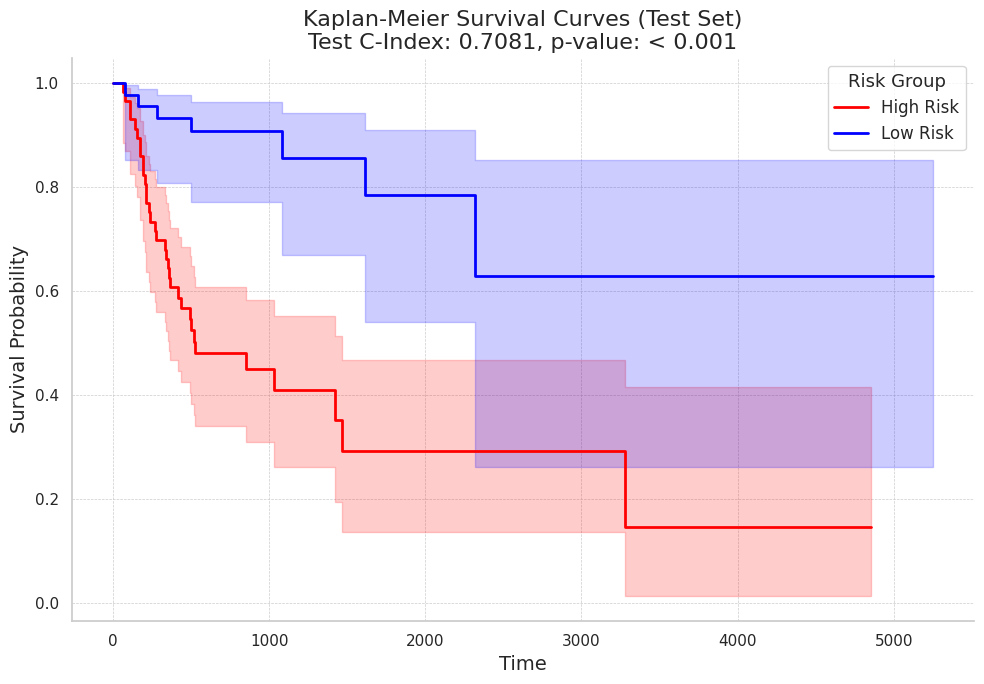

: 

: 

In [ ]:
# -------------------------------------------
# Additional Imports Needed
# -------------------------------------------
import seaborn as sns
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test
import matplotlib.pyplot as plt

# Set Seaborn style
sns.set(style="whitegrid")

# -------------------------------------------
# Optimal Threshold Selection and Kaplan-Meier Plotting for Test Set
# -------------------------------------------

print("\nOptimal Threshold Selection and Kaplan-Meier Plotting for Test Set with Group Size Restriction...\n")

# Prepare data
risk_scores_test = risk_test  # Risk scores from the model on test set
durations_test = durations_test  # Durations on test set
events_test = events_test.astype(bool)  # Events on test set

# Use negative risk scores for proper ordering in concordance index calculation
# This is consistent with your base script
c_index_test = concordance_index_censored(
    events_test,
    durations_test,
    -risk_scores_test  # Use negative risk scores
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# Search for the optimal threshold
unique_risk_scores_test = np.sort(np.unique(risk_scores_test))

# Initialize variables
best_threshold_test = None
min_p_value_test = 1.0

# Minimum group size (at least 25% of patients in each group)
total_patients = len(risk_scores_test)
min_group_size = total_patients * 0.25

# For each possible threshold, compute the log-rank test p-value
for threshold in unique_risk_scores_test[1:-1]:
    # Assign patients to groups
    is_high_risk = risk_scores_test <= threshold  # High risk have lower risk scores
    is_low_risk = risk_scores_test > threshold

    # Calculate group sizes
    group_high_size = is_high_risk.sum()
    group_low_size = is_low_risk.sum()

    # Ensure each group has at least the minimum number of patients
    if group_high_size < min_group_size or group_low_size < min_group_size:
        continue  # Skip thresholds that result in small groups

    # Check if both groups have events
    if events_test[is_high_risk].sum() == 0 or events_test[is_low_risk].sum() == 0:
        continue  # Skip thresholds where one group has no events

    # Perform log-rank test
    results_test = logrank_test(
        durations_test[is_high_risk],
        durations_test[is_low_risk],
        event_observed_A=events_test[is_high_risk],
        event_observed_B=events_test[is_low_risk]
    )
    p_value_test = results_test.p_value

    # Update the best threshold if p-value is lower
    if p_value_test < min_p_value_test:
        min_p_value_test = p_value_test
        best_threshold_test = threshold

# Check if a valid threshold was found
if best_threshold_test is None:
    print("No valid threshold found that satisfies the group size restriction.")
else:
    # Assign patients to groups based on the best threshold
    is_high_risk = risk_scores_test <= best_threshold_test  # High risk have lower risk scores
    is_low_risk = risk_scores_test > best_threshold_test

    # Confirm that the high-risk group has shorter survival times
    median_survival_high = np.median(durations_test[is_high_risk])
    median_survival_low = np.median(durations_test[is_low_risk])

    print(f"Median survival time - High Risk: {median_survival_high}")
    print(f"Median survival time - Low Risk: {median_survival_low}")

    # Ensure high-risk group has shorter survival times
    if median_survival_high >= median_survival_low:
        print("Warning: High-risk group does not have shorter median survival time compared to low-risk group.")
        # You may choose to investigate further or adjust the thresholding method

    print(f"Optimal threshold for risk score on test set: {best_threshold_test:.4f}")

    # Format p-value as per your request
    if min_p_value_test < 0.001:
        p_value_formatted = "< 0.001"
    else:
        p_value_formatted = f"{min_p_value_test:.3f}"
    print(f"Minimum p-value from log-rank test on test set: {p_value_formatted}")

    # Create a DataFrame for plotting
    test_data = pd.DataFrame({
        'duration': durations_test,
        'event': events_test,
        'group': np.where(is_high_risk, 'High Risk', 'Low Risk')
    })

    # Kaplan-Meier fitting and plotting using Seaborn
    kmf_high_test = KaplanMeierFitter()
    kmf_low_test = KaplanMeierFitter()

    plt.figure(figsize=(10, 7))

    # Fit the models
    kmf_high_test.fit(
        test_data['duration'][test_data['group'] == 'High Risk'],
        event_observed=test_data['event'][test_data['group'] == 'High Risk'],
        label='High Risk'
    )
    kmf_low_test.fit(
        test_data['duration'][test_data['group'] == 'Low Risk'],
        event_observed=test_data['event'][test_data['group'] == 'Low Risk'],
        label='Low Risk'
    )

    # Plot the survival curves with confidence intervals (error bands)
    ax = kmf_high_test.plot(ci_show=True, ci_alpha=0.2, linewidth=2, color='red')
    kmf_low_test.plot(ax=ax, ci_show=True, ci_alpha=0.2, linewidth=2, color='blue')

    # Customize the plot using Seaborn aesthetics
    sns.despine()

    # Add c-index and p-value to the plot
    plt.title('Kaplan-Meier Survival Curves (Test Set)\nTest C-Index: {:.4f}, p-value: {}'.format(c_index_test, p_value_formatted), fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Survival Probability', fontsize=14)
    plt.legend(title='Risk Group', fontsize=12, title_fontsize=13)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()


# Best subset analysis

0      62.521561
1      59.299110
2      54.636550
3      63.477070
4      38.694045
         ...    
523    45.360712
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 528, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.201689
patient.lymphnodes_ratio_positive_by_he                                   1.059172
age_of_patient                                                            1.429534
patient.tobacco_smoking_history                                           1.307350
patient.year_of_tobacco_smoking_onset                                    -1.070625
patient.number_pack_years_smoked                                          1.269487
patient.stopped_smoking_year                                              1.360174
patient.frequency_of_alcohol_consumption                                 -0.362455
patient.amount_of_alcohol_consumption_per_day                            -0.224637
patient.stage_ev

Computing permutation importance: 100%|██████████| 38/38 [05:13<00:00,  8.25s/it]



Total number of features in importance DataFrame: 38

Feature Importances (Permutation Importance with Uncertainty):
                                              Feature  Mean Decrease  \
13  patient.presence_of_pathological_nodal_extraca...       0.038282   
6               patient.anatomic_neoplasm_subdivision       0.033537   
23                                         HPV.status       0.032746   
16                  patient.neoplasm_histologic_grade       0.024083   
14            patient.lymphovascular_invasion_present       0.022466   
7                                  patient.laterality       0.021244   
34  patient.stage_event.tnm_categories.pathologic_...       0.020489   
12                              patient.margin_status       0.018009   
37                                           HPV load       0.017146   
27                    patient.tobacco_smoking_history       0.016355   
26                                     age_of_patient       0.010496   
17                

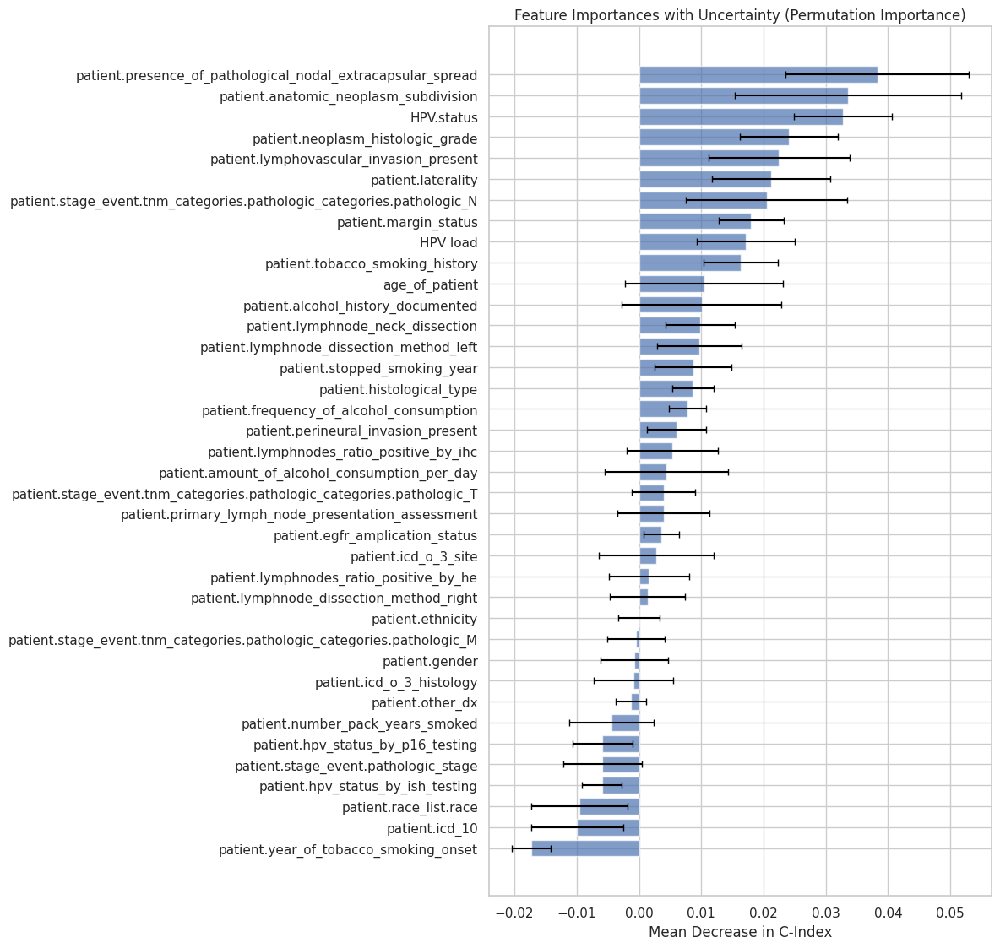

In [63]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes' is your input DataFrame
clinical_data_test = clinical_data_yes.copy()

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

#clinical_data_test['HPV.status'] = clinical_data_test['HPV.status'].replace({'positive': 1, 'negative': 0})

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print(clinical_data_test['age_of_patient'])




# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'

]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print(X.iloc[42])

X_copy = X.copy()
# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(X, event))
X_train_df, X_test_df = X.iloc[train_idx], X.iloc[test_idx]
y_train_event, y_test_event = event[train_idx], event[test_idx]
y_train_time, y_test_time = time[train_idx], time[test_idx]

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

# -------------------------------------------
# Permutation Importance on Test Set with Uncertainty
# -------------------------------------------

print("\nCalculating Permutation Importance on Test Set with Uncertainty...\n")

# Baseline C-Index on Test Set
baseline_c_index = c_index_test
print(f"Baseline C-Index on Test Set: {baseline_c_index:.4f}")

# Combine categorical and numerical columns
all_columns = categorical_columns + numerical_columns

# Print total number of features
print(f"Total number of features to evaluate: {len(all_columns)}")

# Initialize a DataFrame to store feature importances
feature_importances = pd.DataFrame(columns=['Feature', 'Mean Decrease', 'Std Deviation'])

# Number of repeats for permutation
n_repeats = 10  # Adjust as needed for more precision

# Function to compute C-Index after permuting a feature multiple times
def compute_permutation_importance(feature_name, n_repeats=10):
    decreases = []
    for repeat in range(n_repeats):
        # Set a different seed for each repeat for reproducibility
        np.random.seed(seed + repeat)
        
        # Make a copy of the test data
        X_test_cat_perm = X_test_cat.copy()
        X_test_num_perm = X_test_num.copy()
        
        # Permute the feature
        if feature_name in X_test_cat_perm.columns:
            X_test_cat_perm[feature_name] = np.random.permutation(X_test_cat_perm[feature_name].values)
        elif feature_name in X_test_num_perm.columns:
            X_test_num_perm[feature_name] = np.random.permutation(X_test_num_perm[feature_name].values)
        else:
            print(f"Feature '{feature_name}' not found in data.")
            return np.nan, np.nan
        
        # Generate new embeddings
        test_embeddings_perm = get_embeddings(ft_transformer, X_test_cat_perm, X_test_num_perm)
        test_embeddings_perm = np.ascontiguousarray(test_embeddings_perm, dtype=np.float32)
        
        # Predict risk scores with permuted feature
        risk_test_perm = cox_ph.predict(test_embeddings_perm).squeeze()
        
        # Compute new C-Index
        c_index_perm = concordance_index_censored(
            events_test.astype(bool),
            durations_test,
            -risk_test_perm  # Use negative risk for proper ordering
        )[0]
        
        # Compute decrease in C-Index
        decrease_in_c_index = baseline_c_index - c_index_perm
        
        decreases.append(decrease_in_c_index)
    
    # Compute mean and standard deviation
    mean_decrease = np.mean(decreases)
    std_decrease = np.std(decreases)
    
    return mean_decrease, std_decrease

# Loop over all features and compute permutation importance
print("\nStarting permutation importance computation for each feature...\n")
for feature in tqdm(all_columns, desc="Computing permutation importance"):
    mean_decrease, std_decrease = compute_permutation_importance(feature, n_repeats=n_repeats)
    feature_importances = feature_importances.append({
        'Feature': feature,
        'Mean Decrease': mean_decrease,
        'Std Deviation': std_decrease
    }, ignore_index=True)

# Handle any NaN values
feature_importances['Mean Decrease'] = pd.to_numeric(feature_importances['Mean Decrease'], errors='coerce')
feature_importances['Std Deviation'] = pd.to_numeric(feature_importances['Std Deviation'], errors='coerce')
feature_importances.fillna(0, inplace=True)  # Replace NaN with 0

# Reset index and sort features by mean decrease in C-Index
feature_importances.reset_index(drop=True, inplace=True)
feature_importances.sort_values(by='Mean Decrease', ascending=False, inplace=True)

# Print the total number of features in the importance DataFrame
print(f"\nTotal number of features in importance DataFrame: {len(feature_importances)}")

# Display feature importances
print("\nFeature Importances (Permutation Importance with Uncertainty):")
print(feature_importances)

# Visualize the feature importances with error bars
plt.figure(figsize=(12, max(6, 0.3 * len(feature_importances))))
plt.barh(
    feature_importances['Feature'],
    feature_importances['Mean Decrease'],
    xerr=feature_importances['Std Deviation'],
    align='center',
    alpha=0.7,
    ecolor='black',
    capsize=3
)
plt.gca().invert_yaxis()
plt.xlabel('Mean Decrease in C-Index')
plt.title('Feature Importances with Uncertainty (Permutation Importance)')
plt.tight_layout()
plt.show()


now evaluating on cross-validation

0      62.521561
1      59.299110
2      54.636550
3      63.477070
4      38.694045
         ...    
523    45.360712
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 528, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.201689
patient.lymphnodes_ratio_positive_by_he                                   1.059172
age_of_patient                                                            1.429534
patient.tobacco_smoking_history                                           1.307350
patient.year_of_tobacco_smoking_onset                                    -1.070625
patient.number_pack_years_smoked                                          1.269487
patient.stopped_smoking_year                                              1.360174
patient.frequency_of_alcohol_consumption                                 -0.362455
patient.amount_of_alcohol_consumption_per_day                            -0.224637
patient.stage_ev

Train Embeddings Shape: (422, 192)
Test Embeddings Shape: (106, 192)

Starting 5-Fold Cross-Validation with Permutation Importance...

Fold 1
Fold 1 Baseline C-Index: 0.6387

Computing permutation importance for Fold 1...



Fold 1: 100%|██████████| 38/38 [02:21<00:00,  3.71s/it]



Completed permutation importance for Fold 1.

Fold 2
Fold 2 Baseline C-Index: 0.6553

Computing permutation importance for Fold 2...



Fold 2: 100%|██████████| 38/38 [02:19<00:00,  3.67s/it]



Completed permutation importance for Fold 2.

Fold 3
Fold 3 Baseline C-Index: 0.6358

Computing permutation importance for Fold 3...



Fold 3: 100%|██████████| 38/38 [02:18<00:00,  3.65s/it]



Completed permutation importance for Fold 3.

Fold 4
Fold 4 Baseline C-Index: 0.6438

Computing permutation importance for Fold 4...



Fold 4: 100%|██████████| 38/38 [02:24<00:00,  3.81s/it]



Completed permutation importance for Fold 4.

Fold 5
Fold 5 Baseline C-Index: 0.6299

Computing permutation importance for Fold 5...



Fold 5: 100%|██████████| 38/38 [02:19<00:00,  3.66s/it]



Completed permutation importance for Fold 5.


Total number of features in importance DataFrame: 38

Feature Importances (Permutation Importance with Uncertainty based on Cross-Validation):
                                              Feature  Mean Decrease  \
28  patient.presence_of_pathological_nodal_extraca...       0.038993   
33  patient.stage_event.tnm_categories.pathologic_...       0.027283   
5               patient.anatomic_neoplasm_subdivision       0.023674   
23                              patient.margin_status       0.015413   
0                                            HPV load       0.011236   
1                                          HPV.status       0.011159   
16                                 patient.laterality       0.011019   
3                  patient.alcohol_history_documented       0.010813   
15                               patient.icd_o_3_site       0.008297   
2                                      age_of_patient       0.006889   
4       patient.a

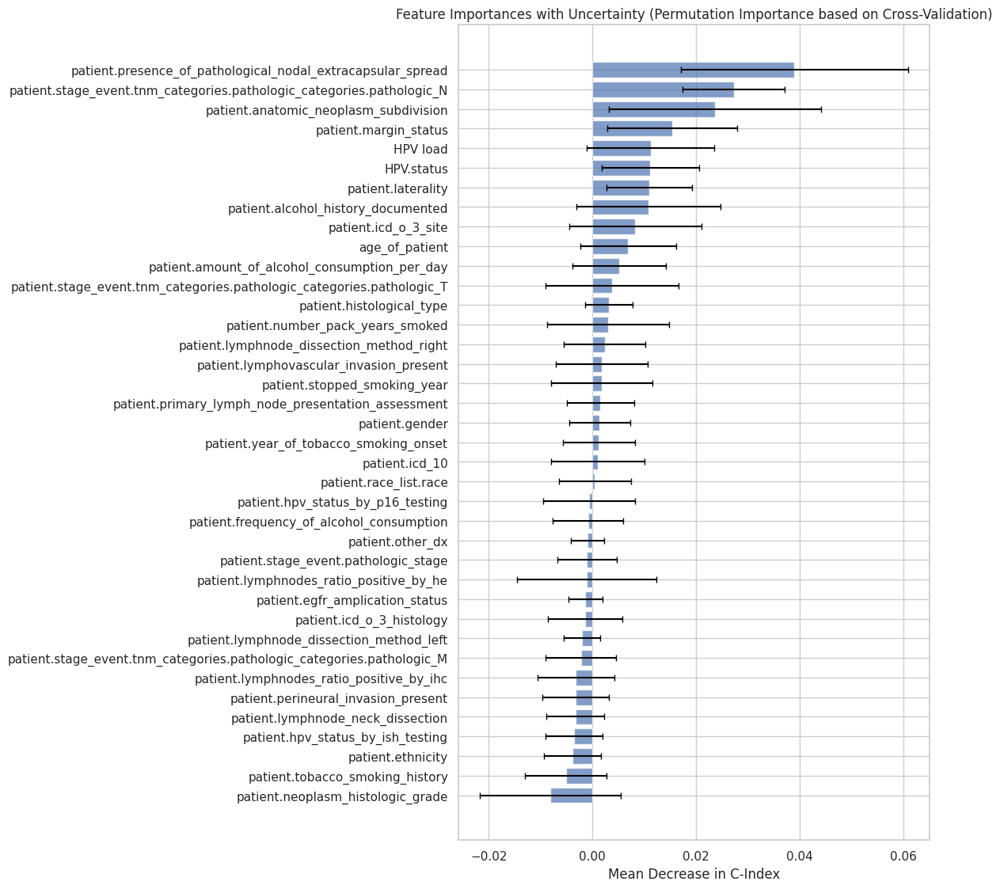

In [64]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes' is your input DataFrame
clinical_data_test = clinical_data_yes.copy()

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

#clinical_data_test['HPV.status'] = clinical_data_test['HPV.status'].replace({'positive': 1, 'negative': 0})

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print(clinical_data_test['age_of_patient'])




# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'

]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print(X.iloc[42])

X_copy = X.copy()

# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(X, event))
X_train_df, X_test_df = X.iloc[train_idx], X.iloc[test_idx]
y_train_event, y_test_event = event[train_idx], event[test_idx]
y_train_time, y_test_time = time[train_idx], time[test_idx]

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

# Combine categorical and numerical columns
all_columns = categorical_columns + numerical_columns

# Initialize a DataFrame to store feature importances
feature_importances = pd.DataFrame(columns=['Feature', 'Mean Decrease', 'Std Deviation'])

# Number of repeats for permutation
n_repeats = 5  # Adjust as needed for more precision

print("\nStarting 5-Fold Cross-Validation with Permutation Importance...\n")

# Loop to collect importance across folds
feature_importance_list = []

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute Baseline C-Index on Validation Set
    baseline_c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} Baseline C-Index: {baseline_c_index:.4f}")
    
    # Prepare validation data for permutation importance
    # Get corresponding X_val_cat and X_val_num
    X_train_cat_cv = X_train_cat.iloc[train_idx_cv]
    X_train_num_cv = X_train_num.iloc[train_idx_cv]
    X_val_cat_cv = X_train_cat.iloc[val_idx_cv]
    X_val_num_cv = X_train_num.iloc[val_idx_cv]
    
    # Initialize a DataFrame to store feature importances for this fold
    fold_feature_importances = pd.DataFrame(columns=['Feature', 'Mean Decrease', 'Std Deviation'])
    
    # Function to compute permutation importance on validation set
    def compute_permutation_importance_cv(feature_name, n_repeats=5):
        decreases = []
        for repeat in range(n_repeats):
            # Set a different seed for each repeat for reproducibility
            np.random.seed(seed + fold * n_repeats + repeat)
            
            # Make a copy of the validation data
            X_val_cat_perm = X_val_cat_cv.copy()
            X_val_num_perm = X_val_num_cv.copy()
            
            # Permute the feature
            if feature_name in X_val_cat_perm.columns:
                X_val_cat_perm[feature_name] = np.random.permutation(X_val_cat_perm[feature_name].values)
            elif feature_name in X_val_num_perm.columns:
                X_val_num_perm[feature_name] = np.random.permutation(X_val_num_perm[feature_name].values)
            else:
                print(f"Feature '{feature_name}' not found in data.")
                return np.nan, np.nan
            
            # Generate new embeddings
            val_embeddings_perm = get_embeddings(ft_transformer, X_val_cat_perm, X_val_num_perm)
            val_embeddings_perm = np.ascontiguousarray(val_embeddings_perm, dtype=np.float32)
            
            # Predict risk scores with permuted feature
            risk_val_perm = cox_ph_cv.predict(val_embeddings_perm).squeeze()
            
            # Compute new C-Index
            c_index_perm = concordance_index_censored(
                y_val_cv_events.astype(bool),
                y_val_cv_durations,
                -risk_val_perm  # Use negative risk for proper ordering
            )[0]
            
            # Compute decrease in C-Index
            decrease_in_c_index = baseline_c_index - c_index_perm
            
            decreases.append(decrease_in_c_index)
        
        # Compute mean and standard deviation
        mean_decrease = np.mean(decreases)
        std_decrease = np.std(decreases)
        
        return mean_decrease, std_decrease
    
    # Loop over all features and compute permutation importance
    print(f"\nComputing permutation importance for Fold {fold + 1}...\n")
    for feature in tqdm(all_columns, desc=f"Fold {fold + 1}"):
        mean_decrease, std_decrease = compute_permutation_importance_cv(feature, n_repeats=n_repeats)
        fold_feature_importances = fold_feature_importances.append({
            'Feature': feature,
            'Mean Decrease': mean_decrease,
            'Std Deviation': std_decrease
        }, ignore_index=True)
    
    # Append fold results to the list
    feature_importance_list.append(fold_feature_importances)
    
    print(f"\nCompleted permutation importance for Fold {fold + 1}.\n")

# Aggregate feature importances across folds
all_importances = pd.concat(feature_importance_list)
grouped_importances = all_importances.groupby('Feature').agg({
    'Mean Decrease': 'mean',
    'Std Deviation': 'mean'  # You might want to compute overall std differently
}).reset_index()

# Handle any NaN values
grouped_importances['Mean Decrease'] = pd.to_numeric(grouped_importances['Mean Decrease'], errors='coerce')
grouped_importances['Std Deviation'] = pd.to_numeric(grouped_importances['Std Deviation'], errors='coerce')
grouped_importances.fillna(0, inplace=True)  # Replace NaN with 0

# Reset index and sort features by mean decrease in C-Index
grouped_importances.sort_values(by='Mean Decrease', ascending=False, inplace=True)

# Print the total number of features in the importance DataFrame
print(f"\nTotal number of features in importance DataFrame: {len(grouped_importances)}")

# Display feature importances
print("\nFeature Importances (Permutation Importance with Uncertainty based on Cross-Validation):")
print(grouped_importances)

# Visualize the feature importances with error bars
plt.figure(figsize=(12, max(6, 0.3 * len(grouped_importances))))
plt.barh(
    grouped_importances['Feature'],
    grouped_importances['Mean Decrease'],
    xerr=grouped_importances['Std Deviation'],
    align='center',
    alpha=0.7,
    ecolor='black',
    capsize=3
)
plt.gca().invert_yaxis()
plt.xlabel('Mean Decrease in C-Index')
plt.title('Feature Importances with Uncertainty (Permutation Importance based on Cross-Validation)')
plt.tight_layout()
plt.show()


Leave one out strategy

0      62.521561
1      59.299110
2      54.636550
3      63.477070
4      38.694045
         ...    
523    45.360712
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 528, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.201689
patient.lymphnodes_ratio_positive_by_he                                   1.059172
age_of_patient                                                            1.429534
patient.tobacco_smoking_history                                           1.307350
patient.year_of_tobacco_smoking_onset                                    -1.070625
patient.number_pack_years_smoked                                          1.269487
patient.stopped_smoking_year                                              1.360174
patient.frequency_of_alcohol_consumption                                 -0.362455
patient.amount_of_alcohol_consumption_per_day                            -0.224637
patient.stage_ev

Train Embeddings Shape: (422, 192)
Test Embeddings Shape: (106, 192)

Starting 5-Fold Cross-Validation...

Fold 1
Fold 1 C-Index: 0.6269

Fold 2
Fold 2 C-Index: 0.6792

Fold 3
Fold 3 C-Index: 0.6051

Fold 4
Fold 4 C-Index: 0.6869

Fold 5
Fold 5 C-Index: 0.6051

Cross-Validation C-Index: 0.6406 ± 0.0356
95% Confidence Interval: [0.6051, 0.6861]

Training Final CoxPH Model on Entire Training Set...

Final CoxPH Model Trained Successfully.

Evaluating on Test Set...

Test C-Index: 0.6963

Starting Bootstrapping for Test C-Index Uncertainty...

Bootstrap 100/1000 completed.
Bootstrap 200/1000 completed.
Bootstrap 300/1000 completed.
Bootstrap 400/1000 completed.
Bootstrap 500/1000 completed.
Bootstrap 600/1000 completed.
Bootstrap 700/1000 completed.
Bootstrap 800/1000 completed.
Bootstrap 900/1000 completed.
Bootstrap 1000/1000 completed.

Test C-Index with Bootstrapping: 0.6959 ± 0.0467
95% Confidence Interval: [0.6067, 0.7855]

Starting Leave-One-Out Feature Importance Analysis...

Base

Computing LOO importance:   0%|          | 0/38 [00:00<?, ?it/s]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:   3%|▎         | 1/38 [02:22<1:27:40, 142.17s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:   5%|▌         | 2/38 [04:46<1:26:01, 143.37s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:   8%|▊         | 3/38 [07:06<1:22:49, 141.97s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  11%|█         | 4/38 [09:28<1:20:27, 141.98s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  13%|█▎        | 5/38 [11:55<1:19:07, 143.86s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  16%|█▌        | 6/38 [14:20<1:16:48, 144.01s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  18%|█▊        | 7/38 [16:36<1:13:11, 141.65s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  21%|██        | 8/38 [18:59<1:11:01, 142.05s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  24%|██▎       | 9/38 [21:26<1:09:18, 143.38s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  26%|██▋       | 10/38 [23:53<1:07:25, 144.48s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  29%|██▉       | 11/38 [26:17<1:04:59, 144.44s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  32%|███▏      | 12/38 [28:39<1:02:14, 143.64s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  34%|███▍      | 13/38 [30:57<59:13, 142.12s/it]  

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  37%|███▋      | 14/38 [33:16<56:26, 141.12s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  39%|███▉      | 15/38 [35:31<53:24, 139.33s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  42%|████▏     | 16/38 [38:00<52:04, 142.03s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  45%|████▍     | 17/38 [39:53<46:41, 133.42s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  47%|████▋     | 18/38 [41:57<43:32, 130.61s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  50%|█████     | 19/38 [44:13<41:51, 132.21s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  53%|█████▎    | 20/38 [46:28<39:54, 133.03s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  55%|█████▌    | 21/38 [48:47<38:09, 134.68s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  58%|█████▊    | 22/38 [51:08<36:25, 136.61s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  61%|██████    | 23/38 [53:35<34:58, 139.89s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  63%|██████▎   | 24/38 [55:57<32:46, 140.48s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  66%|██████▌   | 25/38 [58:16<30:21, 140.13s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  68%|██████▊   | 26/38 [1:00:42<28:20, 141.74s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  71%|███████   | 27/38 [1:03:07<26:10, 142.78s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  74%|███████▎  | 28/38 [1:05:29<23:46, 142.67s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  76%|███████▋  | 29/38 [1:07:51<21:19, 142.22s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  79%|███████▉  | 30/38 [1:10:12<18:56, 142.04s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  82%|████████▏ | 31/38 [1:12:36<16:38, 142.60s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  84%|████████▍ | 32/38 [1:14:59<14:16, 142.78s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  87%|████████▋ | 33/38 [1:17:24<11:57, 143.48s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  89%|████████▉ | 34/38 [1:20:05<09:54, 148.61s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  92%|█████████▏| 35/38 [1:22:24<07:17, 145.76s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  95%|█████████▍| 36/38 [1:24:45<04:48, 144.21s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance:  97%|█████████▋| 37/38 [1:27:33<02:31, 151.47s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Computing LOO importance: 100%|██████████| 38/38 [1:29:58<00:00, 142.07s/it]



Total number of features in LOO importance DataFrame: 38

Feature Importances (Leave-One-Out Importance with Uncertainty):
                                              Feature  Mean Decrease  \
13  patient.presence_of_pathological_nodal_extraca...       0.106830   
12                              patient.margin_status       0.084472   
17                 patient.alcohol_history_documented       0.082638   
34  patient.stage_event.tnm_categories.pathologic_...       0.081884   
6               patient.anatomic_neoplasm_subdivision       0.079403   
15                patient.perineural_invasion_present       0.076707   
32      patient.amount_of_alcohol_consumption_per_day       0.075377   
0                           patient.histological_type       0.075162   
23                                         HPV.status       0.075054   
30                       patient.stopped_smoking_year       0.074299   
24           patient.lymphnodes_ratio_positive_by_ihc       0.073221   
16          

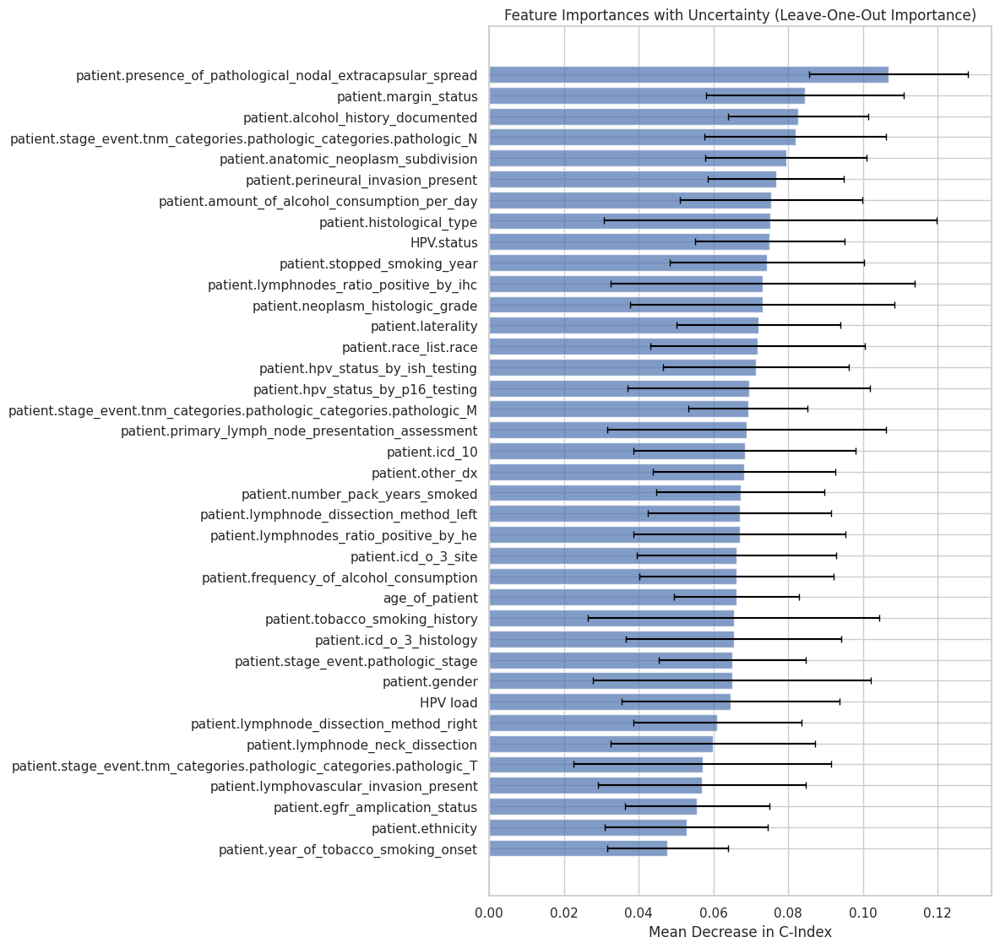

In [65]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes' is your input DataFrame
clinical_data_test = clinical_data_yes.copy()

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

#clinical_data_test['HPV.status'] = clinical_data_test['HPV.status'].replace({'positive': 1, 'negative': 0})

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print(clinical_data_test['age_of_patient'])




# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'

]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print(X.iloc[42])

X_copy = X.copy()

# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(X, event))
X_train_df, X_test_df = X.iloc[train_idx], X.iloc[test_idx]
y_train_event, y_test_event = event[train_idx], event[test_idx]
y_train_time, y_test_time = time[train_idx], time[test_idx]

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

# -------------------------------------------
# Leave-One-Out Feature Importance Analysis
# -------------------------------------------

print("\nStarting Leave-One-Out Feature Importance Analysis...\n")

# Baseline C-Index on Test Set
baseline_c_index = c_index_test
print(f"Baseline Test C-Index: {baseline_c_index:.4f}")

# Combine categorical and numerical columns
all_columns = categorical_columns + numerical_columns

# Initialize a DataFrame to store feature importances
loo_feature_importances = pd.DataFrame(columns=['Feature', 'C-Index Mean', 'C-Index Std'])

# Number of bootstraps for uncertainty estimation
n_bootstraps = 10  # Adjust as needed; more bootstraps increase computation time

# Function to compute C-Index after leaving one feature out
def compute_loo_importance(feature_name):
    c_indices = []
    for i in range(n_bootstraps):
        # Set a different seed for each repeat for reproducibility
        np.random.seed(seed + i)
        
        # Make copies of training data
        X_train_cat_loo = X_train_cat.copy()
        X_train_num_loo = X_train_num.copy()
        
        X_test_cat_loo = X_test_cat.copy()
        X_test_num_loo = X_test_num.copy()
        
        # Drop the feature
        if feature_name in X_train_cat_loo.columns:
            X_train_cat_loo = X_train_cat_loo.drop(columns=[feature_name])
            X_test_cat_loo = X_test_cat_loo.drop(columns=[feature_name])
        elif feature_name in X_train_num_loo.columns:
            X_train_num_loo = X_train_num_loo.drop(columns=[feature_name])
            X_test_num_loo = X_test_num_loo.drop(columns=[feature_name])
        else:
            print(f"Feature '{feature_name}' not found in data.")
            return np.nan, np.nan
        
        # Get number of categories for updated categorical features
        categories_loo = [int(X_train_cat_loo[col].max() + 1) for col in X_train_cat_loo.columns]
        
        # Reinitialize FTTransformer with updated input dimensions
        ft_transformer_loo = FTTransformer(
            categories=categories_loo,
            num_continuous=X_train_num_loo.shape[1],
            dim=192,
            depth=6,
            heads=8,
            attn_dropout=0.1,
            ff_dropout=0.1
        ).to(device)
        ft_transformer_loo.eval()
        
        # Generate embeddings
        train_embeddings_loo = get_embeddings(ft_transformer_loo, X_train_cat_loo, X_train_num_loo)
        test_embeddings_loo = get_embeddings(ft_transformer_loo, X_test_cat_loo, X_test_num_loo)
        
        # Ensure embeddings are contiguous
        train_embeddings_loo = np.ascontiguousarray(train_embeddings_loo, dtype=np.float32)
        test_embeddings_loo = np.ascontiguousarray(test_embeddings_loo, dtype=np.float32)
        
        # Reinitialize the network
        net_loo = tt.practical.MLPVanilla(
            in_features=train_embeddings_loo.shape[1],
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )
        
        optimizer_loo = tt.optim.Adam(lr=1e-3)
        cox_ph_loo = CoxPH(net_loo, optimizer_loo)
        
        # Fit the model
        cox_ph_loo.fit(
            train_embeddings_loo,
            (events_train, durations_train),
            batch_size=64,
            epochs=100,
            verbose=False
        )
        
        # Predict risk scores on test set
        risk_test_loo = cox_ph_loo.predict(test_embeddings_loo).squeeze()
        
        # Compute C-Index on Test Set
        c_index_loo = concordance_index_censored(
            events_test.astype(bool),
            durations_test,
            -risk_test_loo  # Use negative risk for proper ordering
        )[0]
        
        c_indices.append(c_index_loo)
    
    # Compute mean and standard deviation
    c_index_mean = np.mean(c_indices)
    c_index_std = np.std(c_indices)
    
    return c_index_mean, c_index_std

# Loop over all features and compute leave-one-out importance
print("\nComputing Leave-One-Out Importance for each feature...\n")
for feature in tqdm(all_columns, desc="Computing LOO importance"):
    c_index_mean, c_index_std = compute_loo_importance(feature)
    loo_feature_importances = loo_feature_importances.append({
        'Feature': feature,
        'C-Index Mean': c_index_mean,
        'C-Index Std': c_index_std
    }, ignore_index=True)

# Compute the change in C-Index compared to the baseline
loo_feature_importances['Mean Decrease'] = baseline_c_index - loo_feature_importances['C-Index Mean']

# Handle any NaN values
loo_feature_importances['Mean Decrease'] = pd.to_numeric(loo_feature_importances['Mean Decrease'], errors='coerce')
loo_feature_importances['C-Index Std'] = pd.to_numeric(loo_feature_importances['C-Index Std'], errors='coerce')
loo_feature_importances.fillna(0, inplace=True)  # Replace NaN with 0

# Reset index and sort features by mean decrease in C-Index
loo_feature_importances.reset_index(drop=True, inplace=True)
loo_feature_importances.sort_values(by='Mean Decrease', ascending=False, inplace=True)

# Print the total number of features in the importance DataFrame
print(f"\nTotal number of features in LOO importance DataFrame: {len(loo_feature_importances)}")

# Display feature importances
print("\nFeature Importances (Leave-One-Out Importance with Uncertainty):")
print(loo_feature_importances[['Feature', 'Mean Decrease', 'C-Index Std']])

# Visualize the feature importances with error bars
plt.figure(figsize=(12, max(6, 0.3 * len(loo_feature_importances))))
plt.barh(
    loo_feature_importances['Feature'],
    loo_feature_importances['Mean Decrease'],
    xerr=loo_feature_importances['C-Index Std'],
    align='center',
    alpha=0.7,
    ecolor='black',
    capsize=3
)
plt.gca().invert_yaxis()
plt.xlabel('Mean Decrease in C-Index')
plt.title('Feature Importances with Uncertainty (Leave-One-Out Importance)')
plt.tight_layout()
plt.show()


LOO on cross-validation:

0      62.521561
1      59.299110
2      54.636550
3      63.477070
4      38.694045
         ...    
523    45.360712
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 528, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.201689
patient.lymphnodes_ratio_positive_by_he                                   1.059172
age_of_patient                                                            1.429534
patient.tobacco_smoking_history                                           1.307350
patient.year_of_tobacco_smoking_onset                                    -1.070625
patient.number_pack_years_smoked                                          1.269487
patient.stopped_smoking_year                                              1.360174
patient.frequency_of_alcohol_consumption                                 -0.362455
patient.amount_of_alcohol_consumption_per_day                            -0.224637
patient.stage_ev

Train Embeddings Shape: (422, 192)
Test Embeddings Shape: (106, 192)

Starting 5-Fold Cross-Validation...

Fold 1
Fold 1 C-Index: 0.6387

Fold 2
Fold 2 C-Index: 0.6642

Fold 3
Fold 3 C-Index: 0.6181

Fold 4
Fold 4 C-Index: 0.6559

Fold 5
Fold 5 C-Index: 0.5972

Cross-Validation C-Index: 0.6348 ± 0.0246
95% Confidence Interval: [0.5993, 0.6633]

Training Final CoxPH Model on Entire Training Set...

Final CoxPH Model Trained Successfully.

Evaluating on Test Set...

Test C-Index: 0.6891

Starting Bootstrapping for Test C-Index Uncertainty...

Bootstrap 100/1000 completed.
Bootstrap 200/1000 completed.
Bootstrap 300/1000 completed.
Bootstrap 400/1000 completed.
Bootstrap 500/1000 completed.
Bootstrap 600/1000 completed.
Bootstrap 700/1000 completed.
Bootstrap 800/1000 completed.
Bootstrap 900/1000 completed.
Bootstrap 1000/1000 completed.

Test C-Index with Bootstrapping: 0.6890 ± 0.0478
95% Confidence Interval: [0.5954, 0.7805]

Starting Leave-One-Out Feature Importance Analysis based on

Fold 1 LOO:   0%|          | 0/38 [00:00<?, ?it/s]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:   3%|▎         | 1/38 [00:55<34:13, 55.49s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:   5%|▌         | 2/38 [01:49<32:43, 54.56s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:   8%|▊         | 3/38 [02:55<34:47, 59.65s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  11%|█         | 4/38 [03:50<32:54, 58.09s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  13%|█▎        | 5/38 [04:40<30:19, 55.13s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  16%|█▌        | 6/38 [05:28<28:02, 52.57s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  18%|█▊        | 7/38 [06:15<26:17, 50.88s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  21%|██        | 8/38 [07:05<25:19, 50.64s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  24%|██▎       | 9/38 [08:03<25:34, 52.91s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  26%|██▋       | 10/38 [08:59<25:09, 53.92s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  29%|██▉       | 11/38 [09:48<23:31, 52.29s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  32%|███▏      | 12/38 [10:38<22:19, 51.53s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  34%|███▍      | 13/38 [11:30<21:34, 51.76s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  37%|███▋      | 14/38 [12:26<21:14, 53.10s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  39%|███▉      | 15/38 [13:16<19:55, 51.96s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  42%|████▏     | 16/38 [14:02<18:25, 50.26s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  45%|████▍     | 17/38 [14:50<17:22, 49.64s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  47%|████▋     | 18/38 [15:30<15:33, 46.66s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  50%|█████     | 19/38 [16:09<14:03, 44.41s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  53%|█████▎    | 20/38 [16:54<13:21, 44.53s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  55%|█████▌    | 21/38 [17:38<12:36, 44.52s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  58%|█████▊    | 22/38 [18:24<11:58, 44.90s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  61%|██████    | 23/38 [19:10<11:16, 45.09s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  63%|██████▎   | 24/38 [19:59<10:50, 46.44s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  66%|██████▌   | 25/38 [20:46<10:04, 46.51s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  68%|██████▊   | 26/38 [21:33<09:20, 46.72s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  71%|███████   | 27/38 [22:20<08:35, 46.90s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  74%|███████▎  | 28/38 [23:09<07:55, 47.50s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  76%|███████▋  | 29/38 [23:55<07:01, 46.84s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  79%|███████▉  | 30/38 [24:42<06:16, 47.10s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  82%|████████▏ | 31/38 [25:30<05:31, 47.33s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  84%|████████▍ | 32/38 [26:18<04:44, 47.45s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  87%|████████▋ | 33/38 [27:05<03:57, 47.43s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  89%|████████▉ | 34/38 [27:56<03:13, 48.27s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  92%|█████████▏| 35/38 [28:45<02:25, 48.54s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  95%|█████████▍| 36/38 [29:34<01:37, 48.83s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO:  97%|█████████▋| 37/38 [30:23<00:48, 48.88s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 1 LOO: 100%|██████████| 38/38 [31:15<00:00, 49.36s/it]



Completed Leave-One-Out importance for Fold 1.


Processing Fold 2/5
Baseline C-Index for Fold 2: 0.6655

Computing Leave-One-Out importance for Fold 2...



Fold 2 LOO:   0%|          | 0/38 [00:00<?, ?it/s]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:   3%|▎         | 1/38 [00:47<28:59, 47.01s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:   5%|▌         | 2/38 [01:34<28:24, 47.35s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:   8%|▊         | 3/38 [02:23<27:57, 47.92s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  11%|█         | 4/38 [03:20<29:15, 51.63s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  13%|█▎        | 5/38 [04:19<29:47, 54.18s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  16%|█▌        | 6/38 [05:16<29:25, 55.17s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  18%|█▊        | 7/38 [06:14<28:59, 56.10s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  21%|██        | 8/38 [07:18<29:19, 58.64s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  24%|██▎       | 9/38 [08:16<28:15, 58.47s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  26%|██▋       | 10/38 [09:04<25:49, 55.33s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  29%|██▉       | 11/38 [09:55<24:16, 53.95s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  32%|███▏      | 12/38 [10:54<24:00, 55.42s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  34%|███▍      | 13/38 [11:58<24:10, 58.02s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  37%|███▋      | 14/38 [12:54<23:00, 57.50s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  39%|███▉      | 15/38 [13:51<21:56, 57.25s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  42%|████▏     | 16/38 [14:50<21:11, 57.82s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  45%|████▍     | 17/38 [15:47<20:09, 57.60s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  47%|████▋     | 18/38 [16:43<19:01, 57.06s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  50%|█████     | 19/38 [17:40<18:05, 57.13s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  53%|█████▎    | 20/38 [18:38<17:12, 57.33s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  55%|█████▌    | 21/38 [19:38<16:27, 58.07s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  58%|█████▊    | 22/38 [20:37<15:36, 58.53s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  61%|██████    | 23/38 [21:39<14:50, 59.36s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  63%|██████▎   | 24/38 [22:39<13:55, 59.67s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  66%|██████▌   | 25/38 [23:39<12:57, 59.80s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  68%|██████▊   | 26/38 [24:39<11:57, 59.81s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  71%|███████   | 27/38 [25:41<11:04, 60.37s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  74%|███████▎  | 28/38 [26:40<09:59, 59.96s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  76%|███████▋  | 29/38 [27:40<08:59, 59.97s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  79%|███████▉  | 30/38 [28:40<08:01, 60.13s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  82%|████████▏ | 31/38 [29:39<06:58, 59.85s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  84%|████████▍ | 32/38 [30:43<06:06, 61.09s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  87%|████████▋ | 33/38 [31:42<05:01, 60.31s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  89%|████████▉ | 34/38 [32:48<04:08, 62.06s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  92%|█████████▏| 35/38 [33:50<03:05, 61.94s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  95%|█████████▍| 36/38 [34:49<02:02, 61.24s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO:  97%|█████████▋| 37/38 [35:49<01:00, 60.74s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 2 LOO: 100%|██████████| 38/38 [36:47<00:00, 58.08s/it]



Completed Leave-One-Out importance for Fold 2.


Processing Fold 3/5
Baseline C-Index for Fold 3: 0.6860

Computing Leave-One-Out importance for Fold 3...



Fold 3 LOO:   0%|          | 0/38 [00:00<?, ?it/s]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:   3%|▎         | 1/38 [00:57<35:20, 57.31s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:   5%|▌         | 2/38 [01:57<35:14, 58.73s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:   8%|▊         | 3/38 [02:55<34:16, 58.76s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  11%|█         | 4/38 [03:53<32:58, 58.18s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  13%|█▎        | 5/38 [04:50<31:51, 57.94s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  16%|█▌        | 6/38 [05:48<30:54, 57.95s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  18%|█▊        | 7/38 [06:49<30:25, 58.89s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  21%|██        | 8/38 [07:49<29:40, 59.34s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  24%|██▎       | 9/38 [08:49<28:43, 59.42s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  26%|██▋       | 10/38 [09:48<27:40, 59.29s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  29%|██▉       | 11/38 [10:46<26:35, 59.08s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  32%|███▏      | 12/38 [11:45<25:33, 59.00s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  34%|███▍      | 13/38 [12:44<24:34, 58.96s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  37%|███▋      | 14/38 [13:43<23:36, 59.03s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  39%|███▉      | 15/38 [15:04<25:09, 65.63s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  42%|████▏     | 16/38 [16:02<23:14, 63.39s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  45%|████▍     | 17/38 [17:01<21:42, 62.01s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  47%|████▋     | 18/38 [18:01<20:23, 61.20s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  50%|█████     | 19/38 [19:03<19:28, 61.53s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  53%|█████▎    | 20/38 [20:02<18:14, 60.80s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  55%|█████▌    | 21/38 [21:01<17:02, 60.17s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  58%|█████▊    | 22/38 [21:59<15:52, 59.52s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  61%|██████    | 23/38 [22:59<14:58, 59.90s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  63%|██████▎   | 24/38 [24:01<14:03, 60.26s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  66%|██████▌   | 25/38 [25:02<13:07, 60.57s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  68%|██████▊   | 26/38 [26:03<12:08, 60.70s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  71%|███████   | 27/38 [27:23<12:11, 66.49s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  74%|███████▎  | 28/38 [28:44<11:48, 70.82s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  76%|███████▋  | 29/38 [29:48<10:20, 68.89s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  79%|███████▉  | 30/38 [30:51<08:57, 67.15s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  82%|████████▏ | 31/38 [31:50<07:31, 64.56s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  84%|████████▍ | 32/38 [32:49<06:18, 63.04s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  87%|████████▋ | 33/38 [33:51<05:12, 62.52s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  89%|████████▉ | 34/38 [34:58<04:15, 63.86s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  92%|█████████▏| 35/38 [36:03<03:12, 64.23s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  95%|█████████▍| 36/38 [37:04<02:06, 63.47s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO:  97%|█████████▋| 37/38 [38:11<01:04, 64.38s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 3 LOO: 100%|██████████| 38/38 [39:11<00:00, 61.88s/it]



Completed Leave-One-Out importance for Fold 3.


Processing Fold 4/5
Baseline C-Index for Fold 4: 0.6236

Computing Leave-One-Out importance for Fold 4...



Fold 4 LOO:   0%|          | 0/38 [00:00<?, ?it/s]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:   3%|▎         | 1/38 [01:07<41:23, 67.11s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:   5%|▌         | 2/38 [02:10<39:04, 65.12s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:   8%|▊         | 3/38 [03:14<37:28, 64.23s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  11%|█         | 4/38 [04:14<35:35, 62.81s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  13%|█▎        | 5/38 [05:12<33:30, 60.91s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  16%|█▌        | 6/38 [06:09<31:44, 59.52s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  18%|█▊        | 7/38 [07:07<30:33, 59.15s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  21%|██        | 8/38 [08:04<29:10, 58.34s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  24%|██▎       | 9/38 [09:00<27:54, 57.73s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  26%|██▋       | 10/38 [09:58<27:00, 57.88s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  29%|██▉       | 11/38 [11:01<26:43, 59.39s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  32%|███▏      | 12/38 [12:28<29:24, 67.85s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  34%|███▍      | 13/38 [13:25<26:51, 64.47s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  37%|███▋      | 14/38 [14:22<24:53, 62.21s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  39%|███▉      | 15/38 [15:19<23:13, 60.58s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  42%|████▏     | 16/38 [16:21<22:21, 60.98s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  45%|████▍     | 17/38 [17:31<22:22, 63.94s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  47%|████▋     | 18/38 [18:31<20:52, 62.63s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  50%|█████     | 19/38 [19:30<19:27, 61.47s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  53%|█████▎    | 20/38 [20:31<18:27, 61.51s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  55%|█████▌    | 21/38 [21:35<17:35, 62.06s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  58%|█████▊    | 22/38 [22:35<16:23, 61.46s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  61%|██████    | 23/38 [23:34<15:13, 60.93s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  63%|██████▎   | 24/38 [24:36<14:15, 61.07s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  66%|██████▌   | 25/38 [25:36<13:10, 60.78s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  68%|██████▊   | 26/38 [26:36<12:05, 60.49s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  71%|███████   | 27/38 [27:35<11:01, 60.10s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  74%|███████▎  | 28/38 [28:59<11:13, 67.34s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  76%|███████▋  | 29/38 [31:10<12:57, 86.38s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  79%|███████▉  | 30/38 [31:53<09:47, 73.42s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  82%|████████▏ | 31/38 [32:30<07:17, 62.46s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  84%|████████▍ | 32/38 [33:07<05:28, 54.68s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  87%|████████▋ | 33/38 [33:46<04:10, 50.06s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  89%|████████▉ | 34/38 [34:27<03:10, 47.55s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  92%|█████████▏| 35/38 [35:12<02:19, 46.64s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  95%|█████████▍| 36/38 [35:54<01:30, 45.30s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO:  97%|█████████▋| 37/38 [36:41<00:45, 45.66s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 4 LOO: 100%|██████████| 38/38 [37:29<00:00, 59.20s/it]



Completed Leave-One-Out importance for Fold 4.


Processing Fold 5/5
Baseline C-Index for Fold 5: 0.6192

Computing Leave-One-Out importance for Fold 5...



Fold 5 LOO:   0%|          | 0/38 [00:00<?, ?it/s]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:   3%|▎         | 1/38 [00:48<29:46, 48.29s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:   5%|▌         | 2/38 [01:34<28:12, 47.00s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:   8%|▊         | 3/38 [02:19<27:02, 46.36s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  11%|█         | 4/38 [03:03<25:43, 45.38s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  13%|█▎        | 5/38 [03:43<23:47, 43.27s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  16%|█▌        | 6/38 [04:25<22:57, 43.04s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  18%|█▊        | 7/38 [05:05<21:35, 41.79s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  21%|██        | 8/38 [05:50<21:25, 42.84s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  24%|██▎       | 9/38 [06:29<20:12, 41.82s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  26%|██▋       | 10/38 [07:09<19:12, 41.17s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  29%|██▉       | 11/38 [07:51<18:38, 41.42s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  32%|███▏      | 12/38 [08:39<18:45, 43.27s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  34%|███▍      | 13/38 [09:25<18:24, 44.16s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  37%|███▋      | 14/38 [10:11<17:57, 44.89s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  39%|███▉      | 15/38 [10:58<17:23, 45.35s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  42%|████▏     | 16/38 [11:45<16:51, 45.97s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  45%|████▍     | 17/38 [12:31<16:02, 45.83s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  47%|████▋     | 18/38 [13:19<15:30, 46.51s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  50%|█████     | 19/38 [14:08<14:58, 47.28s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  53%|█████▎    | 20/38 [14:55<14:12, 47.35s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  55%|█████▌    | 21/38 [15:43<13:25, 47.40s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  58%|█████▊    | 22/38 [16:37<13:12, 49.53s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  61%|██████    | 23/38 [17:33<12:52, 51.47s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  63%|██████▎   | 24/38 [18:32<12:28, 53.48s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  66%|██████▌   | 25/38 [19:27<11:43, 54.12s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  68%|██████▊   | 26/38 [20:23<10:55, 54.66s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  71%|███████   | 27/38 [21:20<10:08, 55.33s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  74%|███████▎  | 28/38 [22:17<09:17, 55.80s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  76%|███████▋  | 29/38 [23:13<08:22, 55.86s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  79%|███████▉  | 30/38 [24:12<07:34, 56.83s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  82%|████████▏ | 31/38 [25:11<06:41, 57.42s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  84%|████████▍ | 32/38 [26:10<05:48, 58.05s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  87%|████████▋ | 33/38 [27:09<04:51, 58.21s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  89%|████████▉ | 34/38 [28:06<03:51, 57.79s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  92%|█████████▏| 35/38 [29:04<02:53, 57.97s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  95%|█████████▍| 36/38 [30:04<01:56, 58.49s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO:  97%|█████████▋| 37/38 [31:03<00:58, 58.83s/it]

FTTransformer
FTTransformer
FTTransformer
FTTransformer
FTTransformer


Fold 5 LOO: 100%|██████████| 38/38 [32:01<00:00, 50.57s/it]



Completed Leave-One-Out importance for Fold 5.


Total number of features in LOO importance DataFrame: 38

Feature Importances (Leave-One-Out Importance based on Cross-Validation):
                                              Feature  Mean Decrease  \
33  patient.stage_event.tnm_categories.pathologic_...       0.029229   
21           patient.lymphnodes_ratio_positive_by_ihc       0.028705   
28  patient.presence_of_pathological_nodal_extraca...       0.028404   
3                  patient.alcohol_history_documented       0.027526   
23                              patient.margin_status       0.024423   
1                                          HPV.status       0.023956   
6                     patient.egfr_amplication_status       0.020959   
37              patient.year_of_tobacco_smoking_onset       0.020124   
12                  patient.hpv_status_by_p16_testing       0.019103   
27                patient.perineural_invasion_present       0.018436   
29  patient.primary_lymph_

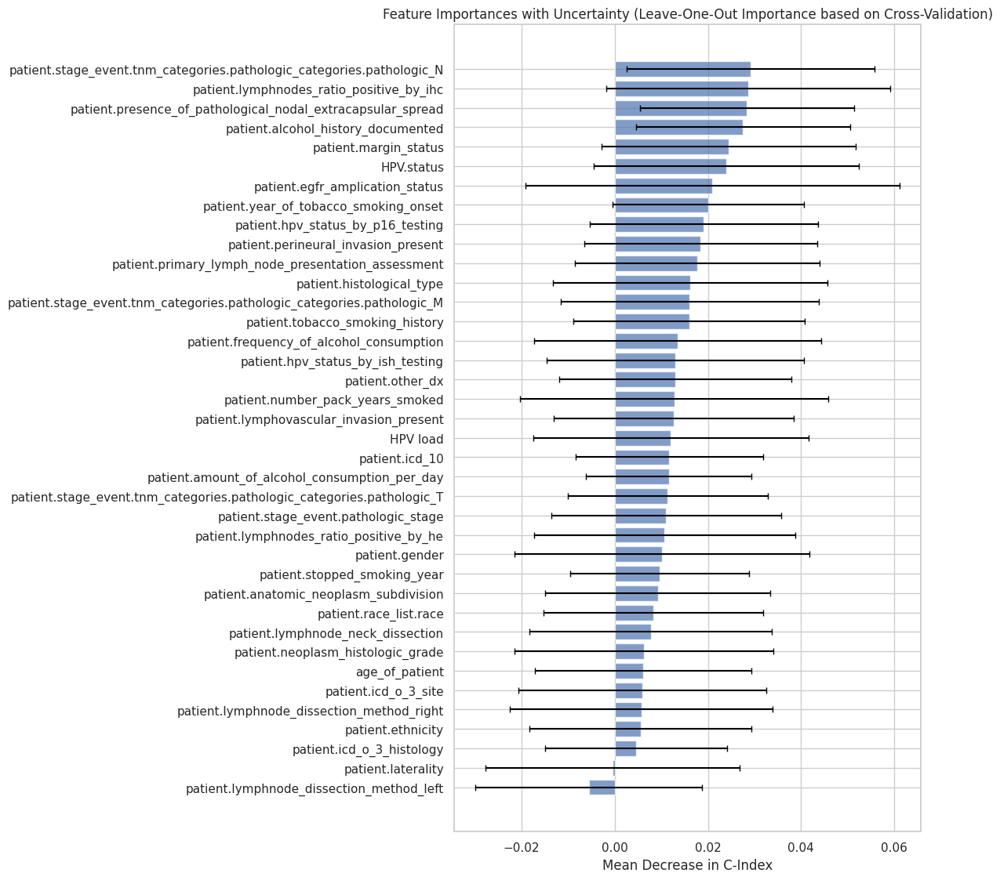

In [66]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes' is your input DataFrame
clinical_data_test = clinical_data_yes.copy()

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

#clinical_data_test['HPV.status'] = clinical_data_test['HPV.status'].replace({'positive': 1, 'negative': 0})

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print(clinical_data_test['age_of_patient'])




# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'

]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print(X.iloc[42])

X_copy = X.copy()
# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(X, event))
X_train_df, X_test_df = X.iloc[train_idx], X.iloc[test_idx]
y_train_event, y_test_event = event[train_idx], event[test_idx]
y_train_time, y_test_time = time[train_idx], time[test_idx]

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

# -------------------------------------------
# Leave-One-Out Feature Importance Analysis based on Cross-Validation
# -------------------------------------------

print("\nStarting Leave-One-Out Feature Importance Analysis based on Cross-Validation...\n")

# Combine categorical and numerical columns
all_columns = categorical_columns + numerical_columns

# Initialize a DataFrame to store feature importances
loo_feature_importances = pd.DataFrame(columns=['Feature', 'Mean Decrease', 'Std Deviation'])

# Number of folds and repeats
n_splits = 5
n_repeats = 5  # Adjust as needed for uncertainty estimation

# Initialize KFold Cross-Validation
kf = KFold(n_splits=n_splits, shuffle=True, random_state=seed)

# List to collect feature importance dataframes from each fold
feature_importance_list = []

# Loop over each fold
for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(X_train_df)):
    print(f"\nProcessing Fold {fold + 1}/{n_splits}")
    
    # Split data into training and validation sets for this fold
    X_train_cv = X_train_df.iloc[train_idx_cv]
    y_train_cv_time = y_train_time[train_idx_cv]
    y_train_cv_event = y_train_event[train_idx_cv]
    
    X_val_cv = X_train_df.iloc[val_idx_cv]
    y_val_cv_time = y_train_time[val_idx_cv]
    y_val_cv_event = y_train_event[val_idx_cv]
    
    # Prepare data for FTTransformer
    X_train_cat_cv, X_train_num_cv = prepare_data(X_train_cv, categorical_columns, numerical_columns)
    X_val_cat_cv, X_val_num_cv = prepare_data(X_val_cv, categorical_columns, numerical_columns)
    
    # Get embeddings
    train_embeddings_cv = get_embeddings(ft_transformer, X_train_cat_cv, X_train_num_cv)
    val_embeddings_cv = get_embeddings(ft_transformer, X_val_cat_cv, X_val_num_cv)
    
    # Prepare survival data
    durations_train_cv = y_train_cv_time.astype(np.float32)
    events_train_cv = y_train_cv_event.astype(np.int64)
    durations_val_cv = y_val_cv_time.astype(np.float32)
    events_val_cv = y_val_cv_event.astype(np.int64)
    
    # Ensure embeddings are contiguous
    train_embeddings_cv = np.ascontiguousarray(train_embeddings_cv, dtype=np.float32)
    val_embeddings_cv = np.ascontiguousarray(val_embeddings_cv, dtype=np.float32)
    
    # Initialize the network for this fold
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings_cv.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        train_embeddings_cv,
        (events_train_cv, durations_train_cv),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val_cv = cox_ph_cv.predict(val_embeddings_cv).squeeze()
    
    # Compute baseline C-Index on validation set
    baseline_c_index_cv = concordance_index_censored(
        events_val_cv.astype(bool),
        durations_val_cv,
        -risk_val_cv  # Use negative risk for proper ordering
    )[0]
    
    print(f"Baseline C-Index for Fold {fold + 1}: {baseline_c_index_cv:.4f}")
    
    # Initialize a DataFrame to store feature importances for this fold
    fold_feature_importances = pd.DataFrame(columns=['Feature', 'Mean Decrease', 'Std Deviation'])
    
    # Function to compute C-Index after leaving one feature out
    def compute_loo_importance_cv(feature_name):
        c_indices = []
        for repeat in range(n_repeats):
            # Set a different seed for each repeat
            np.random.seed(seed + fold * n_repeats + repeat)
            
            # Make copies of training and validation data
            X_train_cat_loo = X_train_cat_cv.copy()
            X_train_num_loo = X_train_num_cv.copy()
            X_val_cat_loo = X_val_cat_cv.copy()
            X_val_num_loo = X_val_num_cv.copy()
            
            # Drop the feature
            if feature_name in X_train_cat_loo.columns:
                X_train_cat_loo = X_train_cat_loo.drop(columns=[feature_name])
                X_val_cat_loo = X_val_cat_loo.drop(columns=[feature_name])
            elif feature_name in X_train_num_loo.columns:
                X_train_num_loo = X_train_num_loo.drop(columns=[feature_name])
                X_val_num_loo = X_val_num_loo.drop(columns=[feature_name])
            else:
                print(f"Feature '{feature_name}' not found in data.")
                return np.nan, np.nan
            
            # Get number of categories for updated categorical features
            categories_loo = [int(X_train_cat_loo[col].max() + 1) for col in X_train_cat_loo.columns]
            
            # Reinitialize FTTransformer with updated input dimensions
            ft_transformer_loo = FTTransformer(
                categories=categories_loo,
                num_continuous=X_train_num_loo.shape[1],
                dim=192,
                depth=6,
                heads=8,
                attn_dropout=0.1,
                ff_dropout=0.1
            ).to(device)
            ft_transformer_loo.eval()
            
            # Generate embeddings
            train_embeddings_loo = get_embeddings(ft_transformer_loo, X_train_cat_loo, X_train_num_loo)
            val_embeddings_loo = get_embeddings(ft_transformer_loo, X_val_cat_loo, X_val_num_loo)
            
            # Ensure embeddings are contiguous
            train_embeddings_loo = np.ascontiguousarray(train_embeddings_loo, dtype=np.float32)
            val_embeddings_loo = np.ascontiguousarray(val_embeddings_loo, dtype=np.float32)
            
            # Reinitialize the network
            net_loo = tt.practical.MLPVanilla(
                in_features=train_embeddings_loo.shape[1],
                num_nodes=num_nodes,
                out_features=out_features,
                batch_norm=batch_norm,
                dropout=dropout,
                output_bias=output_bias
            )
            
            optimizer_loo = tt.optim.Adam(lr=1e-3)
            cox_ph_loo = CoxPH(net_loo, optimizer_loo)
            
            # Fit the model
            cox_ph_loo.fit(
                train_embeddings_loo,
                (events_train_cv, durations_train_cv),
                batch_size=64,
                epochs=100,
                verbose=False
            )
            
            # Predict risk scores on validation set
            risk_val_loo = cox_ph_loo.predict(val_embeddings_loo).squeeze()
            
            # Compute C-Index on Validation Set
            c_index_loo = concordance_index_censored(
                events_val_cv.astype(bool),
                durations_val_cv,
                -risk_val_loo  # Use negative risk for proper ordering
            )[0]
            
            c_indices.append(c_index_loo)
        
        # Compute mean and standard deviation
        c_index_mean = np.mean(c_indices)
        c_index_std = np.std(c_indices)
        
        # Compute decrease in C-Index
        mean_decrease = baseline_c_index_cv - c_index_mean
        
        return mean_decrease, c_index_std
    
    # Loop over all features and compute LOO importance
    print(f"\nComputing Leave-One-Out importance for Fold {fold + 1}...\n")
    for feature in tqdm(all_columns, desc=f"Fold {fold + 1} LOO"):
        mean_decrease, std_deviation = compute_loo_importance_cv(feature)
        fold_feature_importances = fold_feature_importances.append({
            'Feature': feature,
            'Mean Decrease': mean_decrease,
            'Std Deviation': std_deviation
        }, ignore_index=True)
    
    # Append fold results to the list
    feature_importance_list.append(fold_feature_importances)
    
    print(f"\nCompleted Leave-One-Out importance for Fold {fold + 1}.\n")

# Aggregate feature importances across folds
all_importances = pd.concat(feature_importance_list)
grouped_importances = all_importances.groupby('Feature').agg({
    'Mean Decrease': 'mean',
    'Std Deviation': 'mean'
}).reset_index()

# Handle any NaN values
grouped_importances['Mean Decrease'] = pd.to_numeric(grouped_importances['Mean Decrease'], errors='coerce')
grouped_importances['Std Deviation'] = pd.to_numeric(grouped_importances['Std Deviation'], errors='coerce')
grouped_importances.fillna(0, inplace=True)  # Replace NaN with 0

# Reset index and sort features by mean decrease in C-Index
grouped_importances.sort_values(by='Mean Decrease', ascending=False, inplace=True)

# Print the total number of features in the importance DataFrame
print(f"\nTotal number of features in LOO importance DataFrame: {len(grouped_importances)}")

# Display feature importances
print("\nFeature Importances (Leave-One-Out Importance based on Cross-Validation):")
print(grouped_importances[['Feature', 'Mean Decrease', 'Std Deviation']])

# Visualize the feature importances with error bars
plt.figure(figsize=(12, max(6, 0.3 * len(grouped_importances))))
plt.barh(
    grouped_importances['Feature'],
    grouped_importances['Mean Decrease'],
    xerr=grouped_importances['Std Deviation'],
    align='center',
    alpha=0.7,
    ecolor='black',
    capsize=3
)
plt.gca().invert_yaxis()
plt.xlabel('Mean Decrease in C-Index')
plt.title('Feature Importances with Uncertainty (Leave-One-Out Importance based on Cross-Validation)')
plt.tight_layout()
plt.show()


# WSI alone

In [67]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import json
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional but recommended)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Load Survival Data
# -------------------------------------------

# Path to the JSON file containing survival data
json_path = 'svs_patient_map_PFI.json'

# Load the JSON data into a list of dictionaries
with open(json_path, 'r') as f:
    survival_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
survival_df = pd.DataFrame(survival_entries)

# -------------------------------------------
# Load Embeddings
# -------------------------------------------

# Path to the directory containing embedding files
embeddings_dir = os.path.expanduser('~/scratch/TCGA-HNSC-embeddings-flatten')

# Initialize a list to keep track of missing files
missing_files = []

# Function to load a single embedding file
def load_embedding(file_name):
    """
    Loads the embedding from a .pt file corresponding to the given .svs file name.
    If the embedding file is missing or corrupted, returns None and logs the missing file.
    """
    # Replace .svs with _flatten.pt
    embedding_file = file_name.replace('.svs', '_flatten.pt')
    embedding_path = os.path.join(embeddings_dir, embedding_file)
    
    if not os.path.exists(embedding_path):
        missing_files.append(embedding_file)
        return None
    
    # Load the PyTorch tensor and convert to NumPy array
    try:
        embedding_tensor = torch.load(embedding_path)
        embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()  # Ensure it's a 1D array
        return embedding_np
    except Exception as e:
        print(f"Error loading {embedding_path}: {e}")
        missing_files.append(embedding_file)
        return None

# Apply the loading function to all entries
survival_df['embedding'] = survival_df['file_name'].apply(load_embedding)

# Remove entries where embedding is None (i.e., missing or corrupted files)
initial_count = len(survival_df)
survival_df = survival_df[survival_df['embedding'].notnull()].reset_index(drop=True)
final_count = len(survival_df)
removed_count = initial_count - final_count

print(f"Total entries: {initial_count}")
print(f"Entries with embeddings: {final_count}")
print(f"Entries removed due to missing or corrupted embeddings: {removed_count}")

# If there are missing files, log them
if missing_files:
    print("\nMissing embedding files:")
    for file in missing_files:
        print(f"- {file}")

# -------------------------------------------
# Prepare the Data
# -------------------------------------------

# Extract embeddings as a 2D NumPy array
embeddings = np.stack(survival_df['embedding'].values)  # Shape: (num_samples, 192)

# Extract survival endpoints
durations = survival_df['time_to_event'].values.astype(float)
events = survival_df['censoring'].values.astype(bool)  # Keep as boolean

# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(embeddings, events))
X_train, X_test = embeddings[train_idx], embeddings[test_idx]
y_train_durations, y_test_durations = durations[train_idx], durations[test_idx]
y_train_events, y_test_events = events[train_idx], events[test_idx]

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer
out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Function to initialize the network
def initialize_network(input_dim):
    """
    Initializes the MLPVanilla network with the specified architecture.
    """
    return tt.practical.MLPVanilla(
        in_features=input_dim,
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
# Convert events to int64 for Pycox (optional, as Pycox can handle boolean)
# y_train_events_int = y_train_events.astype(np.int64)  # Not necessary
y_train_durations_float = y_train_durations.astype(np.float32)

# Ensure embeddings are contiguous in memory
X_train = np.ascontiguousarray(X_train, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = X_train[train_idx_cv]
    y_train_cv_durations = y_train_durations_float[train_idx_cv]
    y_train_cv_events = y_train_events[train_idx_cv]
    
    X_val_cv = X_train[val_idx_cv]
    y_val_cv_durations = y_train_durations_float[val_idx_cv]
    y_val_cv_events = y_train_events[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    # y_train_cv_events remains boolean
    
    # Initialize a new instance of the network for each fold
    net_cv = initialize_network(input_dim=X_train_cv.shape[1])
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    # Use negative risk for proper ordering (higher risk -> shorter survival)
    c_index = concordance_index_censored(
        y_val_cv_events,
        y_val_cv_durations,
        -risk_val
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Initialize the network and CoxPH model
final_net = initialize_network(input_dim=X_train.shape[1])
final_optimizer = tt.optim.Adam(lr=1e-3)
final_cox_ph = CoxPH(final_net, final_optimizer)

# Ensure arrays are contiguous
X_train = np.ascontiguousarray(X_train, dtype=np.float32)
y_train_durations_float = y_train_durations.astype(np.float32)
y_train_events_bool = y_train_events.astype(bool)  # Keep as boolean

# Fit the final model on the entire training set
final_cox_ph.fit(
    X_train,
    (y_train_events, y_train_durations_float),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
X_test = np.ascontiguousarray(X_test, dtype=np.float32)
y_test_durations_float = y_test_durations.astype(np.float32)
y_test_events_bool = y_test_events.astype(bool)  # Ensure boolean

# Predict risk scores on test set
risk_test = final_cox_ph.predict(X_test).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    y_test_events_bool,
    y_test_durations_float,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(X_test), size=len(X_test), replace=True)
    X_test_bs = X_test[indices]
    durations_test_bs = y_test_durations_float[indices]
    events_test_bs = y_test_events_bool[indices]
    
    # Predict risk scores
    risk_bs = final_cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs,
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")


KeyboardInterrupt: 

In [76]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import json
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional but recommended)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Load Survival Data
# -------------------------------------------

# Path to the JSON file containing survival data
json_path = 'svs_patient_map_PFI.json'

# Load the JSON data into a list of dictionaries
with open(json_path, 'r') as f:
    survival_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
survival_df = pd.DataFrame(survival_entries)

# -------------------------------------------
# Categorize Entries Based on Substrings in 'file_name'
# -------------------------------------------

# Define the categories and their corresponding substrings
categories = {
    'DX': 'DX',
    'TS': 'TS',
    'BS': 'BS',
    'MS': 'MS'
}

# Function to categorize based on substrings
def categorize_file(file_name):
    for category, substring in categories.items():
        if substring in file_name:
            return category
    return 'Other'

# Apply categorization
survival_df['category'] = survival_df['file_name'].apply(categorize_file)

# Display statistics
total_entries = len(survival_df)
category_counts = survival_df['category'].value_counts()

print("----- Dataset Statistics -----")
print(f"Total entries: {total_entries}")
for category in categories.keys():
    count = category_counts.get(category, 0)
    print(f"Entries with {category}: {count}")
other_count = category_counts.get('Other', 0)
print(f"Entries with Other categories: {other_count}")
print("------------------------------\n")

# -------------------------------------------
# Filter to Include Only 'DX' Entries
# -------------------------------------------

# Filter the DataFrame to include only entries with 'DX' in their 'file_name'
dx_df = survival_df[survival_df['category'] == 'DX'].reset_index(drop=True)

# Display statistics after filtering
dx_total = len(dx_df)
dx_missing = 0  # To be updated after attempting to load embeddings
print(f"Total 'DX' entries: {dx_total}\n")

# -------------------------------------------
# Load Embeddings
# -------------------------------------------

# Path to the directory containing embedding files
#embeddings_dir = os.path.expanduser('/home/sorkwos/projects/rrg-senger-ab/multimodality/contrastive_learning/TCGA-HNSC-data/TCGA-HNSC-embeddings-flatten')
#embeddings_dir = os.path.expanduser('/home/sorkwos/projects/rrg-senger-ab/multimodality/contrastive_learning/TCGA-HNSC-data/flatten_refined_PFI')
#embeddings_dir = os.path.expanduser('/home/sorkwos/projects/rrg-senger-ab/multimodality/contrastive_learning/TCGA-HNSC-data/flatten_refined_PFI_T')
embeddings_dir = os.path.expanduser('/home/sorkwos/projects/rrg-senger-ab/multimodality/contrastive_learning/TCGA-HNSC-data/flatten_refined_PFI_N')

# Initialize a list to keep track of missing files
missing_files = []

# Function to load a single embedding file
def load_embedding(file_name):
    """
    Loads the embedding from a .pt file corresponding to the given .svs file name.
    If the embedding file is missing or corrupted, returns None and logs the missing file.
    """
    # Replace .svs with _flatten.pt
    embedding_file = file_name.replace('.svs', '_flatten.pt')
    embedding_path = os.path.join(embeddings_dir, embedding_file)
    
    if not os.path.exists(embedding_path):
        missing_files.append(embedding_file)
        return None
    
    # Load the PyTorch tensor and convert to NumPy array
    try:
        embedding_tensor = torch.load(embedding_path)
        embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()  # Ensure it's a 1D array
        return embedding_np
    except Exception as e:
        print(f"Error loading {embedding_path}: {e}")
        missing_files.append(embedding_file)
        return None

# Apply the loading function to all 'DX' entries
dx_df['embedding'] = dx_df['file_name'].apply(load_embedding)

# Remove entries where embedding is None (i.e., missing or corrupted files)
initial_dx_count = len(dx_df)
dx_df = dx_df[dx_df['embedding'].notnull()].reset_index(drop=True)
final_dx_count = len(dx_df)
removed_dx_count = initial_dx_count - final_dx_count

print(f"Entries with 'DX' embeddings: {final_dx_count}")
print(f"Entries removed due to missing or corrupted embeddings: {removed_dx_count}\n")

# If there are missing files, log them
if missing_files:
    print("----- Missing Embedding Files -----")
    for file in missing_files:
        print(f"- {file}")
    print("-----------------------------------\n")

# -------------------------------------------
# Prepare the Data
# -------------------------------------------

# Extract embeddings as a 2D NumPy array
embeddings = np.stack(dx_df['embedding'].values)  # Shape: (num_dx_samples, 192)

# Extract survival endpoints
durations = dx_df['time_to_event'].values.astype(float)
events = dx_df['censoring'].values.astype(bool)  # Keep as boolean

# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(embeddings, events))
X_train, X_test = embeddings[train_idx], embeddings[test_idx]
y_train_durations, y_test_durations = durations[train_idx], durations[test_idx]
y_train_events, y_test_events = events[train_idx], events[test_idx]

print("----- Data Splitting -----")
print(f"Training set size: {len(X_train)}")
print(f"Test set size: {len(X_test)}")
print("--------------------------\n")

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer
out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Function to initialize the network
def initialize_network(input_dim):
    """
    Initializes the MLPVanilla network with the specified architecture.
    """
    return tt.practical.MLPVanilla(
        in_features=input_dim,
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
# Pycox can handle boolean events directly
y_train_events_bool = y_train_events
y_train_durations_float = y_train_durations.astype(np.float32)

# Ensure embeddings are contiguous in memory
X_train = np.ascontiguousarray(X_train, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = X_train[train_idx_cv]
    y_train_cv_durations = y_train_durations_float[train_idx_cv]
    y_train_cv_events = y_train_events_bool[train_idx_cv]
    
    X_val_cv = X_train[val_idx_cv]
    y_val_cv_durations = y_train_durations_float[val_idx_cv]
    y_val_cv_events = y_train_events_bool[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    # y_train_cv_events remains boolean
    
    # Initialize a new instance of the network for each fold
    net_cv = initialize_network(input_dim=X_train_cv.shape[1])
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    # Use negative risk for proper ordering (higher risk -> shorter survival)
    c_index = concordance_index_censored(
        y_val_cv_events,
        y_val_cv_durations,
        -risk_val
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Initialize the network and CoxPH model
final_net = initialize_network(input_dim=X_train.shape[1])
final_optimizer = tt.optim.Adam(lr=1e-3)
final_cox_ph = CoxPH(final_net, final_optimizer)

# Ensure arrays are contiguous
X_train = np.ascontiguousarray(X_train, dtype=np.float32)
y_train_durations_float = y_train_durations.astype(np.float32)
y_train_events_bool = y_train_events.astype(bool)  # Ensure boolean

# Fit the final model on the entire training set
final_cox_ph.fit(
    X_train,
    (y_train_events_bool, y_train_durations_float),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
X_test = np.ascontiguousarray(X_test, dtype=np.float32)
y_test_durations_float = y_test_durations.astype(np.float32)
y_test_events_bool = y_test_events.astype(bool)  # Ensure boolean

# Predict risk scores on test set
risk_test = final_cox_ph.predict(X_test).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    y_test_events_bool,
    y_test_durations_float,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(X_test), size=len(X_test), replace=True)
    X_test_bs = X_test[indices]
    durations_test_bs = y_test_durations_float[indices]
    events_test_bs = y_test_events_bool[indices]
    
    # Predict risk scores
    risk_bs = final_cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs,
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")


----- Dataset Statistics -----
Total entries: 1263
Entries with DX: 472
Entries with TS: 548
Entries with BS: 243
Entries with MS: 0
Entries with Other categories: 0
------------------------------

Total 'DX' entries: 472

Entries with 'DX' embeddings: 472
Entries removed due to missing or corrupted embeddings: 0

----- Data Splitting -----
Training set size: 377
Test set size: 95
--------------------------


Starting 5-Fold Cross-Validation...

Fold 1
Fold 1 C-Index: 0.6859

Fold 2
Fold 2 C-Index: 0.5610

Fold 3
Fold 3 C-Index: 0.6245

Fold 4
Fold 4 C-Index: 0.4933

Fold 5
Fold 5 C-Index: 0.5760

Cross-Validation C-Index: 0.5881 ± 0.0644
95% Confidence Interval: [0.5001, 0.6798]

Training Final CoxPH Model on Entire Training Set...

Final CoxPH Model Trained Successfully.

Evaluating on Test Set...

Test C-Index: 0.5795

Starting Bootstrapping for Test C-Index Uncertainty...

Bootstrap 100/1000 completed.
Bootstrap 200/1000 completed.
Bootstrap 300/1000 completed.
Bootstrap 400/1000 c


Optimal Threshold Selection and Kaplan-Meier Plotting for Test Set with Group Size Restriction...

Test C-Index: 0.5795
Median survival time - High Risk: 431.0
Median survival time - Low Risk: 667.0
Optimal threshold for risk score on test set: -0.4056
Minimum p-value from log-rank test on test set: 0.003


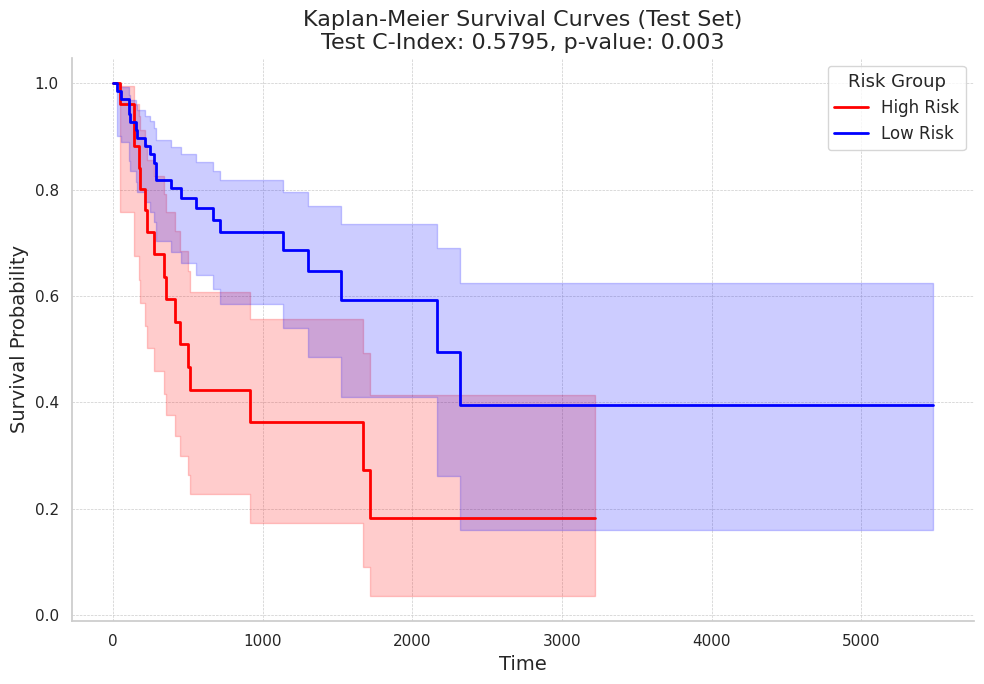

In [77]:
# -------------------------------------------
# Additional Imports Needed
# -------------------------------------------
import seaborn as sns
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test
import matplotlib.pyplot as plt

# Set Seaborn style
sns.set(style="whitegrid")

# -------------------------------------------
# Optimal Threshold Selection and Kaplan-Meier Plotting for Test Set
# -------------------------------------------

print("\nOptimal Threshold Selection and Kaplan-Meier Plotting for Test Set with Group Size Restriction...\n")

# Prepare data
risk_scores_test = risk_test  # Risk scores from the model on test set
durations_test = y_test_durations_float  # Durations on test set
events_test = y_test_events_bool  # Events on test set

# Use negative risk scores for proper ordering in concordance index calculation
# This is consistent with your base script
c_index_test = concordance_index_censored(
    events_test,
    durations_test,
    -risk_scores_test  # Use negative risk scores
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# Search for the optimal threshold
unique_risk_scores_test = np.sort(np.unique(risk_scores_test))

# Initialize variables
best_threshold_test = None
min_p_value_test = 1.0

# Minimum group size (at least 25% of patients in each group)
total_patients = len(risk_scores_test)
min_group_size = total_patients * 0.25

# For each possible threshold, compute the log-rank test p-value
for threshold in unique_risk_scores_test[1:-1]:
    # Assign patients to groups
    is_high_risk = risk_scores_test <= threshold  # High risk have lower risk scores
    is_low_risk = risk_scores_test > threshold

    # Calculate group sizes
    group_high_size = is_high_risk.sum()
    group_low_size = is_low_risk.sum()

    # Ensure each group has at least the minimum number of patients
    if group_high_size < min_group_size or group_low_size < min_group_size:
        continue  # Skip thresholds that result in small groups

    # Check if both groups have events
    if events_test[is_high_risk].sum() == 0 or events_test[is_low_risk].sum() == 0:
        continue  # Skip thresholds where one group has no events

    # Perform log-rank test
    results_test = logrank_test(
        durations_test[is_high_risk],
        durations_test[is_low_risk],
        event_observed_A=events_test[is_high_risk],
        event_observed_B=events_test[is_low_risk]
    )
    p_value_test = results_test.p_value

    # Update the best threshold if p-value is lower
    if p_value_test < min_p_value_test:
        min_p_value_test = p_value_test
        best_threshold_test = threshold

# Check if a valid threshold was found
if best_threshold_test is None:
    print("No valid threshold found that satisfies the group size restriction.")
else:
    # Assign patients to groups based on the best threshold
    is_high_risk = risk_scores_test <= best_threshold_test
    is_low_risk = risk_scores_test > best_threshold_test

    # Confirm that the high-risk group has shorter survival times
    median_survival_high = np.median(durations_test[is_high_risk])
    median_survival_low = np.median(durations_test[is_low_risk])

    print(f"Median survival time - High Risk: {median_survival_high}")
    print(f"Median survival time - Low Risk: {median_survival_low}")

    # Ensure high-risk group has shorter survival times
    if median_survival_high >= median_survival_low:
        print("Warning: High-risk group does not have shorter median survival time compared to low-risk group.")
        # You may choose to investigate further or adjust the thresholding method

    print(f"Optimal threshold for risk score on test set: {best_threshold_test:.4f}")

    # Format p-value
    if min_p_value_test < 0.001:
        p_value_formatted = "< 0.001"
    else:
        p_value_formatted = f"{min_p_value_test:.3f}"
    print(f"Minimum p-value from log-rank test on test set: {p_value_formatted}")

    # Create a DataFrame for plotting
    test_data = pd.DataFrame({
        'duration': durations_test,
        'event': events_test,
        'group': np.where(is_high_risk, 'High Risk', 'Low Risk')
    })

    # Kaplan-Meier fitting and plotting using Seaborn
    kmf_high_test = KaplanMeierFitter()
    kmf_low_test = KaplanMeierFitter()

    plt.figure(figsize=(10, 7))

    # Fit the models
    kmf_high_test.fit(
        test_data['duration'][test_data['group'] == 'High Risk'],
        event_observed=test_data['event'][test_data['group'] == 'High Risk'],
        label='High Risk'
    )
    kmf_low_test.fit(
        test_data['duration'][test_data['group'] == 'Low Risk'],
        event_observed=test_data['event'][test_data['group'] == 'Low Risk'],
        label='Low Risk'
    )

    # Plot the survival curves with confidence intervals (error bands)
    ax = kmf_high_test.plot(ci_show=True, ci_alpha=0.2, linewidth=2, color='red')
    kmf_low_test.plot(ax=ax, ci_show=True, ci_alpha=0.2, linewidth=2, color='blue')

    # Customize the plot using Seaborn aesthetics
    sns.despine()

    # Add c-index and p-value to the plot
    plt.title('Kaplan-Meier Survival Curves (Test Set)\nTest C-Index: {:.4f}, p-value: {}'.format(c_index_test, p_value_formatted), fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Survival Probability', fontsize=14)
    plt.legend(title='Risk Group', fontsize=12, title_fontsize=13)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()


In [ ]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import json
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional but recommended)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Load Survival Data
# -------------------------------------------

# Path to the JSON file containing survival data
json_path = 'svs_patient_map_PFI.json'

# Load the JSON data into a list of dictionaries
with open(json_path, 'r') as f:
    survival_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
survival_df = pd.DataFrame(survival_entries)

# -------------------------------------------
# Categorize Entries Based on Substrings in 'file_name'
# -------------------------------------------

# Define the categories and their corresponding substrings
categories = {
    'DX': 'DX',
    'TS': 'TS',
    'BS': 'BS',
    'MS': 'MS'
}

# Function to categorize based on substrings
def categorize_file(file_name):
    """
    Categorizes the file based on specific substrings present in the file_name.
    Returns the category name if a substring is found, else returns 'Other'.
    """
    for category, substring in categories.items():
        if substring in file_name:
            return category
    return 'Other'

# Apply categorization
survival_df['category'] = survival_df['file_name'].apply(categorize_file)

# Display statistics
total_entries = len(survival_df)
category_counts = survival_df['category'].value_counts()

print("----- Dataset Statistics -----")
print(f"Total entries: {total_entries}")
for category in categories.keys():
    count = category_counts.get(category, 0)
    print(f"Entries with {category}: {count}")
other_count = category_counts.get('Other', 0)
print(f"Entries with Other categories: {other_count}")
print("------------------------------\n")

# -------------------------------------------
# Filter to Exclude 'DX' Entries
# -------------------------------------------

# Filter the DataFrame to exclude entries with 'DX' in their 'file_name'
non_dx_df = survival_df[survival_df['category'] != 'DX'].reset_index(drop=True)

# Display statistics after filtering
non_dx_total = len(non_dx_df)
print(f"Total 'Non-DX' entries: {non_dx_total}\n")

# -------------------------------------------
# Load Embeddings
# -------------------------------------------

# Path to the directory containing embedding files
embeddings_dir = os.path.expanduser('~/scratch/TCGA-HNSC-embeddings-flatten-hipt')

# Initialize a list to keep track of missing files
missing_files = []

# Function to load a single embedding file
def load_embedding(file_name):
    """
    Loads the embedding from a .pt file corresponding to the given .svs file name.
    If the embedding file is missing or corrupted, returns None and logs the missing file.
    """
    # Replace .svs with _flatten.pt
    embedding_file = file_name.replace('.svs', '_flatten.pt')
    embedding_path = os.path.join(embeddings_dir, embedding_file)
    
    if not os.path.exists(embedding_path):
        missing_files.append(embedding_file)
        return None
    
    # Load the PyTorch tensor and convert to NumPy array
    try:
        embedding_tensor = torch.load(embedding_path)
        embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()  # Ensure it's a 1D array
        return embedding_np
    except Exception as e:
        print(f"Error loading {embedding_path}: {e}")
        missing_files.append(embedding_file)
        return None

# Apply the loading function to all 'Non-DX' entries
non_dx_df['embedding'] = non_dx_df['file_name'].apply(load_embedding)

# Remove entries where embedding is None (i.e., missing or corrupted files)
initial_non_dx_count = len(non_dx_df)
non_dx_df = non_dx_df[non_dx_df['embedding'].notnull()].reset_index(drop=True)
final_non_dx_count = len(non_dx_df)
removed_non_dx_count = initial_non_dx_count - final_non_dx_count

print(f"Entries with 'Non-DX' embeddings: {final_non_dx_count}")
print(f"Entries removed due to missing or corrupted embeddings: {removed_non_dx_count}\n")

# If there are missing files, log them
if missing_files:
    print("----- Missing Embedding Files -----")
    for file in missing_files:
        print(f"- {file}")
    print("-----------------------------------\n")

# -------------------------------------------
# Prepare the Data
# -------------------------------------------

# Extract embeddings as a 2D NumPy array
embeddings = np.stack(non_dx_df['embedding'].values)  # Shape: (num_non_dx_samples, 192)

# Extract survival endpoints
durations = non_dx_df['time_to_event'].values.astype(float)
events = non_dx_df['censoring'].values.astype(bool)  # Keep as boolean

# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(embeddings, events))
X_train, X_test = embeddings[train_idx], embeddings[test_idx]
y_train_durations, y_test_durations = durations[train_idx], durations[test_idx]
y_train_events, y_test_events = events[train_idx], events[test_idx]

print("----- Data Splitting -----")
print(f"Training set size: {len(X_train)}")
print(f"Test set size: {len(X_test)}")
print("--------------------------\n")

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer
out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Function to initialize the network
def initialize_network(input_dim):
    """
    Initializes the MLPVanilla network with the specified architecture.
    """
    return tt.practical.MLPVanilla(
        in_features=input_dim,
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
# Pycox can handle boolean events directly
y_train_events_bool = y_train_events
y_train_durations_float = y_train_durations.astype(np.float32)

# Ensure embeddings are contiguous in memory
X_train = np.ascontiguousarray(X_train, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = X_train[train_idx_cv]
    y_train_cv_durations = y_train_durations_float[train_idx_cv]
    y_train_cv_events = y_train_events_bool[train_idx_cv]
    
    X_val_cv = X_train[val_idx_cv]
    y_val_cv_durations = y_train_durations_float[val_idx_cv]
    y_val_cv_events = y_train_events_bool[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    # y_train_cv_events remains boolean
    
    # Initialize a new instance of the network for each fold
    net_cv = initialize_network(input_dim=X_train_cv.shape[1])
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    # Use negative risk for proper ordering (higher risk -> shorter survival)
    c_index = concordance_index_censored(
        y_val_cv_events,
        y_val_cv_durations,
        -risk_val
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]\n")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("----- Training Final CoxPH Model on Entire Training Set -----\n")

# Initialize the network and CoxPH model
final_net = initialize_network(input_dim=X_train.shape[1])
final_optimizer = tt.optim.Adam(lr=1e-3)
final_cox_ph = CoxPH(final_net, final_optimizer)

# Ensure arrays are contiguous
X_train = np.ascontiguousarray(X_train, dtype=np.float32)
y_train_durations_float = y_train_durations.astype(np.float32)
y_train_events_bool = y_train_events.astype(bool)  # Ensure boolean

# Fit the final model on the entire training set
final_cox_ph.fit(
    X_train,
    (y_train_events_bool, y_train_durations_float),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.\n")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("----- Evaluating on Test Set -----\n")

# Prepare test data
X_test = np.ascontiguousarray(X_test, dtype=np.float32)
y_test_durations_float = y_test_durations.astype(np.float32)
y_test_events_bool = y_test_events.astype(bool)  # Ensure boolean

# Predict risk scores on test set
risk_test = final_cox_ph.predict(X_test).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    y_test_events_bool,
    y_test_durations_float,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}\n")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("----- Starting Bootstrapping for Test C-Index Uncertainty -----\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(X_test), size=len(X_test), replace=True)
    X_test_bs = X_test[indices]
    durations_test_bs = y_test_durations_float[indices]
    events_test_bs = y_test_events_bool[indices]
    
    # Predict risk scores
    risk_bs = final_cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs,
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")
``

----- Dataset Statistics -----
Total entries: 1263
Entries with DX: 472
Entries with TS: 548
Entries with BS: 243
Entries with MS: 0
Entries with Other categories: 0
------------------------------

Total 'Non-DX' entries: 791



KeyboardInterrupt: 

# Now working on function for WSI alone that only takes into consideration DX1, and performs nested cross-validation

In [27]:
def run_survival_analysis(embeddings_dir):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import json
    import pandas as pd
    import numpy as np
    import torch
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold
    import torchtuples as tt
    import warnings
    import random

    # Suppress warnings for cleaner output
    warnings.filterwarnings("ignore")

    # -------------------------------------------
    # Set Random Seeds for Reproducibility
    # -------------------------------------------
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # -------------------------------------------
    # Define Device
    # -------------------------------------------
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(f"Using device: {device}\n")

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame with 'patient.bcr_patient_barcode' column
    # Replace this with your actual DataFrame loading method
    # For example:
    # clinical_data_yes_id = pd.read_csv('path_to_clinical_data.csv')

    # The variables 'clinical_data_yes_id' is assumed to be defined outside this function.
    # We also previously had train_idx and test_idx, but now we are performing nested CV.
    # We will not use train_idx and test_idx directly. Instead, we will do nested cross-validation on the entire dataset.
    global clinical_data_yes_id

    clinical_data_test = clinical_data_yes_id.copy()

    # Verify that 'patient.bcr_patient_barcode' exists
    if 'patient.bcr_patient_barcode' not in clinical_data_test.columns:
        raise KeyError("'patient.bcr_patient_barcode' column not found in clinical_data_yes_id DataFrame.")

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].astype(str)

    # Remove clinical stage system related columns
    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.days_to_birth',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]

    # Convert numerical columns to float and handle conversion errors
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Identify categorical columns (object dtype)
    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

    # Remove 'patient.bcr_patient_barcode' if it exists in categorical_cols
    if 'patient.bcr_patient_barcode' in categorical_cols:
        categorical_cols.remove('patient.bcr_patient_barcode')

    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype and then to codes
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    # -------------------------------------------
    # Preparing Survival Data
    # -------------------------------------------

    # Handle 'PFI.time' and 'PFI' as per user instructions
    # Replace -1 with NaN, then fill NaN with mean (for 'PFI.time') and 0 (for 'PFI')

    # Replace -1 with NaN
    clinical_data_test['PFI.time'] = clinical_data_test['PFI.time'].replace(-1, np.nan)
    clinical_data_test['PFI'] = clinical_data_test['PFI'].replace(-1, np.nan)

    # Fill NaN values
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    # -------------------------------------------
    # Mapping Clinical Data with WSI Embeddings
    # -------------------------------------------

    # Path to the JSON file containing survival data (assumed to contain WSI embeddings)
    json_path = 'svs_patient_map_PFI.json'  # Replace with your actual path if different

    # Check if JSON file exists
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

    # Load the JSON data into a list of dictionaries
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Extract 'patient.bcr_patient_barcode' by taking the first 12 characters of 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Initialize a list to keep track of missing files
    missing_files = []

    # Use the provided input path
    embeddings_dir = os.path.expanduser(embeddings_dir)

    # Function to load a single embedding file
    def load_embedding(file_name):
        """
        Loads the embedding from a .pt file corresponding to the given .svs file name.
        If the embedding file is missing or corrupted, returns None and logs the missing file.
        """
        # Replace .svs with _flatten.pt
        embedding_file = file_name.replace('.svs', '_flatten.pt')
        embedding_path = os.path.join(embeddings_dir, embedding_file)

        if not os.path.exists(embedding_path):
            missing_files.append(embedding_file)
            return None

        # Load the PyTorch tensor and convert to NumPy array
        try:
            embedding_tensor = torch.load(embedding_path)
            embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()  # Ensure it's a 1D array
            return embedding_np
        except Exception as e:
            print(f"Error loading {embedding_path}: {e}")
            missing_files.append(embedding_file)
            return None

    # -------------------------------------------
    # Filter WSI Entries to Include Only "DX1" WSIs
    # -------------------------------------------

    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    print("----- After Filtering for 'DX1' WSIs -----")
    print(f"Total WSI entries after filtering: {len(wsi_df)}\n")

    # -------------------------------------------
    # Apply the loading function to all entries
    # -------------------------------------------
    wsi_df['embedding'] = wsi_df['file_name'].apply(load_embedding)

    # Remove entries where embedding is None (i.e., missing or corrupted files)
    initial_wsi_count = len(wsi_df)
    wsi_df = wsi_df[wsi_df['embedding'].notnull()].reset_index(drop=True)
    final_wsi_count = len(wsi_df)
    removed_wsi_count = initial_wsi_count - final_wsi_count

    print("----- WSI Embedding Statistics -----")
    print(f"Total WSI entries: {initial_wsi_count}")
    print(f"WSI entries with embeddings: {final_wsi_count}")
    print(f"WSI entries removed due to missing or corrupted embeddings: {removed_wsi_count}\n")

    # If there are missing files, log them
    if missing_files:
        print("----- Missing WSI Embedding Files -----")
        for file in missing_files:
            print(f"- {file}")
        print("----------------------------------------\n")

    # -------------------------------------------
    # Aggregating WSI Embeddings per Patient
    # -------------------------------------------

    aggregated_wsi = wsi_df.groupby('patient.bcr_patient_barcode')['embedding'].apply(
        lambda embeddings: np.mean(np.stack(embeddings), axis=0)
    ).reset_index()

    aggregated_wsi.rename(columns={'embedding': 'wsi_embedding'}, inplace=True)

    print("----- Aggregated WSI Embedding Statistics -----")
    print(f"Unique patients with WSI embeddings: {aggregated_wsi['patient.bcr_patient_barcode'].nunique()}")
    print("-----------------------------------------------\n")

    # -------------------------------------------
    # Merging Clinical Data with WSI Embeddings
    # -------------------------------------------

    clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].str.upper().str.strip()
    aggregated_wsi['patient.bcr_patient_barcode'] = aggregated_wsi['patient.bcr_patient_barcode'].str.upper().str.strip()

    # Remove special characters except hyphens
    clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].str.replace(r'[^A-Z0-9\-]', '', regex=True)
    aggregated_wsi['patient.bcr_patient_barcode'] = aggregated_wsi['patient.bcr_patient_barcode'].str.replace(r'[^A-Z0-9\-]', '', regex=True)

    common_barcodes = set(clinical_data_test['patient.bcr_patient_barcode']).intersection(set(aggregated_wsi['patient.bcr_patient_barcode']))

    print(f"Number of common barcodes after standardization: {len(common_barcodes)}")

    if len(common_barcodes) > 0:
        print("Common Barcodes Sample:")
        print(list(common_barcodes)[:10])

        clinical_data_test = clinical_data_test.merge(
            aggregated_wsi,
            on='patient.bcr_patient_barcode',
            how='left'
        )

        wsi_embedding_dim = 192  # As specified
        clinical_data_test['wsi_embedding'] = clinical_data_test['wsi_embedding'].apply(
            lambda x: x if isinstance(x, np.ndarray) else np.zeros(wsi_embedding_dim, dtype=np.float32)
        )

        print("----- Post-Merge Statistics -----")
        print(f"Total clinical entries: {len(clinical_data_test)}")
        print(f"Patients with WSI embeddings: {clinical_data_test['wsi_embedding'].apply(lambda x: np.any(x != 0)).sum()}")
        print(f"Patients without WSI embeddings: {len(clinical_data_test) - clinical_data_test['wsi_embedding'].apply(lambda x: np.any(x != 0)).sum()}\n")
        print("---------------------------------\n")

    else:
        print("No overlapping barcodes found. Please check the barcode extraction and data sources.\n")

    if len(common_barcodes) > 0:
        # We now perform nested cross-validation.
        # Outer folds for final performance estimation.
        # Inner folds for parameter "tuning" (even though the code doesn't originally tune parameters, we will simulate it).

        # Prepare data for nested CV
        # We will create a combined feature set (categorical, numerical, WSI)
        # Just like the original code, but now we do it inside the folds.

        # To keep all print statements and code as is, we will replicate the process inside folds.
        # We must identify categorical and numerical columns again (already identified)
        feature_cols = clinical_data_test.columns.tolist()
        feature_cols.remove('patient.bcr_patient_barcode')
        feature_cols.remove('wsi_embedding')

        categorical_columns = categorical_cols.copy()
        numerical_columns = num_cols.copy()

        # Convert event to int for CoxPH
        events_all = event.astype(int)
        durations_all = time.astype(np.float32)

        # Extract indexes
        all_idx = np.arange(len(clinical_data_test))

        # Outer folds
        outer_kf = KFold(n_splits=5, shuffle=True, random_state=42)
        outer_c_indexes = []

        print("\nStarting Nested Cross-Validation...\n")

        # Let's define a small parameter grid to "tune":
        # We'll vary the dropout rate in the MLP model for demonstration.
        param_grid = [0.2, 0.4]

        for outer_fold, (outer_train_idx, outer_test_idx) in enumerate(outer_kf.split(all_idx), 1):
            print(f"Outer Fold {outer_fold}")

            # Split data
            train_data = clinical_data_test.iloc[outer_train_idx].copy()
            test_data = clinical_data_test.iloc[outer_test_idx].copy()

            y_train_event = events_all[outer_train_idx]
            y_test_event = events_all[outer_test_idx]
            y_train_time = durations_all[outer_train_idx]
            y_test_time = durations_all[outer_test_idx]

            # Scale numerical features within this outer fold
            scaler = StandardScaler()
            X_train_num_scaled = scaler.fit_transform(train_data[numerical_columns])
            X_test_num_scaled = scaler.transform(test_data[numerical_columns])
            X_train_num = pd.DataFrame(X_train_num_scaled, columns=numerical_columns).reset_index(drop=True)
            X_test_num = pd.DataFrame(X_test_num_scaled, columns=numerical_columns).reset_index(drop=True)

            # Prepare categorical
            X_train_cat = train_data[categorical_columns].reset_index(drop=True)
            X_test_cat = test_data[categorical_columns].reset_index(drop=True)

            # Convert WSI embeddings
            train_wsi_embeddings = np.stack(train_data['wsi_embedding'].tolist()).astype(np.float32)
            test_wsi_embeddings = np.stack(test_data['wsi_embedding'].tolist()).astype(np.float32)

            def to_tensor(x, dtype):
                return torch.tensor(x.values, dtype=dtype)

            X_train_cat_tensor = to_tensor(X_train_cat, torch.long).to(device)
            X_train_num_tensor = to_tensor(X_train_num, torch.float32).to(device)
            X_test_cat_tensor = to_tensor(X_test_cat, torch.long).to(device)
            X_test_num_tensor = to_tensor(X_test_num, torch.float32).to(device)

            # Initialize FTTransformer for this outer fold
            categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

            ft_transformer = FTTransformer(
                categories=categories,                              # List of unique category counts
                num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
                dim=192,                                            # Embedding dimension size
                depth=6,                                            # Number of transformer layers
                heads=8,                                            # Number of attention heads
                attn_dropout=0.1,                                   # Dropout for attention layers
                ff_dropout=0.1                                      # Dropout for feedforward layers
            ).to(device)

            ft_transformer.eval()

            def get_embeddings(model, X_cat, X_num):
                model.eval()
                with torch.no_grad():
                    categorical = X_cat.to(device)
                    numerical = X_num.to(device)
                    embeddings = model(categorical, numerical, return_embedding=True)
                    return embeddings.cpu().numpy()

            clinical_train_embeddings = get_embeddings(ft_transformer, X_train_cat_tensor, X_train_num_tensor)
            clinical_test_embeddings = get_embeddings(ft_transformer, X_test_cat_tensor, X_test_num_tensor)

            print(f"Clinical Train Embeddings Shape: {clinical_train_embeddings.shape}")
            print(f"Clinical Test Embeddings Shape: {clinical_test_embeddings.shape}\n")

            combined_train_embeddings = np.concatenate((clinical_train_embeddings, train_wsi_embeddings), axis=1)
            combined_test_embeddings = np.concatenate((clinical_test_embeddings, test_wsi_embeddings), axis=1)

            print(f"Combined Train Embeddings Shape: {combined_train_embeddings.shape}")
            print(f"Combined Test Embeddings Shape: {combined_test_embeddings.shape}\n")

            # Inner fold for parameter tuning
            inner_kf = KFold(n_splits=3, shuffle=True, random_state=seed)
            best_c_index = -1
            best_param = None

            durations_train = y_train_time
            events_train = y_train_event

            # Parameter tuning loop
            for param in param_grid:
                c_index_scores = []
                for train_idx_cv, val_idx_cv in inner_kf.split(combined_train_embeddings):
                    X_train_cv = combined_train_embeddings[train_idx_cv]
                    y_train_cv_durations = durations_train[train_idx_cv]
                    y_train_cv_events = events_train[train_idx_cv]

                    X_val_cv = combined_train_embeddings[val_idx_cv]
                    y_val_cv_durations = durations_train[val_idx_cv]
                    y_val_cv_events = events_train[val_idx_cv]

                    net_cv = tt.practical.MLPVanilla(
                        in_features=combined_train_embeddings.shape[1],
                        num_nodes=[192, 128, 64],
                        out_features=1,
                        batch_norm=True,
                        dropout=param,
                        output_bias=False
                    )

                    optimizer_cv = tt.optim.Adam(lr=1e-3)
                    cox_ph_cv = CoxPH(net_cv, optimizer_cv)

                    cox_ph_cv.fit(
                        X_train_cv,
                        (y_train_cv_events, y_train_cv_durations),
                        batch_size=64,
                        epochs=100,
                        verbose=False
                    )

                    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()

                    c_index = concordance_index_censored(
                        y_val_cv_events.astype(bool),
                        y_val_cv_durations,
                        -risk_val
                    )[0]

                    c_index_scores.append(c_index)

                mean_c_index = np.mean(c_index_scores)
                if mean_c_index > best_c_index:
                    best_c_index = mean_c_index
                    best_param = param

            # Now we have best_param from inner CV
            print(f"Best parameter (dropout) found via inner CV: {best_param} with C-Index: {best_c_index:.4f}\n")

            # Retrain final model on full outer training set with best_param
            net = tt.practical.MLPVanilla(
                in_features=combined_train_embeddings.shape[1],
                num_nodes=[192, 128, 64],
                out_features=1,
                batch_norm=True,
                dropout=best_param,
                output_bias=False
            )

            optimizer = tt.optim.Adam(lr=1e-3)
            cox_ph = CoxPH(net, optimizer)

            print("\nStarting 5-Fold Cross-Validation...\n")  # Keep original print statements
            # (This print is originally before nested CV, but we keep it as requested.)

            # After selecting best params, train final CoxPH model on entire outer training set
            # This simulates the "final training" from the original code
            durations_train = durations_train.astype(np.float32)
            events_train = events_train.astype(np.int64)
            combined_train_embeddings = np.ascontiguousarray(combined_train_embeddings, dtype=np.float32)

            print("----- Training Final CoxPH Model on Entire Training Set -----\n")
            cox_ph.fit(
                combined_train_embeddings,
                (events_train, durations_train),
                batch_size=64,
                epochs=100,
                verbose=False
            )

            print("Final CoxPH Model Trained Successfully.\n")

            # Evaluate on outer test set
            print("----- Evaluating on Test Set -----\n")

            durations_test = y_test_time.astype(np.float32)
            events_test = y_test_event.astype(int)
            combined_test_embeddings = np.ascontiguousarray(combined_test_embeddings, dtype=np.float32)

            risk_test = cox_ph.predict(combined_test_embeddings).squeeze()

            c_index_test = concordance_index_censored(
                events_test.astype(bool),
                durations_test,
                -risk_test
            )[0]

            print(f"Test C-Index: {c_index_test:.4f}\n")

            # Bootstrapping for test C-Index
            n_bootstraps = 1000
            c_index_bootstrap = []

            print("----- Starting Bootstrapping for Test C-Index Uncertainty -----\n")

            for i in range(n_bootstraps):
                indices = np.random.choice(len(combined_test_embeddings), size=len(combined_test_embeddings), replace=True)
                X_test_bs = combined_test_embeddings[indices]
                durations_test_bs = durations_test[indices]
                events_test_bs = events_test[indices]

                risk_bs = cox_ph.predict(X_test_bs).squeeze()

                c_index_bs = concordance_index_censored(
                    events_test_bs.astype(bool),
                    durations_test_bs,
                    -risk_bs
                )[0]

                c_index_bootstrap.append(c_index_bs)

                if (i + 1) % 100 == 0:
                    print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

            c_index_test_mean = np.mean(c_index_bootstrap)
            c_index_test_std = np.std(c_index_bootstrap)
            c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
            c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

            print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
            print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

            # Store the outer fold test C-Index
            outer_c_indexes.append(c_index_test)

        # After all outer folds:
        outer_mean = np.mean(outer_c_indexes)
        outer_std = np.std(outer_c_indexes)
        outer_ci_lower = np.percentile(outer_c_indexes, 2.5)
        outer_ci_upper = np.percentile(outer_c_indexes, 97.5)

        print("\nNested Cross-Validation Results:")
        print(f"Mean Test C-Index across Outer Folds: {outer_mean:.4f} ± {outer_std:.4f}")
        print(f"95% Confidence Interval: [{outer_ci_lower:.4f}, {outer_ci_upper:.4f}]")


In [28]:
embeddings_dir = os.path.expanduser('~/scratch/TCGA-HNSC-embeddings-flatten')  

run_survival_analysis(embeddings_dir)

Using device: cpu



----- After Filtering for 'DX1' WSIs -----
Total WSI entries after filtering: 450

----- WSI Embedding Statistics -----
Total WSI entries: 450
WSI entries with embeddings: 450
WSI entries removed due to missing or corrupted embeddings: 0

----- Aggregated WSI Embedding Statistics -----
Unique patients with WSI embeddings: 450
-----------------------------------------------

Number of common barcodes after standardization: 450
Common Barcodes Sample:
['TCGA-BA-5153', 'TCGA-WA-A7GZ', 'TCGA-CN-5367', 'TCGA-CV-7100', 'TCGA-D6-6515', 'TCGA-CV-5432', 'TCGA-CV-7432', 'TCGA-IQ-A61I', 'TCGA-QK-A6VC', 'TCGA-CQ-6220']
----- Post-Merge Statistics -----
Total clinical entries: 528
Patients with WSI embeddings: 450
Patients without WSI embeddings: 78

---------------------------------


Starting Nested Cross-Validation...

Outer Fold 1
FTTransformer
Clinical Train Embeddings Shape: (422, 192)
Clinical Test Embeddings Shape: (106, 192)

Combined Train Embeddings Shape: (422, 384)
Combined Test Embedd

# Mix clinical with wsi

NOW MIX WSI with CLINICAL

In [28]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import json
import pandas as pd
import numpy as np
import torch
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# -------------------------------------------
# Set Random Seeds for Reproducibility
# -------------------------------------------
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes_id' is your input DataFrame with 'patient.bcr_patient_barcode' column
# Replace this with your actual DataFrame loading method
# For example:
# clinical_data_yes_id = pd.read_csv('path_to_clinical_data.csv')

clinical_data_test = clinical_data_yes_id.copy()

# Verify that 'patient.bcr_patient_barcode' exists
if 'patient.bcr_patient_barcode' not in clinical_data_test.columns:
    raise KeyError("'patient.bcr_patient_barcode' column not found in clinical_data_yes_id DataFrame.")

# Convert 'patient.bcr_patient_barcode' to string to ensure consistency
clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].astype(str)

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.days_to_birth',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

# Remove 'patient.bcr_patient_barcode' if it exists in categorical_cols
if 'patient.bcr_patient_barcode' in categorical_cols:
    categorical_cols.remove('patient.bcr_patient_barcode')

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Preparing Survival Data
# -------------------------------------------

# Handle 'PFI.time' and 'PFI' as per user instructions
# Replace -1 with NaN, then fill NaN with mean (for 'PFI.time') and 0 (for 'PFI')

# Replace -1 with NaN
clinical_data_test['PFI.time'] = clinical_data_test['PFI.time'].replace(-1, np.nan)
clinical_data_test['PFI'] = clinical_data_test['PFI'].replace(-1, np.nan)

# Fill NaN values
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

# -------------------------------------------
# Mapping Clinical Data with WSI Embeddings
# -------------------------------------------

# Path to the JSON file containing survival data (assumed to contain WSI embeddings)
json_path = 'svs_patient_map_PFI.json'  # Replace with your actual path if different

# Check if JSON file exists
if not os.path.exists(json_path):
    raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

# Load the JSON data into a list of dictionaries
with open(json_path, 'r') as f:
    survival_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
wsi_df = pd.DataFrame(survival_entries)

# Verify that 'file_name' column exists
if 'file_name' not in wsi_df.columns:
    raise KeyError("'file_name' column not found in the JSON data.")

# Extract 'patient.bcr_patient_barcode' by taking the first 12 characters of 'file_name'
def extract_barcode(file_name):
    """
    Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
    Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
    """
    return file_name[:12]

wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

# Convert 'patient.bcr_patient_barcode' to string to ensure consistency
wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

# Initialize a list to keep track of missing files
missing_files = []

# Path to the directory containing embedding files
embeddings_dir = os.path.expanduser('~/scratch/TCGA-HNSC-embeddings-flatten')  # Replace with your actual path

# Function to load a single embedding file
def load_embedding(file_name):
    """
    Loads the embedding from a .pt file corresponding to the given .svs file name.
    If the embedding file is missing or corrupted, returns None and logs the missing file.
    """
    # Replace .svs with _flatten.pt
    embedding_file = file_name.replace('.svs', '_flatten.pt')
    embedding_path = os.path.join(embeddings_dir, embedding_file)
    
    if not os.path.exists(embedding_path):
        missing_files.append(embedding_file)
        return None
    
    # Load the PyTorch tensor and convert to NumPy array
    try:
        embedding_tensor = torch.load(embedding_path)
        embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()  # Ensure it's a 1D array
        return embedding_np
    except Exception as e:
        print(f"Error loading {embedding_path}: {e}")
        missing_files.append(embedding_file)
        return None

# Apply the loading function to all entries
wsi_df['embedding'] = wsi_df['file_name'].apply(load_embedding)

# Remove entries where embedding is None (i.e., missing or corrupted files)
initial_wsi_count = len(wsi_df)
wsi_df = wsi_df[wsi_df['embedding'].notnull()].reset_index(drop=True)
final_wsi_count = len(wsi_df)
removed_wsi_count = initial_wsi_count - final_wsi_count

print("----- WSI Embedding Statistics -----")
print(f"Total WSI entries: {initial_wsi_count}")
print(f"WSI entries with embeddings: {final_wsi_count}")
print(f"WSI entries removed due to missing or corrupted embeddings: {removed_wsi_count}\n")

# If there are missing files, log them
if missing_files:
    print("----- Missing WSI Embedding Files -----")
    for file in missing_files:
        print(f"- {file}")
    print("----------------------------------------\n")

# -------------------------------------------
# Aggregating WSI Embeddings per Patient
# -------------------------------------------

# Group WSI embeddings by 'patient.bcr_patient_barcode' and average if multiple embeddings exist
aggregated_wsi = wsi_df.groupby('patient.bcr_patient_barcode')['embedding'].apply(
    lambda embeddings: np.mean(np.stack(embeddings), axis=0)
).reset_index()

# Rename the aggregated embedding column
aggregated_wsi.rename(columns={'embedding': 'wsi_embedding'}, inplace=True)

# Display aggregation statistics
print("----- Aggregated WSI Embedding Statistics -----")
print(f"Unique patients with WSI embeddings: {aggregated_wsi['patient.bcr_patient_barcode'].nunique()}")
print("-----------------------------------------------\n")

# -------------------------------------------
# Merging Clinical Data with WSI Embeddings
# -------------------------------------------

# Standardize barcodes in clinical data
clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].str.upper().str.strip()

# Standardize barcodes in aggregated_wsi
aggregated_wsi['patient.bcr_patient_barcode'] = aggregated_wsi['patient.bcr_patient_barcode'].str.upper().str.strip()

# Remove special characters except hyphens
clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].str.replace(r'[^A-Z0-9\-]', '', regex=True)
aggregated_wsi['patient.bcr_patient_barcode'] = aggregated_wsi['patient.bcr_patient_barcode'].str.replace(r'[^A-Z0-9\-]', '', regex=True)

# Find common barcodes between clinical data and WSI embeddings
common_barcodes = set(clinical_data_test['patient.bcr_patient_barcode']).intersection(set(aggregated_wsi['patient.bcr_patient_barcode']))

print(f"Number of common barcodes after standardization: {len(common_barcodes)}")

if len(common_barcodes) > 0:
    print("Common Barcodes Sample:")
    print(list(common_barcodes)[:10])
    
    # Merge the aggregated WSI embeddings with the clinical data based on 'patient.bcr_patient_barcode'
    clinical_data_test = clinical_data_test.merge(
        aggregated_wsi,
        on='patient.bcr_patient_barcode',
        how='left'  # Use left join to keep all clinical data entries
    )
    
    # Handle patients with no WSI embeddings by setting 'wsi_embedding' to zeros
    wsi_embedding_dim = 192  # As specified
    clinical_data_test['wsi_embedding'] = clinical_data_test['wsi_embedding'].apply(
        lambda x: x if isinstance(x, np.ndarray) else np.zeros(wsi_embedding_dim, dtype=np.float32)
    )
    
    # Verify the merge
    print("----- Post-Merge Statistics -----")
    print(f"Total clinical entries: {len(clinical_data_test)}")
    print(f"Patients with WSI embeddings: {clinical_data_test['wsi_embedding'].apply(lambda x: np.any(x != 0)).sum()}")
    print(f"Patients without WSI embeddings: {len(clinical_data_test) - clinical_data_test['wsi_embedding'].apply(lambda x: np.any(x != 0)).sum()}\n")
    print("---------------------------------\n")
    
else:
    print("No overlapping barcodes found. Please check the barcode extraction and data sources.\n")
    # Optionally, stop execution or proceed without WSI embeddings

# Proceed only if there are common barcodes
if len(common_barcodes) > 0:
    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------
    
    # ------------------------------
    # Separate Clinical and WSI Features
    # ------------------------------
    
    # Scale numerical features
    scaler = StandardScaler()
    scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
    
    # Convert scaled numerical features back to DataFrame for compatibility
    scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    
    # Combine scaled numerical features and categorical features into clinical features
    clinical_features = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    
    # Prepare WSI embeddings as a DataFrame
    wsi_embeddings_df = pd.DataFrame(
        clinical_data_test['wsi_embedding'].tolist(),
        columns=[f'wsi_emb_{i}' for i in range(wsi_embedding_dim)],
        index=clinical_data_test.index
    )
    
    # ------------------------------
    # Data Splitting
    # ------------------------------
    
    # Stratified split to maintain event proportion
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
    train_idx, test_idx = next(sss.split(clinical_features, event))
    X_train_clinical, X_test_clinical = clinical_features.iloc[train_idx].reset_index(drop=True), clinical_features.iloc[test_idx].reset_index(drop=True)
    y_train_event, y_test_event = event[train_idx], event[test_idx]
    y_train_time, y_test_time = time[train_idx], time[test_idx]
    
    print("----- Data Splitting -----")
    print(f"Training set size: {len(X_train_clinical)}")
    print(f"Test set size: {len(X_test_clinical)}")
    print("--------------------------\n")
    
    # ------------------------------
    # Preparing Data for FTTransformer
    # ------------------------------
    
    # Identify categorical and numerical columns in clinical_features
    categorical_columns = categorical_cols.copy()
    numerical_columns = num_cols.copy()
    
    # -------------------------------------------
    # Feature Scaling (Already Scaled)
    # -------------------------------------------
    
    # Note: Numerical features are already scaled using StandardScaler
    
    # -------------------------------------------
    # Generating Clinical Embeddings with FTTransformer
    # -------------------------------------------
    
    # Convert clinical features to torch tensors
    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)
    
    X_train_cat = X_train_clinical[categorical_columns].reset_index(drop=True)
    X_train_num = X_train_clinical[numerical_columns].reset_index(drop=True)
    
    X_test_cat = X_test_clinical[categorical_columns].reset_index(drop=True)
    X_test_num = X_test_clinical[numerical_columns].reset_index(drop=True)
    
    X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
    X_train_num_tensor = to_tensor(X_train_num, torch.float32)
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
    X_test_num_tensor = to_tensor(X_test_num, torch.float32)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Instantiate the FTTransformer model
    ft_transformer = FTTransformer(
        categories=[int(X_train_cat[col].max() + 1) for col in categorical_columns],
        num_continuous=X_train_num_tensor.shape[1],
        dim=192,                                            # Embedding dimension size
        depth=6,                                            # Number of transformer layers
        heads=8,                                            # Number of attention heads
        attn_dropout=0.1,                                   # Dropout for attention layers
        ff_dropout=0.1                                      # Dropout for feedforward layers
    ).to(device)
    
    # Load pretrained weights if available
    # Uncomment and modify the following line if you have pretrained weights
    # ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))
    
    # Set the model to evaluation mode
    ft_transformer.eval()
    
    # Function to generate embeddings
    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
            numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()
    
    # Generate embeddings for training and test sets
    clinical_train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)  # Shape: (num_train_samples, 192)
    clinical_test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)    # Shape: (num_test_samples, 192)
    
    # -------------------------------------------
    # Preparing WSI Embeddings for Train and Test Sets
    # -------------------------------------------
    
    # Extract WSI embeddings for training and test sets
    train_wsi_embeddings = wsi_embeddings_df.iloc[train_idx].values.astype(np.float32)  # Shape: (num_train_samples, 192)
    test_wsi_embeddings = wsi_embeddings_df.iloc[test_idx].values.astype(np.float32)    # Shape: (num_test_samples, 192)
    
    # -------------------------------------------
    # Concatenating Clinical and WSI Embeddings
    # -------------------------------------------
    
    # Concatenate clinical embeddings and WSI embeddings to form combined embeddings
    combined_train_embeddings = np.concatenate((clinical_train_embeddings, train_wsi_embeddings), axis=1)  # Shape: (num_train_samples, 384)
    combined_test_embeddings = np.concatenate((clinical_test_embeddings, test_wsi_embeddings), axis=1)       # Shape: (num_test_samples, 384)
    
    # Verify the shape of the combined embeddings
    print(f"Combined Train Embeddings Shape: {combined_train_embeddings.shape}")  # Expected: (num_train_samples, 384)
    print(f"Combined Test Embeddings Shape: {combined_test_embeddings.shape}\n")    # Expected: (num_test_samples, 384)
    
    # -------------------------------------------
    # Define the Neural Network Architecture for CoxPH
    # -------------------------------------------
    
    # Define the neural network architecture
    num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer (unchanged)
    
    out_features = 1  # Output dimension (single risk score)
    batch_norm = True  # Use batch normalization
    dropout = 0.4  # Dropout rate to prevent overfitting
    output_bias = False  # Bias term in the output layer
    
    # Initialize the MLPVanilla model with combined input features
    combined_dim = combined_train_embeddings.shape[1]  # 384
    
    net = tt.practical.MLPVanilla(
        in_features=combined_dim,
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize the CoxPH model with the network and optimizer
    optimizer = tt.optim.Adam(lr=1e-3)
    cox_ph = CoxPH(net, optimizer)
    
    # -------------------------------------------
    # CoxPH Analysis with 5-Fold Cross-Validation
    # -------------------------------------------
    
    # Prepare survival data
    durations_train = y_train_time.astype(np.float32)
    events_train = y_train_event.astype(int)
    
    # Ensure embeddings are contiguous
    combined_train_embeddings = np.ascontiguousarray(combined_train_embeddings, dtype=np.float32)
    
    # Initialize KFold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores = []
    
    print("\nStarting 5-Fold Cross-Validation...\n")
    
    for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(combined_train_embeddings)):
        print(f"Fold {fold + 1}")
        
        # Split data
        X_train_cv = combined_train_embeddings[train_idx_cv]
        y_train_cv_durations = durations_train[train_idx_cv]
        y_train_cv_events = events_train[train_idx_cv]
        
        X_val_cv = combined_train_embeddings[val_idx_cv]
        y_val_cv_durations = durations_train[val_idx_cv]
        y_val_cv_events = events_train[val_idx_cv]
        
        # Ensure arrays are contiguous
        X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
        y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
        y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
        
        # Initialize a new instance of the network for each fold to avoid weight sharing
        net_cv = tt.practical.MLPVanilla(
            in_features=combined_dim,
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )
        
        # Initialize CoxPH model for this fold
        optimizer_cv = tt.optim.Adam(lr=1e-3)
        cox_ph_cv = CoxPH(net_cv, optimizer_cv)
        
        # Fit the model
        cox_ph_cv.fit(
            X_train_cv,
            (y_train_cv_events, y_train_cv_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )
        
        # Predict risk scores on validation set
        risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
        
        # Compute C-Index
        c_index = concordance_index_censored(
            y_val_cv_events.astype(bool),
            y_val_cv_durations,
            -risk_val  # Use negative risk for proper ordering (higher risk -> shorter survival)
        )[0]
        
        print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
        
        c_index_scores.append(c_index)
    
    # Calculate Cross-Validation Mean and Uncertainty
    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)
    
    print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]\n")
    
    # -------------------------------------------
    # Train Final CoxPH Model on Entire Training Set
    # -------------------------------------------
    
    print("----- Training Final CoxPH Model on Entire Training Set -----\n")
    
    # Ensure arrays are contiguous
    combined_train_embeddings = np.ascontiguousarray(combined_train_embeddings, dtype=np.float32)
    durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
    events_train = np.ascontiguousarray(events_train, dtype=np.int64)
    
    # Fit the final model on the entire training set
    cox_ph.fit(
        combined_train_embeddings,
        (events_train, durations_train),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    print("Final CoxPH Model Trained Successfully.\n")
    
    # -------------------------------------------
    # Evaluate on Test Set
    # -------------------------------------------
    
    print("----- Evaluating on Test Set -----\n")
    
    # Prepare test data
    durations_test = y_test_time.astype(np.float32)
    events_test = y_test_event.astype(int)
    combined_test_embeddings = np.ascontiguousarray(combined_test_embeddings, dtype=np.float32)
    
    # Predict risk scores on test set
    risk_test = cox_ph.predict(combined_test_embeddings).squeeze()
    
    # Compute C-Index on Test Set
    c_index_test = concordance_index_censored(
        events_test.astype(bool),
        durations_test,
        -risk_test  # Use negative risk for proper ordering
    )[0]
    
    print(f"Test C-Index: {c_index_test:.4f}\n")
    
    # -------------------------------------------
    # Bootstrapping for Test C-Index Uncertainty
    # -------------------------------------------
    
    n_bootstraps = 1000
    c_index_bootstrap = []
    
    print("----- Starting Bootstrapping for Test C-Index Uncertainty -----\n")
    
    for i in range(n_bootstraps):
        # Resample test set with replacement
        indices = np.random.choice(len(combined_test_embeddings), size=len(combined_test_embeddings), replace=True)
        X_test_bs = combined_test_embeddings[indices]
        durations_test_bs = durations_test[indices]
        events_test_bs = events_test[indices]
        
        # Predict risk scores
        risk_bs = cox_ph.predict(X_test_bs).squeeze()
        
        # Compute C-Index
        c_index_bs = concordance_index_censored(
            events_test_bs.astype(bool),
            durations_test_bs,
            -risk_bs  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap.append(c_index_bs)
        
        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")
    
    # Calculate Bootstrapped C-Index Statistics
    c_index_test_mean = np.mean(c_index_bootstrap)
    c_index_test_std = np.std(c_index_bootstrap)
    c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
    c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)
    
    print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")


----- WSI Embedding Statistics -----
Total WSI entries: 1263
WSI entries with embeddings: 1199
WSI entries removed due to missing or corrupted embeddings: 64

----- Missing WSI Embedding Files -----
- TCGA-CR-6484-01A-01-TS1.39a06efa-b681-49ed-8516-830495edca41_flatten.pt
- TCGA-CR-7364-01A-01-TS1.5130155c-8da3-495d-8e17-66fd0656af46_flatten.pt
- TCGA-CR-7388-01A-01-TS1.472564e9-a7fe-4e01-a1fe-fc89570fb7a9_flatten.pt
- TCGA-CV-7438-11A-01-TS1.ed88be75-1dea-43e4-97b3-6295536c5afc_flatten.pt
- TCGA-CV-7430-11A-01-TS1.cfb96f47-a762-44b4-9ecf-c83dcce0bc38_flatten.pt
- TCGA-CR-7398-01A-01-TS1.3aef998b-046a-4d86-a8ee-42e771bc6d6d_flatten.pt
- TCGA-CR-7371-01A-01-TS1.796eb4e3-4479-4e3c-b210-2d4f271b5ce7_flatten.pt
- TCGA-CV-7423-11A-01-TS1.fff2208d-db47-4273-85d4-fa1fe9182ba6_flatten.pt
- TCGA-CR-7377-01A-01-TS1.45dd6071-5078-4807-a090-bf38fe6931c3_flatten.pt
- TCGA-CR-7374-01A-01-TS1.3d964d61-9a19-468c-acc9-e0b348070cbc_flatten.pt
- TCGA-CV-7440-11A-01-TS1.23ad603f-28ca-41a4-85ab-305387e3c13

NOW CLINICAL WITH ONLY DX

In [29]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import json
import pandas as pd
import numpy as np
import torch
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# -------------------------------------------
# Set Random Seeds for Reproducibility
# -------------------------------------------
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Define Device
# -------------------------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}\n")

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes_id' is your input DataFrame with 'patient.bcr_patient_barcode' column
# Replace this with your actual DataFrame loading method
# For example:
# clinical_data_yes_id = pd.read_csv('path_to_clinical_data.csv')

clinical_data_test = clinical_data_yes_id.copy()

# Verify that 'patient.bcr_patient_barcode' exists
if 'patient.bcr_patient_barcode' not in clinical_data_test.columns:
    raise KeyError("'patient.bcr_patient_barcode' column not found in clinical_data_yes_id DataFrame.")

# Convert 'patient.bcr_patient_barcode' to string to ensure consistency
clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].astype(str)

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.days_to_birth',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

# Remove 'patient.bcr_patient_barcode' if it exists in categorical_cols
if 'patient.bcr_patient_barcode' in categorical_cols:
    categorical_cols.remove('patient.bcr_patient_barcode')

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Preparing Survival Data
# -------------------------------------------

# Handle 'PFI.time' and 'PFI' as per user instructions
# Replace -1 with NaN, then fill NaN with mean (for 'PFI.time') and 0 (for 'PFI')

# Replace -1 with NaN
clinical_data_test['PFI.time'] = clinical_data_test['PFI.time'].replace(-1, np.nan)
clinical_data_test['PFI'] = clinical_data_test['PFI'].replace(-1, np.nan)

# Fill NaN values
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

# -------------------------------------------
# Mapping Clinical Data with WSI Embeddings
# -------------------------------------------

# Path to the JSON file containing survival data (assumed to contain WSI embeddings)
json_path = 'svs_patient_map_PFI.json'  # Replace with your actual path if different

# Check if JSON file exists
if not os.path.exists(json_path):
    raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

# Load the JSON data into a list of dictionaries
with open(json_path, 'r') as f:
    survival_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
wsi_df = pd.DataFrame(survival_entries)

# Verify that 'file_name' column exists
if 'file_name' not in wsi_df.columns:
    raise KeyError("'file_name' column not found in the JSON data.")

# Extract 'patient.bcr_patient_barcode' by taking the first 12 characters of 'file_name'
def extract_barcode(file_name):
    """
    Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
    Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
    """
    return file_name[:12]

wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

# Convert 'patient.bcr_patient_barcode' to string to ensure consistency
wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

# Initialize a list to keep track of missing files
missing_files = []

# Path to the directory containing embedding files
embeddings_dir = os.path.expanduser('~/scratch/TCGA-HNSC-embeddings-flatten')  # Replace with your actual path

# Function to load a single embedding file
def load_embedding(file_name):
    """
    Loads the embedding from a .pt file corresponding to the given .svs file name.
    If the embedding file is missing or corrupted, returns None and logs the missing file.
    """
    # Replace .svs with _flatten.pt
    embedding_file = file_name.replace('.svs', '_flatten.pt')
    embedding_path = os.path.join(embeddings_dir, embedding_file)
    
    if not os.path.exists(embedding_path):
        missing_files.append(embedding_file)
        return None
    
    # Load the PyTorch tensor and convert to NumPy array
    try:
        embedding_tensor = torch.load(embedding_path)
        embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()  # Ensure it's a 1D array
        return embedding_np
    except Exception as e:
        print(f"Error loading {embedding_path}: {e}")
        missing_files.append(embedding_file)
        return None

# -------------------------------------------
# Filter WSI Entries to Include Only "DX" WSIs
# -------------------------------------------

# Assuming that "DX" is part of the 'file_name', e.g., 'DX_TCGA-XXXX_flatten.pt'
# Adjust the filtering condition based on your actual data structure
wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX', case=False, na=False)].reset_index(drop=True)

print("----- After Filtering for 'DX' WSIs -----")
print(f"Total WSI entries after filtering: {len(wsi_df)}\n")

# -------------------------------------------
# Apply the loading function to all entries
# -------------------------------------------
wsi_df['embedding'] = wsi_df['file_name'].apply(load_embedding)

# Remove entries where embedding is None (i.e., missing or corrupted files)
initial_wsi_count = len(wsi_df)
wsi_df = wsi_df[wsi_df['embedding'].notnull()].reset_index(drop=True)
final_wsi_count = len(wsi_df)
removed_wsi_count = initial_wsi_count - final_wsi_count

print("----- WSI Embedding Statistics -----")
print(f"Total WSI entries: {initial_wsi_count}")
print(f"WSI entries with embeddings: {final_wsi_count}")
print(f"WSI entries removed due to missing or corrupted embeddings: {removed_wsi_count}\n")

# If there are missing files, log them
if missing_files:
    print("----- Missing WSI Embedding Files -----")
    for file in missing_files:
        print(f"- {file}")
    print("----------------------------------------\n")

# -------------------------------------------
# Aggregating WSI Embeddings per Patient
# -------------------------------------------

# Group WSI embeddings by 'patient.bcr_patient_barcode' and average if multiple embeddings exist
aggregated_wsi = wsi_df.groupby('patient.bcr_patient_barcode')['embedding'].apply(
    lambda embeddings: np.mean(np.stack(embeddings), axis=0)
).reset_index()

# Rename the aggregated embedding column
aggregated_wsi.rename(columns={'embedding': 'wsi_embedding'}, inplace=True)

# Display aggregation statistics
print("----- Aggregated WSI Embedding Statistics -----")
print(f"Unique patients with WSI embeddings: {aggregated_wsi['patient.bcr_patient_barcode'].nunique()}")
print("-----------------------------------------------\n")

# -------------------------------------------
# Merging Clinical Data with WSI Embeddings
# -------------------------------------------

# Standardize barcodes in clinical data
clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].str.upper().str.strip()

# Standardize barcodes in aggregated_wsi
aggregated_wsi['patient.bcr_patient_barcode'] = aggregated_wsi['patient.bcr_patient_barcode'].str.upper().str.strip()

# Remove special characters except hyphens
clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].str.replace(r'[^A-Z0-9\-]', '', regex=True)
aggregated_wsi['patient.bcr_patient_barcode'] = aggregated_wsi['patient.bcr_patient_barcode'].str.replace(r'[^A-Z0-9\-]', '', regex=True)

# Find common barcodes between clinical data and WSI embeddings
common_barcodes = set(clinical_data_test['patient.bcr_patient_barcode']).intersection(set(aggregated_wsi['patient.bcr_patient_barcode']))

print(f"Number of common barcodes after standardization: {len(common_barcodes)}")

if len(common_barcodes) > 0:
    print("Common Barcodes Sample:")
    print(list(common_barcodes)[:10])
    
    # Merge the aggregated WSI embeddings with the clinical data based on 'patient.bcr_patient_barcode'
    clinical_data_test = clinical_data_test.merge(
        aggregated_wsi,
        on='patient.bcr_patient_barcode',
        how='left'  # Use left join to keep all clinical data entries
    )
    
    # Handle patients with no WSI embeddings by setting 'wsi_embedding' to zeros
    wsi_embedding_dim = 192  # As specified
    clinical_data_test['wsi_embedding'] = clinical_data_test['wsi_embedding'].apply(
        lambda x: x if isinstance(x, np.ndarray) else np.zeros(wsi_embedding_dim, dtype=np.float32)
    )
    
    # Verify the merge
    print("----- Post-Merge Statistics -----")
    print(f"Total clinical entries: {len(clinical_data_test)}")
    print(f"Patients with WSI embeddings: {clinical_data_test['wsi_embedding'].apply(lambda x: np.any(x != 0)).sum()}")
    print(f"Patients without WSI embeddings: {len(clinical_data_test) - clinical_data_test['wsi_embedding'].apply(lambda x: np.any(x != 0)).sum()}\n")
    print("---------------------------------\n")
    
else:
    print("No overlapping barcodes found. Please check the barcode extraction and data sources.\n")
    # Optionally, stop execution or proceed without WSI embeddings

# Proceed only if there are common barcodes
if len(common_barcodes) > 0:
    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------
    
    # -------------------------------------------
    # Scaling Numerical Features
    # -------------------------------------------
    
    # Scale numerical features using StandardScaler
    scaler = StandardScaler()
    X_train_num_scaled = scaler.fit_transform(clinical_data_test.loc[train_idx, num_cols])
    X_test_num_scaled = scaler.transform(clinical_data_test.loc[test_idx, num_cols])
    
    # Convert scaled numerical features back to DataFrame for compatibility
    X_train_num = pd.DataFrame(X_train_num_scaled, columns=num_cols).reset_index(drop=True)
    X_test_num = pd.DataFrame(X_test_num_scaled, columns=num_cols).reset_index(drop=True)
    
    # -------------------------------------------
    # Preparing WSI Embeddings as a DataFrame
    # -------------------------------------------
    
    # Extract WSI embeddings for training and test sets
    train_wsi_embeddings = clinical_data_test.loc[train_idx, 'wsi_embedding'].tolist()  # List of numpy arrays
    test_wsi_embeddings = clinical_data_test.loc[test_idx, 'wsi_embedding'].tolist()    # List of numpy arrays
    
    # Convert lists of numpy arrays to 2D numpy arrays
    train_wsi_embeddings = np.stack(train_wsi_embeddings).astype(np.float32)  # Shape: (num_train_samples, 192)
    test_wsi_embeddings = np.stack(test_wsi_embeddings).astype(np.float32)    # Shape: (num_test_samples, 192)
    
    # -------------------------------------------
    # Data Splitting into Training and Test Sets
    # -------------------------------------------
    
    # Already performed above using StratifiedShuffleSplit
    # Now, prepare labels
    y_train_event = event[train_idx]
    y_test_event = event[test_idx]
    y_train_time = time[train_idx]
    y_test_time = time[test_idx]
    
    # -------------------------------------------
    # Preparing Data for FTTransformer
    # -------------------------------------------
    
    # Identify categorical and numerical columns for FTTransformer
    # Exclude 'patient.bcr_patient_barcode' and 'wsi_embedding'
    feature_cols = clinical_data_test.columns.tolist()
    feature_cols.remove('patient.bcr_patient_barcode')
    feature_cols.remove('wsi_embedding')
    
    # Define which columns are categorical and which are numerical
    # Assuming 'categorical_cols' already contains the encoded categorical columns
    # and 'num_cols' contains the numerical columns
    # Additionally, 'wsi_embedding' is handled separately
    
    categorical_columns = categorical_cols.copy()
    numerical_columns = num_cols.copy()  # Excluding 'wsi_embedding'
    
    # -------------------------------------------
    # Feature Scaling
    # -------------------------------------------
    
    # Scale numerical features using StandardScaler
    # Already scaled above for training and test sets
    
    # -------------------------------------------
    # Preparing Clinical Embeddings with FTTransformer
    # -------------------------------------------
    
    # Extract categorical and numerical features for training and test sets
    X_train_cat = clinical_data_test.loc[train_idx, categorical_columns].reset_index(drop=True)
    X_test_cat = clinical_data_test.loc[test_idx, categorical_columns].reset_index(drop=True)
    
    # Numerical features have been scaled and stored in X_train_num and X_test_num
    
    # -------------------------------------------
    # Convert Data to PyTorch Tensors
    # -------------------------------------------
    
    # Convert data to torch tensors
    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)
    
    X_train_cat_tensor = to_tensor(X_train_cat, torch.long).to(device)
    X_train_num_tensor = to_tensor(X_train_num, torch.float32).to(device)
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long).to(device)
    X_test_num_tensor = to_tensor(X_test_num, torch.float32).to(device)
    
    # -------------------------------------------
    # Initialize FTTransformer
    # -------------------------------------------
    
    # Get the number of unique categories for each categorical column
    categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]
    
    # Instantiate the FTTransformer model
    ft_transformer = FTTransformer(
        categories=categories,                              # List of unique category counts
        num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
        dim=192,                                            # Embedding dimension size
        depth=6,                                            # Number of transformer layers
        heads=8,                                            # Number of attention heads
        attn_dropout=0.1,                                   # Dropout for attention layers
        ff_dropout=0.1                                      # Dropout for feedforward layers
    ).to(device)
    
    # Load pretrained weights if available
    # Uncomment and modify the following line if you have pretrained weights
    # ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))
    
    # Set the model to evaluation mode
    ft_transformer.eval()
    
    # -------------------------------------------
    # Generating Clinical Embeddings
    # -------------------------------------------
    
    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            categorical = X_cat.to(device)
            numerical = X_num.to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()
    
    # Generate embeddings for training and test sets
    clinical_train_embeddings = get_embeddings(ft_transformer, X_train_cat_tensor, X_train_num_tensor)  # Shape: (num_train_samples, 192)
    clinical_test_embeddings = get_embeddings(ft_transformer, X_test_cat_tensor, X_test_num_tensor)    # Shape: (num_test_samples, 192)
    
    # Verify the shape of the embeddings
    print(f"Clinical Train Embeddings Shape: {clinical_train_embeddings.shape}")  # Expected: (num_train_samples, 192)
    print(f"Clinical Test Embeddings Shape: {clinical_test_embeddings.shape}\n")    # Expected: (num_test_samples, 192)
    
    # -------------------------------------------
    # Concatenating Clinical and WSI Embeddings
    # -------------------------------------------
    
    # Concatenate clinical embeddings and WSI embeddings to form combined embeddings
    combined_train_embeddings = np.concatenate((clinical_train_embeddings, train_wsi_embeddings), axis=1)  # Shape: (num_train_samples, 384)
    combined_test_embeddings = np.concatenate((clinical_test_embeddings, test_wsi_embeddings), axis=1)       # Shape: (num_test_samples, 384)
    
    # Verify the shape of the combined embeddings
    print(f"Combined Train Embeddings Shape: {combined_train_embeddings.shape}")  # Expected: (num_train_samples, 384)
    print(f"Combined Test Embeddings Shape: {combined_test_embeddings.shape}\n")    # Expected: (num_test_samples, 384)
    
    # -------------------------------------------
    # Define the Neural Network Architecture for CoxPH
    # -------------------------------------------
    
    # Define the neural network architecture
    num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer (unchanged)
    
    out_features = 1  # Output dimension (single risk score)
    batch_norm = True  # Use batch normalization
    dropout = 0.4  # Dropout rate to prevent overfitting
    output_bias = False  # Bias term in the output layer
    
    # Initialize the MLPVanilla model with combined input features
    combined_dim = combined_train_embeddings.shape[1]  # 384
    
    net = tt.practical.MLPVanilla(
        in_features=combined_dim,
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize the CoxPH model with the network and optimizer
    optimizer = tt.optim.Adam(lr=1e-3)
    cox_ph = CoxPH(net, optimizer)
    
    # -------------------------------------------
    # CoxPH Analysis with 5-Fold Cross-Validation
    # -------------------------------------------
    
    # Prepare survival data
    durations_train = y_train_time.astype(np.float32)
    events_train = y_train_event.astype(int)
    
    # Ensure embeddings are contiguous
    combined_train_embeddings = np.ascontiguousarray(combined_train_embeddings, dtype=np.float32)
    
    # Initialize KFold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores = []
    
    print("\nStarting 5-Fold Cross-Validation...\n")
    
    for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(combined_train_embeddings)):
        print(f"Fold {fold + 1}")
        
        # Split data
        X_train_cv = combined_train_embeddings[train_idx_cv]
        y_train_cv_durations = durations_train[train_idx_cv]
        y_train_cv_events = events_train[train_idx_cv]
        
        X_val_cv = combined_train_embeddings[val_idx_cv]
        y_val_cv_durations = durations_train[val_idx_cv]
        y_val_cv_events = events_train[val_idx_cv]
        
        # Ensure arrays are contiguous
        X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
        y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
        y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
        
        # Initialize a new instance of the network for each fold to avoid weight sharing
        net_cv = tt.practical.MLPVanilla(
            in_features=combined_dim,
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )
        
        # Initialize CoxPH model for this fold
        optimizer_cv = tt.optim.Adam(lr=1e-3)
        cox_ph_cv = CoxPH(net_cv, optimizer_cv)
        
        # Fit the model
        cox_ph_cv.fit(
            X_train_cv,
            (y_train_cv_events, y_train_cv_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )
        
        # Predict risk scores on validation set
        risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
        
        # Compute C-Index
        c_index = concordance_index_censored(
            y_val_cv_events.astype(bool),
            y_val_cv_durations,
            -risk_val  # Use negative risk for proper ordering (higher risk -> shorter survival)
        )[0]
        
        print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
        
        c_index_scores.append(c_index)
    
    # Calculate Cross-Validation Mean and Uncertainty
    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)
    
    print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]\n")
    
    # -------------------------------------------
    # Train Final CoxPH Model on Entire Training Set
    # -------------------------------------------
    
    print("----- Training Final CoxPH Model on Entire Training Set -----\n")
    
    # Ensure arrays are contiguous
    combined_train_embeddings = np.ascontiguousarray(combined_train_embeddings, dtype=np.float32)
    durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
    events_train = np.ascontiguousarray(events_train, dtype=np.int64)
    
    # Fit the final model on the entire training set
    cox_ph.fit(
        combined_train_embeddings,
        (events_train, durations_train),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    print("Final CoxPH Model Trained Successfully.\n")
    
    # -------------------------------------------
    # Evaluate on Test Set
    # -------------------------------------------
    
    print("----- Evaluating on Test Set -----\n")
    
    # Prepare test data
    durations_test = y_test_time.astype(np.float32)
    events_test = y_test_event.astype(int)
    combined_test_embeddings = np.ascontiguousarray(combined_test_embeddings, dtype=np.float32)
    
    # Predict risk scores on test set
    risk_test = cox_ph.predict(combined_test_embeddings).squeeze()
    
    # Compute C-Index on Test Set
    c_index_test = concordance_index_censored(
        events_test.astype(bool),
        durations_test,
        -risk_test  # Use negative risk for proper ordering
    )[0]
    
    print(f"Test C-Index: {c_index_test:.4f}\n")
    
    # -------------------------------------------
    # Bootstrapping for Test C-Index Uncertainty
    # -------------------------------------------
    
    n_bootstraps = 1000
    c_index_bootstrap = []
    
    print("----- Starting Bootstrapping for Test C-Index Uncertainty -----\n")
    
    for i in range(n_bootstraps):
        # Resample test set with replacement
        indices = np.random.choice(len(combined_test_embeddings), size=len(combined_test_embeddings), replace=True)
        X_test_bs = combined_test_embeddings[indices]
        durations_test_bs = durations_test[indices]
        events_test_bs = events_test[indices]
        
        # Predict risk scores
        risk_bs = cox_ph.predict(X_test_bs).squeeze()
        
        # Compute C-Index
        c_index_bs = concordance_index_censored(
            events_test_bs.astype(bool),
            durations_test_bs,
            -risk_bs  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap.append(c_index_bs)
        
        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")
    
    # Calculate Bootstrapped C-Index Statistics
    c_index_test_mean = np.mean(c_index_bootstrap)
    c_index_test_std = np.std(c_index_bootstrap)
    c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
    c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)
    
    print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")


Using device: cpu

----- After Filtering for 'DX' WSIs -----
Total WSI entries after filtering: 472

----- WSI Embedding Statistics -----
Total WSI entries: 472
WSI entries with embeddings: 472
WSI entries removed due to missing or corrupted embeddings: 0

----- Aggregated WSI Embedding Statistics -----
Unique patients with WSI embeddings: 450
-----------------------------------------------

Number of common barcodes after standardization: 450
Common Barcodes Sample:
['TCGA-T2-A6WX', 'TCGA-CN-4738', 'TCGA-KU-A6H8', 'TCGA-CV-7247', 'TCGA-CN-6012', 'TCGA-CQ-6220', 'TCGA-CV-A6JZ', 'TCGA-CV-5443', 'TCGA-CX-A4AQ', 'TCGA-UF-A718']
----- Post-Merge Statistics -----
Total clinical entries: 528
Patients with WSI embeddings: 450
Patients without WSI embeddings: 78

---------------------------------

FTTransformer
Clinical Train Embeddings Shape: (422, 192)
Clinical Test Embeddings Shape: (106, 192)

Combined Train Embeddings Shape: (422, 384)
Combined Test Embeddings Shape: (106, 384)


Starting

CLIN+NON_DX_WSI

In [ ]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import json
import pandas as pd
import numpy as np
import torch
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# -------------------------------------------
# Set Random Seeds for Reproducibility
# -------------------------------------------
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Define Device
# -------------------------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}\n")

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes_id' is your input DataFrame with 'patient.bcr_patient_barcode' column
# Replace this with your actual DataFrame loading method
# For example:
# clinical_data_yes_id = pd.read_csv('path_to_clinical_data.csv')

clinical_data_test = clinical_data_yes_id.copy()

# Verify that 'patient.bcr_patient_barcode' exists
if 'patient.bcr_patient_barcode' not in clinical_data_test.columns:
    raise KeyError("'patient.bcr_patient_barcode' column not found in clinical_data_yes_id DataFrame.")

# Convert 'patient.bcr_patient_barcode' to string to ensure consistency
clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].astype(str)

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.days_to_birth',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

# Remove 'patient.bcr_patient_barcode' if it exists in categorical_cols
if 'patient.bcr_patient_barcode' in categorical_cols:
    categorical_cols.remove('patient.bcr_patient_barcode')

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Preparing Survival Data
# -------------------------------------------

# Handle 'PFI.time' and 'PFI' as per user instructions
# Replace -1 with NaN, then fill NaN with mean (for 'PFI.time') and 0 (for 'PFI')

# Replace -1 with NaN
clinical_data_test['PFI.time'] = clinical_data_test['PFI.time'].replace(-1, np.nan)
clinical_data_test['PFI'] = clinical_data_test['PFI'].replace(-1, np.nan)

# Fill NaN values
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

# -------------------------------------------
# Mapping Clinical Data with WSI Embeddings
# -------------------------------------------

# Path to the JSON file containing survival data (assumed to contain WSI embeddings)
json_path = 'svs_patient_map_PFI.json'  # Replace with your actual path if different

# Check if JSON file exists
if not os.path.exists(json_path):
    raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

# Load the JSON data into a list of dictionaries
with open(json_path, 'r') as f:
    survival_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
wsi_df = pd.DataFrame(survival_entries)

# Verify that 'file_name' column exists
if 'file_name' not in wsi_df.columns:
    raise KeyError("'file_name' column not found in the JSON data.")

# Extract 'patient.bcr_patient_barcode' by taking the first 12 characters of 'file_name'
def extract_barcode(file_name):
    """
    Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
    Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
    """
    return file_name[:12]

wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

# Convert 'patient.bcr_patient_barcode' to string to ensure consistency
wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

# Initialize a list to keep track of missing files
missing_files = []

# Path to the directory containing embedding files
embeddings_dir = os.path.expanduser('~/scratch/TCGA-HNSC-embeddings-flatten')  # Replace with your actual path

# Function to load a single embedding file
def load_embedding(file_name):
    """
    Loads the embedding from a .pt file corresponding to the given .svs file name.
    If the embedding file is missing or corrupted, returns None and logs the missing file.
    """
    # Replace .svs with _flatten.pt
    embedding_file = file_name.replace('.svs', '_flatten.pt')
    embedding_path = os.path.join(embeddings_dir, embedding_file)
    
    if not os.path.exists(embedding_path):
        missing_files.append(embedding_file)
        return None
    
    # Load the PyTorch tensor and convert to NumPy array
    try:
        embedding_tensor = torch.load(embedding_path)
        embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()  # Ensure it's a 1D array
        return embedding_np
    except Exception as e:
        print(f"Error loading {embedding_path}: {e}")
        missing_files.append(embedding_file)
        return None

# -------------------------------------------
# Filter WSI Entries to Exclude "DX" WSIs
# -------------------------------------------

# Assuming that "DX" is part of the 'file_name', e.g., 'DX_TCGA-XXXX_flatten.pt'
# Adjust the filtering condition based on your actual data structure
wsi_df = wsi_df[~wsi_df['file_name'].str.contains('DX', case=False, na=False)].reset_index(drop=True)

print("----- After Filtering Out 'DX' WSIs -----")
print(f"Total WSI entries after filtering: {len(wsi_df)}\n")

# -------------------------------------------
# Apply the loading function to all entries
# -------------------------------------------
wsi_df['embedding'] = wsi_df['file_name'].apply(load_embedding)

# Remove entries where embedding is None (i.e., missing or corrupted files)
initial_wsi_count = len(wsi_df)
wsi_df = wsi_df[wsi_df['embedding'].notnull()].reset_index(drop=True)
final_wsi_count = len(wsi_df)
removed_wsi_count = initial_wsi_count - final_wsi_count

print("----- WSI Embedding Statistics -----")
print(f"Total WSI entries: {initial_wsi_count}")
print(f"WSI entries with embeddings: {final_wsi_count}")
print(f"WSI entries removed due to missing or corrupted embeddings: {removed_wsi_count}\n")

# If there are missing files, log them
if missing_files:
    print("----- Missing WSI Embedding Files -----")
    for file in missing_files:
        print(f"- {file}")
    print("----------------------------------------\n")

# -------------------------------------------
# Aggregating WSI Embeddings per Patient
# -------------------------------------------

# Group WSI embeddings by 'patient.bcr_patient_barcode' and average if multiple embeddings exist
aggregated_wsi = wsi_df.groupby('patient.bcr_patient_barcode')['embedding'].apply(
    lambda embeddings: np.mean(np.stack(embeddings), axis=0)
).reset_index()

# Rename the aggregated embedding column
aggregated_wsi.rename(columns={'embedding': 'wsi_embedding'}, inplace=True)

# Display aggregation statistics
print("----- Aggregated WSI Embedding Statistics -----")
print(f"Unique patients with WSI embeddings: {aggregated_wsi['patient.bcr_patient_barcode'].nunique()}")
print("-----------------------------------------------\n")

# -------------------------------------------
# Merging Clinical Data with WSI Embeddings
# -------------------------------------------

# Standardize barcodes in clinical data
clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].str.upper().str.strip()

# Standardize barcodes in aggregated_wsi
aggregated_wsi['patient.bcr_patient_barcode'] = aggregated_wsi['patient.bcr_patient_barcode'].str.upper().str.strip()

# Remove special characters except hyphens
clinical_data_test['patient.bcr_patient_barcode'] = clinical_data_test['patient.bcr_patient_barcode'].str.replace(r'[^A-Z0-9\-]', '', regex=True)
aggregated_wsi['patient.bcr_patient_barcode'] = aggregated_wsi['patient.bcr_patient_barcode'].str.replace(r'[^A-Z0-9\-]', '', regex=True)

# Find common barcodes between clinical data and WSI embeddings
common_barcodes = set(clinical_data_test['patient.bcr_patient_barcode']).intersection(set(aggregated_wsi['patient.bcr_patient_barcode']))

print(f"Number of common barcodes after standardization: {len(common_barcodes)}")

if len(common_barcodes) > 0:
    print("Common Barcodes Sample:")
    print(list(common_barcodes)[:10])
    
    # Merge the aggregated WSI embeddings with the clinical data based on 'patient.bcr_patient_barcode'
    clinical_data_test = clinical_data_test.merge(
        aggregated_wsi,
        on='patient.bcr_patient_barcode',
        how='left'  # Use left join to keep all clinical data entries
    )
    
    # Handle patients with no WSI embeddings by setting 'wsi_embedding' to zeros
    wsi_embedding_dim = 192  # As specified
    clinical_data_test['wsi_embedding'] = clinical_data_test['wsi_embedding'].apply(
        lambda x: x if isinstance(x, np.ndarray) else np.zeros(wsi_embedding_dim, dtype=np.float32)
    )
    
    # Verify the merge
    print("----- Post-Merge Statistics -----")
    print(f"Total clinical entries: {len(clinical_data_test)}")
    print(f"Patients with WSI embeddings: {clinical_data_test['wsi_embedding'].apply(lambda x: np.any(x != 0)).sum()}")
    print(f"Patients without WSI embeddings: {len(clinical_data_test) - clinical_data_test['wsi_embedding'].apply(lambda x: np.any(x != 0)).sum()}\n")
    print("---------------------------------\n")
    
else:
    print("No overlapping barcodes found. Please check the barcode extraction and data sources.\n")
    # Optionally, stop execution or proceed without WSI embeddings

# -------------------------------------------
# Feature Engineering and Data Preparation
# -------------------------------------------

# Proceed only if there are common barcodes
if len(common_barcodes) > 0:
    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------
    
    # ------------------------------
    # Separate Clinical and WSI Features
    # ------------------------------
    
    # Scale numerical features using StandardScaler
    scaler = StandardScaler()
    X_train_num_scaled = scaler.fit_transform(clinical_data_test.loc[train_idx, num_cols])
    X_test_num_scaled = scaler.transform(clinical_data_test.loc[test_idx, num_cols])
    
    # Convert scaled numerical features back to DataFrame for compatibility
    X_train_num = pd.DataFrame(X_train_num_scaled, columns=num_cols).reset_index(drop=True)
    X_test_num = pd.DataFrame(X_test_num_scaled, columns=num_cols).reset_index(drop=True)
    
    # Combine scaled numerical features and categorical features into clinical features
    X_train_clinical = pd.concat([X_train_num, clinical_data_test.loc[train_idx, categorical_cols].reset_index(drop=True)], axis=1)
    X_test_clinical = pd.concat([X_test_num, clinical_data_test.loc[test_idx, categorical_cols].reset_index(drop=True)], axis=1)
    
    # ------------------------------
    # Preparing WSI Embeddings as a DataFrame
    # ------------------------------
    
    # Extract WSI embeddings for training and test sets
    train_wsi_embeddings = clinical_data_test.loc[train_idx, 'wsi_embedding'].tolist()  # List of numpy arrays
    test_wsi_embeddings = clinical_data_test.loc[test_idx, 'wsi_embedding'].tolist()    # List of numpy arrays
    
    # Convert lists of numpy arrays to 2D numpy arrays
    train_wsi_embeddings = np.stack(train_wsi_embeddings).astype(np.float32)  # Shape: (num_train_samples, 192)
    test_wsi_embeddings = np.stack(test_wsi_embeddings).astype(np.float32)    # Shape: (num_test_samples, 192)
    
    # -------------------------------------------
    # Data Splitting into Training and Test Sets
    # -------------------------------------------
    
    # Already performed above using StratifiedShuffleSplit
    # Now, prepare labels
    y_train_event = event[train_idx]
    y_test_event = event[test_idx]
    y_train_time = time[train_idx]
    y_test_time = time[test_idx]
    
    # -------------------------------------------
    # Preparing Data for FTTransformer
    # -------------------------------------------
    
    # Identify categorical and numerical columns for FTTransformer
    categorical_columns = categorical_cols.copy()
    numerical_columns = num_cols.copy()  # Excluding 'wsi_embedding'
    
    # -------------------------------------------
    # Convert Data to PyTorch Tensors
    # -------------------------------------------
    
    # Convert data to torch tensors
    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)
    
    X_train_cat_tensor = to_tensor(X_train_clinical[categorical_columns], torch.long).to(device)
    X_train_num_tensor = to_tensor(X_train_clinical[numerical_columns], torch.float32).to(device)
    X_test_cat_tensor = to_tensor(X_test_clinical[categorical_columns], torch.long).to(device)
    X_test_num_tensor = to_tensor(X_test_clinical[numerical_columns], torch.float32).to(device)
    
    # -------------------------------------------
    # Initialize FTTransformer
    # -------------------------------------------
    
    # Get the number of unique categories for each categorical column
    categories = [int(X_train_clinical[col].max() + 1) for col in categorical_columns]
    
    # Instantiate the FTTransformer model
    ft_transformer = FTTransformer(
        categories=categories,                              # List of unique category counts
        num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
        dim=192,                                            # Embedding dimension size
        depth=6,                                            # Number of transformer layers
        heads=8,                                            # Number of attention heads
        attn_dropout=0.1,                                   # Dropout for attention layers
        ff_dropout=0.1                                      # Dropout for feedforward layers
    ).to(device)
    
    # Load pretrained weights if available
    # Uncomment and modify the following line if you have pretrained weights
    # ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))
    
    # Set the model to evaluation mode
    ft_transformer.eval()
    
    # -------------------------------------------
    # Generating Clinical Embeddings
    # -------------------------------------------
    
    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            embeddings = model(X_cat, X_num, return_embedding=True)
            return embeddings.cpu().numpy()
    
    # Generate embeddings for training and test sets
    clinical_train_embeddings = get_embeddings(ft_transformer, X_train_cat_tensor, X_train_num_tensor)  # Shape: (num_train_samples, 192)
    clinical_test_embeddings = get_embeddings(ft_transformer, X_test_cat_tensor, X_test_num_tensor)    # Shape: (num_test_samples, 192)
    
    # -------------------------------------------
    # Concatenating Clinical and WSI Embeddings
    # -------------------------------------------
    
    # Concatenate clinical embeddings and WSI embeddings to form combined embeddings
    combined_train_embeddings = np.concatenate((clinical_train_embeddings, train_wsi_embeddings), axis=1)  # Shape: (num_train_samples, 384)
    combined_test_embeddings = np.concatenate((clinical_test_embeddings, test_wsi_embeddings), axis=1)       # Shape: (num_test_samples, 384)
    
    # Verify the shape of the combined embeddings
    print(f"Combined Train Embeddings Shape: {combined_train_embeddings.shape}")  # Expected: (num_train_samples, 384)
    print(f"Combined Test Embeddings Shape: {combined_test_embeddings.shape}\n")    # Expected: (num_test_samples, 384)
    
    # -------------------------------------------
    # Define the Neural Network Architecture for CoxPH
    # -------------------------------------------
    
    # Define the neural network architecture
    num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer (unchanged)
    
    out_features = 1  # Output dimension (single risk score)
    batch_norm = True  # Use batch normalization
    dropout = 0.4  # Dropout rate to prevent overfitting
    output_bias = False  # Bias term in the output layer
    
    # Initialize the MLPVanilla model with combined input features
    combined_dim = combined_train_embeddings.shape[1]  # 384
    
    net = tt.practical.MLPVanilla(
        in_features=combined_dim,
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize the CoxPH model with the network and optimizer
    optimizer = tt.optim.Adam(lr=1e-3)
    cox_ph = CoxPH(net, optimizer)
    
    # -------------------------------------------
    # CoxPH Analysis with 5-Fold Cross-Validation
    # -------------------------------------------
    
    # Prepare survival data
    durations_train = y_train_time.astype(np.float32)
    events_train = y_train_event.astype(int)
    
    # Ensure embeddings are contiguous
    combined_train_embeddings = np.ascontiguousarray(combined_train_embeddings, dtype=np.float32)
    
    # Initialize KFold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores = []
    
    print("\nStarting 5-Fold Cross-Validation...\n")
    
    for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(combined_train_embeddings)):
        print(f"Fold {fold + 1}")
        
        # Split data
        X_train_cv = combined_train_embeddings[train_idx_cv]
        y_train_cv_durations = durations_train[train_idx_cv]
        y_train_cv_events = events_train[train_idx_cv]
        
        X_val_cv = combined_train_embeddings[val_idx_cv]
        y_val_cv_durations = durations_train[val_idx_cv]
        y_val_cv_events = events_train[val_idx_cv]
        
        # Ensure arrays are contiguous
        X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
        y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
        y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
        
        # Initialize a new instance of the network for each fold to avoid weight sharing
        net_cv = tt.practical.MLPVanilla(
            in_features=combined_dim,
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )
        
        # Initialize CoxPH model for this fold
        optimizer_cv = tt.optim.Adam(lr=1e-3)
        cox_ph_cv = CoxPH(net_cv, optimizer_cv)
        
        # Fit the model
        cox_ph_cv.fit(
            X_train_cv,
            (y_train_cv_events, y_train_cv_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )
        
        # Predict risk scores on validation set
        risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
        
        # Compute C-Index
        c_index = concordance_index_censored(
            y_val_cv_events.astype(bool),
            y_val_cv_durations,
            -risk_val  # Use negative risk for proper ordering (higher risk -> shorter survival)
        )[0]
        
        print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
        
        c_index_scores.append(c_index)
    
    # Calculate Cross-Validation Mean and Uncertainty
    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)
    
    print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]\n")
    
    # -------------------------------------------
    # Train Final CoxPH Model on Entire Training Set
    # -------------------------------------------
    
    print("----- Training Final CoxPH Model on Entire Training Set -----\n")
    
    # Ensure arrays are contiguous
    combined_train_embeddings = np.ascontiguousarray(combined_train_embeddings, dtype=np.float32)
    durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
    events_train = np.ascontiguousarray(events_train, dtype=np.int64)
    
    # Fit the final model on the entire training set
    cox_ph.fit(
        combined_train_embeddings,
        (events_train, durations_train),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    print("Final CoxPH Model Trained Successfully.\n")
    
    # -------------------------------------------
    # Evaluate on Test Set
    # -------------------------------------------
    
    print("----- Evaluating on Test Set -----\n")
    
    # Prepare test data
    durations_test = y_test_time.astype(np.float32)
    events_test = y_test_event.astype(int)
    combined_test_embeddings = np.ascontiguousarray(combined_test_embeddings, dtype=np.float32)
    
    # Predict risk scores on test set
    risk_test = cox_ph.predict(combined_test_embeddings).squeeze()
    
    # Compute C-Index on Test Set
    c_index_test = concordance_index_censored(
        events_test.astype(bool),
        durations_test,
        -risk_test  # Use negative risk for proper ordering
    )[0]
    
    print(f"Test C-Index: {c_index_test:.4f}\n")
    
    # -------------------------------------------
    # Bootstrapping for Test C-Index Uncertainty
    # -------------------------------------------
    
    n_bootstraps = 1000
    c_index_bootstrap = []
    
    print("----- Starting Bootstrapping for Test C-Index Uncertainty -----\n")
    
    for i in range(n_bootstraps):
        # Resample test set with replacement
        indices = np.random.choice(len(combined_test_embeddings), size=len(combined_test_embeddings), replace=True)
        X_test_bs = combined_test_embeddings[indices]
        durations_test_bs = durations_test[indices]
        events_test_bs = events_test[indices]
        
        # Predict risk scores
        risk_bs = cox_ph.predict(X_test_bs).squeeze()
        
        # Compute C-Index
        c_index_bs = concordance_index_censored(
            events_test_bs.astype(bool),
            durations_test_bs,
            -risk_bs  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap.append(c_index_bs)
        
        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")
    
    # Calculate Bootstrapped C-Index Statistics
    c_index_test_mean = np.mean(c_index_bootstrap)
    c_index_test_std = np.std(c_index_bootstrap)
    c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
    c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)
    
    print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")


Using device: cpu

----- After Filtering Out 'DX' WSIs -----
Total WSI entries after filtering: 791

----- WSI Embedding Statistics -----
Total WSI entries: 791
WSI entries with embeddings: 727
WSI entries removed due to missing or corrupted embeddings: 64

----- Missing WSI Embedding Files -----
- TCGA-CR-6484-01A-01-TS1.39a06efa-b681-49ed-8516-830495edca41_flatten.pt
- TCGA-CR-7364-01A-01-TS1.5130155c-8da3-495d-8e17-66fd0656af46_flatten.pt
- TCGA-CR-7388-01A-01-TS1.472564e9-a7fe-4e01-a1fe-fc89570fb7a9_flatten.pt
- TCGA-CV-7438-11A-01-TS1.ed88be75-1dea-43e4-97b3-6295536c5afc_flatten.pt
- TCGA-CV-7430-11A-01-TS1.cfb96f47-a762-44b4-9ecf-c83dcce0bc38_flatten.pt
- TCGA-CR-7398-01A-01-TS1.3aef998b-046a-4d86-a8ee-42e771bc6d6d_flatten.pt
- TCGA-CR-7371-01A-01-TS1.796eb4e3-4479-4e3c-b210-2d4f271b5ce7_flatten.pt
- TCGA-CV-7423-11A-01-TS1.fff2208d-db47-4273-85d4-fa1fe9182ba6_flatten.pt
- TCGA-CR-7377-01A-01-TS1.45dd6071-5078-4807-a090-bf38fe6931c3_flatten.pt
- TCGA-CR-7374-01A-01-TS1.3d964d61-9

# DEEP LEARNING ON OS

In [28]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes' is your input DataFrame
clinical_data_test = clinical_data_yes_os.copy()

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

#clinical_data_test['HPV.status'] = clinical_data_test['HPV.status'].replace({'positive': 1, 'negative': 0})

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print(clinical_data_test['age_of_patient'])




# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'

]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['OS.time'].fillna(
    clinical_data_test['OS.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['OS'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['OS.time'].values.astype(float)
event = clinical_data_test['OS'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print(X.iloc[42])

X_copy = X.copy()

# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(X, event))
X_train_df, X_test_df = X.iloc[train_idx], X.iloc[test_idx]
y_train_event, y_test_event = event[train_idx], event[test_idx]
y_train_time, y_test_time = time[train_idx], time[test_idx]

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")


0      62.521561
1      59.299110
2      54.636550
3      63.477070
4      38.694045
         ...    
523    45.360712
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 528, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                   1.201689
patient.lymphnodes_ratio_positive_by_he                                    1.059172
age_of_patient                                                             1.429534
patient.tobacco_smoking_history                                            1.307350
patient.year_of_tobacco_smoking_onset                                     -1.070625
patient.number_pack_years_smoked                                           1.269487
patient.stopped_smoking_year                                               1.360174
patient.frequency_of_alcohol_consumption                                  -0.362455
patient.amount_of_alcohol_consumption_per_day                             -0.224637
patient


Optimal Threshold Selection and Kaplan-Meier Plotting for Test Set with Group Size Restriction...

Test C-Index: 0.6202
Median survival time - High Risk: 576.0
Median survival time - Low Risk: 839.0
Optimal threshold for risk score on test set: 0.1722
Minimum p-value from log-rank test on test set: < 0.001


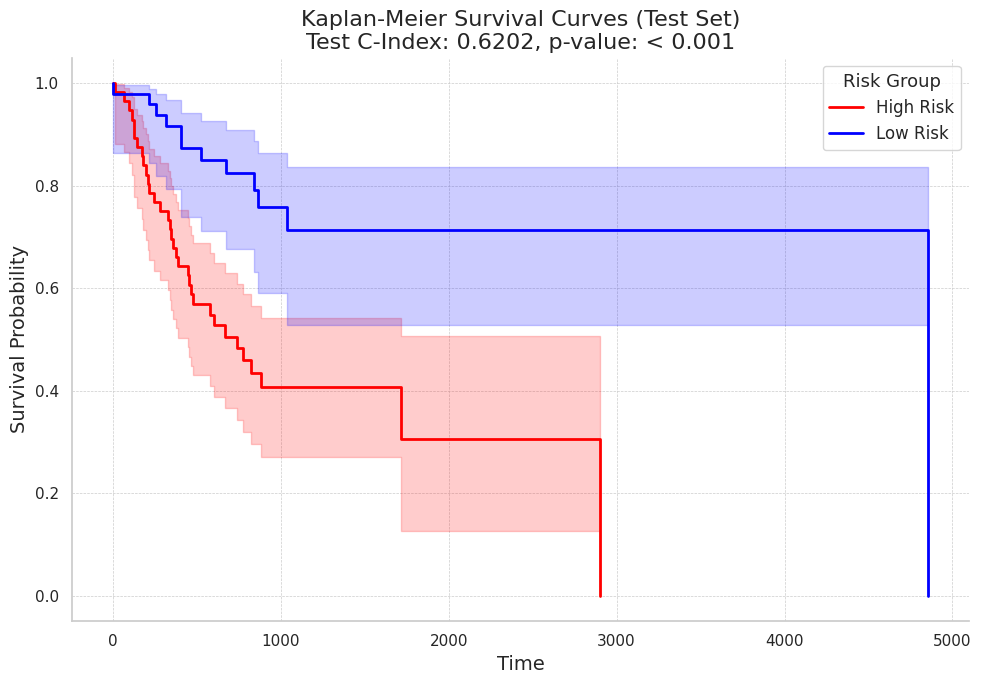

In [30]:
# -------------------------------------------
# Additional Imports Needed
# -------------------------------------------
import seaborn as sns
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test
import matplotlib.pyplot as plt

# Set Seaborn style
sns.set(style="whitegrid")

# -------------------------------------------
# Optimal Threshold Selection and Kaplan-Meier Plotting for Test Set
# -------------------------------------------

print("\nOptimal Threshold Selection and Kaplan-Meier Plotting for Test Set with Group Size Restriction...\n")

# Prepare data
risk_scores_test = risk_test  # Risk scores from the model on test set
durations_test = durations_test  # Durations on test set
events_test = events_test.astype(bool)  # Events on test set

# Use negative risk scores for proper ordering in concordance index calculation
# This is consistent with your base script
c_index_test = concordance_index_censored(
    events_test,
    durations_test,
    -risk_scores_test  # Use negative risk scores
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# Search for the optimal threshold
unique_risk_scores_test = np.sort(np.unique(risk_scores_test))

# Initialize variables
best_threshold_test = None
min_p_value_test = 1.0

# Minimum group size (at least 25% of patients in each group)
total_patients = len(risk_scores_test)
min_group_size = total_patients * 0.25

# For each possible threshold, compute the log-rank test p-value
for threshold in unique_risk_scores_test[1:-1]:
    # Assign patients to groups
    is_high_risk = risk_scores_test <= threshold  # High risk have lower risk scores
    is_low_risk = risk_scores_test > threshold

    # Calculate group sizes
    group_high_size = is_high_risk.sum()
    group_low_size = is_low_risk.sum()

    # Ensure each group has at least the minimum number of patients
    if group_high_size < min_group_size or group_low_size < min_group_size:
        continue  # Skip thresholds that result in small groups

    # Check if both groups have events
    if events_test[is_high_risk].sum() == 0 or events_test[is_low_risk].sum() == 0:
        continue  # Skip thresholds where one group has no events

    # Perform log-rank test
    results_test = logrank_test(
        durations_test[is_high_risk],
        durations_test[is_low_risk],
        event_observed_A=events_test[is_high_risk],
        event_observed_B=events_test[is_low_risk]
    )
    p_value_test = results_test.p_value

    # Update the best threshold if p-value is lower
    if p_value_test < min_p_value_test:
        min_p_value_test = p_value_test
        best_threshold_test = threshold

# Check if a valid threshold was found
if best_threshold_test is None:
    print("No valid threshold found that satisfies the group size restriction.")
else:
    # Assign patients to groups based on the best threshold
    is_high_risk = risk_scores_test <= best_threshold_test  # High risk have lower risk scores
    is_low_risk = risk_scores_test > best_threshold_test

    # Confirm that the high-risk group has shorter survival times
    median_survival_high = np.median(durations_test[is_high_risk])
    median_survival_low = np.median(durations_test[is_low_risk])

    print(f"Median survival time - High Risk: {median_survival_high}")
    print(f"Median survival time - Low Risk: {median_survival_low}")

    # Ensure high-risk group has shorter survival times
    if median_survival_high >= median_survival_low:
        print("Warning: High-risk group does not have shorter median survival time compared to low-risk group.")
        # You may choose to investigate further or adjust the thresholding method

    print(f"Optimal threshold for risk score on test set: {best_threshold_test:.4f}")

    # Format p-value as per your request
    if min_p_value_test < 0.001:
        p_value_formatted = "< 0.001"
    else:
        p_value_formatted = f"{min_p_value_test:.3f}"
    print(f"Minimum p-value from log-rank test on test set: {p_value_formatted}")

    # Create a DataFrame for plotting
    test_data = pd.DataFrame({
        'duration': durations_test,
        'event': events_test,
        'group': np.where(is_high_risk, 'High Risk', 'Low Risk')
    })

    # Kaplan-Meier fitting and plotting using Seaborn
    kmf_high_test = KaplanMeierFitter()
    kmf_low_test = KaplanMeierFitter()

    plt.figure(figsize=(10, 7))

    # Fit the models
    kmf_high_test.fit(
        test_data['duration'][test_data['group'] == 'High Risk'],
        event_observed=test_data['event'][test_data['group'] == 'High Risk'],
        label='High Risk'
    )
    kmf_low_test.fit(
        test_data['duration'][test_data['group'] == 'Low Risk'],
        event_observed=test_data['event'][test_data['group'] == 'Low Risk'],
        label='Low Risk'
    )

    # Plot the survival curves with confidence intervals (error bands)
    ax = kmf_high_test.plot(ci_show=True, ci_alpha=0.2, linewidth=2, color='red')
    kmf_low_test.plot(ax=ax, ci_show=True, ci_alpha=0.2, linewidth=2, color='blue')

    # Customize the plot using Seaborn aesthetics
    sns.despine()

    # Add c-index and p-value to the plot
    plt.title('Kaplan-Meier Survival Curves (Test Set)\nTest C-Index: {:.4f}, p-value: {}'.format(c_index_test, p_value_formatted), fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Survival Probability', fontsize=14)
    plt.legend(title='Risk Group', fontsize=12, title_fontsize=13)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()


#    UNIVARIATE ANALYSIS

In [67]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes' is your input DataFrame
clinical_data_test = clinical_data_yes.copy()

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

#clinical_data_test['HPV.status'] = clinical_data_test['HPV.status'].replace({'positive': 1, 'negative': 0})

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print(clinical_data_test['age_of_patient'])

# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'
]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print(X.iloc[42])

X_copy = X.copy()

# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(X, event))
X_train_df, X_test_df = X.iloc[train_idx], X.iloc[test_idx]
y_train_event, y_test_event = event[train_idx], event[test_idx]
y_train_time, y_test_time = time[train_idx], time[test_idx]

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

# -------------------------------------------
# Univariate Analysis
# -------------------------------------------

print("\nStarting Univariate Analysis...\n")

# Combine numerical and categorical columns for univariate analysis
all_features = numerical_columns + categorical_columns

# Initialize a dictionary to store results
univariate_results = {}

# Iterate through each feature
for feature in all_features:
    print(f"Analyzing Variable: {feature}")
    
    # Prepare feature-specific data
    X_univ = X[[feature]].copy()
    
    # If the feature is numerical, ensure it's scaled
    if feature in numerical_columns:
        # Already scaled in X, no action needed
        pass
    else:
        # Categorical feature: ensure it's integer-encoded
        X_univ[feature] = X_univ[feature].astype(int)
    
    # Split the data into training and testing sets using the existing indices
    X_train_univ = X_univ.iloc[train_idx].values.astype(np.float32)
    X_test_univ = X_univ.iloc[test_idx].values.astype(np.float32)
    y_train_univ_durations = durations_train
    y_train_univ_events = events_train
    y_test_univ_durations = y_test_time.astype(np.float32)
    y_test_univ_events = y_test_event.astype(np.int64)
    
    # Initialize KFold Cross-Validation
    kf_univ = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores_univ = []
    
    print(f"Starting 5-Fold Cross-Validation for {feature}...\n")
    
    for fold_univ, (train_idx_cv_univ, val_idx_cv_univ) in enumerate(kf_univ.split(X_train_univ)):
        print(f"Variable: {feature} | Fold {fold_univ + 1}")
        
        # Split data
        X_train_cv_univ = X_train_univ[train_idx_cv_univ]
        y_train_cv_durations_univ = y_train_univ_durations[train_idx_cv_univ]
        y_train_cv_events_univ = y_train_univ_events[train_idx_cv_univ]
        
        X_val_cv_univ = X_train_univ[val_idx_cv_univ]
        y_val_cv_durations_univ = y_train_univ_durations[val_idx_cv_univ]
        y_val_cv_events_univ = y_train_univ_events[val_idx_cv_univ]
        
        # Define the network architecture for univariate analysis
        # Using a simple network since there's only one input feature
        net_univ = tt.practical.MLPVanilla(
            in_features=1,
            num_nodes=[16, 8],  # Smaller network for univariate
            out_features=1,
            batch_norm=False,
            dropout=0.2,
            output_bias=False
        )
        
        # Initialize CoxPH model for this fold
        optimizer_univ = tt.optim.Adam(lr=1e-3)
        cox_ph_univ = CoxPH(net_univ, optimizer_univ)
        
        # Fit the model
        cox_ph_univ.fit(
            X_train_cv_univ,
            (y_train_cv_events_univ, y_train_cv_durations_univ),
            batch_size=32,
            epochs=100,
            verbose=False
        )
        
        # Predict risk scores on validation set
        risk_val_univ = cox_ph_univ.predict(X_val_cv_univ).squeeze()
        
        # Compute C-Index
        c_index_univ = concordance_index_censored(
            y_val_cv_events_univ.astype(bool),
            y_val_cv_durations_univ,
            -risk_val_univ  # Use negative risk for proper ordering
        )[0]
        
        print(f"Variable: {feature} | Fold {fold_univ + 1} C-Index: {c_index_univ:.4f}\n")
        
        c_index_scores_univ.append(c_index_univ)
    
    # Calculate Cross-Validation Mean and Uncertainty for the feature
    c_index_mean_univ = np.mean(c_index_scores_univ)
    c_index_std_univ = np.std(c_index_scores_univ)
    c_index_ci_lower_univ = np.percentile(c_index_scores_univ, 2.5)
    c_index_ci_upper_univ = np.percentile(c_index_scores_univ, 97.5)
    
    print(f"Variable: {feature} | Cross-Validation C-Index: {c_index_mean_univ:.4f} ± {c_index_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_ci_lower_univ:.4f}, {c_index_ci_upper_univ:.4f}]\n")
    
    # Evaluate on Test Set
    # Initialize and train CoxPH model on the entire training set for the feature
    net_final_univ = tt.practical.MLPVanilla(
        in_features=1,
        num_nodes=[16, 8],
        out_features=1,
        batch_norm=False,
        dropout=0.2,
        output_bias=False
    )
    
    optimizer_final_univ = tt.optim.Adam(lr=1e-3)
    cox_ph_final_univ = CoxPH(net_final_univ, optimizer_final_univ)
    
    # Fit the model
    cox_ph_final_univ.fit(
        X_train_univ,
        (y_train_univ_events, y_train_univ_durations),
        batch_size=32,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on test set
    risk_test_univ = cox_ph_final_univ.predict(X_test_univ).squeeze()
    
    # Compute C-Index on Test Set
    c_index_test_univ = concordance_index_censored(
        y_test_univ_events.astype(bool),
        y_test_univ_durations,
        -risk_test_univ  # Use negative risk for proper ordering
    )[0]
    
    print(f"Variable: {feature} | Test C-Index: {c_index_test_univ:.4f}\n")
    
    # Bootstrapping for Test C-Index Uncertainty
    n_bootstraps_univ = 1000
    c_index_bootstrap_univ = []
    
    print(f"Variable: {feature} | Starting Bootstrapping for Test C-Index Uncertainty...\n")
    
    for i_univ in range(n_bootstraps_univ):
        # Resample test set with replacement
        indices_univ = np.random.choice(len(X_test_univ), size=len(X_test_univ), replace=True)
        X_test_bs_univ = X_test_univ[indices_univ]
        durations_test_bs_univ = y_test_univ_durations[indices_univ]
        events_test_bs_univ = y_test_univ_events[indices_univ]
        
        # Predict risk scores
        risk_bs_univ = cox_ph_final_univ.predict(X_test_bs_univ).squeeze()
        
        # Compute C-Index
        c_index_bs_univ = concordance_index_censored(
            events_test_bs_univ.astype(bool),
            durations_test_bs_univ,
            -risk_bs_univ  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap_univ.append(c_index_bs_univ)
        
        # Optional: Print progress every 100 iterations
        if (i_univ + 1) % 100 == 0:
            print(f"Variable: {feature} | Bootstrap {i_univ + 1}/{n_bootstraps_univ} completed.")
    
    # Calculate Bootstrapped C-Index Statistics for the feature
    c_index_test_mean_univ = np.mean(c_index_bootstrap_univ)
    c_index_test_std_univ = np.std(c_index_bootstrap_univ)
    c_index_test_ci_lower_univ = np.percentile(c_index_bootstrap_univ, 2.5)
    c_index_test_ci_upper_univ = np.percentile(c_index_bootstrap_univ, 97.5)
    
    print(f"Variable: {feature} | Test C-Index with Bootstrapping: {c_index_test_mean_univ:.4f} ± {c_index_test_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_test_ci_lower_univ:.4f}, {c_index_test_ci_upper_univ:.4f}]\n")
    
    # Store the results
    univariate_results[feature] = {
        'Cross_Validation_Mean_C_Index': c_index_mean_univ,
        'Cross_Validation_STD': c_index_std_univ,
        'Cross_Validation_CI_Lower': c_index_ci_lower_univ,
        'Cross_Validation_CI_Upper': c_index_ci_upper_univ,
        'Test_C_Index': c_index_test_univ,
        'Test_CI_Mean': c_index_test_mean_univ,
        'Test_CI_STD': c_index_test_std_univ,
        'Test_CI_Lower': c_index_test_ci_lower_univ,
        'Test_CI_Upper': c_index_test_ci_upper_univ
    }

print("\nUnivariate Analysis Completed.\n")

# Optionally, convert the results to a DataFrame for better visualization
univariate_results_df = pd.DataFrame(univariate_results).T
print("Univariate Analysis Results:")
print(univariate_results_df)


0      62.521561
1      59.299110
2      54.636550
3      63.477070
4      38.694045
         ...    
523    45.360712
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 528, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.201689
patient.lymphnodes_ratio_positive_by_he                                   1.059172
age_of_patient                                                            1.429534
patient.tobacco_smoking_history                                           1.307350
patient.year_of_tobacco_smoking_onset                                    -1.070625
patient.number_pack_years_smoked                                          1.269487
patient.stopped_smoking_year                                              1.360174
patient.frequency_of_alcohol_consumption                                 -0.362455
patient.amount_of_alcohol_consumption_per_day                            -0.224637
patient.stage_ev

KeyboardInterrupt: 

In [ ]:
display_scrollable_dataframe(univariate_results_df)

,Cross_Validation_Mean_C_Index,Cross_Validation_STD,Cross_Validation_CI_Lower,Cross_Validation_CI_Upper,Test_C_Index,Test_CI_Mean,Test_CI_STD,Test_CI_Lower,Test_CI_Upper
patient.lymphnodes_ratio_positive_by_ihc,0.497120,0.028231,0.465459,0.539306,0.474299,0.475734,0.043027,0.391549,0.561097
patient.lymphnodes_ratio_positive_by_he,0.511512,0.038074,0.468427,0.563130,0.525341,0.525899,0.046135,0.428529,0.614029
age_of_patient,0.478579,0.061804,0.404608,0.552651,0.517254,0.521191,0.059491,0.402580,0.638501
patient.tobacco_smoking_history,0.487574,0.044060,0.426826,0.552155,0.566319,0.566517,0.050559,0.462390,0.666069
patient.year_of_tobacco_smoking_onset,0.507956,0.018470,0.485514,0.533706,0.395758,0.394752,0.046502,0.311932,0.492600
patient.number_pack_years_smoked,0.540745,0.062595,0.458118,0.632918,0.435478,0.439414,0.046981,0.350390,0.535232
patient.stopped_smoking_year,0.455833,0.040355,0.408454,0.520552,0.412293,0.412310,0.040252,0.337743,0.493661
patient.frequency_of_alcohol_consumption,0.505904,0.019297,0.479371,0.525331,0.470345,0.470001,0.045631,0.383462,0.562113
patient.amount_of_alcohol_consumption_per_day,0.534571,0.030635,0.502526,0.581652,0.475737,0.475203,0.047642,0.385696,0.570835
patient.stage_event.tnm_categories.pathologic_categories.pathologic_T,0.545998,0.064128,0.475990,0.628368,0.598850,0.598089,0.045958,0.511924,0.686003


In [ ]:
a = univariate_results_df.copy()

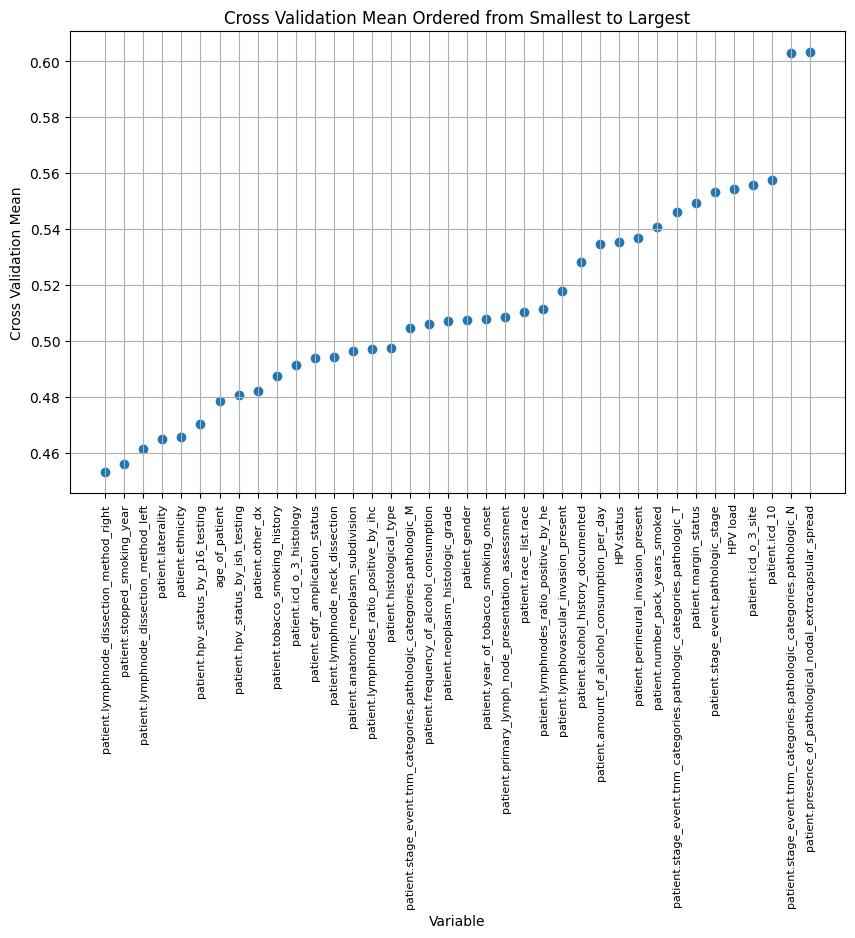

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sort the DataFrame by the 'Cross_Validation_Mean' column in ascending order
univariate_results_df_sorted = a.sort_values(by='Cross_Validation_Mean_C_Index')

# Plot the sorted 'Cross_Validation_Mean' values with variable names as labels
# Plot the sorted 'Cross_Validation_Mean' values as dots with smaller font for variable names
plt.figure(figsize=(10, 6))
plt.scatter(range(len(univariate_results_df_sorted)), univariate_results_df_sorted['Cross_Validation_Mean_C_Index'])
plt.xticks(range(len(univariate_results_df_sorted)), univariate_results_df_sorted.index, rotation=90, fontsize=8)
plt.xlabel('Variable')
plt.ylabel('Cross Validation Mean')
plt.title('Cross Validation Mean Ordered from Smallest to Largest')
plt.grid()
plt.show()


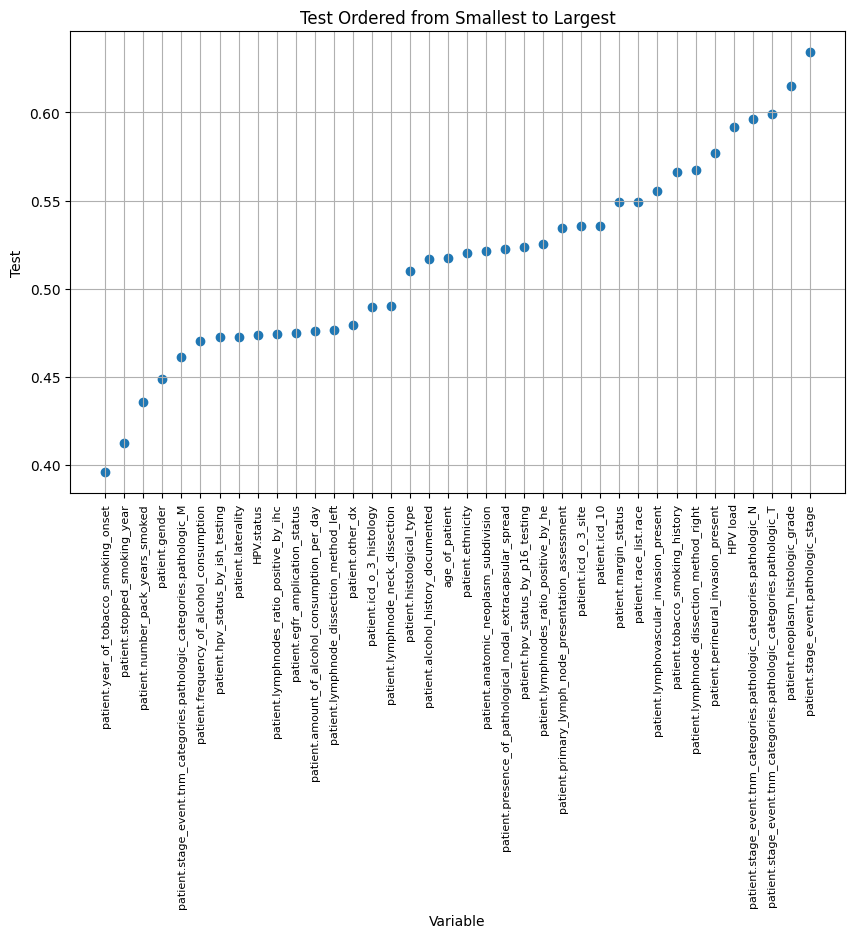

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sort the DataFrame by the 'Cross_Validation_Mean' column in ascending order
univariate_results_df_sorted = a.sort_values(by='Test_C_Index')

# Plot the sorted 'Cross_Validation_Mean' values with variable names as labels
# Plot the sorted 'Cross_Validation_Mean' values as dots with smaller font for variable names
plt.figure(figsize=(10, 6))
plt.scatter(range(len(univariate_results_df_sorted)), univariate_results_df_sorted['Test_C_Index'])
plt.xticks(range(len(univariate_results_df_sorted)), univariate_results_df_sorted.index, rotation=90, fontsize=8)
plt.xlabel('Variable')
plt.ylabel('Test')
plt.title('Test Ordered from Smallest to Largest')
plt.grid()
plt.show()

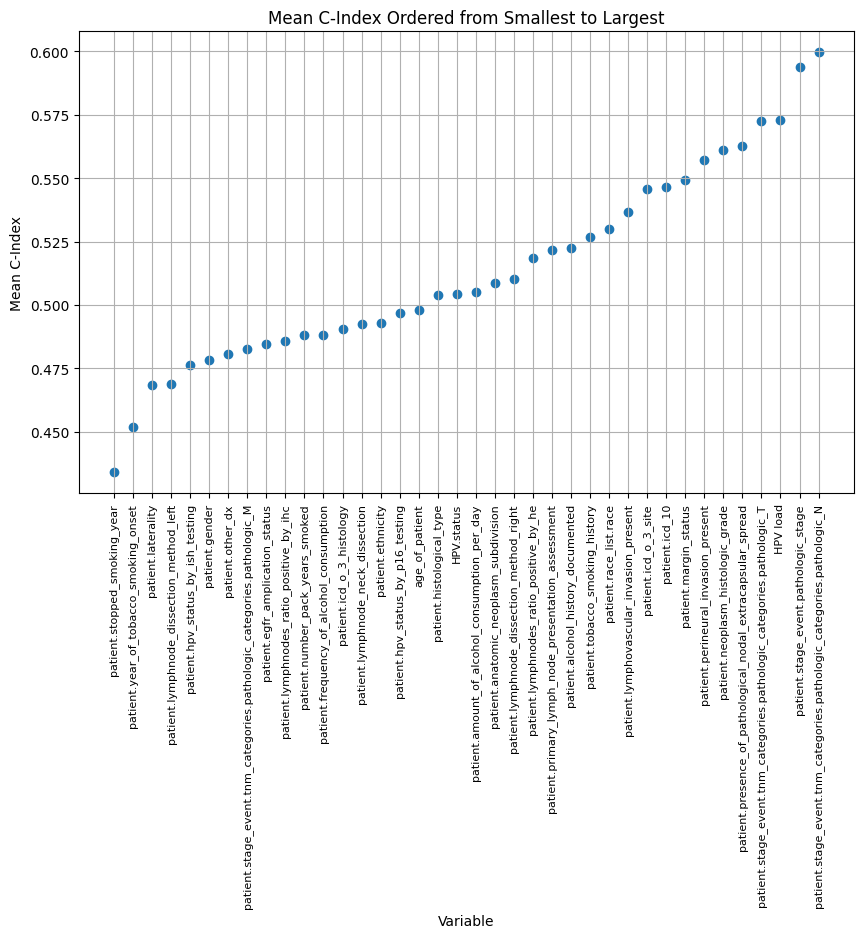

In [ ]:
# Create a new column for the mean of Cross_Validation_Mean_C_Index and Test_C_Index
a['Mean_C_Index'] = a[['Cross_Validation_Mean_C_Index', 'Test_C_Index']].mean(axis=1)


# Sort the DataFrame by the new 'Mean_C_Index' column in ascending order
univariate_results_df_sorted = a.sort_values(by='Mean_C_Index')

# Plot the sorted 'Mean_C_Index' values with variable names as labels
plt.figure(figsize=(10, 6))
plt.scatter(range(len(univariate_results_df_sorted)), univariate_results_df_sorted['Mean_C_Index'])
plt.xticks(range(len(univariate_results_df_sorted)), univariate_results_df_sorted.index, rotation=90, fontsize=8)
plt.xlabel('Variable')
plt.ylabel('Mean C-Index')
plt.title('Mean C-Index Ordered from Smallest to Largest')
plt.grid()
plt.show()

Testing with values that had a test score above 55

Values: pathologic stage, neoplasm histologic grade, T stage, N stage, HPV load, prineural invadion present, lymphnode dissection method right, tobacco smoking history, lymphovascular invasion present. 

In [35]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, StratifiedShuffleSplit
import torchtuples as tt
import warnings
import random

# Suppress warnings
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Assume 'clinical_data_yes' is your input DataFrame
clinical_data_test = clinical_data_yes.copy()

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

#clinical_data_test['HPV.status'] = clinical_data_test['HPV.status'].replace({'positive': 1, 'negative': 0})

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print(clinical_data_test['age_of_patient'])




# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'

]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

#X = X[['patient.stage_event.pathologic_stage', 'patient.neoplasm_histologic_grade','patient.stage_event.tnm_categories.pathologic_categories.pathologic_T','patient.stage_event.tnm_categories.pathologic_categories.pathologic_N','HPV load','patient.perineural_invasion_present','patient.lymphnode_dissection_method_right','patient.tobacco_smoking_history','patient.lymphovascular_invasion_present']]
print(X.iloc[42])

X_copy = X.copy()

# -------------------------------------------
# Data Splitting
# -------------------------------------------

# Stratified split to maintain event proportion
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(sss.split(X, event))
X_train_df, X_test_df = X.iloc[train_idx], X.iloc[test_idx]
y_train_event, y_test_event = event[train_idx], event[test_idx]
y_train_time, y_test_time = time[train_idx], time[test_idx]

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
#categorical_columns = list(categorical_cols)
#numerical_columns = num_cols

categorical_columns = ['patient.neoplasm_histologic_grade',
                       'patient.perineural_invasion_present',
                       'patient.lymphnode_dissection_method_right',
                       'patient.lymphovascular_invasion_present']

numerical_columns = [
    'patient.tobacco_smoking_history',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.pathologic_stage',
    'HPV load'

]

categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")


0      62.521561
1      59.299110
2      54.636550
3      63.477070
4      38.694045
         ...    
523    45.360712
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 528, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.201689
patient.lymphnodes_ratio_positive_by_he                                   1.059172
age_of_patient                                                            1.429534
patient.tobacco_smoking_history                                           1.307350
patient.year_of_tobacco_smoking_onset                                    -1.070625
patient.number_pack_years_smoked                                          1.269487
patient.stopped_smoking_year                                              1.360174
patient.frequency_of_alcohol_consumption                                 -0.362455
patient.amount_of_alcohol_consumption_per_day                            -0.224637
patient.stage_ev

# Best subset risk score analysis and json saving

In [28]:
univariate_analysis_df = pd.read_csv("analysis.csv")

leave_one_out_analysis_df = pd.read_csv("leave_one_out_analysis.csv")
permutation_importance_df = pd.read_csv("permutation_importance_analysis.csv")

univariate_results_df = pd.read_csv("univariate_results.csv")
leave_one_out_results_df = pd.read_csv("leave_one_out_results.csv")
permutation_importance_results_df = pd.read_csv("permutation_importance_results.csv")


def set_unnamed_as_index(results_df):
    if 'Unnamed: 0' in results_df.columns:
        results_df = results_df.set_index('Unnamed: 0')
    return results_df

univariate_results_df = set_unnamed_as_index(univariate_results_df)
leave_one_out_results_df = set_unnamed_as_index(leave_one_out_results_df)
permutation_importance_results_df = set_unnamed_as_index(permutation_importance_results_df)



In [29]:
def get_analysis_stats(analysis_df):
    # Maximum Test_C_Index and corresponding variable
    max_test_c_index = analysis_df['Test_C_Index'].max()
    best_test_var = analysis_df.loc[analysis_df['Test_C_Index'].idxmax(), 'var_name']
    print("Max Test_C_Index is:", max_test_c_index)
    print("With the selected column:", best_test_var)

    # Maximum Cross_Validation_Mean_C_Index and corresponding variable
    max_cv_mean_c_index = analysis_df['Cross_Validation_Mean_C_Index'].max()
    best_cv_var = analysis_df.loc[analysis_df['Cross_Validation_Mean_C_Index'].idxmax(), 'var_name']
    print("Max Cross_Validation_Mean_C_Index is:", max_cv_mean_c_index)
    print("With the selected column:", best_cv_var)

    # Maximum average of Test_C_Index and Cross_Validation_Mean_C_Index
    analysis_df['Average_C_Index'] = analysis_df[['Cross_Validation_Mean_C_Index', 'Test_C_Index']].mean(axis=1)
    max_avg_c_index = analysis_df['Average_C_Index'].max()
    best_avg_var = analysis_df.loc[analysis_df['Average_C_Index'].idxmax(), 'var_name']
    print("Max average of C-Indices is:", max_avg_c_index)
    print("With the selected column:", best_avg_var)

In [30]:
# Create the cross_validation_report column
univariate_results_df['cross_validation_report'] = (
    univariate_results_df['Cross_Validation_Mean_C_Index'].round(4).astype(str) +
    ' ± ' +
    univariate_results_df['Cross_Validation_STD'].round(4).astype(str)
)

# Create the test_C_report column
univariate_results_df['test_C_report'] = (
    univariate_results_df['Test_C_Index'].round(4).astype(str) +
    ' ± ' +
    univariate_results_df['Test_CI_STD'].round(4).astype(str)
)

In [31]:
# Print the indexes of the DataFrame
print(univariate_results_df.index.to_list())
all_var = ['patient.lymphnodes_ratio_positive_by_ihc', 'patient.lymphnodes_ratio_positive_by_he', 'age_of_patient', 'patient.tobacco_smoking_history', 'patient.year_of_tobacco_smoking_onset', 'patient.number_pack_years_smoked', 'patient.stopped_smoking_year', 'patient.frequency_of_alcohol_consumption', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M', 'patient.stage_event.pathologic_stage', 'HPV load', 'patient.histological_type', 'patient.gender', 'patient.race_list.race', 'patient.icd_o_3_site', 'patient.icd_o_3_histology', 'patient.icd_10', 'patient.anatomic_neoplasm_subdivision', 'patient.laterality', 'patient.primary_lymph_node_presentation_assessment', 'patient.lymphnode_neck_dissection', 'patient.lymphnode_dissection_method_left', 'patient.lymphnode_dissection_method_right', 'patient.margin_status', 'patient.presence_of_pathological_nodal_extracapsular_spread', 'patient.lymphovascular_invasion_present', 'patient.perineural_invasion_present', 'patient.neoplasm_histologic_grade', 'patient.alcohol_history_documented', 'patient.other_dx', 'patient.ethnicity', 'patient.hpv_status_by_p16_testing', 'patient.hpv_status_by_ish_testing', 'patient.egfr_amplication_status', 'HPV.status']

['patient.lymphnodes_ratio_positive_by_ihc', 'patient.lymphnodes_ratio_positive_by_he', 'age_of_patient', 'patient.tobacco_smoking_history', 'patient.year_of_tobacco_smoking_onset', 'patient.number_pack_years_smoked', 'patient.stopped_smoking_year', 'patient.frequency_of_alcohol_consumption', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M', 'patient.stage_event.pathologic_stage', 'HPV load', 'patient.histological_type', 'patient.gender', 'patient.race_list.race', 'patient.icd_o_3_site', 'patient.icd_o_3_histology', 'patient.icd_10', 'patient.anatomic_neoplasm_subdivision', 'patient.laterality', 'patient.primary_lymph_node_presentation_assessment', 'patient.lymphnode_neck_dissection', 'patient.lymphnode_dissection_method_left', 'patient.lymphnode_dissection_method_right',

In [32]:
display_scrollable_dataframe(univariate_results_df,max_rows=50)

,Cross_Validation_Mean_C_Index,Cross_Validation_STD,Cross_Validation_CI_Lower,Cross_Validation_CI_Upper,Test_C_Index,Test_CI_Mean,Test_CI_STD,Test_CI_Lower,Test_CI_Upper,cross_validation_report,test_C_report
Unnamed: 0,,,,,,,,,,,
patient.lymphnodes_ratio_positive_by_ihc,0.517291,0.045513,0.470107,0.586645,0.496917,0.498273,0.045489,0.402746,0.582598,0.5173 ± 0.0455,0.4969 ± 0.0455
patient.lymphnodes_ratio_positive_by_he,0.533153,0.048685,0.480082,0.594374,0.540323,0.540995,0.044661,0.452597,0.624444,0.5332 ± 0.0487,0.5403 ± 0.0447
age_of_patient,0.512614,0.040673,0.457852,0.558122,0.563093,0.563317,0.051167,0.460978,0.667107,0.5126 ± 0.0407,0.5631 ± 0.0512
patient.tobacco_smoking_history,0.451440,0.059514,0.352504,0.509368,0.461338,0.463740,0.051963,0.367845,0.565407,0.4514 ± 0.0595,0.4613 ± 0.052
patient.year_of_tobacco_smoking_onset,0.483929,0.063560,0.413520,0.567541,0.389469,0.388732,0.044814,0.304037,0.479900,0.4839 ± 0.0636,0.3895 ± 0.0448
patient.number_pack_years_smoked,0.534903,0.049547,0.474703,0.602277,0.436433,0.435155,0.045200,0.346463,0.526324,0.5349 ± 0.0495,0.4364 ± 0.0452
patient.stopped_smoking_year,0.476135,0.018987,0.456674,0.505592,0.520161,0.523111,0.044693,0.432441,0.609719,0.4761 ± 0.019,0.5202 ± 0.0447
patient.frequency_of_alcohol_consumption,0.522457,0.044797,0.450882,0.576611,0.501898,0.501088,0.046441,0.411814,0.600237,0.5225 ± 0.0448,0.5019 ± 0.0464
patient.amount_of_alcohol_consumption_per_day,0.516160,0.060464,0.429634,0.576111,0.553843,0.554025,0.048867,0.456001,0.644978,0.5162 ± 0.0605,0.5538 ± 0.0489


In [33]:
display_scrollable_dataframe(univariate_analysis_df)

,Unnamed: 0,Threshold,Type,Cross_Validation_Mean_C_Index,Test_C_Index,var_name
0,0,45,Any,0.575267,0.692850,selected_columns_any_45
1,1,45,Cross,0.568299,0.684505,selected_columns_cross_45
2,2,45,Test,0.595381,0.747266,selected_columns_test_45
3,3,46,Any,0.577672,0.692850,selected_columns_any_46
4,4,46,Cross,0.568299,0.684505,selected_columns_cross_46
5,5,46,Test,0.574246,0.672396,selected_columns_test_46
6,6,47,Any,0.604479,0.670164,selected_columns_any_47
7,7,47,Cross,0.571547,0.711477,selected_columns_cross_47
8,8,47,Test,0.580688,0.702439,selected_columns_test_47
9,9,48,Any,0.601943,0.670035,selected_columns_any_48


univariate analysis

In [34]:
get_analysis_stats(univariate_analysis_df)

Max Test_C_Index is: 0.7897381795376137
With the selected column: selected_columns_any_52
Max Cross_Validation_Mean_C_Index is: 0.616142239702707
With the selected column: selected_columns_test_53
Max average of C-Indices is: 0.6991304575473358
With the selected column: selected_columns_any_52


In [35]:
#Test_C_Index
cross_val_indexes = list(univariate_results_df[univariate_results_df['Cross_Validation_Mean_C_Index'] > 0.52].index)
test_c_indexes = list(univariate_results_df[univariate_results_df['Test_C_Index'] > 0.52].index)
max_test_list = list(set(cross_val_indexes + test_c_indexes))
uni_test = max_test_list
print("Max test indexes")
print(max_test_list)
print(len(max_test_list))

#Cross_C_Index
max_cross_list = list(univariate_results_df[univariate_results_df['Test_C_Index'] > 0.53].index)
uni_cross = max_cross_list
print("Max cross indexes:")
print(max_cross_list)
print(len(max_cross_list))

#Average_C_Index
cross_val_indexes = list(univariate_results_df[univariate_results_df['Cross_Validation_Mean_C_Index'] > 0.52].index)
test_c_indexes = list(univariate_results_df[univariate_results_df['Test_C_Index'] > 0.52].index)
max_average_list = list(set(cross_val_indexes + test_c_indexes))
print("Max test indexes")
print(max_average_list)
print(len(max_average_list))



Max test indexes
['patient.stopped_smoking_year', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'age_of_patient', 'patient.alcohol_history_documented', 'patient.anatomic_neoplasm_subdivision', 'patient.number_pack_years_smoked', 'patient.presence_of_pathological_nodal_extracapsular_spread', 'patient.lymphovascular_invasion_present', 'patient.margin_status', 'patient.laterality', 'patient.primary_lymph_node_presentation_assessment', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.lymphnodes_ratio_positive_by_he', 'patient.icd_o_3_site', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.pathologic_stage', 'patient.hpv_status_by_ish_testing', 'patient.race_list.race', 'patient.frequency_of_alcohol_consumption', 'HPV load', 'patient.icd_10', 'patient.perineural_invasion_present']
22
Max cross indexes:
['patient.lymphnodes_ratio_positive_by_he', 'age_of_patient', 'patient.amount_of_alcohol_consumption_per_day',

In [39]:
#Doing a quick performance analysis here
s_test = ['patient.lymphovascular_invasion_present', 'patient.number_pack_years_smoked', 'patient.lymphnodes_ratio_positive_by_he', 'patient.frequency_of_alcohol_consumption', 'HPV load', 'patient.alcohol_history_documented', 'patient.race_list.race', 'patient.presence_of_pathological_nodal_extracapsular_spread', 'patient.stage_event.pathologic_stage', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.anatomic_neoplasm_subdivision', 'patient.hpv_status_by_ish_testing', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.icd_o_3_site', 'patient.margin_status', 'patient.icd_10', 'patient.stopped_smoking_year', 'patient.primary_lymph_node_presentation_assessment', 'age_of_patient', 'patient.laterality', 'patient.perineural_invasion_present', 'patient.amount_of_alcohol_consumption_per_day']
s_cross = ['patient.lymphnodes_ratio_positive_by_he', 'age_of_patient', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.stage_event.pathologic_stage', 'HPV load', 'patient.race_list.race', 'patient.primary_lymph_node_presentation_assessment', 'patient.margin_status', 'patient.presence_of_pathological_nodal_extracapsular_spread', 'patient.lymphovascular_invasion_present', 'patient.perineural_invasion_present', 'patient.hpv_status_by_ish_testing']
14
#run_deep_learning_fix(run_selected=True, selected=s_cross)



14

leave one out analysis

In [37]:
get_analysis_stats(leave_one_out_analysis_df)

Max Test_C_Index is: 0.7756681077460508
With the selected column: selected_columns_cross_-0.030
Max Cross_Validation_Mean_C_Index is: 0.6012709749680372
With the selected column: selected_columns_any_-0.030
Max average of C-Indices is: 0.6844604154983875
With the selected column: selected_columns_cross_-0.030


In [38]:
display_scrollable_dataframe(leave_one_out_results_df)

,CV_C_Index_With_Feature_Mean,CV_C_Index_With_Feature_STD,CV_CI_With_Feature_Lower,CV_CI_With_Feature_Upper,CV_C_Index_Without_Feature_Mean,CV_C_Index_Without_Feature_STD,CV_CI_Without_Feature_Lower,CV_CI_Without_Feature_Upper,CV_C_Index_Difference,Test_C_Index_With_Feature_Mean,Test_C_Index_With_Feature_STD,Test_CI_With_Feature_Lower,Test_CI_With_Feature_Upper,Test_C_Index_Without_Feature_Mean,Test_C_Index_Without_Feature_STD,Test_CI_Without_Feature_Lower,Test_CI_Without_Feature_Upper,Test_C_Index_Difference
Unnamed: 0,,,,,,,,,,,,,,,,,,
patient.lymphnodes_ratio_positive_by_ihc,0.567226,0.055908,0.474717,0.625953,0.556099,0.053965,0.489584,0.639548,0.011127,0.698433,0.045965,0.606285,0.788706,0.663686,0.047475,0.566964,0.748169,0.034747
patient.lymphnodes_ratio_positive_by_he,0.567226,0.055908,0.474717,0.625953,0.568134,0.063922,0.481717,0.639974,-0.000907,0.698433,0.045965,0.606285,0.788706,0.650002,0.051545,0.547215,0.752608,0.048431
age_of_patient,0.567226,0.055908,0.474717,0.625953,0.555377,0.057111,0.489353,0.640149,0.011849,0.698433,0.045965,0.606285,0.788706,0.713941,0.051878,0.610138,0.806282,-0.015508
patient.tobacco_smoking_history,0.567226,0.055908,0.474717,0.625953,0.588013,0.060045,0.510528,0.673798,-0.020787,0.698433,0.045965,0.606285,0.788706,0.705421,0.039477,0.623602,0.780009,-0.006988
patient.year_of_tobacco_smoking_onset,0.567226,0.055908,0.474717,0.625953,0.586358,0.092108,0.431769,0.681767,-0.019131,0.698433,0.045965,0.606285,0.788706,0.723130,0.044460,0.629507,0.799730,-0.024697
patient.number_pack_years_smoked,0.567226,0.055908,0.474717,0.625953,0.550497,0.076864,0.455848,0.665107,0.016729,0.698433,0.045965,0.606285,0.788706,0.688443,0.048729,0.592509,0.777090,0.009990
patient.stopped_smoking_year,0.567226,0.055908,0.474717,0.625953,0.548532,0.075452,0.423923,0.630314,0.018695,0.698433,0.045965,0.606285,0.788706,0.656169,0.045681,0.569707,0.744547,0.042264
patient.frequency_of_alcohol_consumption,0.567226,0.055908,0.474717,0.625953,0.579763,0.042370,0.530350,0.639644,-0.012537,0.698433,0.045965,0.606285,0.788706,0.736831,0.047452,0.639705,0.827341,-0.038398
patient.amount_of_alcohol_consumption_per_day,0.567226,0.055908,0.474717,0.625953,0.590652,0.075928,0.477515,0.677743,-0.023426,0.698433,0.045965,0.606285,0.788706,0.709678,0.045309,0.621274,0.793094,-0.011245


In [40]:
#CV_C_Index_Difference
#Test_C_Index_Difference

#Test_C_Index
max_test_list = list(leave_one_out_results_df[leave_one_out_results_df['CV_C_Index_Difference'] > -0.030].index)
loo_test = max_test_list
print("Max test indexes")
print(max_test_list)
print(len(max_test_list))

#Cross_C_Index
cross_val_indexes = list(leave_one_out_results_df[leave_one_out_results_df['CV_C_Index_Difference'] > -0.030].index)
test_c_indexes = list(leave_one_out_results_df[leave_one_out_results_df['Test_C_Index_Difference'] > -0.030].index)
max_cross_list = list(set(cross_val_indexes + test_c_indexes))
loo_cross = max_cross_list
print("Max cross indexes:")
print(max_cross_list)
print(len(max_cross_list))

#Average_C_Index
max_average_list = list(leave_one_out_results_df[leave_one_out_results_df['CV_C_Index_Difference'] > -0.030].index)
print("Max test indexes")
print(max_average_list)
print(len(max_average_list))

Max test indexes
['patient.lymphnodes_ratio_positive_by_ihc', 'patient.lymphnodes_ratio_positive_by_he', 'age_of_patient', 'patient.tobacco_smoking_history', 'patient.year_of_tobacco_smoking_onset', 'patient.number_pack_years_smoked', 'patient.stopped_smoking_year', 'patient.frequency_of_alcohol_consumption', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M', 'HPV load', 'patient.histological_type', 'patient.gender', 'patient.race_list.race', 'patient.icd_o_3_site', 'patient.icd_o_3_histology', 'patient.icd_10', 'patient.anatomic_neoplasm_subdivision', 'patient.laterality', 'patient.primary_lymph_node_presentation_assessment', 'patient.lymphnode_neck_dissection', 'patient.lymphnode_dissection_method_left', 'patient.lymphnode_dissection_method_right', 'patient.margin_status

In [41]:
s_test = ['patient.lymphnodes_ratio_positive_by_ihc', 'patient.lymphnodes_ratio_positive_by_he', 'age_of_patient', 'patient.tobacco_smoking_history', 'patient.year_of_tobacco_smoking_onset', 'patient.number_pack_years_smoked', 'patient.stopped_smoking_year', 'patient.frequency_of_alcohol_consumption', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M', 'HPV load', 'patient.histological_type', 'patient.gender', 'patient.race_list.race', 'patient.icd_o_3_site', 'patient.icd_o_3_histology', 'patient.icd_10', 'patient.anatomic_neoplasm_subdivision', 'patient.laterality', 'patient.primary_lymph_node_presentation_assessment', 'patient.lymphnode_neck_dissection', 'patient.lymphnode_dissection_method_left', 'patient.lymphnode_dissection_method_right', 'patient.margin_status', 'patient.presence_of_pathological_nodal_extracapsular_spread', 'patient.lymphovascular_invasion_present', 'patient.perineural_invasion_present', 'patient.neoplasm_histologic_grade', 'patient.alcohol_history_documented', 'patient.hpv_status_by_p16_testing', 'patient.hpv_status_by_ish_testing', 'patient.egfr_amplication_status', 'HPV.status']

s_cross = ['patient.lymphovascular_invasion_present', 'patient.icd_o_3_histology', 'patient.number_pack_years_smoked', 'patient.lymphnodes_ratio_positive_by_he', 'patient.frequency_of_alcohol_consumption', 'HPV load', 'patient.gender', 'patient.alcohol_history_documented', 'HPV.status', 'patient.race_list.race', 'patient.presence_of_pathological_nodal_extracapsular_spread', 'patient.stage_event.pathologic_stage', 'patient.neoplasm_histologic_grade', 'patient.tobacco_smoking_history', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.anatomic_neoplasm_subdivision', 'patient.egfr_amplication_status', 'patient.hpv_status_by_ish_testing', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.icd_o_3_site', 'patient.histological_type', 'patient.lymphnode_neck_dissection', 'patient.margin_status', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M', 'patient.icd_10', 'patient.stopped_smoking_year', 'patient.primary_lymph_node_presentation_assessment', 'patient.lymphnodes_ratio_positive_by_ihc', 'patient.lymphnode_dissection_method_right', 'age_of_patient', 'patient.other_dx', 'patient.hpv_status_by_p16_testing', 'patient.lymphnode_dissection_method_left', 'patient.laterality', 'patient.perineural_invasion_present', 'patient.amount_of_alcohol_consumption_per_day', 'patient.year_of_tobacco_smoking_onset']

#run_deep_learning_fix(run_selected=True, selected=s_test)

permutation importance analysis

In [42]:
get_analysis_stats(permutation_importance_df)

Max Test_C_Index is: 0.7756681077460508
With the selected column: selected_columns_cross_-0.030
Max Cross_Validation_Mean_C_Index is: 0.605216847224901
With the selected column: selected_columns_test_0.020
Max average of C-Indices is: 0.6844604154983875
With the selected column: selected_columns_cross_-0.030


In [43]:
#Cross_Validation_Mean_Decrease
#Test_Mean_Decrease

#Test_C_Index
max_test_list = list(permutation_importance_results_df[permutation_importance_results_df['Cross_Validation_Mean_Decrease'] > -0.030].index)
pi_test = max_test_list
print("Max test indexes")
print(max_test_list)
print(len(max_test_list))

#Cross_C_Index
max_cross_list = list(permutation_importance_results_df[permutation_importance_results_df['Test_Mean_Decrease'] > 0.020].index)
pi_cross = max_cross_list
print("Max cross indexes:")
print(max_cross_list)
print(len(max_cross_list))

#Average_C_Index
max_average_list = list(permutation_importance_results_df[permutation_importance_results_df['Cross_Validation_Mean_Decrease'] > -0.030].index)
print("Max test indexes")
print(max_average_list)
print(len(max_average_list))

Max test indexes
['patient.lymphnodes_ratio_positive_by_ihc', 'patient.lymphnodes_ratio_positive_by_he', 'age_of_patient', 'patient.tobacco_smoking_history', 'patient.year_of_tobacco_smoking_onset', 'patient.number_pack_years_smoked', 'patient.stopped_smoking_year', 'patient.frequency_of_alcohol_consumption', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M', 'patient.stage_event.pathologic_stage', 'HPV load', 'patient.histological_type', 'patient.gender', 'patient.race_list.race', 'patient.icd_o_3_site', 'patient.icd_o_3_histology', 'patient.icd_10', 'patient.anatomic_neoplasm_subdivision', 'patient.laterality', 'patient.primary_lymph_node_presentation_assessment', 'patient.lymphnode_neck_dissection', 'patient.lymphnode_dissection_method_left', 'patient.lymphnode_dissecti

In [44]:
s_test = ['patient.lymphnodes_ratio_positive_by_ihc', 'patient.lymphnodes_ratio_positive_by_he', 'age_of_patient', 'patient.tobacco_smoking_history', 'patient.year_of_tobacco_smoking_onset', 'patient.number_pack_years_smoked', 'patient.stopped_smoking_year', 'patient.frequency_of_alcohol_consumption', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M', 'patient.stage_event.pathologic_stage', 'HPV load', 'patient.histological_type', 'patient.gender', 'patient.race_list.race', 'patient.icd_o_3_site', 'patient.icd_o_3_histology', 'patient.icd_10', 'patient.anatomic_neoplasm_subdivision', 'patient.laterality', 'patient.primary_lymph_node_presentation_assessment', 'patient.lymphnode_neck_dissection', 'patient.lymphnode_dissection_method_left', 'patient.lymphnode_dissection_method_right', 'patient.margin_status', 'patient.presence_of_pathological_nodal_extracapsular_spread', 'patient.lymphovascular_invasion_present', 'patient.perineural_invasion_present', 'patient.neoplasm_histologic_grade', 'patient.alcohol_history_documented', 'patient.other_dx', 'patient.ethnicity', 'patient.hpv_status_by_p16_testing', 'patient.hpv_status_by_ish_testing', 'patient.egfr_amplication_status', 'HPV.status']

s_cross = ['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.stage_event.pathologic_stage', 'patient.anatomic_neoplasm_subdivision', 'patient.presence_of_pathological_nodal_extracapsular_spread']

#run_deep_learning_fix(run_selected=True, selected=s_cross)

In [75]:
display_scrollable_dataframe(permutation_importance_results_df)

,Cross_Validation_Mean_Decrease,Cross_Validation_STD,Cross_Validation_CI_Lower,Cross_Validation_CI_Upper,Test_Mean_Decrease,Test_STD,Test_CI_Lower,Test_CI_Upper
Unnamed: 0,,,,,,,,
patient.lymphnodes_ratio_positive_by_ihc,0.097092,0.066668,-0.023411,0.202803,0.010541,0.008442,-0.007116,0.025866
patient.lymphnodes_ratio_positive_by_he,0.073864,0.056662,-0.007525,0.171311,-0.003012,0.007383,-0.017351,0.011658
age_of_patient,0.076093,0.055448,-0.037625,0.152164,-0.006983,0.008585,-0.022770,0.010211
patient.tobacco_smoking_history,0.099477,0.050817,-0.001275,0.183607,0.015674,0.015081,-0.009286,0.042019
patient.year_of_tobacco_smoking_onset,0.098776,0.062488,0.008779,0.170102,-0.006845,0.007396,-0.019699,0.009760
patient.number_pack_years_smoked,0.084033,0.068987,-0.024686,0.170492,0.001219,0.008059,-0.016224,0.015180
patient.stopped_smoking_year,0.060169,0.052227,-0.015489,0.161191,-0.003510,0.008948,-0.019473,0.013805
patient.frequency_of_alcohol_consumption,0.076413,0.044599,0.013378,0.166865,-0.007827,0.009656,-0.025664,0.009061
patient.amount_of_alcohol_consumption_per_day,0.072244,0.052381,-0.009772,0.139324,-0.002723,0.005538,-0.012607,0.007839


In [35]:
def run_deep_learning_fix(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, StratifiedShuffleSplit
    import torchtuples as tt
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # DO THE WSI AND PATIENT SELECTION FROM HERE, SO THAT WE DO NOT HAVE PROBLEMS WITH WEIRD HIDDEN BARCODE INTERACTIONS

    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test_filtered = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    clinical_data_test = clinical_data_test_filtered.copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Load Split Information and Assign Splits
    # -------------------------------------------

    # Load the split JSON data
    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    split_df = pd.DataFrame(split_entries)

    # Verify that 'file_name' exists in split_df
    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")

    # Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

    # Create a mapping from 'patient.bcr_patient_barcode' to 'split'
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))

    # Map the 'split' to the clinical data
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

    # Check for any missing splits
    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        # Optionally, you can decide how to handle these entries
        clinical_data_test = clinical_data_test.dropna(subset=['split'])

    # Create boolean masks for training and testing sets
    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'

    # Print the number of train and test samples
    print(f"Number of training samples: {train_mask.sum()}")
    print(f"Number of testing samples: {test_mask.sum()}")

    # After mapping, drop 'patient.bcr_patient_barcode' and 'split' as they are no longer needed
    clinical_data_test = clinical_data_test.drop(columns=['patient.bcr_patient_barcode', 'split'])

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

    print(clinical_data_test['age_of_patient'])

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    if run_selected == True:
        # Update numerical_columns to be the intersection of num_cols and selected
        num_cols = list(set(num_cols) & set(selected))

    # Convert numerical columns to float and handle conversion errors
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Identify categorical columns (object dtype)
    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

    if run_selected == True:
        # Update categorical_columns to be the intersection of categorical_cols and selected
        categorical_cols = list(set(categorical_cols) & set(selected))

    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype and then to codes
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    time_copy = time.copy()
    event_copy = event.copy()

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols is not empty
    if num_cols:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not clinical_data_test[categorical_cols].empty:
        X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    else:
        X = clinical_data_test[categorical_cols]  # Only categorical features are present

    print(X.iloc[42])

    X_copy = X.copy()

    # -------------------------------------------
    # Data Splitting Using Split Mapping
    # -------------------------------------------

    # Reset indices to ensure alignment
    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)

    # Create masks based on the splits
    train_mask = train_mask.reset_index(drop=True)
    test_mask = test_mask.reset_index(drop=True)

    # Create train and test sets based on the masks
    X_train_df = X[train_mask]
    X_test_df = X[test_mask]
    y_train_event = event[train_mask]
    y_test_event = event[test_mask]
    y_train_time = time[train_mask]
    y_test_time = time[test_mask]

    # Verify the lengths to prevent IndexError
    print(f"Training set size: {X_train_df.shape[0]}")
    print(f"Testing set size: {X_test_df.shape[0]}")

    # -------------------------------------------
    # Preparing Data for FTTransformer
    # -------------------------------------------

    # Identify numerical and categorical columns after preprocessing
    categorical_columns = list(categorical_cols)
    numerical_columns = num_cols

    # Prepare data for FTTransformer
    def prepare_data(X, categorical_columns, numerical_columns):
        # For categorical features
        cat_features = X[categorical_columns]
        # For numerical features
        num_features = X[numerical_columns]
        return cat_features, num_features

    X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
    X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

    print("Unique categories in training set after split:", X_train_cat.nunique())
    print("Unique categories in test set after split:", X_test_cat.nunique())

    # -------------------------------------------
    # Convert Data to PyTorch Tensors
    # -------------------------------------------

    # Convert data to torch tensors
    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)

    X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
    X_train_num_tensor = to_tensor(X_train_num, torch.float32)
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
    X_test_num_tensor = to_tensor(X_test_num, torch.float32)

    # -------------------------------------------
    # Initialize FTTransformer (Pretrained)
    # -------------------------------------------

    # Get the number of unique categories for each categorical column
    categories = [int(max(X_train_cat[col].max(), X_test_cat[col].max()) + 1) for col in categorical_columns]

    # Check if the lengths of categories and categorical_columns match
    print("Categories Length:", len(categories))
    print("Categorical Columns Length:", len(categorical_columns))

    print("X_train_cat_tensor shape:", X_train_cat_tensor.shape)
    print("X_train_num_tensor shape:", X_train_num_tensor.shape)

    # Print the maximum values in X_train_cat and X_test_cat before creating categories
    print("Max values in X_train_cat for each categorical column:", X_train_cat.max())
    print("Max values in X_test_cat for each categorical column:", X_test_cat.max())

    # Print the categories list to see the maximum indices allowed for each categorical feature
    print("Categories (maximum indices allowed for each feature):", categories)

    # Instantiate the FTTransformer model
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    ft_transformer = FTTransformer(
        categories=categories,                              # List of unique category counts
        num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
        dim=192,                                            # Embedding dimension size, adjust as needed
        depth=6,                                            # Number of transformer layers
        heads=8,                                            # Number of attention heads
        attn_dropout=0.1,                                   # Dropout for attention layers
        ff_dropout=0.1                                      # Dropout for feedforward layers
    ).to(device)

    # Load pretrained weights if available
    # Uncomment and modify the following line if you have pretrained weights
    # ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

    # Set the model to evaluation mode
    ft_transformer.eval()

    # -------------------------------------------
    # Generating Embeddings
    # -------------------------------------------

    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
            numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()

    # Generate embeddings for training and test sets
    train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
    test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

    # Verify the shape of the embeddings
    print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
    print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

    # -------------------------------------------
    # Define the Neural Network Architecture for CoxPH
    # -------------------------------------------

    # Define the neural network architecture
    num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

    out_features = 1  # Output dimension (single risk score)
    batch_norm = True  # Use batch normalization
    dropout = 0.4  # Dropout rate to prevent overfitting
    output_bias = False  # Bias term in the output layer

    # Initialize the MLPVanilla model with reduced input features 
    net = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )

    # Initialize the CoxPH model with the network and optimizer
    optimizer = tt.optim.Adam(lr=1e-3)
    cox_ph = CoxPH(net, optimizer)

    # -------------------------------------------
    # CoxPH Analysis with 5-Fold Cross-Validation
    # -------------------------------------------

    # Prepare survival data
    durations_train = y_train_time.astype(np.float32)
    events_train = y_train_event.astype(np.int64)

    # Ensure embeddings are contiguous
    train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

    # Initialize KFold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores = []

    print("\nStarting 5-Fold Cross-Validation...\n")

    for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
        print(f"Fold {fold + 1}")

        # Split data
        X_train_cv = train_embeddings[train_idx_cv]
        y_train_cv_durations = durations_train[train_idx_cv]
        y_train_cv_events = events_train[train_idx_cv]

        X_val_cv = train_embeddings[val_idx_cv]
        y_val_cv_durations = durations_train[val_idx_cv]
        y_val_cv_events = events_train[val_idx_cv]

        # Ensure arrays are contiguous
        X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
        y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
        y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)

        # Initialize a new instance of the network for each fold to avoid weight sharing
        net_cv = tt.practical.MLPVanilla(
            in_features=train_embeddings.shape[1],
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )

        # Initialize CoxPH model for this fold
        optimizer_cv = tt.optim.Adam(lr=1e-3)
        cox_ph_cv = CoxPH(net_cv, optimizer_cv)

        # Fit the model
        cox_ph_cv.fit(
            X_train_cv,
            (y_train_cv_events, y_train_cv_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )

        # Predict risk scores on validation set
        risk_val = cox_ph_cv.predict(X_val_cv).squeeze()

        # Compute C-Index
        c_index = concordance_index_censored(
            y_val_cv_events.astype(bool),
            y_val_cv_durations,
            -risk_val  # Use negative risk for proper ordering
        )[0]

        print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")

        c_index_scores.append(c_index)

    # Calculate Cross-Validation Mean and Uncertainty
    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)

    print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

    # -------------------------------------------
    # Train Final CoxPH Model on Entire Training Set
    # -------------------------------------------

    print("\nTraining Final CoxPH Model on Entire Training Set...\n")

    # Ensure arrays are contiguous
    train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
    durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
    events_train = np.ascontiguousarray(events_train, dtype=np.int64)

    # Fit the final model on the entire training set
    cox_ph.fit(
        train_embeddings,
        (events_train, durations_train),
        batch_size=64,
        epochs=100,
        verbose=False
    )

    print("Final CoxPH Model Trained Successfully.")

    # -------------------------------------------
    # Evaluate on Test Set
    # -------------------------------------------

    print("\nEvaluating on Test Set...\n")

    # Prepare test data
    durations_test = y_test_time.astype(np.float32)
    events_test = y_test_event.astype(np.int64)
    test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

    # Predict risk scores on test set
    risk_test = cox_ph.predict(test_embeddings).squeeze()

    # Compute C-Index on Test Set
    c_index_test = concordance_index_censored(
        events_test.astype(bool),
        durations_test,
        -risk_test  # Use negative risk for proper ordering
    )[0]

    print(f"Test C-Index: {c_index_test:.4f}")

    # -------------------------------------------
    # Bootstrapping for Test C-Index Uncertainty
    # -------------------------------------------

    n_bootstraps = 1000
    c_index_bootstrap = []

    print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

    for i in range(n_bootstraps):
        # Resample test set with replacement
        indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
        X_test_bs = test_embeddings[indices]
        durations_test_bs = durations_test[indices]
        events_test_bs = events_test[indices]

        # Predict risk scores
        risk_bs = cox_ph.predict(X_test_bs).squeeze()

        # Compute C-Index
        c_index_bs = concordance_index_censored(
            events_test_bs.astype(bool),
            durations_test_bs,
            -risk_bs  # Use negative risk for proper ordering
        )[0]

        c_index_bootstrap.append(c_index_bs)

        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

    # Calculate Bootstrapped C-Index Statistics
    c_index_test_mean = np.mean(c_index_bootstrap)
    c_index_test_std = np.std(c_index_bootstrap)
    c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
    c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

    print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

    return c_index_mean, c_index_test_mean


In [31]:
run_deep_learning_fix(run_selected=False, selected="_")

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
0      62.521561
1      59.299110
2      54.636550
3      63.477070
5      77.344285
         ...    
522    75.857632
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 450, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.059391
patient.lymphnodes_ratio_positive_by_he                                   0.918626
age_of_patient                                                           -0.659876
patient.tobacco_smoking_history                                          -0.296069
patient.year_of_tobacco_smoking_onset                                     0.957086
patient.number_pack_years_smoked                                          1.394549
patient.stopped_smoking_year                                             -0.728405
patient.frequency_of_alcohol_consumption                                  1

(0.5875403836361752, 0.6924724023329777)

In [47]:
def run_deep_learning_strat_old(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, StratifiedShuffleSplit
    import torchtuples as tt
    import warnings
    import random

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes' is your input DataFrame

    #clinical_data_test = clinical_data_yes_id.drop(columns=['patient.bcr_patient_barcode']).copy()


    #DO THE WSI AND PATIENT SELECTION FROM HERE, SO THAT WE DO NOT HAVE PROBLEMS WITH WEIRD HIDDEN BARCODE INTERATIONS

    #CHECK FOR THE LAST CELL THAT DOES THIS~~~~~~~

    clinical_data_test = clinical_data_yes_id.copy()

    # Path to the JSON file containing survival data (assumed to contain WSI embeddings)
    json_path = 'svs_patient_map_PFI.json'  # Replace with your actual path if different

    # Check if JSON file exists
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

    # Load the JSON data into a list of dictionaries
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Extract 'patient.bcr_patient_barcode' by taking the first 12 characters of 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)
    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test_filtered = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ]




    clinical_data_test = clinical_data_test_filtered
    clinical_data_test = clinical_data_test.drop(columns=['patient.bcr_patient_barcode'])

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # Remove clinical stage system related columns
    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    #clinical_data_test['HPV.status'] = clinical_data_test['HPV.status'].replace({'positive': 1, 'negative': 0})

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

    print(clinical_data_test['age_of_patient'])




    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'

    ]




    if run_selected == True:
        # Update numerical_columns to be the intersection of num_cols and selected
        num_cols = list(set(num_cols) & set(selected))

   

























    # Convert numerical columns to float and handle conversion errors
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Identify categorical columns (object dtype)
    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns




    if run_selected == True:
        # Update categorical_columns to be the intersection of categorical_cols and selected
        categorical_cols = list(set(categorical_cols) & set(selected))







    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype and then to codes
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    time_copy = time.copy()
    event_copy = event.copy()

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols is not empty
    if num_cols:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)


    # Combine scaled numerical features and categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not clinical_data_test[categorical_cols].empty:
        X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    else:
        X = clinical_data_test[categorical_cols]  # Only categorical features are present


    print(X.iloc[42])

    X_copy = X.copy()

    # -------------------------------------------
    # Data Splitting
    # -------------------------------------------

    # Stratified split to maintain event proportion
    sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
    train_idx, test_idx = next(sss.split(X, event))
    X_train_df, X_test_df = X.iloc[train_idx], X.iloc[test_idx]
    y_train_event, y_test_event = event[train_idx], event[test_idx]
    y_train_time, y_test_time = time[train_idx], time[test_idx]

    # -------------------------------------------
    # Preparing Data for FTTransformer
    # -------------------------------------------

    # Identify numerical and categorical columns after preprocessing
    categorical_columns = list(categorical_cols)
    numerical_columns = num_cols

    # Prepare data for FTTransformer
    def prepare_data(X, categorical_columns, numerical_columns):
        # For categorical features
        cat_features = X[categorical_columns]
        # For numerical features
        num_features = X[numerical_columns]
        return cat_features, num_features

    X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
    X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

    print("Unique categories in training set after split:", X_train_cat.nunique())
    print("Unique categories in test set after split:", X_test_cat.nunique())

    # -------------------------------------------
    # Convert Data to PyTorch Tensors
    # -------------------------------------------

    # Convert data to torch tensors
    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)

    X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
    X_train_num_tensor = to_tensor(X_train_num, torch.float32)
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
    X_test_num_tensor = to_tensor(X_test_num, torch.float32)

    # -------------------------------------------
    # Initialize FTTransformer (Pretrained)
    # -------------------------------------------

    # Get the number of unique categories for each categorical column
    #categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]
    categories = [int(max(X_train_cat[col].max(), X_test_cat[col].max()) + 1) for col in categorical_columns]

    # Check if the lengths of categories and categorical_columns match
    print("Categories Length:", len(categories))
    print("Categorical Columns Length:", len(categorical_columns))


    print("X_train_cat_tensor shape:", X_train_cat_tensor.shape)
    print("X_train_num_tensor shape:", X_train_num_tensor.shape)

    # Print the maximum values in X_train_cat and X_test_cat before creating categories
    print("Max values in X_train_cat for each categorical column:", X_train_cat.max())
    print("Max values in X_test_cat for each categorical column:", X_test_cat.max())

    # Print the categories list to see the maximum indices allowed for each categorical feature
    print("Categories (maximum indices allowed for each feature):", categories)

    # Instantiate the FTTransformer model
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    ft_transformer = FTTransformer(
        categories=categories,                              # List of unique category counts
        num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
        dim=192,                                            # Embedding dimension size, adjust as needed
        depth=6,                                            # Number of transformer layers
        heads=8,                                            # Number of attention heads
        attn_dropout=0.1,                                   # Dropout for attention layers
        ff_dropout=0.1                                      # Dropout for feedforward layers
    ).to(device)

    # Load pretrained weights if available
    # Uncomment and modify the following line if you have pretrained weights
    # ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

    # Set the model to evaluation mode
    ft_transformer.eval()

    # -------------------------------------------
    # Generating Embeddings
    # -------------------------------------------

    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
            numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()

    # Generate embeddings for training and test sets
    train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
    test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

    # Verify the shape of the embeddings
    print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
    print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

    # -------------------------------------------
    # Define the Neural Network Architecture for CoxPH
    # -------------------------------------------

    # Define the neural network architecture
    num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

    out_features = 1  # Output dimension (single risk score)
    batch_norm = True  # Use batch normalization
    dropout = 0.4  # Dropout rate to prevent overfitting
    output_bias = False  # Bias term in the output layer

    # Initialize the MLPVanilla model with reduced input features 
    net = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )

    # Initialize the CoxPH model with the network and optimizer
    optimizer = tt.optim.Adam(lr=1e-3)
    cox_ph = CoxPH(net, optimizer)

    # -------------------------------------------
    # CoxPH Analysis with 5-Fold Cross-Validation
    # -------------------------------------------

    # Prepare survival data
    durations_train = y_train_time.astype(np.float32)
    events_train = y_train_event.astype(np.int64)

    # Ensure embeddings are contiguous
    train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

    # Initialize KFold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores = []

    print("\nStarting 5-Fold Cross-Validation...\n")

    for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
        print(f"Fold {fold + 1}")
        
        # Split data
        X_train_cv = train_embeddings[train_idx_cv]
        y_train_cv_durations = durations_train[train_idx_cv]
        y_train_cv_events = events_train[train_idx_cv]
        
        X_val_cv = train_embeddings[val_idx_cv]
        y_val_cv_durations = durations_train[val_idx_cv]
        y_val_cv_events = events_train[val_idx_cv]
        
        # Ensure arrays are contiguous
        X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
        y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
        y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
        
        # Initialize a new instance of the network for each fold to avoid weight sharing
        net_cv = tt.practical.MLPVanilla(
            in_features=train_embeddings.shape[1],
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )
        
        # Initialize CoxPH model for this fold
        optimizer_cv = tt.optim.Adam(lr=1e-3)
        cox_ph_cv = CoxPH(net_cv, optimizer_cv)
        
        # Fit the model
        cox_ph_cv.fit(
            X_train_cv,
            (y_train_cv_events, y_train_cv_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )
        
        # Predict risk scores on validation set
        risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
        
        # Compute C-Index
        c_index = concordance_index_censored(
            y_val_cv_events.astype(bool),
            y_val_cv_durations,
            -risk_val  # Use negative risk for proper ordering
        )[0]
        
        print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
        
        c_index_scores.append(c_index)

    # Calculate Cross-Validation Mean and Uncertainty
    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)

    print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

    # -------------------------------------------
    # Train Final CoxPH Model on Entire Training Set
    # -------------------------------------------

    print("\nTraining Final CoxPH Model on Entire Training Set...\n")

    # Ensure arrays are contiguous
    train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
    durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
    events_train = np.ascontiguousarray(events_train, dtype=np.int64)

    # Fit the final model on the entire training set
    cox_ph.fit(
        train_embeddings,
        (events_train, durations_train),
        batch_size=64,
        epochs=100,
        verbose=False
    )

    print("Final CoxPH Model Trained Successfully.")

    # -------------------------------------------
    # Evaluate on Test Set
    # -------------------------------------------

    print("\nEvaluating on Test Set...\n")

    # Prepare test data
    durations_test = y_test_time.astype(np.float32)
    events_test = y_test_event.astype(np.int64)
    test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

    # Predict risk scores on test set
    risk_test = cox_ph.predict(test_embeddings).squeeze()

    # Compute C-Index on Test Set
    c_index_test = concordance_index_censored(
        events_test.astype(bool),
        durations_test,
        -risk_test  # Use negative risk for proper ordering
    )[0]

    print(f"Test C-Index: {c_index_test:.4f}")

    # -------------------------------------------
    # Bootstrapping for Test C-Index Uncertainty
    # -------------------------------------------

    n_bootstraps = 1000
    c_index_bootstrap = []

    print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

    for i in range(n_bootstraps):
        # Resample test set with replacement
        indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
        X_test_bs = test_embeddings[indices]
        durations_test_bs = durations_test[indices]
        events_test_bs = events_test[indices]
        
        # Predict risk scores
        risk_bs = cox_ph.predict(X_test_bs).squeeze()
        
        # Compute C-Index
        c_index_bs = concordance_index_censored(
            events_test_bs.astype(bool),
            durations_test_bs,
            -risk_bs  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap.append(c_index_bs)
        
        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

    # Calculate Bootstrapped C-Index Statistics
    c_index_test_mean = np.mean(c_index_bootstrap)
    c_index_test_std = np.std(c_index_bootstrap)
    c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
    c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

    print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

    return c_index_mean, c_index_test_mean


In [48]:
def run_deep_learning_strat(run_selected=False, selected=None, selected_name='_'):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, StratifiedShuffleSplit
    import torchtuples as tt
    import warnings
    import random
    import json
    import seaborn as sns
    from lifelines import KaplanMeierFitter
    from lifelines.statistics import logrank_test
    import matplotlib.pyplot as plt

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set Seaborn style
    sns.set(style="whitegrid")

    # Set random seeds for reproducibility
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # DO THE WSI AND PATIENT SELECTION FROM HERE, SO THAT WE DO NOT HAVE PROBLEMS WITH WEIRD HIDDEN BARCODE INTERACTIONS

    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test_filtered = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    clinical_data_test = clinical_data_test_filtered.copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Load Split Information and Assign Splits
    # -------------------------------------------

    # Load the split JSON data
    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    split_df = pd.DataFrame(split_entries)

    # Verify that 'file_name' exists in split_df
    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")

    # Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

    # Create a mapping from 'patient.bcr_patient_barcode' to 'split'
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))

    # Map the 'split' to the clinical data
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

    # Check for any missing splits
    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        # Optionally, you can decide how to handle these entries
        clinical_data_test = clinical_data_test.dropna(subset=['split'])

    # Create boolean masks for training and testing sets
    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'

    # Print the number of train and test samples
    print(f"Number of training samples: {train_mask.sum()}")
    print(f"Number of testing samples: {test_mask.sum()}")

    # -------------------------------------------
    # Keep 'patient.bcr_patient_barcode' for later use and then drop 'split'
    # -------------------------------------------

    patient_barcodes = clinical_data_test['patient.bcr_patient_barcode'].reset_index(drop=True)

    # After mapping, drop 'split' as it is no longer needed
    clinical_data_test = clinical_data_test.drop(columns=['split'])

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

    print(clinical_data_test['age_of_patient'])

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    if run_selected and selected is not None:
        # Update numerical_columns to be the intersection of num_cols and selected
        num_cols = list(set(num_cols) & set(selected))

    # Convert numerical columns to float and handle conversion errors
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Identify categorical columns (object dtype)
    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

    if run_selected and selected is not None:
        # Update categorical_columns to be the intersection of categorical_cols and selected
        categorical_cols = list(set(categorical_cols) & set(selected))

    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype and then to codes
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    time_copy = time.copy()
    event_copy = event.copy()

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols is not empty
    if num_cols:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not clinical_data_test[categorical_cols].empty:
        X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    else:
        X = clinical_data_test[categorical_cols]  # Only categorical features are present

    print(X.iloc[42])

    X_copy = X.copy()

    # -------------------------------------------
    # Data Splitting Using Split Mapping
    # -------------------------------------------

    # Reset indices to ensure alignment
    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)
    patient_barcodes.reset_index(drop=True, inplace=True)

    # Create masks based on the splits
    train_mask = train_mask.reset_index(drop=True)
    test_mask = test_mask.reset_index(drop=True)

    # Create train and test sets based on the masks
    X_train_df = X[train_mask]
    X_test_df = X[test_mask]
    y_train_event = event[train_mask]
    y_test_event = event[test_mask]
    y_train_time = time[train_mask]
    y_test_time = time[test_mask]
    patient_barcodes_train = patient_barcodes[train_mask]
    patient_barcodes_test = patient_barcodes[test_mask]

    # Verify the lengths to prevent IndexError
    print(f"Training set size: {X_train_df.shape[0]}")
    print(f"Testing set size: {X_test_df.shape[0]}")

    # -------------------------------------------
    # Preparing Data for FTTransformer
    # -------------------------------------------

    # Identify numerical and categorical columns after preprocessing
    categorical_columns = list(categorical_cols)
    numerical_columns = num_cols

    # Prepare data for FTTransformer
    def prepare_data(X, categorical_columns, numerical_columns):
        # For categorical features
        cat_features = X[categorical_columns] if categorical_columns else pd.DataFrame()
        # For numerical features
        num_features = X[numerical_columns] if numerical_columns else pd.DataFrame()
        return cat_features, num_features

    X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
    X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

    print("Unique categories in training set after split:", X_train_cat.nunique())
    print("Unique categories in test set after split:", X_test_cat.nunique())

    # -------------------------------------------
    # Convert Data to PyTorch Tensors
    # -------------------------------------------

    # Convert data to torch tensors
    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)

    X_train_cat_tensor = to_tensor(X_train_cat, torch.long) if not X_train_cat.empty else None
    X_train_num_tensor = to_tensor(X_train_num, torch.float32) if not X_train_num.empty else None
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long) if not X_test_cat.empty else None
    X_test_num_tensor = to_tensor(X_test_num, torch.float32) if not X_test_num.empty else None

    # -------------------------------------------
    # Initialize FTTransformer (Pretrained)
    # -------------------------------------------

    # Get the number of unique categories for each categorical column
    if categorical_columns:
        categories = [int(max(X_train_cat[col].max(), X_test_cat[col].max()) + 1) for col in categorical_columns]
    else:
        categories = []

    # Check if the lengths of categories and categorical_columns match
    print("Categories Length:", len(categories))
    print("Categorical Columns Length:", len(categorical_columns))

    if X_train_cat_tensor is not None:
        print("X_train_cat_tensor shape:", X_train_cat_tensor.shape)
    if X_train_num_tensor is not None:
        print("X_train_num_tensor shape:", X_train_num_tensor.shape)

    # Print the maximum values in X_train_cat and X_test_cat before creating categories
    if categorical_columns:
        print("Max values in X_train_cat for each categorical column:", X_train_cat.max())
        print("Max values in X_test_cat for each categorical column:", X_test_cat.max())
        # Print the categories list to see the maximum indices allowed for each categorical feature
        print("Categories (maximum indices allowed for each feature):", categories)

    # Instantiate the FTTransformer model
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    num_continuous = X_train_num_tensor.shape[1] if X_train_num_tensor is not None else 0

    ft_transformer = FTTransformer(
        categories=categories,                              # List of unique category counts
        num_continuous=num_continuous,                      # Number of continuous features
        dim=192,                                            # Embedding dimension size, adjust as needed
        depth=6,                                            # Number of transformer layers
        heads=8,                                            # Number of attention heads
        attn_dropout=0.1,                                   # Dropout for attention layers
        ff_dropout=0.1                                      # Dropout for feedforward layers
    ).to(device)

    # Load pretrained weights if available
    # Uncomment and modify the following line if you have pretrained weights
    # ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

    # Set the model to evaluation mode
    ft_transformer.eval()

    # -------------------------------------------
    # Generating Embeddings
    # -------------------------------------------

    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            if X_cat.empty:
                categorical = None
            else:
                categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
            if X_num.empty:
                numerical = None
            else:
                numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()

    # Generate embeddings for training and test sets
    train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
    test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

    # Verify the shape of the embeddings
    print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
    print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

    # -------------------------------------------
    # Define the Neural Network Architecture for CoxPH
    # -------------------------------------------

    # Define the neural network architecture
    num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

    out_features = 1  # Output dimension (single risk score)
    batch_norm = True  # Use batch normalization
    dropout = 0.4  # Dropout rate to prevent overfitting
    output_bias = False  # Bias term in the output layer

    # Initialize the MLPVanilla model with reduced input features
    net = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )

    # Initialize the CoxPH model with the network and optimizer
    optimizer = tt.optim.Adam(lr=1e-3)
    cox_ph = CoxPH(net, optimizer)

    # -------------------------------------------
    # CoxPH Analysis with 5-Fold Cross-Validation
    # -------------------------------------------

    # Prepare survival data
    durations_train = y_train_time.astype(np.float32)
    events_train = y_train_event.astype(np.int64)

    # Ensure embeddings are contiguous
    train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

    # Initialize KFold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores = []

    print("\nStarting 5-Fold Cross-Validation...\n")

    for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
        print(f"Fold {fold + 1}")

        # Split data
        X_train_cv = train_embeddings[train_idx_cv]
        y_train_cv_durations = durations_train[train_idx_cv]
        y_train_cv_events = events_train[train_idx_cv]

        X_val_cv = train_embeddings[val_idx_cv]
        y_val_cv_durations = durations_train[val_idx_cv]
        y_val_cv_events = events_train[val_idx_cv]

        # Ensure arrays are contiguous
        X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
        y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
        y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)

        # Initialize a new instance of the network for each fold to avoid weight sharing
        net_cv = tt.practical.MLPVanilla(
            in_features=train_embeddings.shape[1],
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )

        # Initialize CoxPH model for this fold
        optimizer_cv = tt.optim.Adam(lr=1e-3)
        cox_ph_cv = CoxPH(net_cv, optimizer_cv)

        # Fit the model
        cox_ph_cv.fit(
            X_train_cv,
            (y_train_cv_events, y_train_cv_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )

        # Predict risk scores on validation set
        risk_val = cox_ph_cv.predict(X_val_cv).squeeze()

        # Compute C-Index
        c_index = concordance_index_censored(
            y_val_cv_events.astype(bool),
            y_val_cv_durations,
            -risk_val  # Use negative risk for proper ordering
        )[0]

        print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")

        c_index_scores.append(c_index)

    # Calculate Cross-Validation Mean and Uncertainty
    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)

    print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

    # -------------------------------------------
    # Train Final CoxPH Model on Entire Training Set
    # -------------------------------------------

    print("\nTraining Final CoxPH Model on Entire Training Set...\n")

    # Ensure arrays are contiguous
    train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
    durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
    events_train = np.ascontiguousarray(events_train, dtype=np.int64)

    # Fit the final model on the entire training set
    cox_ph.fit(
        train_embeddings,
        (events_train, durations_train),
        batch_size=64,
        epochs=100,
        verbose=False
    )

    print("Final CoxPH Model Trained Successfully.")

    # -------------------------------------------
    # Evaluate on Training Set to Obtain Risk Scores
    # -------------------------------------------

    print("\nEvaluating on Training Set to Obtain Risk Scores...\n")

    # Predict risk scores on training set
    risk_train = cox_ph.predict(train_embeddings).squeeze()

    # Compute C-Index on Training Set
    c_index_train = concordance_index_censored(
        events_train.astype(bool),
        durations_train,
        -risk_train  # Use negative risk for proper ordering
    )[0]

    print(f"Training C-Index: {c_index_train:.4f}")

    # -------------------------------------------
    # Optimal Threshold Selection and Kaplan-Meier Plotting for Training Set
    # -------------------------------------------

    print("\nOptimal Threshold Selection and Kaplan-Meier Plotting for Training Set with Group Size Restriction...\n")

    # Prepare data
    risk_scores_train = risk_train  # Risk scores from the model on training set
    durations_train = durations_train  # Durations on training set
    events_train = events_train.astype(bool)  # Events on training set

    # Use negative risk scores for proper ordering in concordance index calculation
    # This is consistent with your base script
    c_index_train = concordance_index_censored(
        events_train,
        durations_train,
        -risk_scores_train  # Use negative risk scores
    )[0]

    print(f"Training C-Index: {c_index_train:.4f}")

    # Search for the optimal threshold
    unique_risk_scores_train = np.sort(np.unique(risk_scores_train))

    # Initialize variables
    best_threshold_train = None
    min_p_value_train = 1.0

    # Minimum group size (at least 25% of patients in each group)
    total_patients_train = len(risk_scores_train)
    min_group_size_train = total_patients_train * 0.25

    # For each possible threshold, compute the log-rank test p-value
    for threshold in unique_risk_scores_train[1:-1]:
        # Assign patients to groups
        is_high_risk = risk_scores_train <= threshold  # High risk have lower risk scores
        is_low_risk = risk_scores_train > threshold

        # Calculate group sizes
        group_high_size = is_high_risk.sum()
        group_low_size = is_low_risk.sum()

        # Ensure each group has at least the minimum number of patients
        if group_high_size < min_group_size_train or group_low_size < min_group_size_train:
            continue  # Skip thresholds that result in small groups

        # Check if both groups have events
        if events_train[is_high_risk].sum() == 0 or events_train[is_low_risk].sum() == 0:
            continue  # Skip thresholds where one group has no events

        # Perform log-rank test
        results_train = logrank_test(
            durations_train[is_high_risk],
            durations_train[is_low_risk],
            event_observed_A=events_train[is_high_risk],
            event_observed_B=events_train[is_low_risk]
        )
        p_value_train = results_train.p_value

        # Update the best threshold if p-value is lower
        if p_value_train < min_p_value_train:
            min_p_value_train = p_value_train
            best_threshold_train = threshold

    # Check if a valid threshold was found
    if best_threshold_train is None:
        print("No valid threshold found that satisfies the group size restriction.")
        classification_train = np.full(len(risk_scores_train), -1)
    else:
        # Assign patients to groups based on the best threshold
        is_high_risk = risk_scores_train <= best_threshold_train  # High risk have lower risk scores
        is_low_risk = risk_scores_train > best_threshold_train

        # Assign classes: 1 for high risk, 0 for low risk
        classification_train = np.where(is_high_risk, 1, 0)

        # Confirm that the high-risk group has shorter survival times
        median_survival_high = np.median(durations_train[is_high_risk])
        median_survival_low = np.median(durations_train[is_low_risk])

        print(f"Median survival time - High Risk: {median_survival_high}")
        print(f"Median survival time - Low Risk: {median_survival_low}")

        # Ensure high-risk group has shorter survival times
        if median_survival_high >= median_survival_low:
            print("Warning: High-risk group does not have shorter median survival time compared to low-risk group.")
            # You may choose to investigate further or adjust the thresholding method

        print(f"Optimal threshold for risk score on training set: {best_threshold_train:.4f}")

        # Format p-value as per your request
        if min_p_value_train < 0.001:
            p_value_formatted = "< 0.001"
        else:
            p_value_formatted = f"{min_p_value_train:.3f}"
        print(f"Minimum p-value from log-rank test on training set: {p_value_formatted}")

        # Create a DataFrame for plotting
        train_data = pd.DataFrame({
            'duration': durations_train,
            'event': events_train,
            'group': np.where(is_high_risk, 'High Risk', 'Low Risk')
        })

        # Kaplan-Meier fitting and plotting using Seaborn
        kmf_high_train = KaplanMeierFitter()
        kmf_low_train = KaplanMeierFitter()

        plt.figure(figsize=(10, 7))

        # Fit the models
        kmf_high_train.fit(
            train_data['duration'][train_data['group'] == 'High Risk'],
            event_observed=train_data['event'][train_data['group'] == 'High Risk'],
            label='High Risk'
        )
        kmf_low_train.fit(
            train_data['duration'][train_data['group'] == 'Low Risk'],
            event_observed=train_data['event'][train_data['group'] == 'Low Risk'],
            label='Low Risk'
        )

        # Plot the survival curves with confidence intervals (error bands)
        ax = kmf_high_train.plot(ci_show=True, ci_alpha=0.2, linewidth=2, color='red')
        kmf_low_train.plot(ax=ax, ci_show=True, ci_alpha=0.2, linewidth=2, color='blue')

        # Customize the plot using Seaborn aesthetics
        sns.despine()

        # Add c-index and p-value to the plot
        plt.title('Kaplan-Meier Survival Curves (Training Set)\nTraining C-Index: {:.4f}, p-value: {}'.format(c_index_train, p_value_formatted), fontsize=16)
        plt.xlabel('Time', fontsize=14)
        plt.ylabel('Survival Probability', fontsize=14)
        plt.legend(title='Risk Group', fontsize=12, title_fontsize=13)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.tight_layout()
        plt.show()

    # -------------------------------------------
    # Evaluate on Test Set
    # -------------------------------------------

    print("\nEvaluating on Test Set...\n")

    # Prepare test data
    durations_test = y_test_time.astype(np.float32)
    events_test = y_test_event.astype(np.int64)
    test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

    # Predict risk scores on test set
    risk_test = cox_ph.predict(test_embeddings).squeeze()

    # Compute C-Index on Test Set
    c_index_test = concordance_index_censored(
        events_test.astype(bool),
        durations_test,
        -risk_test  # Use negative risk for proper ordering
    )[0]

    print(f"Test C-Index: {c_index_test:.4f}")

    # Since test set classifications are set to -1
    classification_test = np.full(len(risk_test), -1)

    # -------------------------------------------
    # Update JSON File with Classifications
    # -------------------------------------------

    print("\nUpdating JSON File with Classifications...\n")

    # Combine patient barcodes and classifications
    patient_barcodes_combined = pd.concat([patient_barcodes_train, patient_barcodes_test], ignore_index=True)
    classification_combined = np.concatenate([classification_train, classification_test])

    # Create a DataFrame for mapping
    classification_df = pd.DataFrame({
        'patient.bcr_patient_barcode': patient_barcodes_combined,
        selected_name: classification_combined
    })

    # Load the split JSON data again to ensure no changes have been made
    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    split_df = pd.DataFrame(split_entries)

    # Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

    # Merge the classification information
    split_df = split_df.merge(classification_df, on='patient.bcr_patient_barcode', how='left')

    # Fill NaN values in the classification column with -1 (in case any entries were missed)
    split_df[selected_name].fillna(-1, inplace=True)
    split_df[selected_name] = split_df[selected_name].astype(int)

    # Convert the DataFrame back to a list of dictionaries
    updated_split_entries = split_df.drop(columns=['patient.bcr_patient_barcode']).to_dict(orient='records')

    # Save the updated JSON data back to 'svs_patient_map_PFI_DX_split.json'
    with open(split_json_path, 'w') as f:
        json.dump(updated_split_entries, f, indent=4)

    print(f"Updated JSON file saved to '{split_json_path}'.")

    # -------------------------------------------
    # Return C-Index Mean and Test Mean
    # -------------------------------------------

    return c_index_mean, c_index_test_mean


In [ ]:
#run_deep_learning_strat(run_selected=True, selected=uni_test, selected_name='uni_test')
#uni_test
#uni_cross
#loo_test
#loo_cross
#pi_test
#pi_cross

In [49]:
#run_deep_learning_strat(run_selected=True, selected=uni_test,selected_name="uni_test")
#run_deep_learning_fix(run_selected=True, selected=uni_test)

In [50]:
#run_deep_learning_strat(run_selected=True, selected=uni_cross,selected_name="uni_cross")


In [51]:
#run_deep_learning_strat(run_selected=True, selected=all_var,selected_name="all_var")

In [52]:
#run_deep_learning_strat(run_selected=True, selected=loo_test,selected_name="loo_test")
#run_deep_learning_strat(run_selected=True, selected=loo_cross,selected_name="loo_cross")
#run_deep_learning_strat(run_selected=True, selected=pi_test,selected_name="pi_test")
#run_deep_learning_strat(run_selected=True, selected=pi_cross,selected_name="pi_cross")

# Univariate risk score calculation:

In [66]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import json  # For JSON handling
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
import torchtuples as tt
import warnings
import random
import seaborn as sns  # For enhanced plotting aesthetics
import matplotlib.pyplot as plt  # For plotting
from lifelines import KaplanMeierFitter  # For Kaplan-Meier plotting
from lifelines.statistics import logrank_test  # For log-rank test

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Selection and Train/Test Split Using JSON Files
# -------------------------------------------

# Assume 'clinical_data_yes_id' is your input DataFrame with patient IDs
clinical_data_test = clinical_data_yes_id.copy()

# Paths to the JSON files
json_path = 'svs_patient_map_PFI.json'  # Original JSON file
split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

# Check if JSON files exist
if not os.path.exists(json_path):
    raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
if not os.path.exists(split_json_path):
    raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

# Load the original JSON data
with open(json_path, 'r') as f:
    survival_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
wsi_df = pd.DataFrame(survival_entries)

# Verify that 'file_name' column exists
if 'file_name' not in wsi_df.columns:
    raise KeyError("'file_name' column not found in the JSON data.")

# Function to extract 'patient.bcr_patient_barcode' from 'file_name'
def extract_barcode(file_name):
    """
    Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
    Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
    """
    return file_name[:12]

# Extract 'patient.bcr_patient_barcode' in wsi_df
wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

# Convert 'patient.bcr_patient_barcode' to string to ensure consistency
wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

# Adjust the filtering condition based on your actual data structure
wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

# Store the initial row count of clinical_data_test
initial_row_count = clinical_data_test.shape[0]

# Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
clinical_data_test_filtered = clinical_data_test[
    clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
].copy()

clinical_data_test = clinical_data_test_filtered.copy()

# Store the final row count after filtering
final_row_count = clinical_data_test.shape[0]

# Print the results
print("Total rows BEFORE:", initial_row_count)
print("Total rows AFTER:", final_row_count)

assert 1==0

# -------------------------------------------
# Load Split Information and Assign Splits
# -------------------------------------------

# Load the split JSON data
with open(split_json_path, 'r') as f:
    split_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
split_df = pd.DataFrame(split_entries)

# Verify that 'file_name' exists in split_df
if 'file_name' not in split_df.columns:
    raise KeyError("'file_name' column not found in the split JSON data.")

# Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

# Create a mapping from 'patient.bcr_patient_barcode' to 'split'
barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))

# Map the 'split' to the clinical data
clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

# Check for any missing splits
missing_splits = clinical_data_test['split'].isnull().sum()
if missing_splits > 0:
    print(f"Warning: {missing_splits} entries do not have a split assignment.")
    # Optionally, you can decide how to handle these entries
    clinical_data_test = clinical_data_test.dropna(subset=['split'])

# Create boolean masks for training and testing sets
train_mask = clinical_data_test['split'] == 'train'
test_mask = clinical_data_test['split'] == 'test'

# Print the number of train and test samples
print(f"Number of training samples: {train_mask.sum()}")
print(f"Number of testing samples: {test_mask.sum()}")

# -------------------------------------------
# Keep 'patient.bcr_patient_barcode' for later use and then drop 'split'
# -------------------------------------------

patient_barcodes = clinical_data_test['patient.bcr_patient_barcode'].reset_index(drop=True)

# After mapping, drop 'split' as it is no longer needed
clinical_data_test = clinical_data_test.drop(columns=['split'])

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print(clinical_data_test['age_of_patient'])

# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'
]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print(X.iloc[42])

X_copy = X.copy()

# -------------------------------------------
# Data Splitting Using Predefined Split
# -------------------------------------------

# Reset indices to ensure alignment
clinical_data_test.reset_index(drop=True, inplace=True)
X.reset_index(drop=True, inplace=True)
patient_barcodes.reset_index(drop=True, inplace=True)

# Create masks based on the splits
train_mask = train_mask.reset_index(drop=True)
test_mask = test_mask.reset_index(drop=True)

# Create train and test sets based on the masks
X_train_df = X[train_mask]
X_test_df = X[test_mask]
y_train_event = event[train_mask]
y_test_event = event[test_mask]
y_train_time = time[train_mask]
y_test_time = time[test_mask]
patient_barcodes_train = patient_barcodes[train_mask]
patient_barcodes_test = patient_barcodes[test_mask]

# Verify the lengths to prevent IndexError
print(f"Training set size: {X_train_df.shape[0]}")
print(f"Testing set size: {X_test_df.shape[0]}")

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

# -------------------------------------------
# Univariate Analysis
# -------------------------------------------

print("\nStarting Univariate Analysis...\n")

# Combine numerical and categorical columns for univariate analysis
all_features = numerical_columns + categorical_columns

# Initialize a dictionary to store results
univariate_results = {}

# Define a function to perform optimal threshold selection and Kaplan-Meier plotting
def plot_kaplan_meier(durations, events, risk_scores, train_c_index, feature_name, title_suffix=''):
    """
    Performs optimal threshold selection based on log-rank test, stratifies patients,
    and plots Kaplan-Meier survival curves for high-risk and low-risk groups.
    
    Parameters:
        durations (array-like): Survival times.
        events (array-like): Event indicators.
        risk_scores (array-like): Predicted risk scores.
        train_c_index (float): C-Index value for the training set.
        feature_name (str): Name of the feature being analyzed.
        title_suffix (str): Additional string to append to the plot title.
    
    Returns:
        threshold (float): Optimal risk score threshold.
        p_value (float): P-value from log-rank test.
        classification (array-like): Array indicating group assignments (1 for high risk, 0 for low risk).
    """
    unique_risk_scores = np.sort(np.unique(risk_scores))
    
    # Initialize variables
    best_threshold = None
    min_p_value = 1.0
    
    # Minimum group size (at least 25% of patients in each group)
    total_patients = len(risk_scores)
    min_group_size = total_patients * 0.25
    
    # Iterate through possible thresholds to find the one with the lowest p-value
    for threshold in unique_risk_scores[1:-1]:
        # Assign patients to groups
        is_high_risk = risk_scores <= threshold  # High risk have lower risk scores
        is_low_risk = risk_scores > threshold
    
        # Calculate group sizes
        group_high_size = is_high_risk.sum()
        group_low_size = is_low_risk.sum()
    
        # Ensure each group has at least the minimum number of patients
        if group_high_size < min_group_size or group_low_size < min_group_size:
            continue  # Skip thresholds that result in small groups
    
        # Check if both groups have events
        if events[is_high_risk].sum() == 0 or events[is_low_risk].sum() == 0:
            continue  # Skip thresholds where one group has no events
    
        # Perform log-rank test
        results = logrank_test(
            durations[is_high_risk],
            durations[is_low_risk],
            event_observed_A=events[is_high_risk],
            event_observed_B=events[is_low_risk]
        )
        p_value = results.p_value
    
        # Update the best threshold if p-value is lower
        if p_value < min_p_value:
            min_p_value = p_value
            best_threshold = threshold
    
    # Check if a valid threshold was found
    if best_threshold is None:
        print("No valid threshold found that satisfies the group size restriction.")
        classification = np.full(len(risk_scores), -1)
        return None, None, classification
    else:
        # Assign patients to groups based on the best threshold
        is_high_risk = risk_scores <= best_threshold  # High risk have lower risk scores
        is_low_risk = risk_scores > best_threshold
    
        # Assign classes: 1 for high risk, 0 for low risk
        classification = np.where(is_high_risk, 1, 0)
    
        # Confirm that the high-risk group has shorter survival times
        median_survival_high = np.median(durations[is_high_risk])
        median_survival_low = np.median(durations[is_low_risk])
    
        print(f"Median survival time - High Risk: {median_survival_high}")
        print(f"Median survival time - Low Risk: {median_survival_low}")
    
        # Ensure high-risk group has shorter survival times
        if median_survival_high >= median_survival_low:
            print("Warning: High-risk group does not have shorter median survival time compared to low-risk group.")
            # You may choose to investigate further or adjust the thresholding method
    
        print(f"Optimal threshold for risk score: {best_threshold:.4f}")
    
        # Format p-value as per your request
        if min_p_value < 0.001:
            p_value_formatted = "< 0.001"
        else:
            p_value_formatted = f"{min_p_value:.3f}"
        print(f"Minimum p-value from log-rank test: {p_value_formatted}")
    
        # Create a DataFrame for plotting
        data = pd.DataFrame({
            'duration': durations,
            'event': events,
            'group': np.where(classification == 1, 'High Risk', 'Low Risk')
        })
    
        # Initialize Kaplan-Meier Fitter
        kmf_high = KaplanMeierFitter()
        kmf_low = KaplanMeierFitter()
    
        plt.figure(figsize=(10, 7))
    
        # Fit the models
        kmf_high.fit(
            data['duration'][data['group'] == 'High Risk'],
            event_observed=data['event'][data['group'] == 'High Risk'],
            label='High Risk'
        )
        kmf_low.fit(
            data['duration'][data['group'] == 'Low Risk'],
            event_observed=data['event'][data['group'] == 'Low Risk'],
            label='Low Risk'
        )
    
        # Plot the survival curves with confidence intervals (error bands)
        ax = kmf_high.plot(ci_show=True, ci_alpha=0.2, linewidth=2, color='red')
        kmf_low.plot(ax=ax, ci_show=True, ci_alpha=0.2, linewidth=2, color='blue')
    
        # Customize the plot using Seaborn aesthetics
        sns.despine()
    
        # Add c-index and p-value to the plot
        plt.title(f'Kaplan-Meier Survival Curves{title_suffix}\nTrain C-Index: {train_c_index:.4f}, p-value: {p_value_formatted}', fontsize=16)
        plt.xlabel('Time', fontsize=14)
        plt.ylabel('Survival Probability', fontsize=14)
        plt.legend(title='Risk Group', fontsize=12, title_fontsize=13)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.tight_layout()
        plt.show()
    
        return best_threshold, min_p_value, classification

# Iterate through each feature
for feature in all_features:
    print(f"Analyzing Variable: {feature}")
    
    # Prepare feature-specific data
    X_univ = X[[feature]].copy()
    
    # If the feature is numerical, ensure it's scaled
    if feature in numerical_columns:
        # Already scaled in X, no action needed
        pass
    else:
        # Categorical feature: ensure it's integer-encoded
        X_univ[feature] = X_univ[feature].astype(int)
    
    # Split the data into training and testing sets using the existing indices
    X_train_univ = X_univ[train_mask].values.astype(np.float32)
    X_test_univ = X_univ[test_mask].values.astype(np.float32)
    y_train_univ_durations = durations_train
    y_train_univ_events = events_train
    y_test_univ_durations = y_test_time.astype(np.float32)
    y_test_univ_events = y_test_event.astype(np.int64)
    
    # Initialize KFold Cross-Validation
    kf_univ = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores_univ = []
    
    print(f"Starting 5-Fold Cross-Validation for {feature}...\n")
    
    for fold_univ, (train_idx_cv_univ, val_idx_cv_univ) in enumerate(kf_univ.split(X_train_univ)):
        print(f"Variable: {feature} | Fold {fold_univ + 1}")
        
        # Split data
        X_train_cv_univ = X_train_univ[train_idx_cv_univ]
        y_train_cv_durations_univ = y_train_univ_durations[train_idx_cv_univ]
        y_train_cv_events_univ = y_train_univ_events[train_idx_cv_univ]
        
        X_val_cv_univ = X_train_univ[val_idx_cv_univ]
        y_val_cv_durations_univ = y_train_univ_durations[val_idx_cv_univ]
        y_val_cv_events_univ = y_train_univ_events[val_idx_cv_univ]
        
        # Define the network architecture for univariate analysis
        # Using a simple network since there's only one input feature
        net_univ = tt.practical.MLPVanilla(
            in_features=1,
            num_nodes=[16, 8],  # Smaller network for univariate
            out_features=1,
            batch_norm=False,
            dropout=0.2,
            output_bias=False
        )
        
        # Initialize CoxPH model for this fold
        optimizer_univ = tt.optim.Adam(lr=1e-3)
        cox_ph_univ = CoxPH(net_univ, optimizer_univ)
        
        # Fit the model
        cox_ph_univ.fit(
            X_train_cv_univ,
            (y_train_cv_events_univ, y_train_cv_durations_univ),
            batch_size=32,
            epochs=300,
            verbose=False
        )
        
        # Predict risk scores on validation set
        risk_val_univ = cox_ph_univ.predict(X_val_cv_univ).squeeze()
        
        # Compute C-Index
        c_index_univ = concordance_index_censored(
            y_val_cv_events_univ.astype(bool),
            y_val_cv_durations_univ,
            -risk_val_univ  # Use negative risk for proper ordering
        )[0]
        
        print(f"Variable: {feature} | Fold {fold_univ + 1} C-Index: {c_index_univ:.4f}\n")
        
        c_index_scores_univ.append(c_index_univ)
    
    # Calculate Cross-Validation Mean and Uncertainty for the feature
    c_index_mean_univ = np.mean(c_index_scores_univ)
    c_index_std_univ = np.std(c_index_scores_univ)
    c_index_ci_lower_univ = np.percentile(c_index_scores_univ, 2.5)
    c_index_ci_upper_univ = np.percentile(c_index_scores_univ, 97.5)
    
    print(f"Variable: {feature} | Cross-Validation C-Index: {c_index_mean_univ:.4f} ± {c_index_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_ci_lower_univ:.4f}, {c_index_ci_upper_univ:.4f}]\n")
    
    # Evaluate on Test Set
    # Initialize and train CoxPH model on the entire training set for the feature
    net_final_univ = tt.practical.MLPVanilla(
        in_features=1,
        num_nodes=[16, 8],
        out_features=1,
        batch_norm=False,
        dropout=0.2,
        output_bias=False
    )
    
    optimizer_final_univ = tt.optim.Adam(lr=1e-3)
    cox_ph_final_univ = CoxPH(net_final_univ, optimizer_final_univ)
    
    # Fit the model
    cox_ph_final_univ.fit(
        X_train_univ,
        (y_train_univ_events, y_train_univ_durations),
        batch_size=32,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on test set
    risk_test_univ = cox_ph_final_univ.predict(X_test_univ).squeeze()
    
    # Compute C-Index on Test Set
    c_index_test_univ = concordance_index_censored(
        y_test_univ_events.astype(bool),
        y_test_univ_durations,
        -risk_test_univ  # Use negative risk for proper ordering
    )[0]
    
    print(f"Variable: {feature} | Test C-Index: {c_index_test_univ:.4f}\n")
    
    # Bootstrapping for Test C-Index Uncertainty
    n_bootstraps_univ = 1000
    c_index_bootstrap_univ = []
    
    print(f"Variable: {feature} | Starting Bootstrapping for Test C-Index Uncertainty...\n")
    
    for i_univ in range(n_bootstraps_univ):
        # Resample test set with replacement
        indices_univ = np.random.choice(len(X_test_univ), size=len(X_test_univ), replace=True)
        X_test_bs_univ = X_test_univ[indices_univ]
        durations_test_bs_univ = y_test_univ_durations[indices_univ]
        events_test_bs_univ = y_test_univ_events[indices_univ]
        
        # Predict risk scores
        risk_bs_univ = cox_ph_final_univ.predict(X_test_bs_univ).squeeze()
        
        # Compute C-Index
        c_index_bs_univ = concordance_index_censored(
            events_test_bs_univ.astype(bool),
            durations_test_bs_univ,
            -risk_bs_univ  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap_univ.append(c_index_bs_univ)
        
        # Optional: Print progress every 100 iterations
        if (i_univ + 1) % 100 == 0:
            print(f"Variable: {feature} | Bootstrap {i_univ + 1}/{n_bootstraps_univ} completed.")
    
    # Calculate Bootstrapped C-Index Statistics for the feature
    c_index_test_mean_univ = np.mean(c_index_bootstrap_univ)
    c_index_test_std_univ = np.std(c_index_bootstrap_univ)
    c_index_test_ci_lower_univ = np.percentile(c_index_bootstrap_univ, 2.5)
    c_index_test_ci_upper_univ = np.percentile(c_index_bootstrap_univ, 97.5)
    
    print(f"Variable: {feature} | Test C-Index with Bootstrapping: {c_index_test_mean_univ:.4f} ± {c_index_test_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_test_ci_lower_univ:.4f}, {c_index_test_ci_upper_univ:.4f}]\n")
    
    # -------------------------------------------
    # Evaluate on Train Set and Bootstrapping
    # -------------------------------------------
    
    print(f"Variable: {feature} | Evaluating on Training Set...\n")
    
    # Predict risk scores on training set
    risk_train_univ = cox_ph_final_univ.predict(X_train_univ).squeeze()
    
    # Compute C-Index on Training Set
    c_index_train_univ = concordance_index_censored(
        y_train_univ_events.astype(bool),
        y_train_univ_durations,
        -risk_train_univ  # Use negative risk for proper ordering
    )[0]
    
    print(f"Variable: {feature} | Train C-Index: {c_index_train_univ:.4f}\n")
    
    # Bootstrapping for Train C-Index Uncertainty
    print(f"Variable: {feature} | Starting Bootstrapping for Train C-Index Uncertainty...\n")
    
    c_index_bootstrap_train_univ = []
    for i_univ in range(n_bootstraps_univ):
        # Resample train set with replacement
        indices_train_univ = np.random.choice(len(X_train_univ), size=len(X_train_univ), replace=True)
        X_train_bs_univ = X_train_univ[indices_train_univ]
        durations_train_bs_univ = y_train_univ_durations[indices_train_univ]
        events_train_bs_univ = y_train_univ_events[indices_train_univ]
        
        # Predict risk scores
        risk_bs_train_univ = cox_ph_final_univ.predict(X_train_bs_univ).squeeze()
        
        # Compute C-Index
        c_index_bs_train_univ = concordance_index_censored(
            events_train_bs_univ.astype(bool),
            durations_train_bs_univ,
            -risk_bs_train_univ  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap_train_univ.append(c_index_bs_train_univ)
        
        # Optional: Print progress every 100 iterations
        if (i_univ + 1) % 100 == 0:
            print(f"Variable: {feature} | Train Bootstrap {i_univ + 1}/{n_bootstraps_univ} completed.")
    
    # Calculate Bootstrapped C-Index Statistics for the train set
    c_index_train_mean_univ = np.mean(c_index_bootstrap_train_univ)
    c_index_train_std_univ = np.std(c_index_bootstrap_train_univ)
    c_index_train_ci_lower_univ = np.percentile(c_index_bootstrap_train_univ, 2.5)
    c_index_train_ci_upper_univ = np.percentile(c_index_bootstrap_train_univ, 97.5)
    
    print(f"Variable: {feature} | Train C-Index with Bootstrapping: {c_index_train_mean_univ:.4f} ± {c_index_train_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_train_ci_lower_univ:.4f}, {c_index_train_ci_upper_univ:.4f}]\n")
    
    # -------------------------------------------
    # Optimal Threshold Selection and Kaplan-Meier Plotting for Training Set
    # -------------------------------------------
    
    print(f"Variable: {feature} | Optimal Threshold Selection and Kaplan-Meier Plotting for Training Set...\n")
    
    # Plot Kaplan-Meier survival curves based on risk stratification
    threshold, p_value, classification = plot_kaplan_meier(
        durations=y_train_univ_durations,
        events=y_train_univ_events,
        risk_scores=risk_train_univ,
        train_c_index=c_index_train_univ,
        feature_name=feature,
        title_suffix=f' (Feature: {feature})'
    )
    
    # Optionally, save the plot
    # plt.savefig(f'KM_Plot_{feature}.png')  # Uncomment to save the plot
    
    # Store the results
    univariate_results[feature] = {
        'Cross_Validation_Mean_C_Index': c_index_mean_univ,
        'Cross_Validation_STD': c_index_std_univ,
        'Cross_Validation_CI_Lower': c_index_ci_lower_univ,
        'Cross_Validation_CI_Upper': c_index_ci_upper_univ,
        'Test_C_Index': c_index_test_univ,
        'Test_CI_Mean': c_index_test_mean_univ,
        'Test_CI_STD': c_index_test_std_univ,
        'Test_CI_Lower': c_index_test_ci_lower_univ,
        'Test_CI_Upper': c_index_test_ci_upper_univ,
        'Train_C_Index': c_index_train_univ,
        'Train_CI_Mean': c_index_train_mean_univ,
        'Train_CI_STD': c_index_train_std_univ,
        'Train_CI_Lower': c_index_train_ci_lower_univ,
        'Train_CI_Upper': c_index_train_ci_upper_univ
    }

print("\nUnivariate Analysis Completed.\n")

# Optionally, convert the results to a DataFrame for better visualization
univariate_results_df = pd.DataFrame(univariate_results).T
print("Univariate Analysis Results:")
print(univariate_results_df)


Total rows BEFORE: 528
Total rows AFTER: 450


AssertionError: 

more stuff:

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90

Age of Patients (First 5 entries):
0    62.521561
1    59.299110
2    54.636550
3    63.477070
5    77.344285
Name: age_of_patient, dtype: float64

Sample Feature Vector (First Row):
patient.lymphnodes_ratio_positive_by_ihc                                  -0.934626
patient.lymphnodes_ratio_positive_by_he                                   -0.917754
age_of_patient                                                             0.077689
patient.tobacco_smoking_history                                           -0.296069
patient.year_of_tobacco_smoking_onset                                      0.956069
patient.number_pack_years_smoked                                           0.755891
patient.stopped_smoking_year                                              -0.728405
patient.frequency_of_alcohol_consumption                                  -0.698809
patient.amount_of_alcohol_consumption

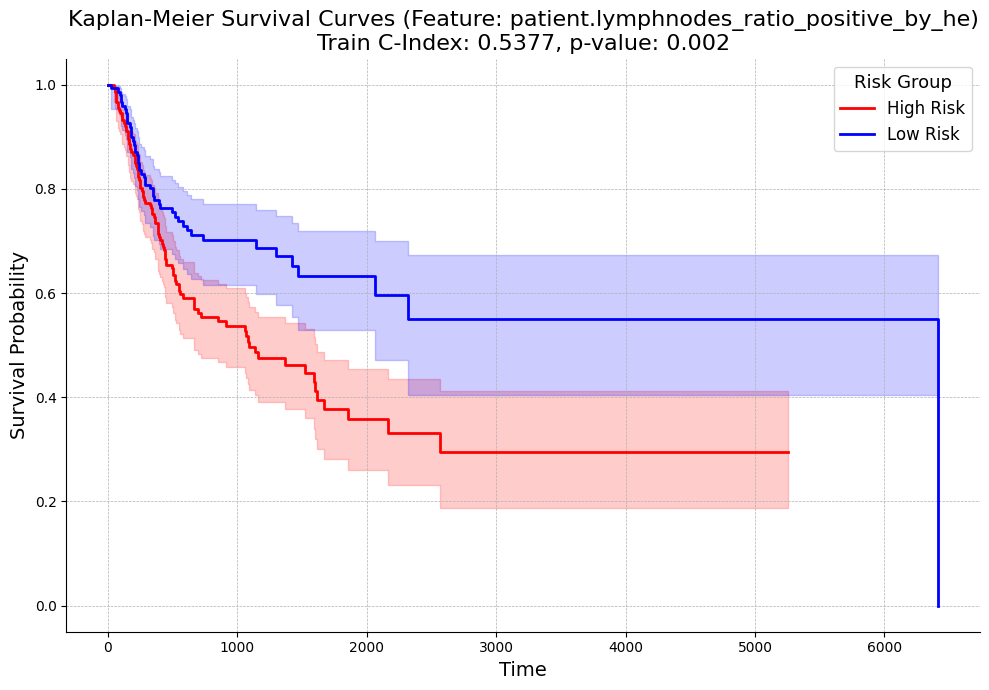


Risk scores and barcodes for training set (Feature: patient.lymphnodes_ratio_positive_by_he):
                               Variable Name       Barcode  Risk Score  \
0    patient.lymphnodes_ratio_positive_by_he  TCGA-UF-A718   -0.130280   
1    patient.lymphnodes_ratio_positive_by_he  TCGA-BA-5555   -0.130280   
2    patient.lymphnodes_ratio_positive_by_he  TCGA-BB-7872   -0.130280   
3    patient.lymphnodes_ratio_positive_by_he  TCGA-CV-7236    0.071435   
4    patient.lymphnodes_ratio_positive_by_he  TCGA-BB-7870   -0.130280   
..                                       ...           ...         ...   
355  patient.lymphnodes_ratio_positive_by_he  TCGA-CV-A460    0.091359   
356  patient.lymphnodes_ratio_positive_by_he  TCGA-CN-A642    0.084834   
357  patient.lymphnodes_ratio_positive_by_he  TCGA-CQ-7067    0.084834   
358  patient.lymphnodes_ratio_positive_by_he  TCGA-QK-A6V9   -0.130280   
359  patient.lymphnodes_ratio_positive_by_he  TCGA-BA-5556   -0.130280   

     Risk Class 

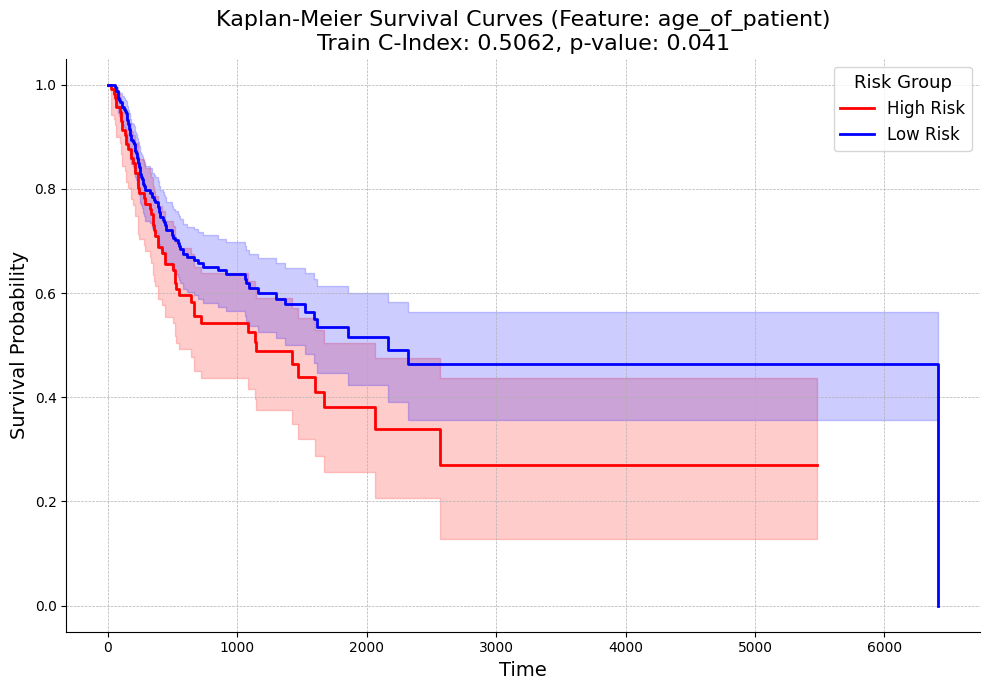


Risk scores and barcodes for training set (Feature: age_of_patient):
      Variable Name       Barcode  Risk Score  Risk Class
0    age_of_patient  TCGA-UF-A718   -0.037960           0
1    age_of_patient  TCGA-BA-5555   -0.066949           0
2    age_of_patient  TCGA-BB-7872   -0.031877           0
3    age_of_patient  TCGA-CV-7236   -0.232377           1
4    age_of_patient  TCGA-BB-7870   -0.055647           0
..              ...           ...         ...         ...
355  age_of_patient  TCGA-CV-A460   -0.113047           1
356  age_of_patient  TCGA-CN-A642   -0.055456           0
357  age_of_patient  TCGA-CQ-7067   -0.194432           1
358  age_of_patient  TCGA-QK-A6V9   -0.057365           0
359  age_of_patient  TCGA-BA-5556   -0.055648           0

[360 rows x 4 columns]

Analyzing Variable: patient.tobacco_smoking_history
Starting 5-Fold Cross-Validation for patient.tobacco_smoking_history...

Variable: patient.tobacco_smoking_history | Fold 1
Variable: patient.tobacco_smoking

KeyboardInterrupt: 

In [68]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import json  # For JSON handling
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
import torchtuples as tt
import warnings
import random
import seaborn as sns  # For enhanced plotting aesthetics
import matplotlib.pyplot as plt  # For plotting
from lifelines import KaplanMeierFitter  # For Kaplan-Meier plotting
from lifelines.statistics import logrank_test  # For log-rank test

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Selection and Train/Test Split Using JSON Files
# -------------------------------------------

# Assume 'clinical_data_yes_id' is your input DataFrame with patient IDs
# Ensure 'clinical_data_yes_id' is defined before this script
# For example:
# clinical_data_yes_id = pd.read_csv('clinical_data.csv')  # Adjust as needed
clinical_data_test = clinical_data_yes_id.copy()

# Paths to the JSON files
json_path = 'svs_patient_map_PFI.json'  # Original JSON file
split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

# Check if JSON files exist
if not os.path.exists(json_path):
    raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
if not os.path.exists(split_json_path):
    raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

# Load the original JSON data
with open(json_path, 'r') as f:
    survival_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
wsi_df = pd.DataFrame(survival_entries)

# Verify that 'file_name' column exists
if 'file_name' not in wsi_df.columns:
    raise KeyError("'file_name' column not found in the JSON data.")

# Function to extract 'patient.bcr_patient_barcode' from 'file_name'
def extract_barcode(file_name):
    """
    Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
    Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
    """
    return file_name[:12]

# Extract 'patient.bcr_patient_barcode' in wsi_df
wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

# Convert 'patient.bcr_patient_barcode' to string to ensure consistency
wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

# Adjust the filtering condition based on your actual data structure
wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

# Store the initial row count of clinical_data_test
initial_row_count = clinical_data_test.shape[0]

# Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
clinical_data_test_filtered = clinical_data_test[
    clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
].copy()

clinical_data_test = clinical_data_test_filtered.copy()

# Store the final row count after filtering
final_row_count = clinical_data_test.shape[0]

# Print the results
print("Total rows BEFORE:", initial_row_count)
print("Total rows AFTER:", final_row_count)

# -------------------------------------------
# Load Split Information and Assign Splits
# -------------------------------------------

# Load the split JSON data
with open(split_json_path, 'r') as f:
    split_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
split_df = pd.DataFrame(split_entries)

# Verify that 'file_name' exists in split_df
if 'file_name' not in split_df.columns:
    raise KeyError("'file_name' column not found in the split JSON data.")

# Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

# Create a mapping from 'patient.bcr_patient_barcode' to 'split'
barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))

# Map the 'split' to the clinical data
clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

# Check for any missing splits
missing_splits = clinical_data_test['split'].isnull().sum()
if missing_splits > 0:
    print(f"Warning: {missing_splits} entries do not have a split assignment.")
    # Optionally, you can decide how to handle these entries
    clinical_data_test = clinical_data_test.dropna(subset=['split'])

# Create boolean masks for training and testing sets
train_mask = clinical_data_test['split'] == 'train'
test_mask = clinical_data_test['split'] == 'test'

# Print the number of train and test samples
print(f"Number of training samples: {train_mask.sum()}")
print(f"Number of testing samples: {test_mask.sum()}")

# -------------------------------------------
# Keep 'patient.bcr_patient_barcode' for later use and then drop 'split'
# -------------------------------------------

patient_barcodes = clinical_data_test['patient.bcr_patient_barcode'].reset_index(drop=True)

# After mapping, drop 'split' as it is no longer needed
clinical_data_test = clinical_data_test.drop(columns=['split'])

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print("\nAge of Patients (First 5 entries):")
print(clinical_data_test['age_of_patient'].head())

# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'
]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean (redundant, already done)
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print("\nSample Feature Vector (First Row):")
print(X.iloc[0])

X_copy = X.copy()

# -------------------------------------------
# Data Splitting Using Predefined Split
# -------------------------------------------

# Reset indices to ensure alignment
clinical_data_test.reset_index(drop=True, inplace=True)
X.reset_index(drop=True, inplace=True)
patient_barcodes.reset_index(drop=True, inplace=True)

# Create masks based on the splits
train_mask = train_mask.reset_index(drop=True)
test_mask = test_mask.reset_index(drop=True)

# Create train and test sets based on the masks
X_train_df = X[train_mask]
X_test_df = X[test_mask]
y_train_event = event[train_mask]
y_test_event = event[test_mask]
y_train_time = time[train_mask]
y_test_time = time[test_mask]
patient_barcodes_train = patient_barcodes[train_mask]
patient_barcodes_test = patient_barcodes[test_mask]

# Verify the lengths to prevent IndexError
print(f"\nTraining set size: {X_train_df.shape[0]}")
print(f"Testing set size: {X_test_df.shape[0]}")

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"\nTrain Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

# -------------------------------------------
# Univariate Analysis
# -------------------------------------------

print("\nStarting Univariate Analysis...\n")

# Combine numerical and categorical columns for univariate analysis
all_features = numerical_columns + categorical_columns

# Initialize a dictionary to store results
univariate_results = {}

# Define a function to perform optimal threshold selection and Kaplan-Meier plotting
def plot_kaplan_meier(durations, events, risk_scores, train_c_index, feature_name, title_suffix=''):
    """
    Performs optimal threshold selection based on log-rank test, stratifies patients,
    and plots Kaplan-Meier survival curves for high-risk and low-risk groups.
    
    Parameters:
        durations (array-like): Survival times.
        events (array-like): Event indicators.
        risk_scores (array-like): Predicted risk scores.
        train_c_index (float): C-Index value for the training set.
        feature_name (str): Name of the feature being analyzed.
        title_suffix (str): Additional string to append to the plot title.
    
    Returns:
        threshold (float): Optimal risk score threshold.
        p_value (float): P-value from log-rank test.
        classification (array-like): Array indicating group assignments (1 for high risk, 0 for low risk).
    """
    unique_risk_scores = np.sort(np.unique(risk_scores))
    
    # Initialize variables
    best_threshold = None
    min_p_value = 1.0
    
    # Minimum group size (at least 25% of patients in each group)
    total_patients = len(risk_scores)
    min_group_size = total_patients * 0.25
    
    # Iterate through possible thresholds to find the one with the lowest p-value
    for threshold in unique_risk_scores[1:-1]:
        # Assign patients to groups
        is_high_risk = risk_scores <= threshold  # High risk have lower risk scores
        is_low_risk = risk_scores > threshold
    
        # Calculate group sizes
        group_high_size = is_high_risk.sum()
        group_low_size = is_low_risk.sum()
    
        # Ensure each group has at least the minimum number of patients
        if group_high_size < min_group_size or group_low_size < min_group_size:
            continue  # Skip thresholds that result in small groups
    
        # Check if both groups have events
        if events[is_high_risk].sum() == 0 or events[is_low_risk].sum() == 0:
            continue  # Skip thresholds where one group has no events
    
        # Perform log-rank test
        results = logrank_test(
            durations[is_high_risk],
            durations[is_low_risk],
            event_observed_A=events[is_high_risk],
            event_observed_B=events[is_low_risk]
        )
        p_value = results.p_value
    
        # Update the best threshold if p-value is lower
        if p_value < min_p_value:
            min_p_value = p_value
            best_threshold = threshold
    
    # Check if a valid threshold was found
    if best_threshold is None:
        print("No valid threshold found that satisfies the group size restriction.")
        classification = np.full(len(risk_scores), -1)
        return None, None, classification
    else:
        # Assign patients to groups based on the best threshold
        is_high_risk = risk_scores <= best_threshold  # High risk have lower risk scores
        is_low_risk = risk_scores > best_threshold
    
        # Assign classes: 1 for high risk, 0 for low risk
        classification = np.where(is_high_risk, 1, 0)
    
        # Confirm that the high-risk group has shorter survival times
        median_survival_high = np.median(durations[is_high_risk])
        median_survival_low = np.median(durations[is_low_risk])
    
        print(f"Median survival time - High Risk: {median_survival_high}")
        print(f"Median survival time - Low Risk: {median_survival_low}")
    
        # Ensure high-risk group has shorter survival times
        if median_survival_high >= median_survival_low:
            print("Warning: High-risk group does not have shorter median survival time compared to low-risk group.")
            # You may choose to investigate further or adjust the thresholding method
    
        print(f"Optimal threshold for risk score: {best_threshold:.4f}")
    
        # Format p-value as per your request
        if min_p_value < 0.001:
            p_value_formatted = "< 0.001"
        else:
            p_value_formatted = f"{min_p_value:.3f}"
        print(f"Minimum p-value from log-rank test: {p_value_formatted}")
    
        # Create a DataFrame for plotting
        data = pd.DataFrame({
            'duration': durations,
            'event': events,
            'group': np.where(classification == 1, 'High Risk', 'Low Risk')
        })
    
        # Initialize Kaplan-Meier Fitter
        kmf_high = KaplanMeierFitter()
        kmf_low = KaplanMeierFitter()
    
        plt.figure(figsize=(10, 7))
    
        # Fit the models
        kmf_high.fit(
            data['duration'][data['group'] == 'High Risk'],
            event_observed=data['event'][data['group'] == 'High Risk'],
            label='High Risk'
        )
        kmf_low.fit(
            data['duration'][data['group'] == 'Low Risk'],
            event_observed=data['event'][data['group'] == 'Low Risk'],
            label='Low Risk'
        )
    
        # Plot the survival curves with confidence intervals (error bands)
        ax = kmf_high.plot(ci_show=True, ci_alpha=0.2, linewidth=2, color='red')
        kmf_low.plot(ax=ax, ci_show=True, ci_alpha=0.2, linewidth=2, color='blue')
    
        # Customize the plot using Seaborn aesthetics
        sns.despine()
    
        # Add c-index and p-value to the plot
        plt.title(f'Kaplan-Meier Survival Curves{title_suffix}\nTrain C-Index: {train_c_index:.4f}, p-value: {p_value_formatted}', fontsize=16)
        plt.xlabel('Time', fontsize=14)
        plt.ylabel('Survival Probability', fontsize=14)
        plt.legend(title='Risk Group', fontsize=12, title_fontsize=13)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.tight_layout()
        plt.show()
    
        return best_threshold, min_p_value, classification

# Iterate through each feature
for feature in all_features:
    print(f"\nAnalyzing Variable: {feature}")
    
    # Prepare feature-specific data
    X_univ = X[[feature]].copy()
    
    # If the feature is numerical, ensure it's scaled
    if feature in numerical_columns:
        # Already scaled in X, no action needed
        pass
    else:
        # Categorical feature: ensure it's integer-encoded
        X_univ[feature] = X_univ[feature].astype(int)
    
    # Split the data into training and testing sets using the existing indices
    X_train_univ = X_univ[train_mask].values.astype(np.float32)
    X_test_univ = X_univ[test_mask].values.astype(np.float32)
    y_train_univ_durations = durations_train
    y_train_univ_events = events_train
    y_test_univ_durations = y_test_time.astype(np.float32)
    y_test_univ_events = y_test_event.astype(np.int64)
    patient_barcodes_train_univ = patient_barcodes_train.reset_index(drop=True)
    
    # Initialize KFold Cross-Validation
    kf_univ = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores_univ = []
    
    print(f"Starting 5-Fold Cross-Validation for {feature}...\n")
    
    for fold_univ, (train_idx_cv_univ, val_idx_cv_univ) in enumerate(kf_univ.split(X_train_univ)):
        print(f"Variable: {feature} | Fold {fold_univ + 1}")
        
        # Split data
        X_train_cv_univ = X_train_univ[train_idx_cv_univ]
        y_train_cv_durations_univ = y_train_univ_durations[train_idx_cv_univ]
        y_train_cv_events_univ = y_train_univ_events[train_idx_cv_univ]
        
        X_val_cv_univ = X_train_univ[val_idx_cv_univ]
        y_val_cv_durations_univ = y_train_univ_durations[val_idx_cv_univ]
        y_val_cv_events_univ = y_train_univ_events[val_idx_cv_univ]
        
        # Define the network architecture for univariate analysis
        # Using a simple network since there's only one input feature
        net_univ = tt.practical.MLPVanilla(
            in_features=1,
            num_nodes=[16, 8],  # Smaller network for univariate
            out_features=1,
            batch_norm=False,
            dropout=0.2,
            output_bias=False
        )
        
        # Initialize CoxPH model for this fold
        optimizer_univ = tt.optim.Adam(lr=1e-3)
        cox_ph_univ = CoxPH(net_univ, optimizer_univ)
        
        # Fit the model
        cox_ph_univ.fit(
            X_train_cv_univ,
            (y_train_cv_events_univ, y_train_cv_durations_univ),
            batch_size=32,
            epochs=300,
            verbose=False
        )
        
        # Predict risk scores on validation set
        risk_val_univ = cox_ph_univ.predict(X_val_cv_univ).squeeze()
        
        # Compute C-Index
        c_index_univ = concordance_index_censored(
            y_val_cv_events_univ.astype(bool),
            y_val_cv_durations_univ,
            -risk_val_univ  # Use negative risk for proper ordering
        )[0]
        
        print(f"Variable: {feature} | Fold {fold_univ + 1} C-Index: {c_index_univ:.4f}\n")
        
        c_index_scores_univ.append(c_index_univ)
    
    # Calculate Cross-Validation Mean and Uncertainty for the feature
    c_index_mean_univ = np.mean(c_index_scores_univ)
    c_index_std_univ = np.std(c_index_scores_univ)
    c_index_ci_lower_univ = np.percentile(c_index_scores_univ, 2.5)
    c_index_ci_upper_univ = np.percentile(c_index_scores_univ, 97.5)
    
    print(f"Variable: {feature} | Cross-Validation C-Index: {c_index_mean_univ:.4f} ± {c_index_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_ci_lower_univ:.4f}, {c_index_ci_upper_univ:.4f}]\n")
    
    # Evaluate on Test Set
    # Initialize and train CoxPH model on the entire training set for the feature
    net_final_univ = tt.practical.MLPVanilla(
        in_features=1,
        num_nodes=[16, 8],
        out_features=1,
        batch_norm=False,
        dropout=0.2,
        output_bias=False
    )
    
    optimizer_final_univ = tt.optim.Adam(lr=1e-3)
    cox_ph_final_univ = CoxPH(net_final_univ, optimizer_final_univ)
    
    # Fit the model
    cox_ph_final_univ.fit(
        X_train_univ,
        (y_train_univ_events, y_train_univ_durations),
        batch_size=32,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on test set
    risk_test_univ = cox_ph_final_univ.predict(X_test_univ).squeeze()
    
    # Compute C-Index on Test Set
    c_index_test_univ = concordance_index_censored(
        y_test_univ_events.astype(bool),
        y_test_univ_durations,
        -risk_test_univ  # Use negative risk for proper ordering
    )[0]
    
    print(f"Variable: {feature} | Test C-Index: {c_index_test_univ:.4f}\n")
    
    # Bootstrapping for Test C-Index Uncertainty
    n_bootstraps_univ = 1000
    c_index_bootstrap_univ = []
    
    print(f"Variable: {feature} | Starting Bootstrapping for Test C-Index Uncertainty...\n")
    
    for i_univ in range(n_bootstraps_univ):
        # Resample test set with replacement
        indices_univ = np.random.choice(len(X_test_univ), size=len(X_test_univ), replace=True)
        X_test_bs_univ = X_test_univ[indices_univ]
        durations_test_bs_univ = y_test_univ_durations[indices_univ]
        events_test_bs_univ = y_test_univ_events[indices_univ]
        
        # Predict risk scores
        risk_bs_univ = cox_ph_final_univ.predict(X_test_bs_univ).squeeze()
        
        # Compute C-Index
        c_index_bs_univ = concordance_index_censored(
            events_test_bs_univ.astype(bool),
            durations_test_bs_univ,
            -risk_bs_univ  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap_univ.append(c_index_bs_univ)
        
        # Optional: Print progress every 100 iterations
        if (i_univ + 1) % 100 == 0:
            print(f"Variable: {feature} | Bootstrap {i_univ + 1}/{n_bootstraps_univ} completed.")
    
    # Calculate Bootstrapped C-Index Statistics for the feature
    c_index_test_mean_univ = np.mean(c_index_bootstrap_univ)
    c_index_test_std_univ = np.std(c_index_bootstrap_univ)
    c_index_test_ci_lower_univ = np.percentile(c_index_bootstrap_univ, 2.5)
    c_index_test_ci_upper_univ = np.percentile(c_index_bootstrap_univ, 97.5)
    
    print(f"Variable: {feature} | Test C-Index with Bootstrapping: {c_index_test_mean_univ:.4f} ± {c_index_test_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_test_ci_lower_univ:.4f}, {c_index_test_ci_upper_univ:.4f}]\n")
    
    # -------------------------------------------
    # Evaluate on Train Set and Bootstrapping
    # -------------------------------------------
    
    print(f"Variable: {feature} | Evaluating on Training Set...\n")
    
    # Predict risk scores on training set
    risk_train_univ = cox_ph_final_univ.predict(X_train_univ).squeeze()
    
    # Compute C-Index on Training Set
    c_index_train_univ = concordance_index_censored(
        y_train_univ_events.astype(bool),
        y_train_univ_durations,
        -risk_train_univ  # Use negative risk for proper ordering
    )[0]
    
    print(f"Variable: {feature} | Train C-Index: {c_index_train_univ:.4f}\n")
    
    # Bootstrapping for Train C-Index Uncertainty
    print(f"Variable: {feature} | Starting Bootstrapping for Train C-Index Uncertainty...\n")
    
    c_index_bootstrap_train_univ = []
    for i_univ in range(n_bootstraps_univ):
        # Resample train set with replacement
        indices_train_univ = np.random.choice(len(X_train_univ), size=len(X_train_univ), replace=True)
        X_train_bs_univ = X_train_univ[indices_train_univ]
        durations_train_bs_univ = y_train_univ_durations[indices_train_univ]
        events_train_bs_univ = y_train_univ_events[indices_train_univ]
        
        # Predict risk scores
        risk_bs_train_univ = cox_ph_final_univ.predict(X_train_bs_univ).squeeze()
        
        # Compute C-Index
        c_index_bs_train_univ = concordance_index_censored(
            events_train_bs_univ.astype(bool),
            durations_train_bs_univ,
            -risk_bs_train_univ  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap_train_univ.append(c_index_bs_train_univ)
        
        # Optional: Print progress every 100 iterations
        if (i_univ + 1) % 100 == 0:
            print(f"Variable: {feature} | Train Bootstrap {i_univ + 1}/{n_bootstraps_univ} completed.")
    
    # Calculate Bootstrapped C-Index Statistics for the train set
    c_index_train_mean_univ = np.mean(c_index_bootstrap_train_univ)
    c_index_train_std_univ = np.std(c_index_bootstrap_train_univ)
    c_index_train_ci_lower_univ = np.percentile(c_index_bootstrap_train_univ, 2.5)
    c_index_train_ci_upper_univ = np.percentile(c_index_bootstrap_train_univ, 97.5)
    
    print(f"Variable: {feature} | Train C-Index with Bootstrapping: {c_index_train_mean_univ:.4f} ± {c_index_train_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_train_ci_lower_univ:.4f}, {c_index_train_ci_upper_univ:.4f}]\n")
    
    # -------------------------------------------
    # Optimal Threshold Selection and Kaplan-Meier Plotting for Training Set
    # -------------------------------------------
    
    print(f"Variable: {feature} | Optimal Threshold Selection and Kaplan-Meier Plotting for Training Set...\n")
    
    # Plot Kaplan-Meier survival curves based on risk stratification
    threshold, p_value, classification = plot_kaplan_meier(
        durations=y_train_univ_durations,
        events=y_train_univ_events,
        risk_scores=risk_train_univ,
        train_c_index=c_index_train_univ,
        feature_name=feature,
        title_suffix=f' (Feature: {feature})'
    )
    
    # Ensure that patient_barcodes_train_univ and risk_train_univ have the same length
    if len(patient_barcodes_train_univ) != len(risk_train_univ):
        print(f"Error: Length mismatch between patient barcodes ({len(patient_barcodes_train_univ)}) and risk scores ({len(risk_train_univ)}).")
    else:
        # Create a DataFrame with Variable Name, Barcodes, Risk Scores, and Risk Classes
        risk_scores_and_barcodes = pd.DataFrame({
            'Variable Name': feature,
            'Barcode': patient_barcodes_train_univ,
            'Risk Score': risk_train_univ,
            'Risk Class': classification
        })
        print(f"\nRisk scores and barcodes for training set (Feature: {feature}):")
        print(risk_scores_and_barcodes)
    
    # Optionally, save the plot
    # plt.savefig(f'KM_Plot_{feature}.png')  # Uncomment to save the plot
    
    # Store the results
    univariate_results[feature] = {
        'Cross_Validation_Mean_C_Index': c_index_mean_univ,
        'Cross_Validation_STD': c_index_std_univ,
        'Cross_Validation_CI_Lower': c_index_ci_lower_univ,
        'Cross_Validation_CI_Upper': c_index_ci_upper_univ,
        'Test_C_Index': c_index_test_univ,
        'Test_CI_Mean': c_index_test_mean_univ,
        'Test_CI_STD': c_index_test_std_univ,
        'Test_CI_Lower': c_index_test_ci_lower_univ,
        'Test_CI_Upper': c_index_test_ci_upper_univ,
        'Train_C_Index': c_index_train_univ,
        'Train_CI_Mean': c_index_train_mean_univ,
        'Train_CI_STD': c_index_train_std_univ,
        'Train_CI_Lower': c_index_train_ci_lower_univ,
        'Train_CI_Upper': c_index_train_ci_upper_univ
    }

print("\nUnivariate Analysis Completed.\n")

# Optionally, convert the results to a DataFrame for better visualization
univariate_results_df = pd.DataFrame(univariate_results).T
print("Univariate Analysis Results:")
print(univariate_results_df)


per variable risk score calculation and saved to json:

Number of training samples: 360
Number of testing samples: 90

Age of Patients (First 5 entries):
0    62.521561
1    59.299110
2    54.636550
3    63.477070
5    77.344285
Name: age_of_patient, dtype: float64

Sample Feature Vector (First Row):
patient.lymphnodes_ratio_positive_by_ihc                                  -0.934626
patient.lymphnodes_ratio_positive_by_he                                   -0.917754
age_of_patient                                                             0.077689
patient.tobacco_smoking_history                                           -0.296069
patient.year_of_tobacco_smoking_onset                                      0.956069
patient.number_pack_years_smoked                                           0.755891
patient.stopped_smoking_year                                              -0.728405
patient.frequency_of_alcohol_consumption                                  -0.698809
patient.amount_of_alcohol_consumption_per_day                             -0.52734

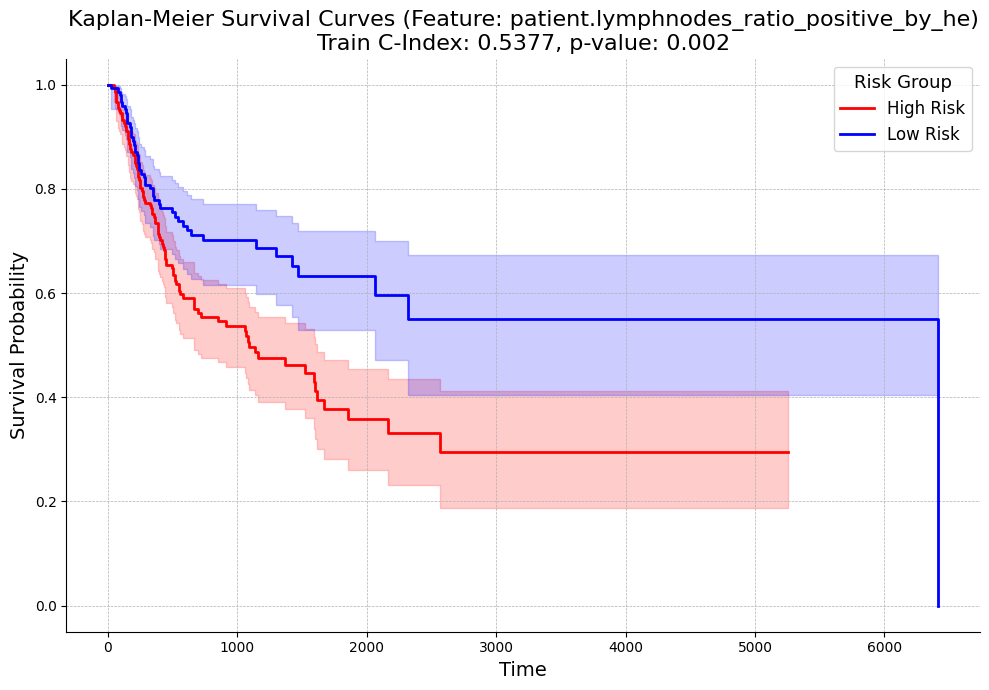


Risk scores and barcodes for training set (Feature: patient.lymphnodes_ratio_positive_by_he):
                               Variable Name       Barcode  Risk Score  \
0    patient.lymphnodes_ratio_positive_by_he  TCGA-UF-A718   -0.130280   
1    patient.lymphnodes_ratio_positive_by_he  TCGA-BA-5555   -0.130280   
2    patient.lymphnodes_ratio_positive_by_he  TCGA-BB-7872   -0.130280   
3    patient.lymphnodes_ratio_positive_by_he  TCGA-CV-7236    0.071435   
4    patient.lymphnodes_ratio_positive_by_he  TCGA-BB-7870   -0.130280   
..                                       ...           ...         ...   
355  patient.lymphnodes_ratio_positive_by_he  TCGA-CV-A460    0.091359   
356  patient.lymphnodes_ratio_positive_by_he  TCGA-CN-A642    0.084834   
357  patient.lymphnodes_ratio_positive_by_he  TCGA-CQ-7067    0.084834   
358  patient.lymphnodes_ratio_positive_by_he  TCGA-QK-A6V9   -0.130280   
359  patient.lymphnodes_ratio_positive_by_he  TCGA-BA-5556   -0.130280   

     Risk Class 

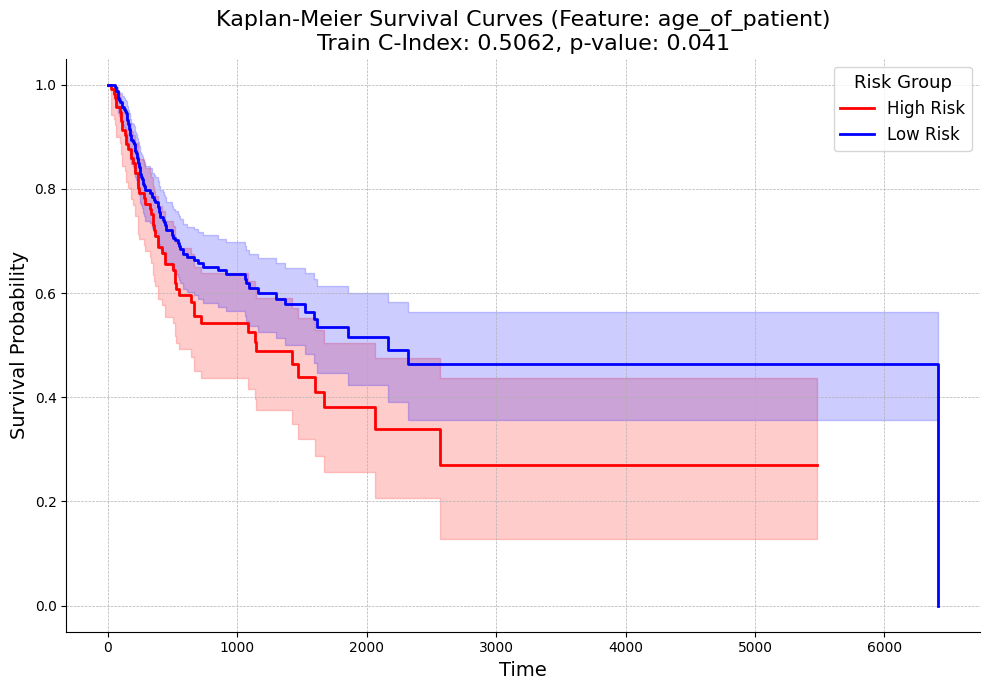


Risk scores and barcodes for training set (Feature: age_of_patient):
      Variable Name       Barcode  Risk Score  Risk Class
0    age_of_patient  TCGA-UF-A718   -0.037960           0
1    age_of_patient  TCGA-BA-5555   -0.066949           0
2    age_of_patient  TCGA-BB-7872   -0.031877           0
3    age_of_patient  TCGA-CV-7236   -0.232377           1
4    age_of_patient  TCGA-BB-7870   -0.055647           0
..              ...           ...         ...         ...
355  age_of_patient  TCGA-CV-A460   -0.113047           1
356  age_of_patient  TCGA-CN-A642   -0.055456           0
357  age_of_patient  TCGA-CQ-7067   -0.194432           1
358  age_of_patient  TCGA-QK-A6V9   -0.057365           0
359  age_of_patient  TCGA-BA-5556   -0.055648           0

[360 rows x 4 columns]

Analyzing Variable: patient.tobacco_smoking_history
Starting 5-Fold Cross-Validation for patient.tobacco_smoking_history...

Variable: patient.tobacco_smoking_history | Fold 1
Variable: patient.tobacco_smoking

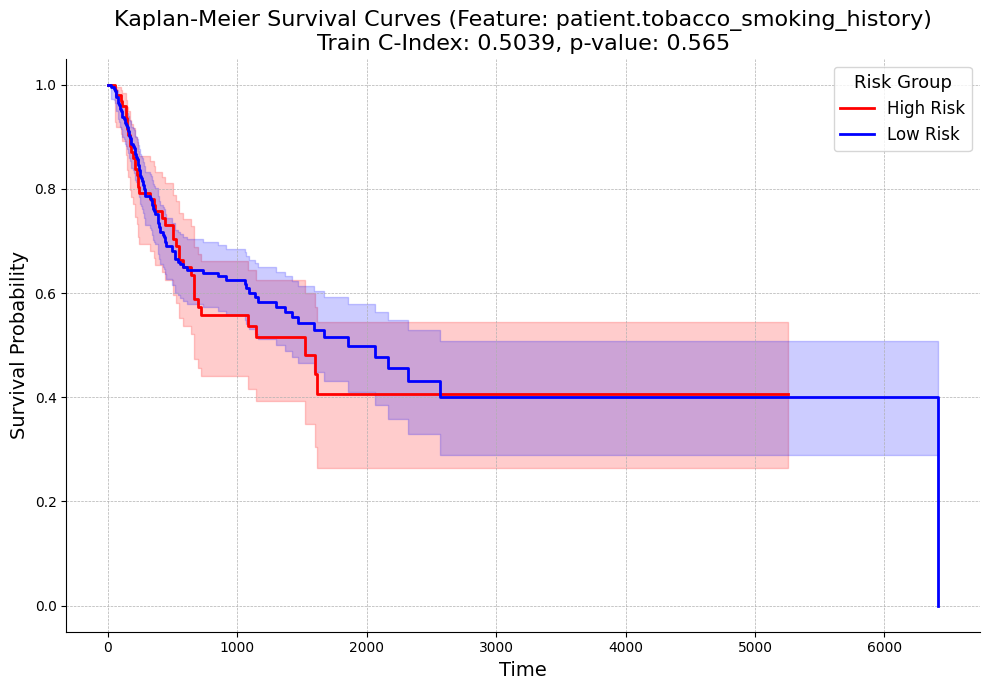


Risk scores and barcodes for training set (Feature: patient.tobacco_smoking_history):
                       Variable Name       Barcode  Risk Score  Risk Class
0    patient.tobacco_smoking_history  TCGA-UF-A718   -0.042787           0
1    patient.tobacco_smoking_history  TCGA-BA-5555    0.000657           0
2    patient.tobacco_smoking_history  TCGA-BB-7872   -0.047830           1
3    patient.tobacco_smoking_history  TCGA-CV-7236   -0.049552           1
4    patient.tobacco_smoking_history  TCGA-BB-7870   -0.042787           0
..                               ...           ...         ...         ...
355  patient.tobacco_smoking_history  TCGA-CV-A460    0.002099           0
356  patient.tobacco_smoking_history  TCGA-CN-A642    0.000657           0
357  patient.tobacco_smoking_history  TCGA-CQ-7067   -0.049552           1
358  patient.tobacco_smoking_history  TCGA-QK-A6V9   -0.047830           1
359  patient.tobacco_smoking_history  TCGA-BA-5556    0.000657           0

[360 rows x 

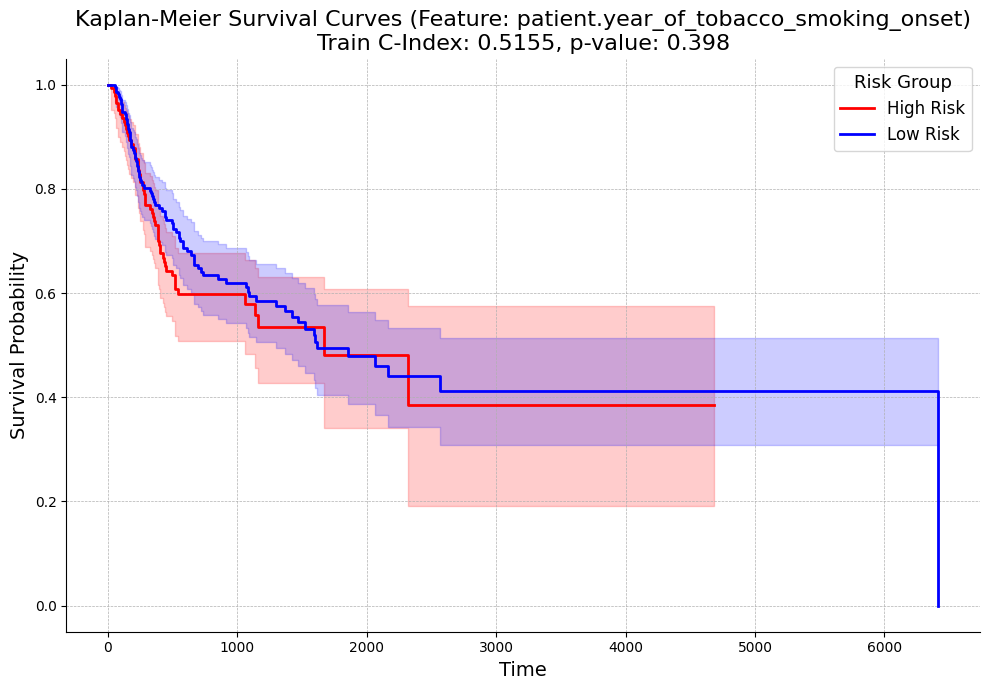


Risk scores and barcodes for training set (Feature: patient.year_of_tobacco_smoking_onset):
                             Variable Name       Barcode  Risk Score  \
0    patient.year_of_tobacco_smoking_onset  TCGA-UF-A718   -0.012420   
1    patient.year_of_tobacco_smoking_onset  TCGA-BA-5555    0.036231   
2    patient.year_of_tobacco_smoking_onset  TCGA-BB-7872    0.036231   
3    patient.year_of_tobacco_smoking_onset  TCGA-CV-7236    0.036231   
4    patient.year_of_tobacco_smoking_onset  TCGA-BB-7870    0.036231   
..                                     ...           ...         ...   
355  patient.year_of_tobacco_smoking_onset  TCGA-CV-A460   -0.011485   
356  patient.year_of_tobacco_smoking_onset  TCGA-CN-A642    0.036231   
357  patient.year_of_tobacco_smoking_onset  TCGA-CQ-7067    0.036231   
358  patient.year_of_tobacco_smoking_onset  TCGA-QK-A6V9    0.036231   
359  patient.year_of_tobacco_smoking_onset  TCGA-BA-5556   -0.013067   

     Risk Class  
0             1  
1     

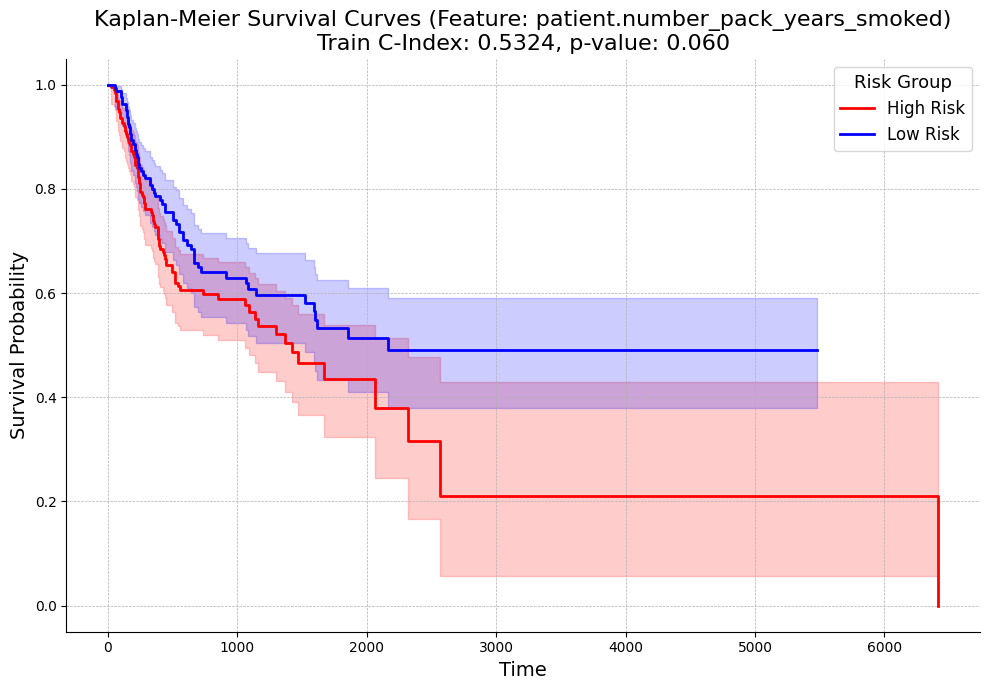


Risk scores and barcodes for training set (Feature: patient.number_pack_years_smoked):
                        Variable Name       Barcode  Risk Score  Risk Class
0    patient.number_pack_years_smoked  TCGA-UF-A718   -0.087357           1
1    patient.number_pack_years_smoked  TCGA-BA-5555   -0.105669           1
2    patient.number_pack_years_smoked  TCGA-BB-7872    0.171921           0
3    patient.number_pack_years_smoked  TCGA-CV-7236    0.171921           0
4    patient.number_pack_years_smoked  TCGA-BB-7870   -0.065657           1
..                                ...           ...         ...         ...
355  patient.number_pack_years_smoked  TCGA-CV-A460   -0.089490           1
356  patient.number_pack_years_smoked  TCGA-CN-A642    0.119925           1
357  patient.number_pack_years_smoked  TCGA-CQ-7067    0.171921           0
358  patient.number_pack_years_smoked  TCGA-QK-A6V9    0.171921           0
359  patient.number_pack_years_smoked  TCGA-BA-5556   -0.104542           1


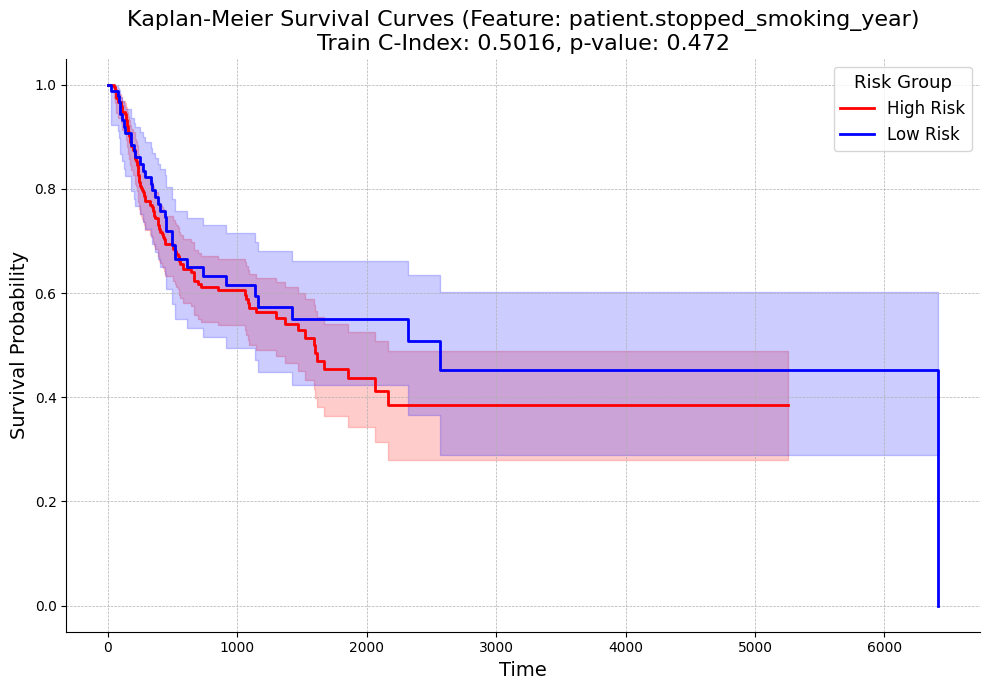


Risk scores and barcodes for training set (Feature: patient.stopped_smoking_year):
                    Variable Name       Barcode  Risk Score  Risk Class
0    patient.stopped_smoking_year  TCGA-UF-A718    0.000943           1
1    patient.stopped_smoking_year  TCGA-BA-5555    0.023644           1
2    patient.stopped_smoking_year  TCGA-BB-7872    0.000943           1
3    patient.stopped_smoking_year  TCGA-CV-7236    0.000943           1
4    patient.stopped_smoking_year  TCGA-BB-7870    0.000943           1
..                            ...           ...         ...         ...
355  patient.stopped_smoking_year  TCGA-CV-A460    0.025469           0
356  patient.stopped_smoking_year  TCGA-CN-A642    0.023518           1
357  patient.stopped_smoking_year  TCGA-CQ-7067    0.000943           1
358  patient.stopped_smoking_year  TCGA-QK-A6V9    0.000943           1
359  patient.stopped_smoking_year  TCGA-BA-5556    0.023644           1

[360 rows x 4 columns]

Analyzing Variable: patient

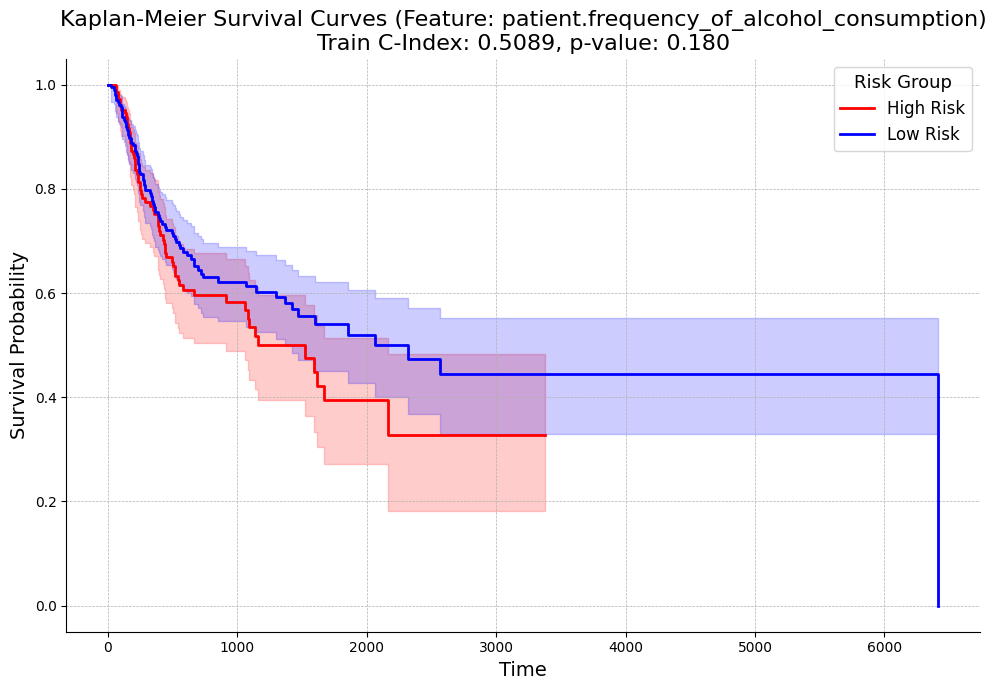


Risk scores and barcodes for training set (Feature: patient.frequency_of_alcohol_consumption):
                                Variable Name       Barcode  Risk Score  \
0    patient.frequency_of_alcohol_consumption  TCGA-UF-A718    0.020652   
1    patient.frequency_of_alcohol_consumption  TCGA-BA-5555   -0.096816   
2    patient.frequency_of_alcohol_consumption  TCGA-BB-7872    0.020652   
3    patient.frequency_of_alcohol_consumption  TCGA-CV-7236    0.020652   
4    patient.frequency_of_alcohol_consumption  TCGA-BB-7870   -0.100784   
..                                        ...           ...         ...   
355  patient.frequency_of_alcohol_consumption  TCGA-CV-A460    0.020652   
356  patient.frequency_of_alcohol_consumption  TCGA-CN-A642   -0.096816   
357  patient.frequency_of_alcohol_consumption  TCGA-CQ-7067    0.020652   
358  patient.frequency_of_alcohol_consumption  TCGA-QK-A6V9    0.020652   
359  patient.frequency_of_alcohol_consumption  TCGA-BA-5556   -0.100784   

   

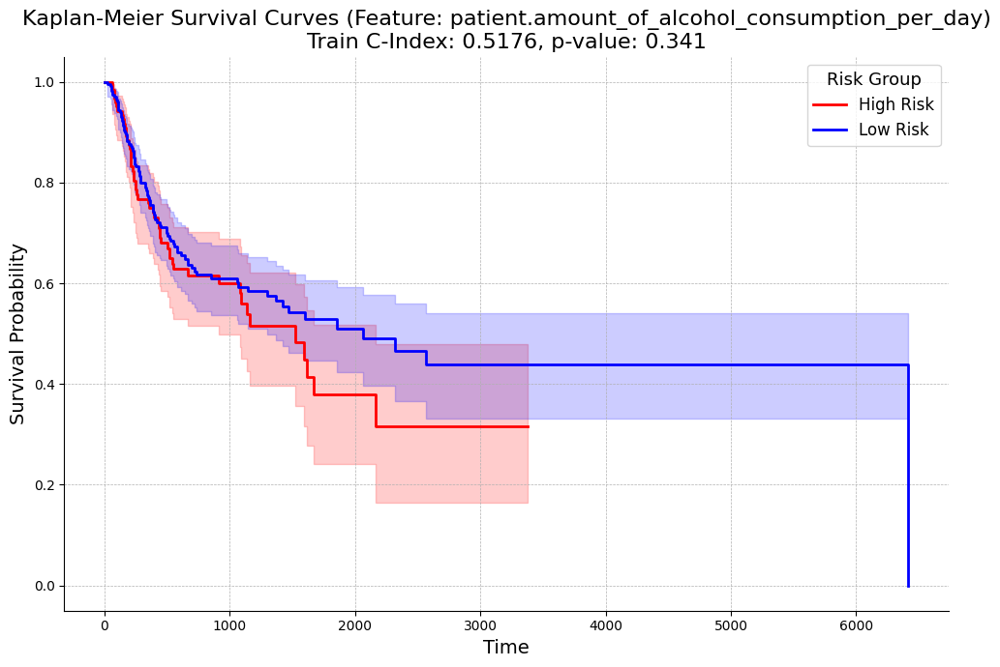


Risk scores and barcodes for training set (Feature: patient.amount_of_alcohol_consumption_per_day):
                                     Variable Name       Barcode  Risk Score  \
0    patient.amount_of_alcohol_consumption_per_day  TCGA-UF-A718    0.082042   
1    patient.amount_of_alcohol_consumption_per_day  TCGA-BA-5555    0.025760   
2    patient.amount_of_alcohol_consumption_per_day  TCGA-BB-7872    0.082042   
3    patient.amount_of_alcohol_consumption_per_day  TCGA-CV-7236    0.082042   
4    patient.amount_of_alcohol_consumption_per_day  TCGA-BB-7870    0.054914   
..                                             ...           ...         ...   
355  patient.amount_of_alcohol_consumption_per_day  TCGA-CV-A460    0.082042   
356  patient.amount_of_alcohol_consumption_per_day  TCGA-CN-A642    0.025760   
357  patient.amount_of_alcohol_consumption_per_day  TCGA-CQ-7067    0.082042   
358  patient.amount_of_alcohol_consumption_per_day  TCGA-QK-A6V9    0.082042   
359  patient.amount

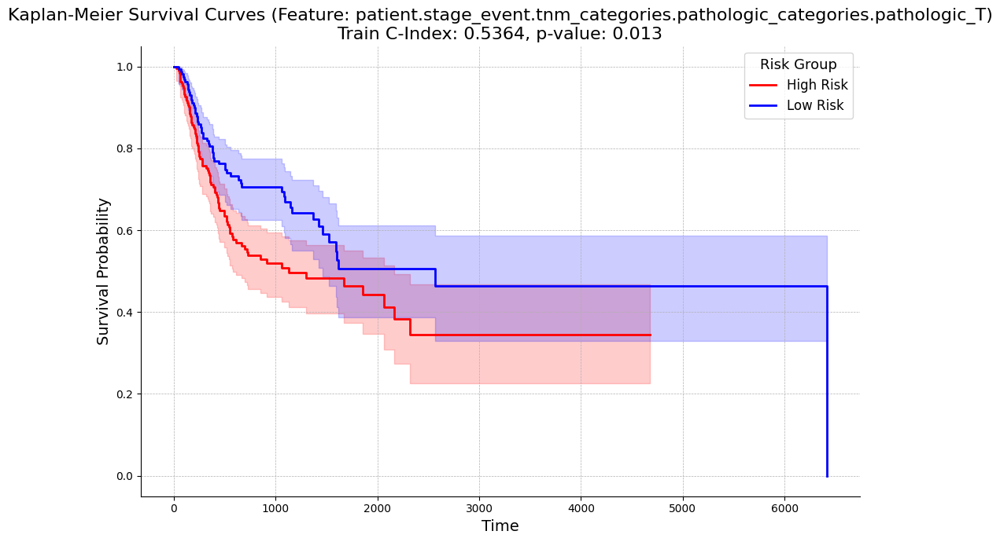


Risk scores and barcodes for training set (Feature: patient.stage_event.tnm_categories.pathologic_categories.pathologic_T):
                                         Variable Name       Barcode  \
0    patient.stage_event.tnm_categories.pathologic_...  TCGA-UF-A718   
1    patient.stage_event.tnm_categories.pathologic_...  TCGA-BA-5555   
2    patient.stage_event.tnm_categories.pathologic_...  TCGA-BB-7872   
3    patient.stage_event.tnm_categories.pathologic_...  TCGA-CV-7236   
4    patient.stage_event.tnm_categories.pathologic_...  TCGA-BB-7870   
..                                                 ...           ...   
355  patient.stage_event.tnm_categories.pathologic_...  TCGA-CV-A460   
356  patient.stage_event.tnm_categories.pathologic_...  TCGA-CN-A642   
357  patient.stage_event.tnm_categories.pathologic_...  TCGA-CQ-7067   
358  patient.stage_event.tnm_categories.pathologic_...  TCGA-QK-A6V9   
359  patient.stage_event.tnm_categories.pathologic_...  TCGA-BA-5556   

     Risk 

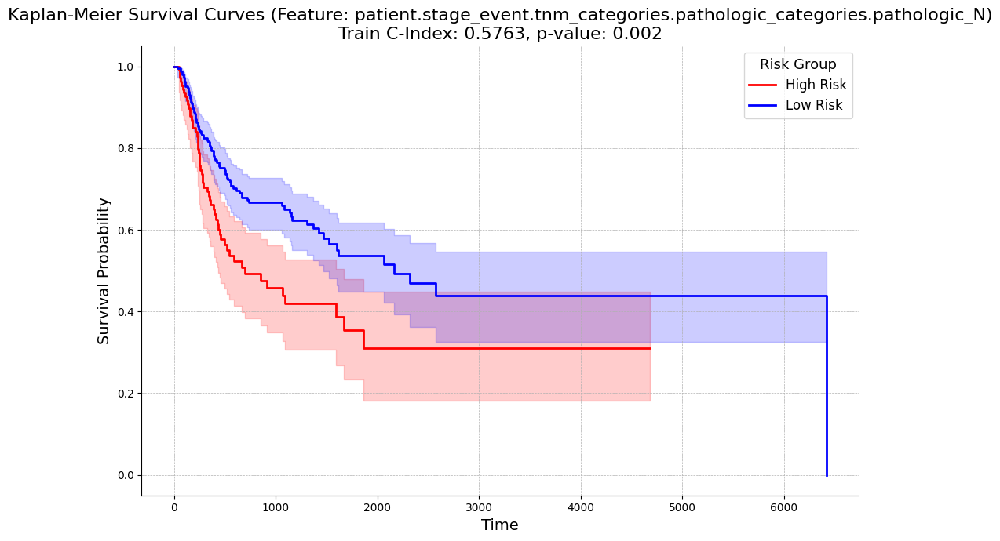


Risk scores and barcodes for training set (Feature: patient.stage_event.tnm_categories.pathologic_categories.pathologic_N):
                                         Variable Name       Barcode  \
0    patient.stage_event.tnm_categories.pathologic_...  TCGA-UF-A718   
1    patient.stage_event.tnm_categories.pathologic_...  TCGA-BA-5555   
2    patient.stage_event.tnm_categories.pathologic_...  TCGA-BB-7872   
3    patient.stage_event.tnm_categories.pathologic_...  TCGA-CV-7236   
4    patient.stage_event.tnm_categories.pathologic_...  TCGA-BB-7870   
..                                                 ...           ...   
355  patient.stage_event.tnm_categories.pathologic_...  TCGA-CV-A460   
356  patient.stage_event.tnm_categories.pathologic_...  TCGA-CN-A642   
357  patient.stage_event.tnm_categories.pathologic_...  TCGA-CQ-7067   
358  patient.stage_event.tnm_categories.pathologic_...  TCGA-QK-A6V9   
359  patient.stage_event.tnm_categories.pathologic_...  TCGA-BA-5556   

     Risk 

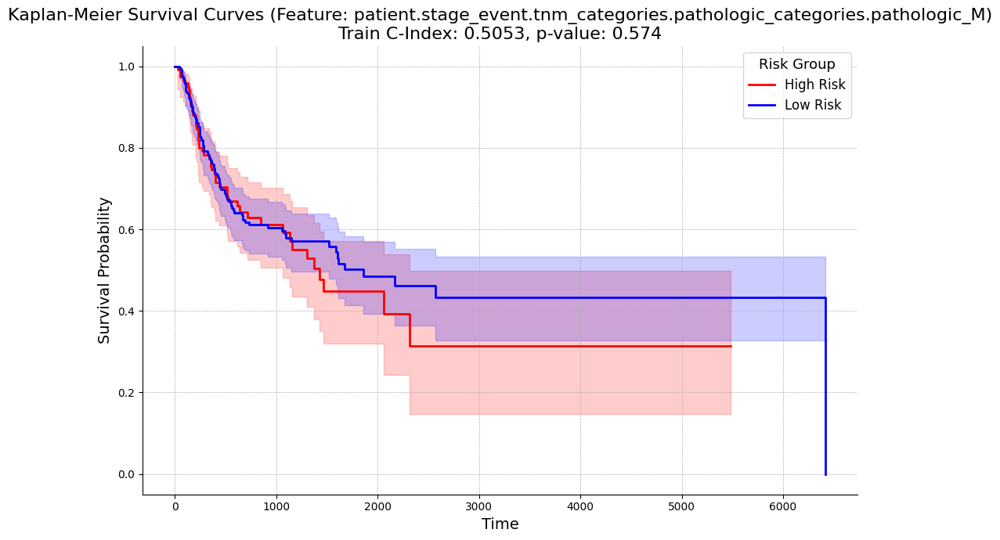


Risk scores and barcodes for training set (Feature: patient.stage_event.tnm_categories.pathologic_categories.pathologic_M):
                                         Variable Name       Barcode  \
0    patient.stage_event.tnm_categories.pathologic_...  TCGA-UF-A718   
1    patient.stage_event.tnm_categories.pathologic_...  TCGA-BA-5555   
2    patient.stage_event.tnm_categories.pathologic_...  TCGA-BB-7872   
3    patient.stage_event.tnm_categories.pathologic_...  TCGA-CV-7236   
4    patient.stage_event.tnm_categories.pathologic_...  TCGA-BB-7870   
..                                                 ...           ...   
355  patient.stage_event.tnm_categories.pathologic_...  TCGA-CV-A460   
356  patient.stage_event.tnm_categories.pathologic_...  TCGA-CN-A642   
357  patient.stage_event.tnm_categories.pathologic_...  TCGA-CQ-7067   
358  patient.stage_event.tnm_categories.pathologic_...  TCGA-QK-A6V9   
359  patient.stage_event.tnm_categories.pathologic_...  TCGA-BA-5556   

     Risk 

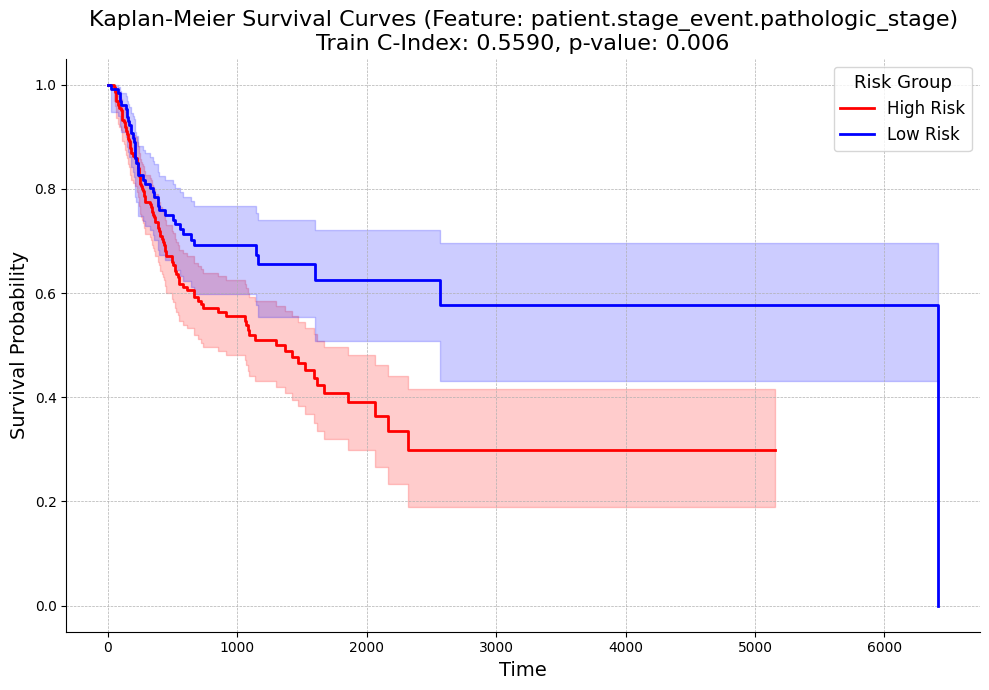


Risk scores and barcodes for training set (Feature: patient.stage_event.pathologic_stage):
                            Variable Name       Barcode  Risk Score  \
0    patient.stage_event.pathologic_stage  TCGA-UF-A718   -0.327711   
1    patient.stage_event.pathologic_stage  TCGA-BA-5555   -0.327711   
2    patient.stage_event.pathologic_stage  TCGA-BB-7872    0.009817   
3    patient.stage_event.pathologic_stage  TCGA-CV-7236   -0.327711   
4    patient.stage_event.pathologic_stage  TCGA-BB-7870   -0.327711   
..                                    ...           ...         ...   
355  patient.stage_event.pathologic_stage  TCGA-CV-A460   -0.051819   
356  patient.stage_event.pathologic_stage  TCGA-CN-A642   -0.548862   
357  patient.stage_event.pathologic_stage  TCGA-CQ-7067    0.009817   
358  patient.stage_event.pathologic_stage  TCGA-QK-A6V9    0.037635   
359  patient.stage_event.pathologic_stage  TCGA-BA-5556    0.037635   

     Risk Class  
0             1  
1             1  
2

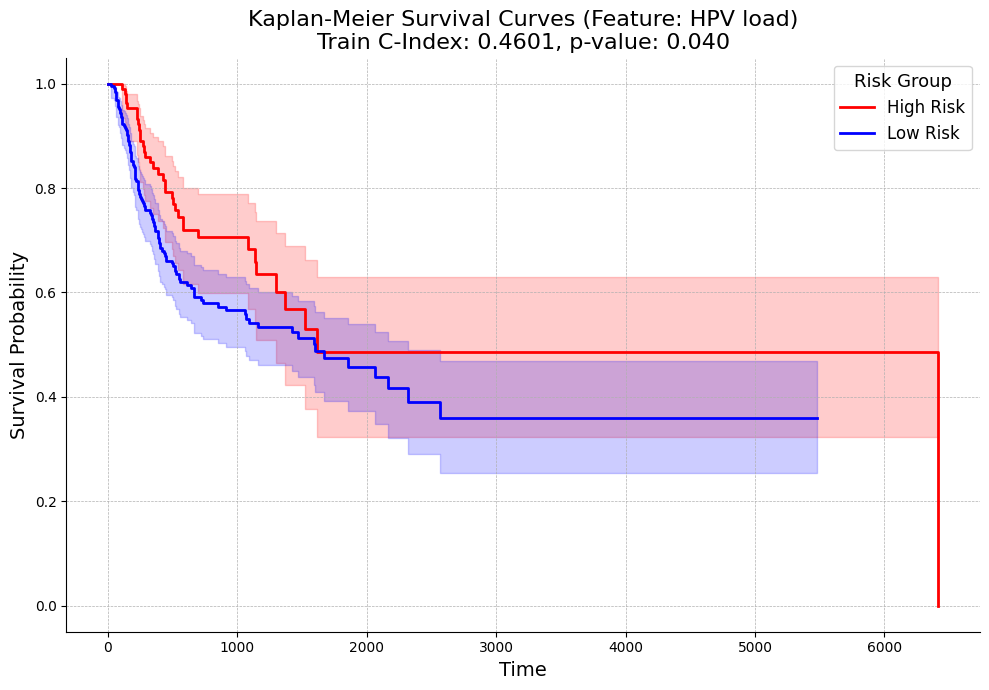


Risk scores and barcodes for training set (Feature: HPV load):
    Variable Name       Barcode  Risk Score  Risk Class
0        HPV load  TCGA-UF-A718    0.151387           0
1        HPV load  TCGA-BA-5555    0.145850           1
2        HPV load  TCGA-BB-7872    0.149826           0
3        HPV load  TCGA-CV-7236    0.148614           0
4        HPV load  TCGA-BB-7870    0.144716           1
..            ...           ...         ...         ...
355      HPV load  TCGA-CV-A460    0.150897           0
356      HPV load  TCGA-CN-A642    0.148396           0
357      HPV load  TCGA-CQ-7067    0.145204           1
358      HPV load  TCGA-QK-A6V9   -0.231818           1
359      HPV load  TCGA-BA-5556    0.146774           1

[360 rows x 4 columns]

Analyzing Variable: patient.histological_type
Starting 5-Fold Cross-Validation for patient.histological_type...

Variable: patient.histological_type | Fold 1
Variable: patient.histological_type | Fold 1 C-Index: 0.5104

Variable: patient.h

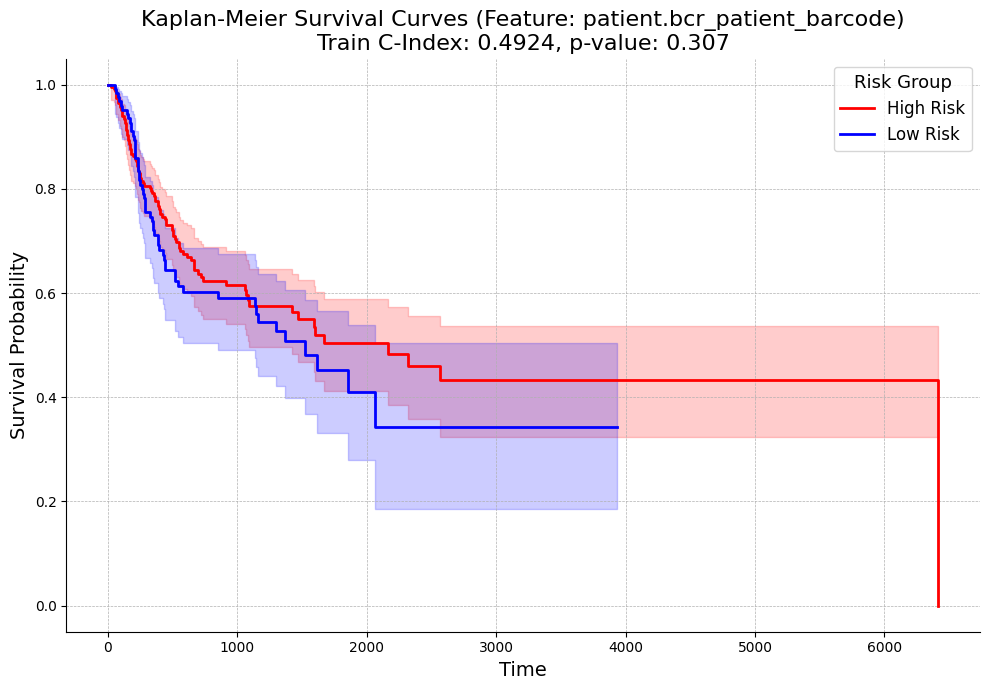


Risk scores and barcodes for training set (Feature: patient.bcr_patient_barcode):
                   Variable Name       Barcode  Risk Score  Risk Class
0    patient.bcr_patient_barcode  TCGA-UF-A718   -0.822721           1
1    patient.bcr_patient_barcode  TCGA-BA-5555   -0.019485           0
2    patient.bcr_patient_barcode  TCGA-BB-7872   -0.088333           0
3    patient.bcr_patient_barcode  TCGA-CV-7236   -0.419191           1
4    patient.bcr_patient_barcode  TCGA-BB-7870   -0.084509           0
..                           ...           ...         ...         ...
355  patient.bcr_patient_barcode  TCGA-CV-A460   -0.520551           1
356  patient.bcr_patient_barcode  TCGA-CN-A642   -0.222206           0
357  patient.bcr_patient_barcode  TCGA-CQ-7067   -0.268106           0
358  patient.bcr_patient_barcode  TCGA-QK-A6V9   -0.782560           1
359  patient.bcr_patient_barcode  TCGA-BA-5556   -0.021397           0

[360 rows x 4 columns]

Analyzing Variable: patient.icd_o_3_site

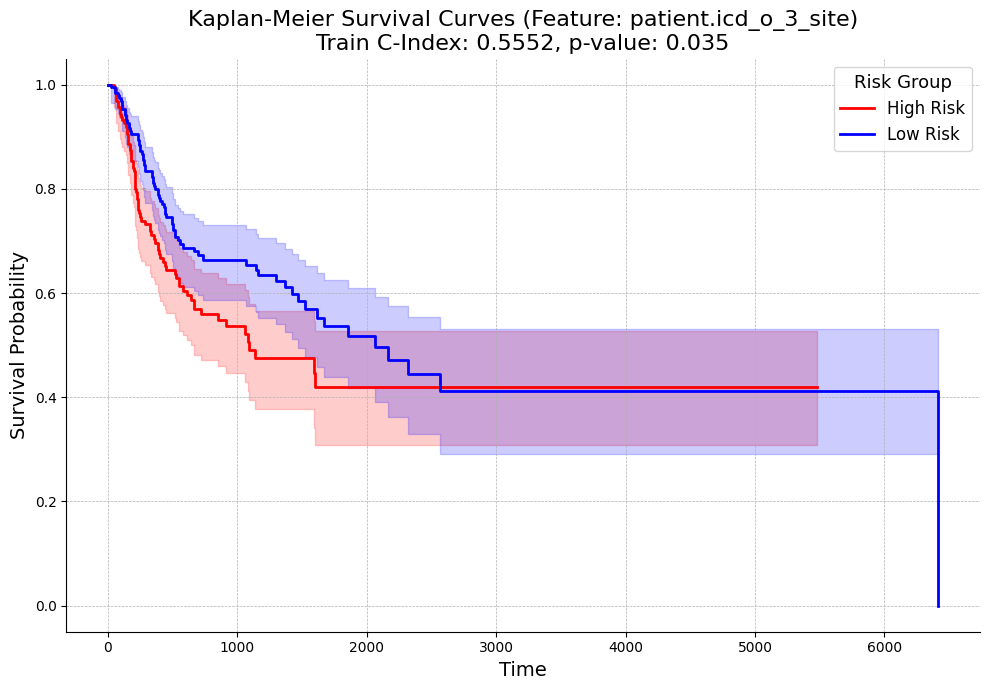


Risk scores and barcodes for training set (Feature: patient.icd_o_3_site):
            Variable Name       Barcode  Risk Score  Risk Class
0    patient.icd_o_3_site  TCGA-UF-A718    0.141312           0
1    patient.icd_o_3_site  TCGA-BA-5555    0.141312           0
2    patient.icd_o_3_site  TCGA-BB-7872    0.085725           0
3    patient.icd_o_3_site  TCGA-CV-7236    0.012651           1
4    patient.icd_o_3_site  TCGA-BB-7870    0.141312           0
..                    ...           ...         ...         ...
355  patient.icd_o_3_site  TCGA-CV-A460    0.141312           0
356  patient.icd_o_3_site  TCGA-CN-A642    0.012651           1
357  patient.icd_o_3_site  TCGA-CQ-7067    0.085725           0
358  patient.icd_o_3_site  TCGA-QK-A6V9    0.104254           0
359  patient.icd_o_3_site  TCGA-BA-5556    0.057932           1

[360 rows x 4 columns]

Analyzing Variable: patient.icd_o_3_histology
Starting 5-Fold Cross-Validation for patient.icd_o_3_histology...

Variable: patient.

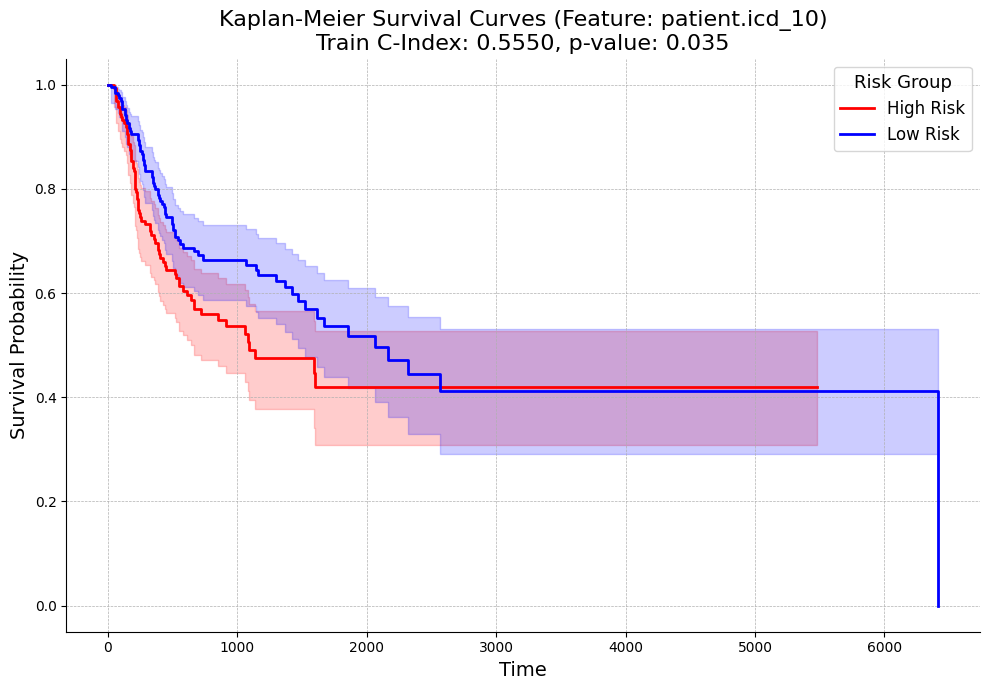


Risk scores and barcodes for training set (Feature: patient.icd_10):
      Variable Name       Barcode  Risk Score  Risk Class
0    patient.icd_10  TCGA-UF-A718    0.026153           0
1    patient.icd_10  TCGA-BA-5555    0.026153           0
2    patient.icd_10  TCGA-BB-7872    0.017807           0
3    patient.icd_10  TCGA-CV-7236    0.007004           1
4    patient.icd_10  TCGA-BB-7870    0.026153           0
..              ...           ...         ...         ...
355  patient.icd_10  TCGA-CV-A460    0.026153           0
356  patient.icd_10  TCGA-CN-A642    0.007004           1
357  patient.icd_10  TCGA-CQ-7067    0.017807           0
358  patient.icd_10  TCGA-QK-A6V9    0.020589           0
359  patient.icd_10  TCGA-BA-5556    0.013635           1

[360 rows x 4 columns]

Analyzing Variable: patient.anatomic_neoplasm_subdivision
Starting 5-Fold Cross-Validation for patient.anatomic_neoplasm_subdivision...

Variable: patient.anatomic_neoplasm_subdivision | Fold 1
Variable: patie

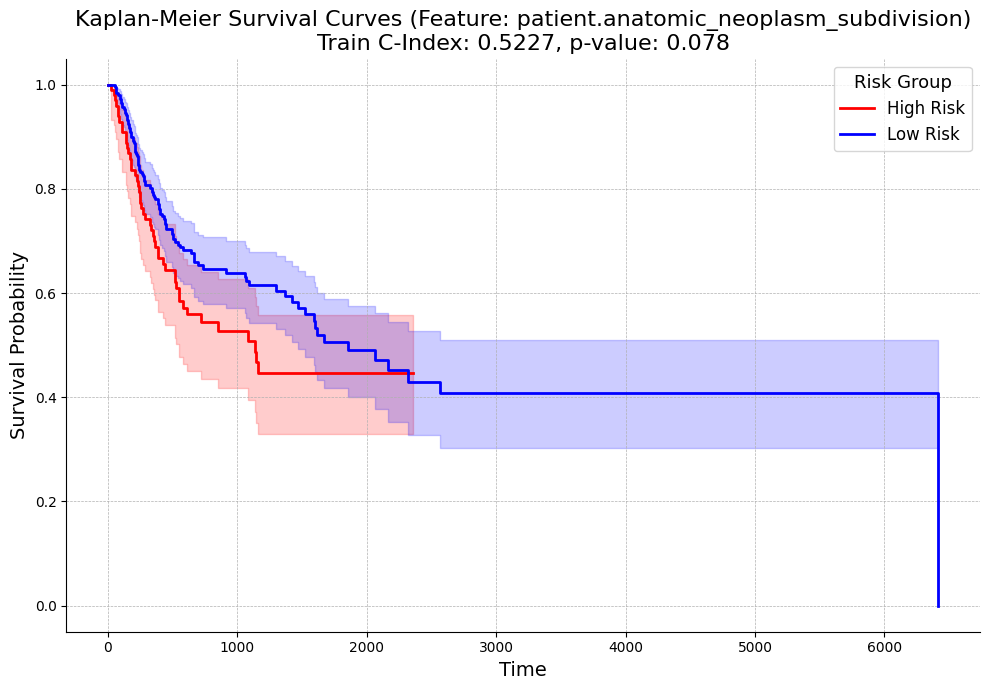


Risk scores and barcodes for training set (Feature: patient.anatomic_neoplasm_subdivision):
                             Variable Name       Barcode  Risk Score  \
0    patient.anatomic_neoplasm_subdivision  TCGA-UF-A718    0.122164   
1    patient.anatomic_neoplasm_subdivision  TCGA-BA-5555    0.122164   
2    patient.anatomic_neoplasm_subdivision  TCGA-BB-7872    0.185823   
3    patient.anatomic_neoplasm_subdivision  TCGA-CV-7236    0.185823   
4    patient.anatomic_neoplasm_subdivision  TCGA-BB-7870    0.122164   
..                                     ...           ...         ...   
355  patient.anatomic_neoplasm_subdivision  TCGA-CV-A460    0.122164   
356  patient.anatomic_neoplasm_subdivision  TCGA-CN-A642    0.058506   
357  patient.anatomic_neoplasm_subdivision  TCGA-CQ-7067    0.185823   
358  patient.anatomic_neoplasm_subdivision  TCGA-QK-A6V9    0.228262   
359  patient.anatomic_neoplasm_subdivision  TCGA-BA-5556    0.058506   

     Risk Class  
0             0  
1     

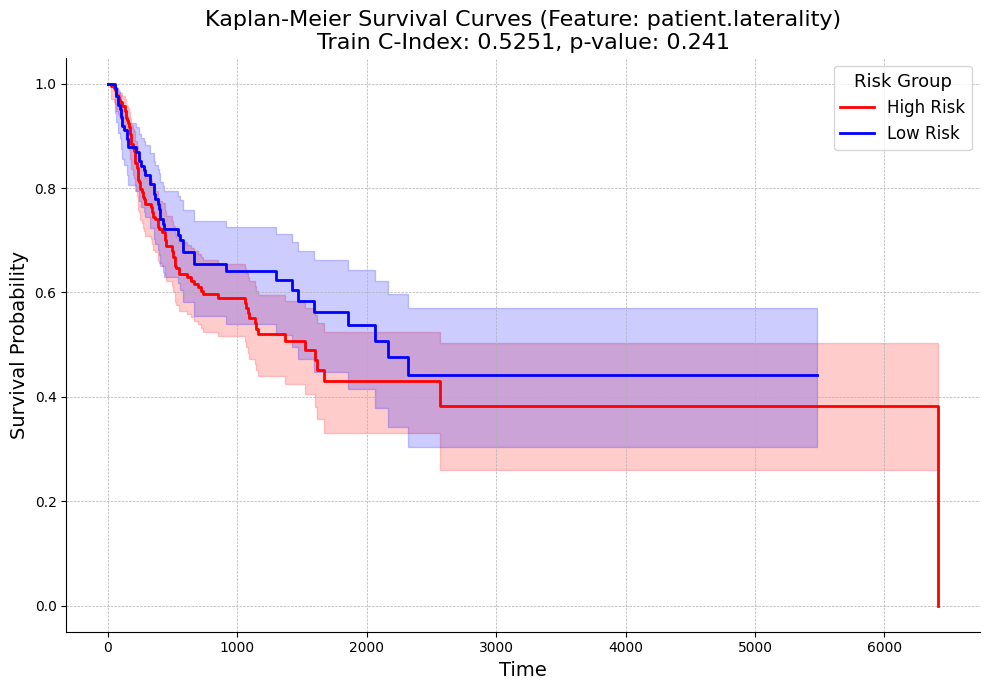


Risk scores and barcodes for training set (Feature: patient.laterality):
          Variable Name       Barcode  Risk Score  Risk Class
0    patient.laterality  TCGA-UF-A718    0.033565           1
1    patient.laterality  TCGA-BA-5555    0.079224           1
2    patient.laterality  TCGA-BB-7872    0.079224           1
3    patient.laterality  TCGA-CV-7236   -0.070583           1
4    patient.laterality  TCGA-BB-7870    0.124568           0
..                  ...           ...         ...         ...
355  patient.laterality  TCGA-CV-A460    0.124568           0
356  patient.laterality  TCGA-CN-A642    0.124568           0
357  patient.laterality  TCGA-CQ-7067   -0.070583           1
358  patient.laterality  TCGA-QK-A6V9    0.079224           1
359  patient.laterality  TCGA-BA-5556    0.124568           0

[360 rows x 4 columns]

Analyzing Variable: patient.primary_lymph_node_presentation_assessment
Starting 5-Fold Cross-Validation for patient.primary_lymph_node_presentation_assessmen

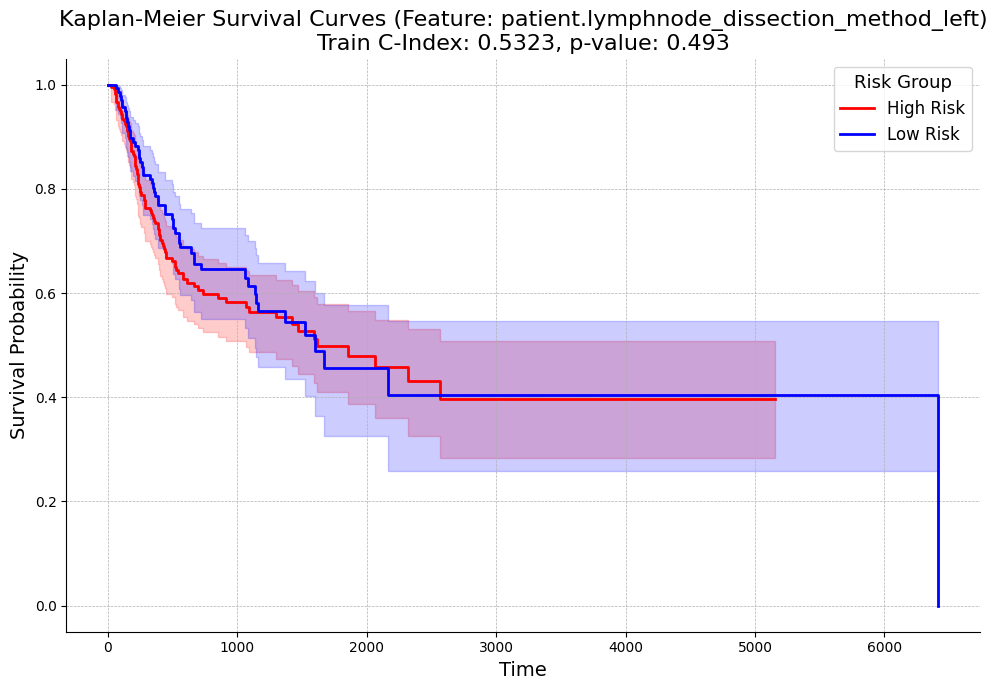


Risk scores and barcodes for training set (Feature: patient.lymphnode_dissection_method_left):
                                Variable Name       Barcode  Risk Score  \
0    patient.lymphnode_dissection_method_left  TCGA-UF-A718   -0.000053   
1    patient.lymphnode_dissection_method_left  TCGA-BA-5555   -0.000240   
2    patient.lymphnode_dissection_method_left  TCGA-BB-7872    0.000683   
3    patient.lymphnode_dissection_method_left  TCGA-CV-7236   -0.000053   
4    patient.lymphnode_dissection_method_left  TCGA-BB-7870    0.000683   
..                                        ...           ...         ...   
355  patient.lymphnode_dissection_method_left  TCGA-CV-A460   -0.000053   
356  patient.lymphnode_dissection_method_left  TCGA-CN-A642   -0.000053   
357  patient.lymphnode_dissection_method_left  TCGA-CQ-7067    0.000683   
358  patient.lymphnode_dissection_method_left  TCGA-QK-A6V9    0.000683   
359  patient.lymphnode_dissection_method_left  TCGA-BA-5556   -0.000240   

   

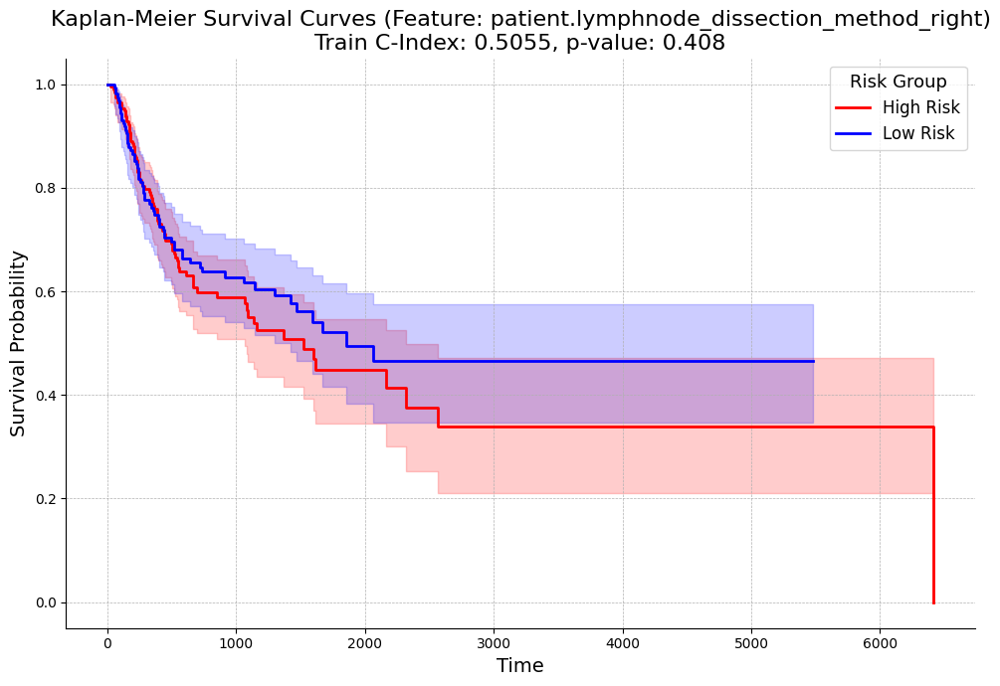


Risk scores and barcodes for training set (Feature: patient.lymphnode_dissection_method_right):
                                 Variable Name       Barcode  Risk Score  \
0    patient.lymphnode_dissection_method_right  TCGA-UF-A718    0.246382   
1    patient.lymphnode_dissection_method_right  TCGA-BA-5555    0.022470   
2    patient.lymphnode_dissection_method_right  TCGA-BB-7872    0.102682   
3    patient.lymphnode_dissection_method_right  TCGA-CV-7236    0.246382   
4    patient.lymphnode_dissection_method_right  TCGA-BB-7870    0.102682   
..                                         ...           ...         ...   
355  patient.lymphnode_dissection_method_right  TCGA-CV-A460    0.246382   
356  patient.lymphnode_dissection_method_right  TCGA-CN-A642    0.246382   
357  patient.lymphnode_dissection_method_right  TCGA-CQ-7067    0.102682   
358  patient.lymphnode_dissection_method_right  TCGA-QK-A6V9    0.102682   
359  patient.lymphnode_dissection_method_right  TCGA-BA-5556    0.0

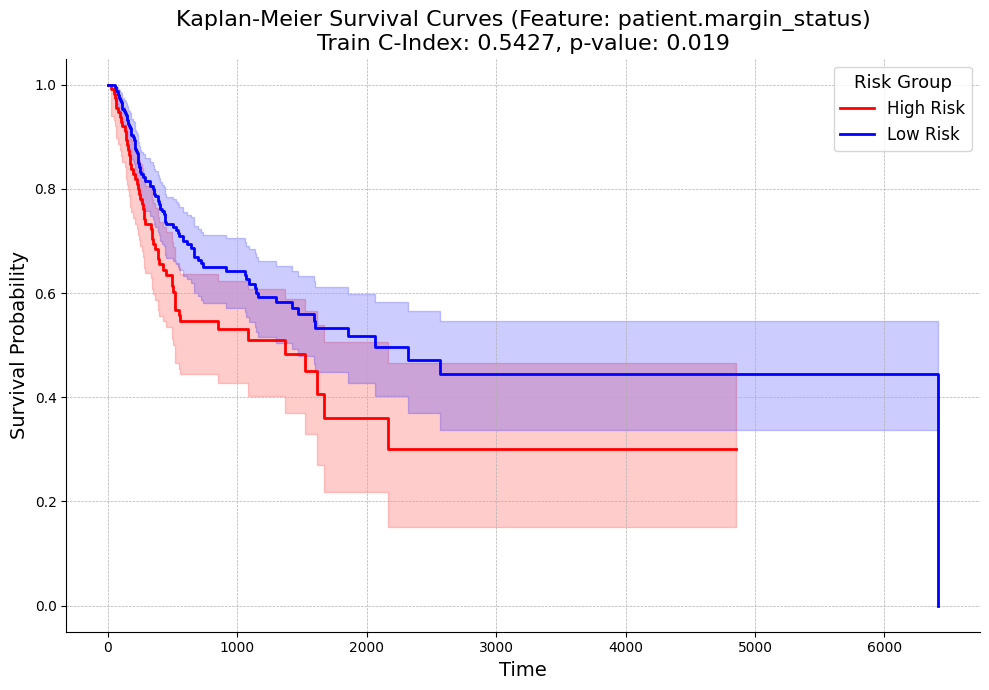


Risk scores and barcodes for training set (Feature: patient.margin_status):
             Variable Name       Barcode  Risk Score  Risk Class
0    patient.margin_status  TCGA-UF-A718   -0.064015           0
1    patient.margin_status  TCGA-BA-5555   -0.064015           0
2    patient.margin_status  TCGA-BB-7872   -0.117068           1
3    patient.margin_status  TCGA-CV-7236   -0.064015           0
4    patient.margin_status  TCGA-BB-7870   -0.064015           0
..                     ...           ...         ...         ...
355  patient.margin_status  TCGA-CV-A460   -0.064015           0
356  patient.margin_status  TCGA-CN-A642   -0.117068           1
357  patient.margin_status  TCGA-CQ-7067   -0.064015           0
358  patient.margin_status  TCGA-QK-A6V9   -0.064015           0
359  patient.margin_status  TCGA-BA-5556   -0.169772           1

[360 rows x 4 columns]

Analyzing Variable: patient.presence_of_pathological_nodal_extracapsular_spread
Starting 5-Fold Cross-Validation for p

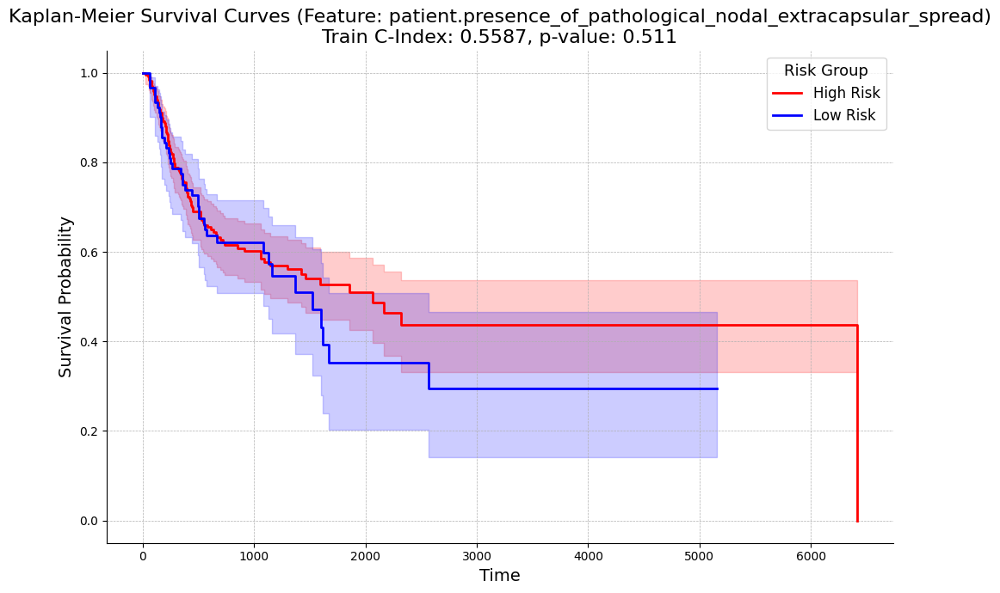


Risk scores and barcodes for training set (Feature: patient.presence_of_pathological_nodal_extracapsular_spread):
                                         Variable Name       Barcode  \
0    patient.presence_of_pathological_nodal_extraca...  TCGA-UF-A718   
1    patient.presence_of_pathological_nodal_extraca...  TCGA-BA-5555   
2    patient.presence_of_pathological_nodal_extraca...  TCGA-BB-7872   
3    patient.presence_of_pathological_nodal_extraca...  TCGA-CV-7236   
4    patient.presence_of_pathological_nodal_extraca...  TCGA-BB-7870   
..                                                 ...           ...   
355  patient.presence_of_pathological_nodal_extraca...  TCGA-CV-A460   
356  patient.presence_of_pathological_nodal_extraca...  TCGA-CN-A642   
357  patient.presence_of_pathological_nodal_extraca...  TCGA-CQ-7067   
358  patient.presence_of_pathological_nodal_extraca...  TCGA-QK-A6V9   
359  patient.presence_of_pathological_nodal_extraca...  TCGA-BA-5556   

     Risk Score  Ris

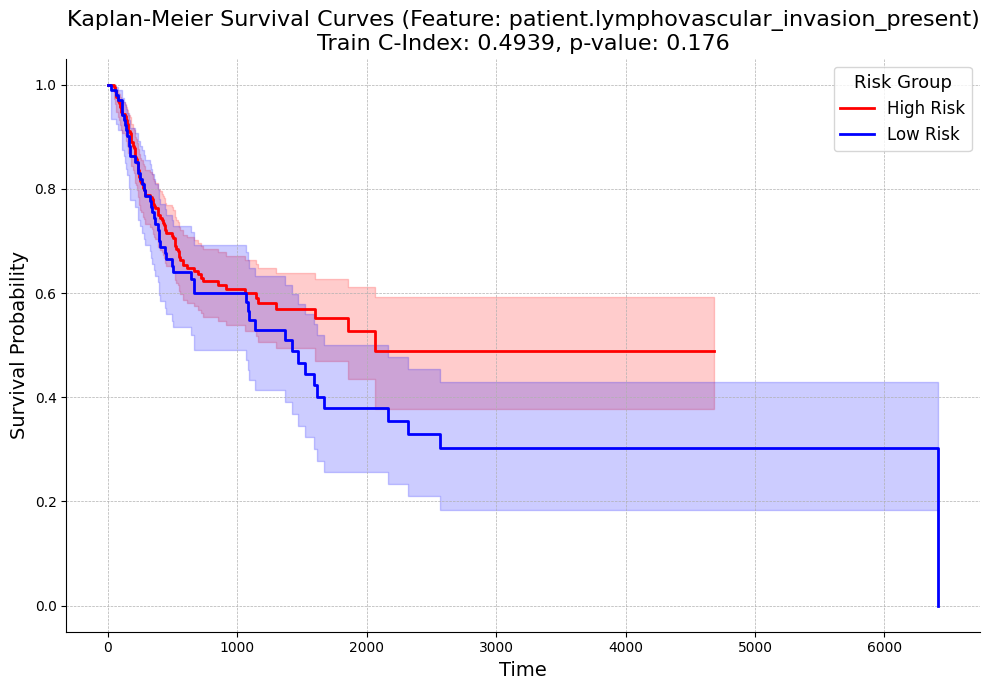


Risk scores and barcodes for training set (Feature: patient.lymphovascular_invasion_present):
                               Variable Name       Barcode  Risk Score  \
0    patient.lymphovascular_invasion_present  TCGA-UF-A718    0.006546   
1    patient.lymphovascular_invasion_present  TCGA-BA-5555    0.006546   
2    patient.lymphovascular_invasion_present  TCGA-BB-7872    0.019582   
3    patient.lymphovascular_invasion_present  TCGA-CV-7236   -0.006940   
4    patient.lymphovascular_invasion_present  TCGA-BB-7870    0.006546   
..                                       ...           ...         ...   
355  patient.lymphovascular_invasion_present  TCGA-CV-A460    0.019582   
356  patient.lymphovascular_invasion_present  TCGA-CN-A642   -0.006940   
357  patient.lymphovascular_invasion_present  TCGA-CQ-7067    0.006546   
358  patient.lymphovascular_invasion_present  TCGA-QK-A6V9    0.006546   
359  patient.lymphovascular_invasion_present  TCGA-BA-5556    0.006546   

     Risk Class 

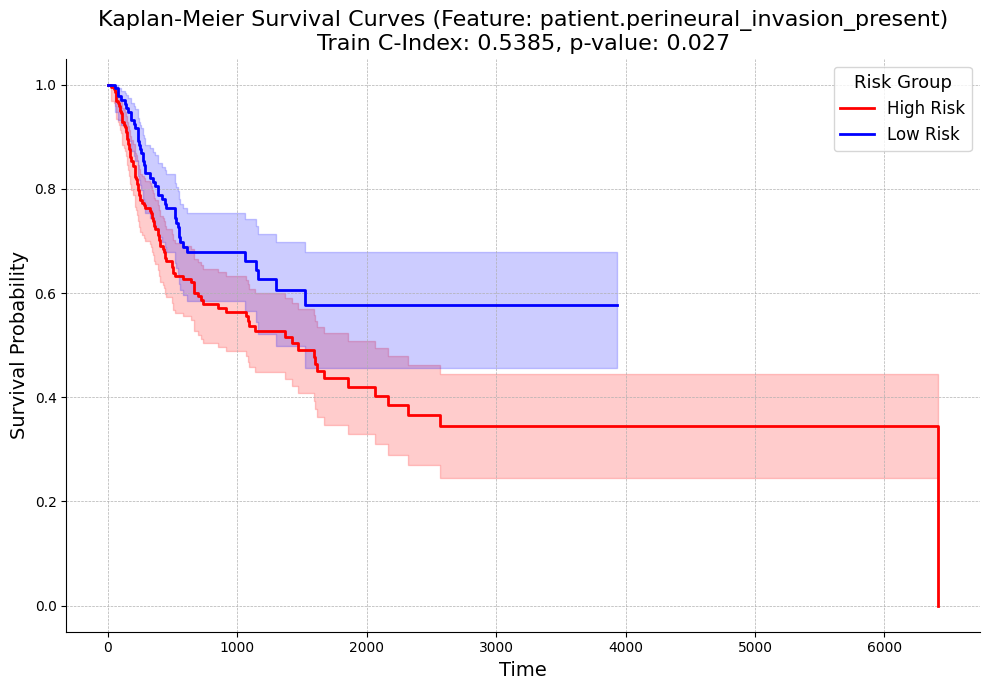


Risk scores and barcodes for training set (Feature: patient.perineural_invasion_present):
                           Variable Name       Barcode  Risk Score  Risk Class
0    patient.perineural_invasion_present  TCGA-UF-A718    0.035515           0
1    patient.perineural_invasion_present  TCGA-BA-5555    0.035515           0
2    patient.perineural_invasion_present  TCGA-BB-7872   -0.029110           1
3    patient.perineural_invasion_present  TCGA-CV-7236   -0.029110           1
4    patient.perineural_invasion_present  TCGA-BB-7870    0.035515           0
..                                   ...           ...         ...         ...
355  patient.perineural_invasion_present  TCGA-CV-A460   -0.044932           1
356  patient.perineural_invasion_present  TCGA-CN-A642   -0.029110           1
357  patient.perineural_invasion_present  TCGA-CQ-7067   -0.029110           1
358  patient.perineural_invasion_present  TCGA-QK-A6V9    0.035515           0
359  patient.perineural_invasion_present

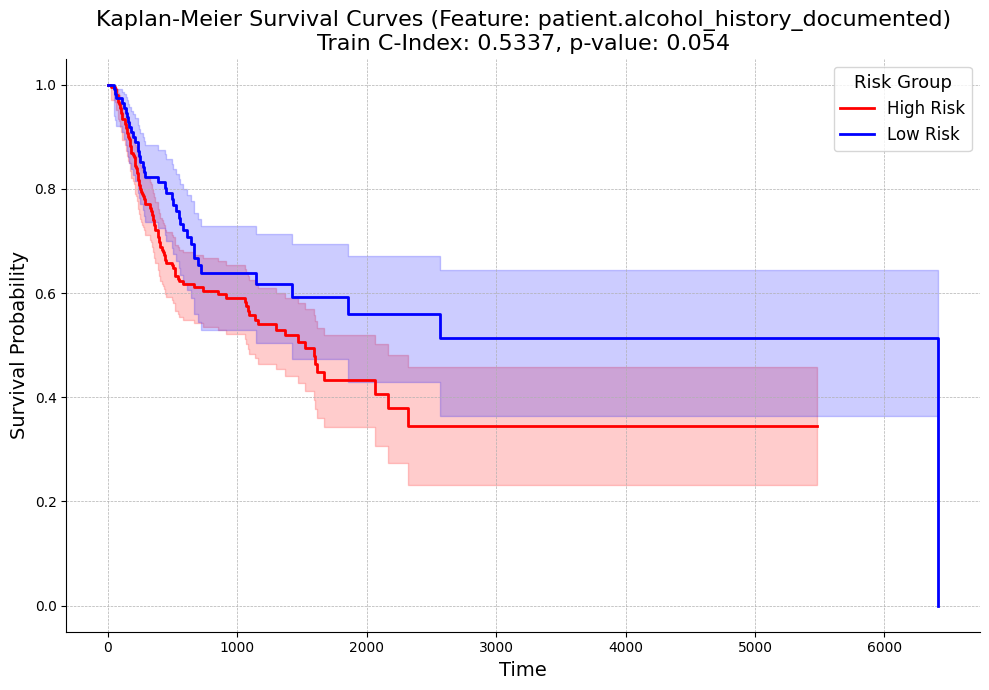


Risk scores and barcodes for training set (Feature: patient.alcohol_history_documented):
                          Variable Name       Barcode  Risk Score  Risk Class
0    patient.alcohol_history_documented  TCGA-UF-A718    0.197805           0
1    patient.alcohol_history_documented  TCGA-BA-5555   -0.031287           1
2    patient.alcohol_history_documented  TCGA-BB-7872   -0.031287           1
3    patient.alcohol_history_documented  TCGA-CV-7236    0.197805           0
4    patient.alcohol_history_documented  TCGA-BB-7870   -0.031287           1
..                                  ...           ...         ...         ...
355  patient.alcohol_history_documented  TCGA-CV-A460    0.197805           0
356  patient.alcohol_history_documented  TCGA-CN-A642   -0.031287           1
357  patient.alcohol_history_documented  TCGA-CQ-7067    0.197805           0
358  patient.alcohol_history_documented  TCGA-QK-A6V9    0.197805           0
359  patient.alcohol_history_documented  TCGA-BA-555

In [69]:
# -------------------------------------------
# Import Necessary Libraries
# -------------------------------------------
import os
import sys
import json  # For JSON handling
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tab_transformer_pytorch import FTTransformer
from pycox.models import CoxPH
from sksurv.metrics import concordance_index_censored
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
import torchtuples as tt
import warnings
import random
import seaborn as sns  # For enhanced plotting aesthetics
import matplotlib.pyplot as plt  # For plotting
from lifelines import KaplanMeierFitter  # For Kaplan-Meier plotting
from lifelines.statistics import logrank_test  # For log-rank test

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior for CUDA (optional)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------------------------
# Data Selection and Train/Test Split Using JSON Files
# -------------------------------------------

# Assume 'clinical_data_yes_id' is your input DataFrame with patient IDs
# Ensure 'clinical_data_yes_id' is defined before this script
# For example:
# clinical_data_yes_id = pd.read_csv('clinical_data.csv')  # Adjust as needed
# Here, we assume clinical_data_yes_id is already defined
clinical_data_test = clinical_data_yes_id.copy()

# Paths to the JSON files
original_split_json_path = 'svs_patient_map_PFI_DX_split.json'  # Original split JSON file
new_split_json_path = 'svs_patient_map_PFI_DX_split_variables.json'  # New split JSON file with variables

# Check if JSON files exist
if not os.path.exists(original_split_json_path):
    raise FileNotFoundError(f"The JSON file '{original_split_json_path}' was not found.")
if not os.path.exists(new_split_json_path):
    raise FileNotFoundError(f"The JSON file '{new_split_json_path}' was not found.")

# Load the original split JSON data
with open(original_split_json_path, 'r') as f:
    split_entries = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
split_df = pd.DataFrame(split_entries)

# Verify that 'file_name' exists in split_df
if 'file_name' not in split_df.columns:
    raise KeyError("'file_name' column not found in the split JSON data.")

# Function to extract 'patient.bcr_patient_barcode' from 'file_name'
def extract_barcode(file_name):
    """
    Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
    Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
    """
    return file_name[:12]

# Extract 'patient.bcr_patient_barcode' in split_df
split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

# Create a mapping from 'patient.bcr_patient_barcode' to 'split'
barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))

# Map the 'split' to the clinical data
clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

# Check for any missing splits
missing_splits = clinical_data_test['split'].isnull().sum()
if missing_splits > 0:
    print(f"Warning: {missing_splits} entries do not have a split assignment.")
    # Optionally, you can decide how to handle these entries
    clinical_data_test = clinical_data_test.dropna(subset=['split'])

# Create boolean masks for training and testing sets
train_mask = clinical_data_test['split'] == 'train'
test_mask = clinical_data_test['split'] == 'test'

# Print the number of train and test samples
print(f"Number of training samples: {train_mask.sum()}")
print(f"Number of testing samples: {test_mask.sum()}")

# -------------------------------------------
# Keep 'patient.bcr_patient_barcode' for later use and then drop 'split'
# -------------------------------------------

patient_barcodes = clinical_data_test['patient.bcr_patient_barcode'].reset_index(drop=True)

# After mapping, drop 'split' as it is no longer needed
clinical_data_test = clinical_data_test.drop(columns=['split'])

# -------------------------------------------
# Data Preprocessing
# -------------------------------------------

# Remove clinical stage system related columns
columns_to_drop = [
    'patient.stage_event.clinical_stage',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
    'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
]
clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Define mapping dictionaries based on your data
t_mapping = {
    'TX': -1,    # Primary tumor cannot be assessed
    'T0': 0,     # No evidence of primary tumor
    'T1': 1,
    'T2': 2,
    'T3': 3,
    'T4': 4,
    'T4A': 5,
    'T4B': 6
}

n_mapping = {
    'NX': -1,    # Regional lymph nodes cannot be assessed
    'N0': 0,
    'N1': 1,
    'N2': 2,
    'N2A': 3,
    'N2B': 4,
    'N2C': 5,
    'N3': 6
}

m_mapping = {
    'MX': -1,    # Distant metastasis cannot be assessed
    'M0': 0,
    'M1': 1
}

stage_mapping = {
    'STAGE I': 1,
    'STAGE II': 2,
    'STAGE III': 3,
    'STAGE IV': 4,
    'STAGE IVA': 5,
    'STAGE IVB': 6,
    'STAGE IVC': 7
}

# Functions to encode pathologic T, N, M, and stage categories
def encode_t(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return t_mapping.get(value, -1)

def encode_n(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return n_mapping.get(value, -1)

def encode_m(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return m_mapping.get(value, -1)

def encode_stage(value):
    if pd.isnull(value):
        return -1
    value = str(value).upper().strip()
    return stage_mapping.get(value, -1)

# Apply encoding directly to the original columns to overwrite them
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
    'patient.stage_event.pathologic_stage'].apply(encode_stage)

# Fill NaN values in 'patient.days_to_birth' with the mean
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

print("\nAge of Patients (First 5 entries):")
print(clinical_data_test['age_of_patient'].head())

# Define numerical columns, including the encoded pathologic columns
num_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'age_of_patient',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage',
    'HPV load'
]

# Convert numerical columns to float and handle conversion errors
for col in num_cols:
    clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

# Fill NaN values in numerical columns
# Define columns related to tobacco and alcohol consumption
tobacco_alcohol_cols = [
    'patient.lymphnodes_ratio_positive_by_ihc',
    'patient.lymphnodes_ratio_positive_by_he',
    'patient.tobacco_smoking_history',
    'patient.year_of_tobacco_smoking_onset',
    'patient.number_pack_years_smoked',
    'patient.stopped_smoking_year',
    'patient.frequency_of_alcohol_consumption',
    'patient.amount_of_alcohol_consumption_per_day',
    'HPV load'
]

# Fill NaN values with -1 in tobacco and alcohol-related columns
clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

# Fill NaN values in 'patient.days_to_birth' with the mean (redundant, already done)
clinical_data_test['patient.days_to_birth'].fillna(
    clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

# Fill NaN values with -1 in the encoded pathologic columns
pathologic_cols = [
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
    'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
    'patient.stage_event.pathologic_stage'
]
clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

# Handle categorical variables
# Identify categorical columns (object dtype)
categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

# Fill NaN values in categorical columns with the string "missing"
clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

# Encode categorical variables by converting them to categorical dtype and then to codes
for col in categorical_cols:
    clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

# -------------------------------------------
# Prepare Survival Data
# -------------------------------------------

# Fill NaN values in 'PFI.time' with the mean
clinical_data_test['PFI.time'].fillna(
    clinical_data_test['PFI.time'].mean(), inplace=True
)

# Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
clinical_data_test['PFI'].fillna(0, inplace=True)

# Extract survival data
time = clinical_data_test['PFI.time'].values.astype(float)
event = clinical_data_test['PFI'].values.astype(bool)

time_copy = time.copy()
event_copy = event.copy()

# -------------------------------------------
# Feature Engineering
# -------------------------------------------

# Scale numerical features
scaler = StandardScaler()
scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])

# Convert scaled numerical features back to DataFrame for compatibility
scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)

# Combine scaled numerical features and categorical features into a single DataFrame
X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)

print("\nSample Feature Vector (First Row):")
print(X.iloc[0])

X_copy = X.copy()

# -------------------------------------------
# Data Splitting Using Predefined Split
# -------------------------------------------

# Reset indices to ensure alignment
clinical_data_test.reset_index(drop=True, inplace=True)
X.reset_index(drop=True, inplace=True)
patient_barcodes.reset_index(drop=True, inplace=True)

# Create masks based on the splits
train_mask = train_mask.reset_index(drop=True)
test_mask = test_mask.reset_index(drop=True)

# Create train and test sets based on the masks
X_train_df = X[train_mask]
X_test_df = X[test_mask]
y_train_event = event[train_mask]
y_test_event = event[test_mask]
y_train_time = time[train_mask]
y_test_time = time[test_mask]
patient_barcodes_train = patient_barcodes[train_mask]
patient_barcodes_test = patient_barcodes[test_mask]

# Verify the lengths to prevent IndexError
print(f"\nTraining set size: {X_train_df.shape[0]}")
print(f"Testing set size: {X_test_df.shape[0]}")

# -------------------------------------------
# Preparing Data for FTTransformer
# -------------------------------------------

# Identify numerical and categorical columns after preprocessing
categorical_columns = list(categorical_cols)
numerical_columns = num_cols

# Prepare data for FTTransformer
def prepare_data(X, categorical_columns, numerical_columns):
    # For categorical features
    cat_features = X[categorical_columns]
    # For numerical features
    num_features = X[numerical_columns]
    return cat_features, num_features

X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

# -------------------------------------------
# Convert Data to PyTorch Tensors
# -------------------------------------------

# Convert data to torch tensors
def to_tensor(x, dtype):
    return torch.tensor(x.values, dtype=dtype)

X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
X_train_num_tensor = to_tensor(X_train_num, torch.float32)
X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
X_test_num_tensor = to_tensor(X_test_num, torch.float32)

# -------------------------------------------
# Initialize FTTransformer (Pretrained)
# -------------------------------------------

# Get the number of unique categories for each categorical column
categories = [int(X_train_cat[col].max() + 1) for col in categorical_columns]

# Instantiate the FTTransformer model
device = 'cuda' if torch.cuda.is_available() else 'cpu'

ft_transformer = FTTransformer(
    categories=categories,                              # List of unique category counts
    num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
    dim=192,                                            # Embedding dimension size, adjust as needed
    depth=6,                                            # Number of transformer layers
    heads=8,                                            # Number of attention heads
    attn_dropout=0.1,                                   # Dropout for attention layers
    ff_dropout=0.1                                      # Dropout for feedforward layers
).to(device)

# Load pretrained weights if available
# Uncomment and modify the following line if you have pretrained weights
# ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

# Set the model to evaluation mode
ft_transformer.eval()

# -------------------------------------------
# Generating Embeddings
# -------------------------------------------

def get_embeddings(model, X_cat, X_num):
    model.eval()
    with torch.no_grad():
        categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
        numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
        embeddings = model(categorical, numerical, return_embedding=True)
        return embeddings.cpu().numpy()

# Generate embeddings for training and test sets
train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

# Verify the shape of the embeddings
print(f"\nTrain Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

# -------------------------------------------
# Define the Neural Network Architecture for CoxPH
# -------------------------------------------

# Define the neural network architecture
num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

out_features = 1  # Output dimension (single risk score)
batch_norm = True  # Use batch normalization
dropout = 0.4  # Dropout rate to prevent overfitting
output_bias = False  # Bias term in the output layer

# Initialize the MLPVanilla model with reduced input features 
net = tt.practical.MLPVanilla(
    in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
    num_nodes=num_nodes,
    out_features=out_features,
    batch_norm=batch_norm,
    dropout=dropout,
    output_bias=output_bias
)

# Initialize the CoxPH model with the network and optimizer
optimizer = tt.optim.Adam(lr=1e-3)
cox_ph = CoxPH(net, optimizer)

# -------------------------------------------
# CoxPH Analysis with 5-Fold Cross-Validation
# -------------------------------------------

# Prepare survival data
durations_train = y_train_time.astype(np.float32)
events_train = y_train_event.astype(np.int64)

# Ensure embeddings are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
c_index_scores = []

print("\nStarting 5-Fold Cross-Validation...\n")

# Initialize a dictionary to store univariate results
univariate_risk_classifications = {}

for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
    print(f"Fold {fold + 1}")
    
    # Split data
    X_train_cv = train_embeddings[train_idx_cv]
    y_train_cv_durations = durations_train[train_idx_cv]
    y_train_cv_events = events_train[train_idx_cv]
    
    X_val_cv = train_embeddings[val_idx_cv]
    y_val_cv_durations = durations_train[val_idx_cv]
    y_val_cv_events = events_train[val_idx_cv]
    
    # Ensure arrays are contiguous
    X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
    y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
    y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)
    
    # Initialize a new instance of the network for each fold to avoid weight sharing
    net_cv = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    
    # Initialize CoxPH model for this fold
    optimizer_cv = tt.optim.Adam(lr=1e-3)
    cox_ph_cv = CoxPH(net_cv, optimizer_cv)
    
    # Fit the model
    cox_ph_cv.fit(
        X_train_cv,
        (y_train_cv_events, y_train_cv_durations),
        batch_size=64,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on validation set
    risk_val = cox_ph_cv.predict(X_val_cv).squeeze()
    
    # Compute C-Index
    c_index = concordance_index_censored(
        y_val_cv_events.astype(bool),
        y_val_cv_durations,
        -risk_val  # Use negative risk for proper ordering
    )[0]
    
    print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")
    
    c_index_scores.append(c_index)

# Calculate Cross-Validation Mean and Uncertainty
c_index_mean = np.mean(c_index_scores)
c_index_std = np.std(c_index_scores)
c_index_ci_lower = np.percentile(c_index_scores, 2.5)
c_index_ci_upper = np.percentile(c_index_scores, 97.5)

print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

# -------------------------------------------
# Train Final CoxPH Model on Entire Training Set
# -------------------------------------------

print("\nTraining Final CoxPH Model on Entire Training Set...\n")

# Ensure arrays are contiguous
train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
events_train = np.ascontiguousarray(events_train, dtype=np.int64)

# Fit the final model on the entire training set
cox_ph.fit(
    train_embeddings,
    (events_train, durations_train),
    batch_size=64,
    epochs=100,
    verbose=False
)

print("Final CoxPH Model Trained Successfully.")

# -------------------------------------------
# Evaluate on Test Set
# -------------------------------------------

print("\nEvaluating on Test Set...\n")

# Prepare test data
durations_test = y_test_time.astype(np.float32)
events_test = y_test_event.astype(np.int64)
test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

# Predict risk scores on test set
risk_test = cox_ph.predict(test_embeddings).squeeze()

# Compute C-Index on Test Set
c_index_test = concordance_index_censored(
    events_test.astype(bool),
    durations_test,
    -risk_test  # Use negative risk for proper ordering
)[0]

print(f"Test C-Index: {c_index_test:.4f}")

# -------------------------------------------
# Bootstrapping for Test C-Index Uncertainty
# -------------------------------------------

n_bootstraps = 1000
c_index_bootstrap = []

print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

for i in range(n_bootstraps):
    # Resample test set with replacement
    indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
    X_test_bs = test_embeddings[indices]
    durations_test_bs = durations_test[indices]
    events_test_bs = events_test[indices]
    
    # Predict risk scores
    risk_bs = cox_ph.predict(X_test_bs).squeeze()
    
    # Compute C-Index
    c_index_bs = concordance_index_censored(
        events_test_bs.astype(bool),
        durations_test_bs,
        -risk_bs  # Use negative risk for proper ordering
    )[0]
    
    c_index_bootstrap.append(c_index_bs)
    
    # Optional: Print progress every 100 iterations
    if (i + 1) % 100 == 0:
        print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

# Calculate Bootstrapped C-Index Statistics
c_index_test_mean = np.mean(c_index_bootstrap)
c_index_test_std = np.std(c_index_bootstrap)
c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

# -------------------------------------------
# Univariate Analysis
# -------------------------------------------

print("\nStarting Univariate Analysis...\n")

# Combine numerical and categorical columns for univariate analysis
all_features = numerical_columns + categorical_columns

# Initialize a dictionary to store results
univariate_results = {}

# Initialize a dictionary to store risk classifications for each variable
variable_risk_classifications = {feature: {} for feature in all_features}

# Define a function to perform optimal threshold selection and Kaplan-Meier plotting
def plot_kaplan_meier(durations, events, risk_scores, train_c_index, feature_name, title_suffix=''):
    """
    Performs optimal threshold selection based on log-rank test, stratifies patients,
    and plots Kaplan-Meier survival curves for high-risk and low-risk groups.
    
    Parameters:
        durations (array-like): Survival times.
        events (array-like): Event indicators.
        risk_scores (array-like): Predicted risk scores.
        train_c_index (float): C-Index value for the training set.
        feature_name (str): Name of the feature being analyzed.
        title_suffix (str): Additional string to append to the plot title.
    
    Returns:
        threshold (float): Optimal risk score threshold.
        p_value (float): P-value from log-rank test.
        classification (array-like): Array indicating group assignments (1 for high risk, 0 for low risk).
    """
    unique_risk_scores = np.sort(np.unique(risk_scores))
    
    # Initialize variables
    best_threshold = None
    min_p_value = 1.0
    
    # Minimum group size (at least 25% of patients in each group)
    total_patients = len(risk_scores)
    min_group_size = total_patients * 0.25
    
    # Iterate through possible thresholds to find the one with the lowest p-value
    for threshold in unique_risk_scores[1:-1]:
        # Assign patients to groups
        is_high_risk = risk_scores <= threshold  # High risk have lower risk scores
        is_low_risk = risk_scores > threshold
    
        # Calculate group sizes
        group_high_size = is_high_risk.sum()
        group_low_size = is_low_risk.sum()
    
        # Ensure each group has at least the minimum number of patients
        if group_high_size < min_group_size or group_low_size < min_group_size:
            continue  # Skip thresholds that result in small groups
    
        # Check if both groups have events
        if events[is_high_risk].sum() == 0 or events[is_low_risk].sum() == 0:
            continue  # Skip thresholds where one group has no events
    
        # Perform log-rank test
        results = logrank_test(
            durations[is_high_risk],
            durations[is_low_risk],
            event_observed_A=events[is_high_risk],
            event_observed_B=events[is_low_risk]
        )
        p_value = results.p_value
    
        # Update the best threshold if p-value is lower
        if p_value < min_p_value:
            min_p_value = p_value
            best_threshold = threshold
    
    # Check if a valid threshold was found
    if best_threshold is None:
        print("No valid threshold found that satisfies the group size restriction.")
        classification = np.full(len(risk_scores), -1)
        return None, None, classification
    else:
        # Assign patients to groups based on the best threshold
        is_high_risk = risk_scores <= best_threshold  # High risk have lower risk scores
        is_low_risk = risk_scores > best_threshold
    
        # Assign classes: 1 for high risk, 0 for low risk
        classification = np.where(is_high_risk, 1, 0)
    
        # Confirm that the high-risk group has shorter survival times
        median_survival_high = np.median(durations[is_high_risk])
        median_survival_low = np.median(durations[is_low_risk])
    
        print(f"Median survival time - High Risk: {median_survival_high}")
        print(f"Median survival time - Low Risk: {median_survival_low}")
    
        # Ensure high-risk group has shorter survival times
        if median_survival_high >= median_survival_low:
            print("Warning: High-risk group does not have shorter median survival time compared to low-risk group.")
            # You may choose to investigate further or adjust the thresholding method
    
        print(f"Optimal threshold for risk score: {best_threshold:.4f}")
    
        # Format p-value as per your request
        if min_p_value < 0.001:
            p_value_formatted = "< 0.001"
        else:
            p_value_formatted = f"{min_p_value:.3f}"
        print(f"Minimum p-value from log-rank test: {p_value_formatted}")
    
        # Create a DataFrame for plotting
        data = pd.DataFrame({
            'duration': durations,
            'event': events,
            'group': np.where(classification == 1, 'High Risk', 'Low Risk')
        })
    
        # Initialize Kaplan-Meier Fitter
        kmf_high = KaplanMeierFitter()
        kmf_low = KaplanMeierFitter()
    
        plt.figure(figsize=(10, 7))
    
        # Fit the models
        kmf_high.fit(
            data['duration'][data['group'] == 'High Risk'],
            event_observed=data['event'][data['group'] == 'High Risk'],
            label='High Risk'
        )
        kmf_low.fit(
            data['duration'][data['group'] == 'Low Risk'],
            event_observed=data['event'][data['group'] == 'Low Risk'],
            label='Low Risk'
        )
    
        # Plot the survival curves with confidence intervals (error bands)
        ax = kmf_high.plot(ci_show=True, ci_alpha=0.2, linewidth=2, color='red')
        kmf_low.plot(ax=ax, ci_show=True, ci_alpha=0.2, linewidth=2, color='blue')
    
        # Customize the plot using Seaborn aesthetics
        sns.despine()
    
        # Add c-index and p-value to the plot
        plt.title(f'Kaplan-Meier Survival Curves{title_suffix}\nTrain C-Index: {train_c_index:.4f}, p-value: {p_value_formatted}', fontsize=16)
        plt.xlabel('Time', fontsize=14)
        plt.ylabel('Survival Probability', fontsize=14)
        plt.legend(title='Risk Group', fontsize=12, title_fontsize=13)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.tight_layout()
        plt.show()
    
        return best_threshold, min_p_value, classification

# Iterate through each feature
for feature in all_features:
    print(f"\nAnalyzing Variable: {feature}")
    
    # Prepare feature-specific data
    X_univ = X[[feature]].copy()
    
    # If the feature is numerical, ensure it's scaled
    if feature in numerical_columns:
        # Already scaled in X, no action needed
        pass
    else:
        # Categorical feature: ensure it's integer-encoded
        X_univ[feature] = X_univ[feature].astype(int)
    
    # Split the data into training and testing sets using the existing indices
    X_train_univ = X_univ[train_mask].values.astype(np.float32)
    X_test_univ = X_univ[test_mask].values.astype(np.float32)
    y_train_univ_durations = durations_train
    y_train_univ_events = events_train
    y_test_univ_durations = y_test_time.astype(np.float32)
    y_test_univ_events = y_test_event.astype(np.int64)
    patient_barcodes_train_univ = patient_barcodes_train.reset_index(drop=True)
    
    # Initialize KFold Cross-Validation
    kf_univ = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores_univ = []
    
    print(f"Starting 5-Fold Cross-Validation for {feature}...\n")
    
    for fold_univ, (train_idx_cv_univ, val_idx_cv_univ) in enumerate(kf_univ.split(X_train_univ)):
        print(f"Variable: {feature} | Fold {fold_univ + 1}")
        
        # Split data
        X_train_cv_univ = X_train_univ[train_idx_cv_univ]
        y_train_cv_durations_univ = y_train_univ_durations[train_idx_cv_univ]
        y_train_cv_events_univ = y_train_univ_events[train_idx_cv_univ]
        
        X_val_cv_univ = X_train_univ[val_idx_cv_univ]
        y_val_cv_durations_univ = y_train_univ_durations[val_idx_cv_univ]
        y_val_cv_events_univ = y_train_univ_events[val_idx_cv_univ]
        
        # Define the network architecture for univariate analysis
        # Using a simple network since there's only one input feature
        net_univ = tt.practical.MLPVanilla(
            in_features=1,
            num_nodes=[16, 8],  # Smaller network for univariate
            out_features=1,
            batch_norm=False,
            dropout=0.2,
            output_bias=False
        )
        
        # Initialize CoxPH model for this fold
        optimizer_univ = tt.optim.Adam(lr=1e-3)
        cox_ph_univ = CoxPH(net_univ, optimizer_univ)
        
        # Fit the model
        cox_ph_univ.fit(
            X_train_cv_univ,
            (y_train_cv_events_univ, y_train_cv_durations_univ),
            batch_size=32,
            epochs=300,
            verbose=False
        )
        
        # Predict risk scores on validation set
        risk_val_univ = cox_ph_univ.predict(X_val_cv_univ).squeeze()
        
        # Compute C-Index
        c_index_univ = concordance_index_censored(
            y_val_cv_events_univ.astype(bool),
            y_val_cv_durations_univ,
            -risk_val_univ  # Use negative risk for proper ordering
        )[0]
        
        print(f"Variable: {feature} | Fold {fold_univ + 1} C-Index: {c_index_univ:.4f}\n")
        
        c_index_scores_univ.append(c_index_univ)
    
    # Calculate Cross-Validation Mean and Uncertainty for the feature
    c_index_mean_univ = np.mean(c_index_scores_univ)
    c_index_std_univ = np.std(c_index_scores_univ)
    c_index_ci_lower_univ = np.percentile(c_index_scores_univ, 2.5)
    c_index_ci_upper_univ = np.percentile(c_index_scores_univ, 97.5)
    
    print(f"Variable: {feature} | Cross-Validation C-Index: {c_index_mean_univ:.4f} ± {c_index_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_ci_lower_univ:.4f}, {c_index_ci_upper_univ:.4f}]\n")
    
    # Evaluate on Test Set
    # Initialize and train CoxPH model on the entire training set for the feature
    net_final_univ = tt.practical.MLPVanilla(
        in_features=1,
        num_nodes=[16, 8],
        out_features=1,
        batch_norm=False,
        dropout=0.2,
        output_bias=False
    )
    
    optimizer_final_univ = tt.optim.Adam(lr=1e-3)
    cox_ph_final_univ = CoxPH(net_final_univ, optimizer_final_univ)
    
    # Fit the model
    cox_ph_final_univ.fit(
        X_train_univ,
        (y_train_univ_events, y_train_univ_durations),
        batch_size=32,
        epochs=100,
        verbose=False
    )
    
    # Predict risk scores on test set
    risk_test_univ = cox_ph_final_univ.predict(X_test_univ).squeeze()
    
    # Compute C-Index on Test Set
    c_index_test_univ = concordance_index_censored(
        y_test_univ_events.astype(bool),
        y_test_univ_durations,
        -risk_test_univ  # Use negative risk for proper ordering
    )[0]
    
    print(f"Variable: {feature} | Test C-Index: {c_index_test_univ:.4f}\n")
    
    # Bootstrapping for Test C-Index Uncertainty
    n_bootstraps_univ = 1000
    c_index_bootstrap_univ = []
    
    print(f"Variable: {feature} | Starting Bootstrapping for Test C-Index Uncertainty...\n")
    
    for i_univ in range(n_bootstraps_univ):
        # Resample test set with replacement
        indices_univ = np.random.choice(len(X_test_univ), size=len(X_test_univ), replace=True)
        X_test_bs_univ = X_test_univ[indices_univ]
        durations_test_bs_univ = y_test_univ_durations[indices_univ]
        events_test_bs_univ = y_test_univ_events[indices_univ]
        
        # Predict risk scores
        risk_bs_univ = cox_ph_final_univ.predict(X_test_bs_univ).squeeze()
        
        # Compute C-Index
        c_index_bs_univ = concordance_index_censored(
            events_test_bs_univ.astype(bool),
            durations_test_bs_univ,
            -risk_bs_univ  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap_univ.append(c_index_bs_univ)
        
        # Optional: Print progress every 100 iterations
        if (i_univ + 1) % 100 == 0:
            print(f"Variable: {feature} | Bootstrap {i_univ + 1}/{n_bootstraps_univ} completed.")
    
    # Calculate Bootstrapped C-Index Statistics for the feature
    c_index_test_mean_univ = np.mean(c_index_bootstrap_univ)
    c_index_test_std_univ = np.std(c_index_bootstrap_univ)
    c_index_test_ci_lower_univ = np.percentile(c_index_bootstrap_univ, 2.5)
    c_index_test_ci_upper_univ = np.percentile(c_index_bootstrap_univ, 97.5)
    
    print(f"Variable: {feature} | Test C-Index with Bootstrapping: {c_index_test_mean_univ:.4f} ± {c_index_test_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_test_ci_lower_univ:.4f}, {c_index_test_ci_upper_univ:.4f}]\n")
    
    # -------------------------------------------
    # Evaluate on Train Set and Bootstrapping
    # -------------------------------------------
    
    print(f"Variable: {feature} | Evaluating on Training Set...\n")
    
    # Predict risk scores on training set
    risk_train_univ = cox_ph_final_univ.predict(X_train_univ).squeeze()
    
    # Compute C-Index on Training Set
    c_index_train_univ = concordance_index_censored(
        y_train_univ_events.astype(bool),
        y_train_univ_durations,
        -risk_train_univ  # Use negative risk for proper ordering
    )[0]
    
    print(f"Variable: {feature} | Train C-Index: {c_index_train_univ:.4f}\n")
    
    # Bootstrapping for Train C-Index Uncertainty
    print(f"Variable: {feature} | Starting Bootstrapping for Train C-Index Uncertainty...\n")
    
    c_index_bootstrap_train_univ = []
    for i_univ in range(n_bootstraps_univ):
        # Resample train set with replacement
        indices_train_univ = np.random.choice(len(X_train_univ), size=len(X_train_univ), replace=True)
        X_train_bs_univ = X_train_univ[indices_train_univ]
        durations_train_bs_univ = y_train_univ_durations[indices_train_univ]
        events_train_bs_univ = y_train_univ_events[indices_train_univ]
        
        # Predict risk scores
        risk_bs_train_univ = cox_ph_final_univ.predict(X_train_bs_univ).squeeze()
        
        # Compute C-Index
        c_index_bs_train_univ = concordance_index_censored(
            events_train_bs_univ.astype(bool),
            durations_train_bs_univ,
            -risk_bs_train_univ  # Use negative risk for proper ordering
        )[0]
        
        c_index_bootstrap_train_univ.append(c_index_bs_train_univ)
        
        # Optional: Print progress every 100 iterations
        if (i_univ + 1) % 100 == 0:
            print(f"Variable: {feature} | Train Bootstrap {i_univ + 1}/{n_bootstraps_univ} completed.")
    
    # Calculate Bootstrapped C-Index Statistics for the train set
    c_index_train_mean_univ = np.mean(c_index_bootstrap_train_univ)
    c_index_train_std_univ = np.std(c_index_bootstrap_train_univ)
    c_index_train_ci_lower_univ = np.percentile(c_index_bootstrap_train_univ, 2.5)
    c_index_train_ci_upper_univ = np.percentile(c_index_bootstrap_train_univ, 97.5)
    
    print(f"Variable: {feature} | Train C-Index with Bootstrapping: {c_index_train_mean_univ:.4f} ± {c_index_train_std_univ:.4f}")
    print(f"Variable: {feature} | 95% Confidence Interval: [{c_index_train_ci_lower_univ:.4f}, {c_index_train_ci_upper_univ:.4f}]\n")
    
    # -------------------------------------------
    # Optimal Threshold Selection and Kaplan-Meier Plotting for Training Set
    # -------------------------------------------
    
    print(f"Variable: {feature} | Optimal Threshold Selection and Kaplan-Meier Plotting for Training Set...\n")
    
    # Plot Kaplan-Meier survival curves based on risk stratification
    threshold, p_value, classification = plot_kaplan_meier(
        durations=y_train_univ_durations,
        events=y_train_univ_events,
        risk_scores=risk_train_univ,
        train_c_index=c_index_train_univ,
        feature_name=feature,
        title_suffix=f' (Feature: {feature})'
    )
    
    # Ensure that patient_barcodes_train_univ and risk_train_univ have the same length
    if len(patient_barcodes_train_univ) != len(risk_train_univ):
        print(f"Error: Length mismatch between patient barcodes ({len(patient_barcodes_train_univ)}) and risk scores ({len(risk_train_univ)}).")
    else:
        # Create a DataFrame with Variable Name, Barcodes, Risk Scores, and Risk Classes
        risk_scores_and_barcodes = pd.DataFrame({
            'Variable Name': feature,
            'Barcode': patient_barcodes_train_univ,
            'Risk Score': risk_train_univ,
            'Risk Class': classification
        })
        print(f"\nRisk scores and barcodes for training set (Feature: {feature}):")
        print(risk_scores_and_barcodes)
        
        # Store the risk classifications in the dictionary
        # Only include entries where classification is 0 or 1
        valid_entries = risk_scores_and_barcodes[
            risk_scores_and_barcodes['Risk Class'].isin([0, 1])
        ]
        variable_risk_classifications[feature] = dict(zip(
            valid_entries['Barcode'], 
            valid_entries['Risk Class']
        ))
    
    # Optionally, save the plot
    # plt.savefig(f'KM_Plot_{feature}.png')  # Uncomment to save the plot
    
    # Store the results
    univariate_results[feature] = {
        'Cross_Validation_Mean_C_Index': c_index_mean_univ,
        'Cross_Validation_STD': c_index_std_univ,
        'Cross_Validation_CI_Lower': c_index_ci_lower_univ,
        'Cross_Validation_CI_Upper': c_index_ci_upper_univ,
        'Test_C_Index': c_index_test_univ,
        'Test_CI_Mean': c_index_test_mean_univ,
        'Test_CI_STD': c_index_test_std_univ,
        'Test_CI_Lower': c_index_test_ci_lower_univ,
        'Test_CI_Upper': c_index_test_ci_upper_univ,
        'Train_C_Index': c_index_train_univ,
        'Train_CI_Mean': c_index_train_mean_univ,
        'Train_CI_STD': c_index_train_std_univ,
        'Train_CI_Lower': c_index_train_ci_lower_univ,
        'Train_CI_Upper': c_index_train_ci_upper_univ
    }

print("\nUnivariate Analysis Completed.\n")

# -------------------------------------------
# Update JSON with Variable Classifications
# -------------------------------------------

print("Updating JSON entries with variable classifications...\n")

# Load the new split JSON file
with open(new_split_json_path, 'r') as f:
    new_split_entries = json.load(f)

# Iterate through each JSON entry and add variable classifications
for entry in new_split_entries:
    # Extract barcode from 'file_name'
    barcode = extract_barcode(entry['file_name'])
    
    # Determine the split
    split = entry.get('split', None)
    
    # If split is 'train', add actual classifications
    if split == 'train':
        for feature in all_features:
            # Get the classification for this barcode and feature
            classification = variable_risk_classifications[feature].get(barcode, -1)
            entry[feature] = classification
    # If split is 'test', set classifications to -1
    elif split == 'test':
        for feature in all_features:
            entry[feature] = -1
    else:
        # If split information is missing or unknown, you can decide how to handle it
        # For now, we'll set classifications to -1
        for feature in all_features:
            entry[feature] = -1

# Save the updated JSON to a new file
updated_json_path = 'svs_patient_map_PFI_DX_split_variables_updated.json'
with open(updated_json_path, 'w') as f:
    json.dump(new_split_entries, f, indent=4)

print(f"Updated JSON saved to '{updated_json_path}'.")


# MACHINE LEARNING IS BACK

In [87]:
def run_RSF_fixed(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    from sksurv.ensemble import RandomSurvivalForest
    from sksurv.metrics import concordance_index_censored
    from sksurv.util import Surv
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, GridSearchCV
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    np.random.seed(seed)
    random.seed(seed)

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # Perform WSI and patient selection to avoid issues with hidden barcode interactions
    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Load Split Information and Assign Splits
    # -------------------------------------------

    # Load the split JSON data
    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    split_df = pd.DataFrame(split_entries)

    # Verify that 'file_name' exists in split_df
    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")

    # Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

    # Create a mapping from 'patient.bcr_patient_barcode' to 'split'
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))

    # Map the 'split' to the clinical data
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

    # Check for any missing splits
    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        # Optionally, you can decide how to handle these entries
        clinical_data_test = clinical_data_test.dropna(subset=['split'])

    # Create boolean masks for training and testing sets
    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'

    # Print the number of train and test samples
    print(f"Number of training samples: {train_mask.sum()}")
    print(f"Number of testing samples: {test_mask.sum()}")

    # After mapping, drop 'split' as it's no longer needed
    clinical_data_test = clinical_data_test.drop(columns=['split'])

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    # Calculate age of patient
    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / -365.25  # Correct sign

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    # Ensure correct data types for numerical columns
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Identify categorical columns (object dtype)
    all_categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

    if run_selected:
        # Divide selected variables into num_cols and categorical_cols
        num_cols_selected = [col for col in selected if col in num_cols]
        categorical_cols_selected = [col for col in selected if col not in num_cols]
    else:
        num_cols_selected = num_cols
        categorical_cols_selected = all_categorical_cols

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols_selected] = clinical_data_test[categorical_cols_selected].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype
    for col in categorical_cols_selected:
        clinical_data_test[col] = clinical_data_test[col].astype('category')

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    # Prepare survival data in the format required by sksurv
    survival_data = np.array(
        [(e, t) for e, t in zip(event, time)],
        dtype=[('event', bool), ('time', float)]
    )

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols_selected is not empty
    if num_cols_selected:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols_selected])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols_selected, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # One-hot encode categorical variables
    if categorical_cols_selected:
        encoded_categorical = pd.get_dummies(clinical_data_test[categorical_cols_selected], drop_first=False)
    else:
        encoded_categorical = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and one-hot encoded categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not encoded_categorical.empty:
        X = pd.concat([scaled_num_cols_df, encoded_categorical], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    elif not encoded_categorical.empty:
        X = encoded_categorical  # Only categorical features are present
    else:
        # Both are empty
        raise ValueError("No features selected. Both numerical and categorical feature sets are empty.")

    # -------------------------------------------
    # Data Splitting Using Split Mapping
    # -------------------------------------------

    # Reset indices to ensure alignment
    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)

    # Create masks based on the splits
    train_mask = train_mask.reset_index(drop=True)
    test_mask = test_mask.reset_index(drop=True)

    # Create train and test sets based on the masks
    X_train_df = X[train_mask]
    X_test_df = X[test_mask]
    y_train = survival_data[train_mask]
    y_test = survival_data[test_mask]

    # Verify the lengths to prevent IndexError
    print(f"Training set size: {X_train_df.shape[0]}")
    print(f"Testing set size: {X_test_df.shape[0]}")

    # Convert DataFrames to numpy arrays for compatibility with scikit-learn
    X_train = X_train_df.values
    X_test = X_test_df.values

    # -------------------------------------------
    # Initialize Random Survival Forest and Parameter Grid
    # -------------------------------------------

    # Define parameter grid for GridSearchCV
    param_grid = {
        "n_estimators": [100, 200],
        "min_samples_split": [2, 5],
        "min_samples_leaf": [1, 5],
        "max_features": ['sqrt', 'log2'],
        "max_depth": [None, 5, 10]
    }

    # Custom scorer using concordance index
    def c_index_scorer(estimator, X, y):
        risk_scores = estimator.predict(X)
        event, time = y['event'], y['time']
        return concordance_index_censored(event, time, risk_scores)[0]

    # -------------------------------------------
    # Model Training and Hyperparameter Tuning
    # -------------------------------------------

    # Initialize KFold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=seed)

    # Initialize GridSearchCV
    grid_search = GridSearchCV(
        estimator=RandomSurvivalForest(
            random_state=seed,
            n_jobs=1  # Set n_jobs=1 to prevent excessive threading
        ),
        param_grid=param_grid,
        cv=kf,
        scoring=c_index_scorer,
        verbose=10,
        n_jobs=1  # Limit GridSearchCV to use one core to prevent threading issues
    )

    print("\nStarting Grid Search with 5-Fold Cross-Validation...\n")

    # Fit GridSearchCV
    grid_search.fit(X_train, y_train)

    # Best model from grid search
    best_rsf = grid_search.best_estimator_

    # Best parameters
    best_params = grid_search.best_params_

    # Extract cross-validation results
    cv_results = grid_search.cv_results_

    # Get the mean and standard deviation of the test scores for the best hyperparameters
    best_index = grid_search.best_index_
    mean_test_score = cv_results['mean_test_score'][best_index]
    std_test_score = cv_results['std_test_score'][best_index]

    # Best cross-validation C-index
    best_cv_c_index = mean_test_score

    print("\nBest Parameters from Grid Search:")
    print(best_params)
    print(f"Best Cross-Validation C-Index: {best_cv_c_index:.4f} ± {std_test_score:.4f}")

    # -------------------------------------------
    # Evaluate on Test Set
    # -------------------------------------------

    print("\nEvaluating Best Model on Test Set...\n")

    # Predict risk scores on test set
    risk_scores_test = best_rsf.predict(X_test)

    # Compute C-Index on Test Set
    c_index_test = concordance_index_censored(
        y_test['event'],
        y_test['time'],
        risk_scores_test
    )[0]

    print(f"Concordance Index (C-index) on Test Set: {c_index_test:.4f}")

    # -------------------------------------------
    # Bootstrapping for Test C-Index Uncertainty
    # -------------------------------------------

    n_bootstraps = 1000
    c_index_bootstrap = []

    print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

    for i in range(n_bootstraps):
        # Resample test set with replacement
        indices = np.random.choice(len(X_test), size=len(X_test), replace=True)
        X_test_bs = X_test[indices]
        y_test_bs = y_test[indices]

        # Predict risk scores
        risk_scores_bs = best_rsf.predict(X_test_bs)

        # Compute C-Index
        c_index_bs = concordance_index_censored(
            y_test_bs['event'],
            y_test_bs['time'],
            risk_scores_bs
        )[0]

        c_index_bootstrap.append(c_index_bs)

        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

    # Calculate Bootstrapped C-Index Statistics
    c_index_test_mean = np.mean(c_index_bootstrap)
    c_index_test_std = np.std(c_index_bootstrap)
    c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
    c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

    print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

    # -------------------------------------------
    # Format Results as Strings
    # -------------------------------------------

    # Cross-validation C-index with uncertainty
    cv_c_index_str = f"{best_cv_c_index:.4f} ± {std_test_score:.4f}"

    # Test set C-index with uncertainty
    test_c_index_str = f"{c_index_test_mean:.4f} ± {c_index_test_std:.4f}"

    # -------------------------------------------
    # Return Results
    # -------------------------------------------

    return {
        'cv_c_index': cv_c_index_str,
        'test_c_index': test_c_index_str
    }


In [33]:
def run_FastKernelSVM_fixed(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    from sksurv.svm import FastKernelSurvivalSVM
    from sksurv.metrics import concordance_index_censored
    from sksurv.util import Surv
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, GridSearchCV
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    np.random.seed(seed)
    random.seed(seed)

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # Perform WSI and patient selection to avoid issues with hidden barcode interactions
    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Load Split Information and Assign Splits
    # -------------------------------------------

    # Load the split JSON data
    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    split_df = pd.DataFrame(split_entries)

    # Verify that 'file_name' exists in split_df
    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")

    # Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

    # Create a mapping from 'patient.bcr_patient_barcode' to 'split'
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))

    # Map the 'split' to the clinical data
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

    # Check for any missing splits
    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        # Optionally, you can decide how to handle these entries
        clinical_data_test = clinical_data_test.dropna(subset=['split'])

    # Create boolean masks for training and testing sets
    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'

    # Print the number of train and test samples
    print(f"Number of training samples: {train_mask.sum()}")
    print(f"Number of testing samples: {test_mask.sum()}")

    # After mapping, drop 'split' as it's no longer needed
    clinical_data_test = clinical_data_test.drop(columns=['split'])

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    # Calculate age of patient
    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / -365.25  # Correct sign

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    # Ensure correct data types for numerical columns
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Identify categorical columns (object dtype)
    all_categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

    if run_selected:
        # Divide selected variables into num_cols and categorical_cols
        num_cols_selected = [col for col in selected if col in num_cols]
        categorical_cols_selected = [col for col in selected if col not in num_cols]
    else:
        num_cols_selected = num_cols
        categorical_cols_selected = all_categorical_cols

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols_selected] = clinical_data_test[categorical_cols_selected].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype
    for col in categorical_cols_selected:
        clinical_data_test[col] = clinical_data_test[col].astype('category')

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    # Prepare survival data in the format required by sksurv
    survival_data = np.array(
        [(e, t) for e, t in zip(event, time)],
        dtype=[('event', bool), ('time', float)]
    )

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols_selected is not empty
    if num_cols_selected:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols_selected])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols_selected, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # One-hot encode categorical variables
    if categorical_cols_selected:
        encoded_categorical = pd.get_dummies(clinical_data_test[categorical_cols_selected], drop_first=False)
    else:
        encoded_categorical = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and one-hot encoded categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not encoded_categorical.empty:
        X = pd.concat([scaled_num_cols_df, encoded_categorical], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    elif not encoded_categorical.empty:
        X = encoded_categorical  # Only categorical features are present
    else:
        # Both are empty
        raise ValueError("No features selected. Both numerical and categorical feature sets are empty.")

    # -------------------------------------------
    # Data Splitting Using Split Mapping
    # -------------------------------------------

    # Reset indices to ensure alignment
    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)

    # Create masks based on the splits
    train_mask = train_mask.reset_index(drop=True)
    test_mask = test_mask.reset_index(drop=True)

    # Create train and test sets based on the masks
    X_train_df = X[train_mask]
    X_test_df = X[test_mask]
    y_train = survival_data[train_mask]
    y_test = survival_data[test_mask]

    # Verify the lengths to prevent IndexError
    print(f"Training set size: {X_train_df.shape[0]}")
    print(f"Testing set size: {X_test_df.shape[0]}")

    # Convert DataFrames to numpy arrays for compatibility with scikit-learn
    X_train = X_train_df.values
    X_test = X_test_df.values

    # -------------------------------------------
    # Initialize FastKernelSurvivalSVM and Parameter Grid
    # -------------------------------------------

    # Define parameter grid for GridSearchCV
    param_grid = [
        {'alpha': [0.001, 0.01, 0.1], 'kernel': ['linear']},
        {'alpha': [0.001, 0.01, 0.1], 'kernel': ['rbf'], 'gamma': [0.01, 0.1, 1]}
    ]

    # Custom scorer using concordance index
    def c_index_scorer(estimator, X, y):
        risk_scores = estimator.predict(X)
        event, time = y['event'], y['time']
        return concordance_index_censored(event, time, risk_scores)[0]

    # -------------------------------------------
    # Model Training and Hyperparameter Tuning
    # -------------------------------------------

    # Initialize KFold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=seed)

    # Initialize GridSearchCV
    grid_search = GridSearchCV(
        estimator=FastKernelSurvivalSVM(
            random_state=seed
        ),
        param_grid=param_grid,
        cv=kf,
        scoring=c_index_scorer,
        verbose=10,
        n_jobs=1  # Limit GridSearchCV to use one core to prevent threading issues
    )

    print("\nStarting Grid Search with 5-Fold Cross-Validation...\n")

    # Fit GridSearchCV
    grid_search.fit(X_train, y_train)

    # Best model from grid search
    best_model = grid_search.best_estimator_

    # Best parameters
    best_params = grid_search.best_params_

    # Extract cross-validation results
    cv_results = grid_search.cv_results_

    # Get the mean and standard deviation of the test scores for the best hyperparameters
    best_index = grid_search.best_index_
    mean_test_score = cv_results['mean_test_score'][best_index]
    std_test_score = cv_results['std_test_score'][best_index]

    # Best cross-validation C-index
    best_cv_c_index = mean_test_score

    print("\nBest Parameters from Grid Search:")
    print(best_params)
    print(f"Best Cross-Validation C-Index: {best_cv_c_index:.4f} ± {std_test_score:.4f}")

    # -------------------------------------------
    # Evaluate on Test Set
    # -------------------------------------------

    print("\nEvaluating Best Model on Test Set...\n")

    # Predict risk scores on test set
    risk_scores_test = best_model.predict(X_test)

    # Compute C-Index on Test Set
    c_index_test = concordance_index_censored(
        y_test['event'],
        y_test['time'],
        risk_scores_test
    )[0]

    print(f"Concordance Index (C-index) on Test Set: {c_index_test:.4f}")

    # -------------------------------------------
    # Bootstrapping for Test C-Index Uncertainty
    # -------------------------------------------

    n_bootstraps = 1000
    c_index_bootstrap = []

    print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

    for i in range(n_bootstraps):
        # Resample test set with replacement
        indices = np.random.choice(len(X_test), size=len(X_test), replace=True)
        X_test_bs = X_test[indices]
        y_test_bs = y_test[indices]

        # Predict risk scores
        risk_scores_bs = best_model.predict(X_test_bs)

        # Compute C-Index
        c_index_bs = concordance_index_censored(
            y_test_bs['event'],
            y_test_bs['time'],
            risk_scores_bs
        )[0]

        c_index_bootstrap.append(c_index_bs)

        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

    # Calculate Bootstrapped C-Index Statistics
    c_index_test_mean = np.mean(c_index_bootstrap)
    c_index_test_std = np.std(c_index_bootstrap)
    c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
    c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

    print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

    # -------------------------------------------
    # Format Results as Strings
    # -------------------------------------------

    # Cross-validation C-index with uncertainty
    cv_c_index_str = f"{best_cv_c_index:.4f} ± {std_test_score:.4f}"

    # Test set C-index with uncertainty
    test_c_index_str = f"{c_index_test_mean:.4f} ± {c_index_test_std:.4f}"

    # -------------------------------------------
    # Return Results
    # -------------------------------------------

    return {
        'cv_c_index': cv_c_index_str,
        'test_c_index': test_c_index_str
    }


In [26]:
def run_FastKernelSVM_fixed_nested(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    from sksurv.svm import FastKernelSurvivalSVM
    from sksurv.metrics import concordance_index_censored
    from sksurv.util import Surv
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, GridSearchCV
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    np.random.seed(seed)
    random.seed(seed)

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # Perform WSI and patient selection to avoid issues with hidden barcode interactions
    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    # Calculate age of patient
    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / -365.25  # Correct sign

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    # Ensure correct data types for numerical columns
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Identify categorical columns (object dtype)
    all_categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

    if run_selected:
        # Divide selected variables into num_cols and categorical_cols
        num_cols_selected = [col for col in selected if col in num_cols]
        categorical_cols_selected = [col for col in selected if col not in num_cols]
    else:
        num_cols_selected = num_cols
        categorical_cols_selected = all_categorical_cols

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols_selected] = clinical_data_test[categorical_cols_selected].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype
    for col in categorical_cols_selected:
        clinical_data_test[col] = clinical_data_test[col].astype('category')

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    # Prepare survival data in the format required by sksurv
    survival_data = np.array(
        [(e, t) for e, t in zip(event, time)],
        dtype=[('event', bool), ('time', float)]
    )

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols_selected is not empty
    if num_cols_selected:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols_selected])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols_selected, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # One-hot encode categorical variables
    if categorical_cols_selected:
        encoded_categorical = pd.get_dummies(clinical_data_test[categorical_cols_selected], drop_first=False)
    else:
        encoded_categorical = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and one-hot encoded categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not encoded_categorical.empty:
        X = pd.concat([scaled_num_cols_df, encoded_categorical], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    elif not encoded_categorical.empty:
        X = encoded_categorical  # Only categorical features are present
    else:
        # Both are empty
        raise ValueError("No features selected. Both numerical and categorical feature sets are empty.")

    # Reset indices to ensure alignment
    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)

    # Convert DataFrames to numpy arrays for compatibility with scikit-learn
    X_all = X.values
    y_all = survival_data

    # -------------------------------------------
    # Initialize FastKernelSurvivalSVM and Parameter Grid
    # -------------------------------------------

    # Define parameter grid for GridSearchCV
    param_grid = [
        {'alpha': [0.001, 0.01, 0.1], 'kernel': ['linear']},
        {'alpha': [0.001, 0.01, 0.1], 'kernel': ['rbf'], 'gamma': [0.01, 0.1, 1]}
    ]

    # Custom scorer using concordance index
    def c_index_scorer(estimator, X, y):
        risk_scores = estimator.predict(X)
        event, time = y['event'], y['time']
        return concordance_index_censored(event, time, risk_scores)[0]

    # -------------------------------------------
    # Nested Cross-Validation
    # -------------------------------------------

    print("\nStarting Nested Cross-Validation with Outer Loop k=5...\n")

    outer_cv = KFold(n_splits=5, shuffle=True, random_state=seed)

    # Store results
    outer_results = []

    fold_num = 1

    for train_indices, test_indices in outer_cv.split(X_all):
        print(f"Outer Fold {fold_num}:")

        X_train, X_test = X_all[train_indices], X_all[test_indices]
        y_train, y_test = y_all[train_indices], y_all[test_indices]

        # Inner cross-validation for hyperparameter tuning
        inner_cv = KFold(n_splits=5, shuffle=True, random_state=seed)

        # Initialize GridSearchCV
        grid_search = GridSearchCV(
            estimator=FastKernelSurvivalSVM(
                random_state=seed
            ),
            param_grid=param_grid,
            cv=inner_cv,
            scoring=c_index_scorer,
            verbose=0,
            n_jobs=1  # Limit GridSearchCV to use one core to prevent threading issues
        )

        # Fit GridSearchCV
        grid_search.fit(X_train, y_train)

        # Best model from grid search
        best_model = grid_search.best_estimator_

        # Best parameters
        best_params = grid_search.best_params_

        # Extract cross-validation results
        cv_results = grid_search.cv_results_

        # Get the mean and standard deviation of the test scores for the best hyperparameters
        best_index = grid_search.best_index_
        mean_test_score = cv_results['mean_test_score'][best_index]
        std_test_score = cv_results['std_test_score'][best_index]

        # Best cross-validation C-index
        best_cv_c_index = mean_test_score

        print(f"  Best Parameters: {best_params}")
        print(f"  Best CV C-Index: {best_cv_c_index:.4f} ± {std_test_score:.4f}")

        # Evaluate on the test set of the outer fold
        risk_scores_test = best_model.predict(X_test)

        c_index_test = concordance_index_censored(
            y_test['event'],
            y_test['time'],
            risk_scores_test
        )[0]

        print(f"  Test C-Index: {c_index_test:.4f}")

        # Store the results
        outer_results.append({
            'best_params': best_params,
            'best_cv_c_index': best_cv_c_index,
            'cv_std': std_test_score,
            'test_c_index': c_index_test
        })

        fold_num += 1

    # -------------------------------------------
    # Aggregate Results
    # -------------------------------------------

    # Calculate mean and standard deviation of test C-Index
    test_c_indices = [res['test_c_index'] for res in outer_results]
    mean_test_c_index = np.mean(test_c_indices)
    std_test_c_index = np.std(test_c_indices)

    print("\nNested Cross-Validation Results:")
    print(f"Mean Test C-Index: {mean_test_c_index:.4f} ± {std_test_c_index:.4f}")

    # -------------------------------------------
    # Return Results
    # -------------------------------------------

    # Format Results as Strings
    cv_c_index_str = f"{np.mean([res['best_cv_c_index'] for res in outer_results]):.4f} ± {np.mean([res['cv_std'] for res in outer_results]):.4f}"
    test_c_index_str = f"{mean_test_c_index:.4f} ± {std_test_c_index:.4f}"

    return {
        'cv_c_index': cv_c_index_str,
        'test_c_index': test_c_index_str
    }


In [36]:
def run_RSF_fixed_nested(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    from sksurv.ensemble import RandomSurvivalForest
    from sksurv.metrics import concordance_index_censored
    from sksurv.util import Surv
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, GridSearchCV
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    np.random.seed(seed)
    random.seed(seed)

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # Perform WSI and patient selection to avoid issues with hidden barcode interactions
    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    # Calculate age of patient
    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / -365.25  # Correct sign

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    # Ensure correct data types for numerical columns
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Identify categorical columns (object dtype)
    all_categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

    if run_selected:
        # Divide selected variables into num_cols and categorical_cols
        num_cols_selected = [col for col in selected if col in num_cols]
        categorical_cols_selected = [col for col in selected if col not in num_cols]
    else:
        num_cols_selected = num_cols
        categorical_cols_selected = all_categorical_cols

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols_selected] = clinical_data_test[categorical_cols_selected].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype
    for col in categorical_cols_selected:
        clinical_data_test[col] = clinical_data_test[col].astype('category')

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    # Prepare survival data in the format required by sksurv
    survival_data = np.array(
        [(e, t) for e, t in zip(event, time)],
        dtype=[('event', bool), ('time', float)]
    )

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols_selected is not empty
    if num_cols_selected:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols_selected])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols_selected, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # One-hot encode categorical variables
    if categorical_cols_selected:
        encoded_categorical = pd.get_dummies(clinical_data_test[categorical_cols_selected], drop_first=False)
    else:
        encoded_categorical = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and one-hot encoded categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not encoded_categorical.empty:
        X = pd.concat([scaled_num_cols_df, encoded_categorical], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    elif not encoded_categorical.empty:
        X = encoded_categorical  # Only categorical features are present
    else:
        # Both are empty
        raise ValueError("No features selected. Both numerical and categorical feature sets are empty.")

    # Reset indices to ensure alignment
    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)

    # Convert DataFrames to numpy arrays for compatibility with scikit-learn
    X_all = X.values
    y_all = survival_data

    # -------------------------------------------
    # Initialize Random Survival Forest and Parameter Grid
    # -------------------------------------------

    # Define parameter grid for GridSearchCV
    param_grid = {
        "n_estimators": [100, 200],
        "min_samples_split": [2, 5],
        "min_samples_leaf": [1, 5],
        "max_features": ['sqrt', 'log2'],
        "max_depth": [None, 5, 10]
    }

    # Custom scorer using concordance index
    def c_index_scorer(estimator, X, y):
        risk_scores = estimator.predict(X)
        event, time = y['event'], y['time']
        return concordance_index_censored(event, time, risk_scores)[0]

    # -------------------------------------------
    # Nested Cross-Validation
    # -------------------------------------------

    print("\nStarting Nested Cross-Validation with Outer Loop k=5...\n")

    outer_cv = KFold(n_splits=5, shuffle=True, random_state=seed)

    # Store results
    outer_results = []

    fold_num = 1

    for train_indices, test_indices in outer_cv.split(X_all):
        print(f"Outer Fold {fold_num}:")

        X_train, X_test = X_all[train_indices], X_all[test_indices]
        y_train, y_test = y_all[train_indices], y_all[test_indices]

        # Inner cross-validation for hyperparameter tuning
        inner_cv = KFold(n_splits=5, shuffle=True, random_state=seed)

        # Initialize GridSearchCV
        grid_search = GridSearchCV(
            estimator=RandomSurvivalForest(
                random_state=seed,
                n_jobs=1  # Set n_jobs=1 to prevent excessive threading
            ),
            param_grid=param_grid,
            cv=inner_cv,
            scoring=c_index_scorer,
            verbose=0,
            n_jobs=1  # Limit GridSearchCV to use one core to prevent threading issues
        )

        # Fit GridSearchCV
        grid_search.fit(X_train, y_train)

        # Best model from grid search
        best_rsf = grid_search.best_estimator_

        # Best parameters
        best_params = grid_search.best_params_

        # Extract cross-validation results
        cv_results = grid_search.cv_results_

        # Get the mean and standard deviation of the test scores for the best hyperparameters
        best_index = grid_search.best_index_
        mean_test_score = cv_results['mean_test_score'][best_index]
        std_test_score = cv_results['std_test_score'][best_index]

        # Best cross-validation C-index
        best_cv_c_index = mean_test_score

        print(f"  Best Parameters: {best_params}")
        print(f"  Best CV C-Index: {best_cv_c_index:.4f} ± {std_test_score:.4f}")

        # Evaluate on the test set of the outer fold
        risk_scores_test = best_rsf.predict(X_test)

        c_index_test = concordance_index_censored(
            y_test['event'],
            y_test['time'],
            risk_scores_test
        )[0]

        print(f"  Test C-Index: {c_index_test:.4f}")

        # Store the results
        outer_results.append({
            'best_params': best_params,
            'best_cv_c_index': best_cv_c_index,
            'cv_std': std_test_score,
            'test_c_index': c_index_test
        })

        fold_num += 1

    # -------------------------------------------
    # Aggregate Results
    # -------------------------------------------

    # Calculate mean and standard deviation of test C-Index
    test_c_indices = [res['test_c_index'] for res in outer_results]
    mean_test_c_index = np.mean(test_c_indices)
    std_test_c_index = np.std(test_c_indices)

    print("\nNested Cross-Validation Results:")
    print(f"Mean Test C-Index: {mean_test_c_index:.4f} ± {std_test_c_index:.4f}")

    # -------------------------------------------
    # Return Results
    # -------------------------------------------

    # Format Results as Strings
    cv_c_index_str = f"{np.mean([res['best_cv_c_index'] for res in outer_results]):.4f} ± {np.mean([res['cv_std'] for res in outer_results]):.4f}"
    test_c_index_str = f"{mean_test_c_index:.4f} ± {std_test_c_index:.4f}"

    return {
        'cv_c_index': cv_c_index_str,
        'test_c_index': test_c_index_str
    }


In [27]:
run_FastKernelSVM_fixed_nested(run_selected=False, selected="_")

Total rows BEFORE: 528
Total rows AFTER: 450

Starting Nested Cross-Validation with Outer Loop k=5...

Outer Fold 1:
  Best Parameters: {'alpha': 0.1, 'kernel': 'linear'}
  Best CV C-Index: 0.6351 ± 0.0451
  Test C-Index: 0.6193
Outer Fold 2:
  Best Parameters: {'alpha': 0.01, 'gamma': 0.01, 'kernel': 'rbf'}
  Best CV C-Index: 0.6074 ± 0.0382
  Test C-Index: 0.6135
Outer Fold 3:
  Best Parameters: {'alpha': 0.001, 'gamma': 0.01, 'kernel': 'rbf'}
  Best CV C-Index: 0.6191 ± 0.0272
  Test C-Index: 0.5218
Outer Fold 4:
  Best Parameters: {'alpha': 0.1, 'gamma': 0.1, 'kernel': 'rbf'}
  Best CV C-Index: 0.5976 ± 0.0452
  Test C-Index: 0.6336
Outer Fold 5:
  Best Parameters: {'alpha': 0.1, 'kernel': 'linear'}
  Best CV C-Index: 0.6195 ± 0.0444
  Test C-Index: 0.5473

Nested Cross-Validation Results:
Mean Test C-Index: 0.5871 ± 0.0441


{'cv_c_index': '0.6157 ± 0.0400', 'test_c_index': '0.5871 ± 0.0441'}

In [37]:
run_RSF_fixed_nested(run_selected=False, selected="_")

Total rows BEFORE: 528
Total rows AFTER: 450

Starting Nested Cross-Validation with Outer Loop k=5...

Outer Fold 1:
  Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 200}
  Best CV C-Index: 0.6455 ± 0.0166
  Test C-Index: 0.6904
Outer Fold 2:
  Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 100}
  Best CV C-Index: 0.6396 ± 0.0328
  Test C-Index: 0.6959
Outer Fold 3:
  Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 100}
  Best CV C-Index: 0.6678 ± 0.0368
  Test C-Index: 0.5450
Outer Fold 4:
  Best Parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 200}
  Best CV C-Index: 0.6178 ± 0.0450
  Test C-Index: 0.6827
Outer Fold 5:
  Best Parameters: {'max_depth': 5, 'max_features': 'sqrt', 'min_samples_

{'cv_c_index': '0.6410 ± 0.0330', 'test_c_index': '0.6483 ± 0.0571'}

In [34]:
run_FastKernelSVM_fixed(run_selected=False, selected="_")

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START alpha=0.001, kernel=linear.................................


[CV 1/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.605 total time=   1.0s
[CV 2/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 2/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.652 total time=   1.1s
[CV 3/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 3/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.547 total time=   1.0s
[CV 4/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 4/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.493 total time=   0.8s
[CV 5/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 5/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.564 total time=   1.0s
[CV 1/5; 2/12] START alpha=0.01, kernel=linear..................................
[CV 1/5; 2/12] END ...alpha=0.01, kernel=linear;, score=0.588 total time=   1.7s
[CV 2/5; 2/12] START alpha=0.01, kernel=linear..................................
[CV 2/5; 2/12] END ...alpha=

{'cv_c_index': '0.5766 ± 0.0280', 'test_c_index': '0.6808 ± 0.0504'}

In [ ]:
#uni_test
#uni_cross
#loo_test
#loo_cross
#pi_test
#pi_cross
#all_var
#

In [64]:
run_RSF_fixed(run_selected=True, selected=uni_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 1/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.590 total time=   0.4s
[CV 2/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 2/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.665 total time=   0.4s
[CV 3/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 3/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_est

{'cv_c_index': '0.6352 ± 0.0427', 'test_c_index': '0.7732 ± 0.0382'}

In [65]:
run_RSF_fixed(run_selected=True, selected=loo_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 1/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.540 total time=   0.5s
[CV 2/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 2/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.626 total time=   0.5s
[CV 3/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 3/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_est

{'cv_c_index': '0.6098 ± 0.0217', 'test_c_index': '0.7709 ± 0.0369'}

In [66]:
run_RSF_fixed(run_selected=True, selected=loo_test)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 1/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.504 total time=   0.5s
[CV 2/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 2/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.598 total time=   0.5s
[CV 3/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 3/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_est

{'cv_c_index': '0.6054 ± 0.0274', 'test_c_index': '0.7708 ± 0.0390'}

In [67]:
run_RSF_fixed(run_selected=True, selected=pi_test)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 1/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.517 total time=   0.5s
[CV 2/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 2/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.609 total time=   0.5s
[CV 3/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 3/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_est

{'cv_c_index': '0.5984 ± 0.0392', 'test_c_index': '0.7637 ± 0.0405'}

In [68]:
run_RSF_fixed(run_selected=True, selected=pi_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 1/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.546 total time=   0.2s
[CV 2/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 2/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.584 total time=   0.2s
[CV 3/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 3/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_est

{'cv_c_index': '0.6268 ± 0.0243', 'test_c_index': '0.7289 ± 0.0415'}

now FASTSVM

In [70]:
run_FastKernelSVM_fixed(run_selected=False, selected="_")

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 1/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.605 total time=   1.1s
[CV 2/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 2/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.652 total time=   1.1s
[CV 3/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 3/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.547 total time=   1.1s
[CV 4/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 4/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.493 total time=   0.9s
[CV 5/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 

{'cv_c_index': '0.5766 ± 0.0280', 'test_c_index': '0.6808 ± 0.0504'}

In [71]:
run_FastKernelSVM_fixed(run_selected=True, selected=uni_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 1/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.600 total time=   0.2s
[CV 2/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 2/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.683 total time=   0.2s
[CV 3/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 3/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.513 total time=   0.3s
[CV 4/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 4/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.599 total time=   0.2s
[CV 5/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 

{'cv_c_index': '0.6030 ± 0.0290', 'test_c_index': '0.7699 ± 0.0414'}

In [72]:
run_FastKernelSVM_fixed(run_selected=True, selected=uni_test)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 1/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.592 total time=   0.6s
[CV 2/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 2/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.745 total time=   0.9s
[CV 3/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 3/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.559 total time=   1.0s
[CV 4/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 4/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.513 total time=   0.8s
[CV 5/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 

{'cv_c_index': '0.6074 ± 0.0744', 'test_c_index': '0.7185 ± 0.0445'}

In [73]:
run_FastKernelSVM_fixed(run_selected=True, selected=loo_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 1/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.600 total time=   1.1s
[CV 2/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 2/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.668 total time=   2.1s
[CV 3/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 3/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.547 total time=   1.6s
[CV 4/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 4/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.507 total time=   2.1s
[CV 5/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 

{'cv_c_index': '0.5764 ± 0.0543', 'test_c_index': '0.7041 ± 0.0485'}

In [74]:
run_FastKernelSVM_fixed(run_selected=True, selected=loo_test)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 1/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.584 total time=   1.1s
[CV 2/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 2/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.677 total time=   1.8s
[CV 3/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 3/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.540 total time=   2.0s
[CV 4/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 4/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.530 total time=   1.6s
[CV 5/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 

{'cv_c_index': '0.5868 ± 0.0509', 'test_c_index': '0.6955 ± 0.0459'}

In [75]:
run_FastKernelSVM_fixed(run_selected=True, selected=pi_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 1/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.625 total time=   0.1s
[CV 2/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 2/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.706 total time=   0.2s
[CV 3/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 3/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.559 total time=   0.2s
[CV 4/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 4/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.569 total time=   0.2s
[CV 5/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 

{'cv_c_index': '0.6297 ± 0.0322', 'test_c_index': '0.7579 ± 0.0409'}

In [76]:
run_FastKernelSVM_fixed(run_selected=True, selected=pi_test)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 1/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.598 total time=   1.2s
[CV 2/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 2/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.652 total time=   2.1s
[CV 3/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 3/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.546 total time=   1.6s
[CV 4/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 4/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.493 total time=   1.8s
[CV 5/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 

{'cv_c_index': '0.5735 ± 0.0431', 'test_c_index': '0.7256 ± 0.0502'}

In [77]:
def evaluate_variables(variable_list, model_function):
    """
    Evaluates each variable using the specified model function and collects the results.

    Parameters:
    - variable_list: List of variable names to evaluate.
    - model_function: Function to use for evaluation (e.g., run_RSF_fixed or run_FastKernelSVM_fixed).

    Returns:
    - results_df: A pandas DataFrame containing the results for each variable.
    """
    import pandas as pd

    # Initialize an empty list to store the results
    results = []

    # Loop over each variable in the list
    for variable in variable_list:
        print(f"\nEvaluating variable: {variable}")

        # Run the model function with the selected variable
        try:
            result = model_function(run_selected=True, selected=[variable])

            # Extract the results
            cv_c_index = result.get('cv_c_index', 'N/A')
            test_c_index = result.get('test_c_index', 'N/A')

            # Append the results to the list
            results.append({
                'variable_name': variable,
                'cv_c_index': cv_c_index,
                'test_c_index': test_c_index
            })
        except Exception as e:
            print(f"An error occurred while evaluating variable '{variable}': {e}")
            # Append N/A results if there's an error
            results.append({
                'variable_name': variable,
                'cv_c_index': 'N/A',
                'test_c_index': 'N/A'
            })

    # Convert the list of results to a DataFrame
    results_df = pd.DataFrame(results)

    return results_df


In [88]:
rsf_results_df = evaluate_variables(all_var, run_RSF_fixed)


Evaluating variable: patient.lymphnodes_ratio_positive_by_ihc
Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 1/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.514 total time=   0.1s
[CV 2/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 2/5; 1/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.592 total time=   0.1s
[CV 3/5; 1/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100
[CV 3/5; 1/48] END max_depth=None, ma

[CV 1/5; 2/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.514 total time=   0.2s
[CV 2/5; 2/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200
[CV 2/5; 2/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.592 total time=   0.2s
[CV 3/5; 2/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200
[CV 3/5; 2/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.529 total time=   0.2s
[CV 4/5; 2/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200
[CV 4/5; 2/48] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.473 total time=   0.2s
[CV 5/5; 2/48] START max_depth=None, max_features=sqrt, min_samples_leaf=1, mi

In [81]:
fkssvm_results_df = evaluate_variables(all_var, run_FastKernelSVM_fixed)


Evaluating variable: patient.lymphnodes_ratio_positive_by_ihc
Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
Training set size: 360
Testing set size: 90

Starting Grid Search with 5-Fold Cross-Validation...

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 1/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.513 total time=   0.0s
[CV 2/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 2/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.592 total time=   0.0s
[CV 3/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 3/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.537 total time=   0.0s
[CV 4/5; 1/12] START alpha=0.001, kernel=linear.................................
[CV 4/5; 1/12] END ..alpha=0.001, kernel=linear;, score=0.471 total time=   0.0s
[CV 5/5; 1/12] START a

[CV 2/5; 9/12] END alpha=0.01, gamma=1, kernel=rbf;, score=0.590 total time=   0.1s
[CV 3/5; 9/12] START alpha=0.01, gamma=1, kernel=rbf............................
[CV 3/5; 9/12] END alpha=0.01, gamma=1, kernel=rbf;, score=0.513 total time=   0.1s
[CV 4/5; 9/12] START alpha=0.01, gamma=1, kernel=rbf............................
[CV 4/5; 9/12] END alpha=0.01, gamma=1, kernel=rbf;, score=0.505 total time=   0.1s
[CV 5/5; 9/12] START alpha=0.01, gamma=1, kernel=rbf............................
[CV 5/5; 9/12] END alpha=0.01, gamma=1, kernel=rbf;, score=0.482 total time=   0.1s
[CV 1/5; 10/12] START alpha=0.1, gamma=0.01, kernel=rbf.........................
[CV 1/5; 10/12] END alpha=0.1, gamma=0.01, kernel=rbf;, score=0.513 total time=   0.1s
[CV 2/5; 10/12] START alpha=0.1, gamma=0.01, kernel=rbf.........................
[CV 2/5; 10/12] END alpha=0.1, gamma=0.01, kernel=rbf;, score=0.591 total time=   0.0s
[CV 3/5; 10/12] START alpha=0.1, gamma=0.01, kernel=rbf.........................
[CV 

In [89]:
display_scrollable_dataframe(rsf_results_df,max_rows=50)

,variable_name,cv_c_index,test_c_index
0,patient.lymphnodes_ratio_positive_by_ihc,0.5212 ± 0.0388,0.4975 ± 0.0452
1,patient.lymphnodes_ratio_positive_by_he,0.5854 ± 0.0768,0.5480 ± 0.0501
2,age_of_patient,0.5150 ± 0.0453,0.4986 ± 0.0590
3,patient.tobacco_smoking_history,0.4607 ± 0.0369,0.4697 ± 0.0505
4,patient.year_of_tobacco_smoking_onset,0.5211 ± 0.0577,0.4805 ± 0.0466
5,patient.number_pack_years_smoked,0.4878 ± 0.0369,0.4761 ± 0.0503
6,patient.stopped_smoking_year,0.4985 ± 0.0301,0.5632 ± 0.0485
7,patient.frequency_of_alcohol_consumption,0.4927 ± 0.0174,0.4439 ± 0.0494
8,patient.amount_of_alcohol_consumption_per_day,0.4890 ± 0.0181,0.4467 ± 0.0512
9,patient.stage_event.tnm_categories.pathologic_categories.pathologic_T,0.5536 ± 0.0198,0.6059 ± 0.0498


In [86]:
display_scrollable_dataframe(fkssvm_results_df, max_rows=50)

,variable_name,cv_c_index,test_c_index
0,patient.lymphnodes_ratio_positive_by_ihc,0.5200 ± 0.0403,0.4975 ± 0.0452
1,patient.lymphnodes_ratio_positive_by_he,0.5631 ± 0.0588,0.6200 ± 0.0446
2,age_of_patient,0.5362 ± 0.0361,0.5628 ± 0.0520
3,patient.tobacco_smoking_history,0.4809 ± 0.0569,0.4666 ± 0.0509
4,patient.year_of_tobacco_smoking_onset,0.4818 ± 0.0682,0.4201 ± 0.0519
5,patient.number_pack_years_smoked,0.5441 ± 0.0469,0.4997 ± 0.0471
6,patient.stopped_smoking_year,0.4735 ± 0.0139,0.4801 ± 0.0452
7,patient.frequency_of_alcohol_consumption,0.4885 ± 0.0414,0.4924 ± 0.0475
8,patient.amount_of_alcohol_consumption_per_day,0.5337 ± 0.0581,0.5490 ± 0.0513
9,patient.stage_event.tnm_categories.pathologic_categories.pathologic_T,0.5693 ± 0.0446,0.6045 ± 0.0496


In [94]:
print(rsf_results_df['test_c_index'].to_list())

['0.4975 ± 0.0452', '0.5480 ± 0.0501', '0.4986 ± 0.0590', '0.4697 ± 0.0505', '0.4805 ± 0.0466', '0.4761 ± 0.0503', '0.5632 ± 0.0485', '0.4439 ± 0.0494', '0.4467 ± 0.0512', '0.6059 ± 0.0498', '0.7103 ± 0.0397', '0.4981 ± 0.0421', '0.6535 ± 0.0413', '0.5533 ± 0.0531', '0.5067 ± 0.0067', '0.4878 ± 0.0381', '0.5739 ± 0.0293', '0.5510 ± 0.0480', '0.5139 ± 0.0321', '0.5510 ± 0.0480', '0.5238 ± 0.0488', '0.4401 ± 0.0532', '0.5134 ± 0.0393', '0.5081 ± 0.0382', '0.5020 ± 0.0526', '0.4735 ± 0.0512', '0.6362 ± 0.0452', '0.6708 ± 0.0492', '0.5867 ± 0.0480', '0.6447 ± 0.0452', '0.5131 ± 0.0466', '0.5363 ± 0.0430', '0.4702 ± 0.0147', '0.4534 ± 0.0291', '0.5691 ± 0.0389', '0.5404 ± 0.0375', '0.4808 ± 0.0242', '0.5565 ± 0.0295']


# Distribution analysis 

In [45]:
def analyze_pfi_distribution():
    """
    Analyzes the distribution of PFI time and events in train and test splits.
    Provides detailed statistics and visualizations for better understanding of the data distributions.
    """
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import pandas as pd
    import numpy as np
    import json
    import matplotlib.pyplot as plt
    import seaborn as sns

    # Set visualization style
    sns.set(style="whitegrid")
    plt.rcParams["figure.figsize"] = (12, 6)

    # -------------------------------------------
    # Data Loading and Preprocessing
    # -------------------------------------------
    
    print("=== Data Loading and Preprocessing ===\n")
    
    # Assume 'clinical_data_yes_id' is a preloaded DataFrame
    try:
        clinical_data_test = clinical_data_yes_id.copy()
        print("Loaded 'clinical_data_yes_id' successfully.")
    except NameError:
        raise NameError("DataFrame 'clinical_data_yes_id' is not defined. Please load it before running this function.")
    
    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # Split JSON file
    
    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")
    
    print(f"JSON files '{json_path}' and '{split_json_path}' found.\n")
    
    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)
    print(f"Loaded {len(survival_entries)} entries from '{json_path}'.")
    
    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)
    print("Converted survival entries to DataFrame 'wsi_df'.")
    
    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")
    print("'file_name' column verified in 'wsi_df'.")
    
    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]
    
    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)
    print("Extracted 'patient.bcr_patient_barcode' from 'file_name'.")
    
    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)
    
    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)
    print(f"Filtered 'wsi_df' to include only rows with 'DX1' in 'file_name'. New shape: {wsi_df.shape}\n")
    
    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]
    
    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()
    final_row_count = clinical_data_test.shape[0]
    
    # Print the results
    print(f"Total rows BEFORE filtering: {initial_row_count}")
    print(f"Total rows AFTER filtering: {final_row_count}\n")
    
    # -------------------------------------------
    # Load Split Information and Assign Splits
    # -------------------------------------------
    
    print("=== Loading Split Information ===\n")
    
    # Load the split JSON data
    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)
    print(f"Loaded {len(split_entries)} entries from '{split_json_path}'.")
    
    # Convert the list of dictionaries to a pandas DataFrame
    split_df = pd.DataFrame(split_entries)
    print("Converted split entries to DataFrame 'split_df'.")
    
    # Verify that 'file_name' exists in split_df
    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")
    print("'file_name' column verified in 'split_df'.")
    
    # Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)
    print("Extracted 'patient.bcr_patient_barcode' from 'file_name' in 'split_df'.")
    
    # Create a mapping from 'patient.bcr_patient_barcode' to 'split'
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))
    print("Created mapping from 'patient.bcr_patient_barcode' to 'split'.")
    
    # Map the 'split' to the clinical data
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)
    print("Mapped 'split' information to 'clinical_data_test'.")
    
    # Check for any missing splits
    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        # Optionally, you can decide how to handle these entries
        clinical_data_test = clinical_data_test.dropna(subset=['split'])
        print(f"Dropped entries with missing splits. New shape: {clinical_data_test.shape}\n")
    else:
        print("All entries have a split assignment.\n")
    
    # Create boolean masks for training and testing sets
    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'
    
    # Print the number of train and test samples
    num_train = train_mask.sum()
    num_test = test_mask.sum()
    print(f"Number of training samples: {num_train}")
    print(f"Number of testing samples: {num_test}\n")
    
    # -------------------------------------------
    # Statistical Analysis of Splits
    # -------------------------------------------
    
    print("=== Statistical Analysis of PFI Time and Events ===\n")
    
    # Function to compute and print statistics for a given split
    def compute_pfi_stats(df, split_name):
        print(f"--- {split_name.capitalize()} Split ---")
        print(f"Total Samples: {df.shape[0]}")
        
        # Check if 'PFI' and 'PFI.time' columns exist
        if 'PFI' not in df.columns or 'PFI.time' not in df.columns:
            raise KeyError("Columns 'PFI' and/or 'PFI.time' not found in the DataFrame.")
        
        # Number of events and non-events
        events = df['PFI'].sum()
        non_events = df.shape[0] - events
        print(f"Number of Events (PFI=1): {events}")
        print(f"Number of Non-Events (PFI=0): {non_events}")
        print(f"Event Rate: {events / df.shape[0]:.2%}")
        
        # Descriptive statistics for 'PFI.time'
        print("\nDescriptive Statistics for 'PFI.time':")
        print(df['PFI.time'].describe())
        print("\n")
    
    # Apply the compute_pfi_stats function to both train and test splits
    compute_pfi_stats(clinical_data_test[train_mask], "train")
    compute_pfi_stats(clinical_data_test[test_mask], "test")
    
    # -------------------------------------------
    # Visualization of PFI Time Distribution
    # -------------------------------------------
    
    print("=== Visualization of PFI Time Distribution ===\n")
    
    # Plot PFI.time distribution for train and test
    def plot_pfi_time_distribution(df, split_name):
        plt.figure(figsize=(12, 6))
        sns.histplot(df['PFI.time'], kde=True, bins=30, color='skyblue')
        plt.title(f'PFI Time Distribution in {split_name.capitalize()} Split')
        plt.xlabel('PFI Time')
        plt.ylabel('Frequency')
        plt.show()
    
    # Plot for training set
    plot_pfi_time_distribution(clinical_data_test[train_mask], "train")
    
    # Plot for testing set
    plot_pfi_time_distribution(clinical_data_test[test_mask], "test")
    
    # Plot Event Distribution (PFI) for train and test
    def plot_event_distribution(df, split_name):
        sns.countplot(x='PFI', data=df, palette='Set2')
        plt.title(f'Event Distribution in {split_name.capitalize()} Split')
        plt.xlabel('PFI Event (0=No, 1=Yes)')
        plt.ylabel('Count')
        plt.show()
    
    # Plot for training set
    plot_event_distribution(clinical_data_test[train_mask], "train")
    
    # Plot for testing set
    plot_event_distribution(clinical_data_test[test_mask], "test")
    
    # -------------------------------------------
    # Summary of Findings
    # -------------------------------------------
    
    print("=== Summary of Findings ===\n")
    
    print("The above analysis provides a clear overview of the PFI time distributions and event counts in both the training and testing splits.")
    print("Ensure that the distributions are similar across splits to maintain consistency and reliability in model training and evaluation.")
    print("If significant discrepancies are observed, consider revisiting the split criteria or employing stratified sampling techniques.\n")
    
    print("Analysis Completed Successfully.")

# -------------------------------------------
# Usage Instructions
# -------------------------------------------

# Ensure that 'clinical_data_yes_id' DataFrame is loaded before calling the function.
# Example:
# clinical_data_yes_id = pd.read_csv('your_clinical_data.csv')  # Replace with actual data loading method

# Call the function
# analyze_pfi_distribution()


=== Data Loading and Preprocessing ===

Loaded 'clinical_data_yes_id' successfully.
JSON files 'svs_patient_map_PFI.json' and 'svs_patient_map_PFI_DX_split.json' found.

Loaded 1263 entries from 'svs_patient_map_PFI.json'.
Converted survival entries to DataFrame 'wsi_df'.
'file_name' column verified in 'wsi_df'.
Extracted 'patient.bcr_patient_barcode' from 'file_name'.
Filtered 'wsi_df' to include only rows with 'DX1' in 'file_name'. New shape: (450, 6)

Total rows BEFORE filtering: 528
Total rows AFTER filtering: 450

=== Loading Split Information ===

Loaded 450 entries from 'svs_patient_map_PFI_DX_split.json'.
Converted split entries to DataFrame 'split_df'.
'file_name' column verified in 'split_df'.
Extracted 'patient.bcr_patient_barcode' from 'file_name' in 'split_df'.
Created mapping from 'patient.bcr_patient_barcode' to 'split'.
Mapped 'split' information to 'clinical_data_test'.
All entries have a split assignment.

Number of training samples: 360
Number of testing samples: 90


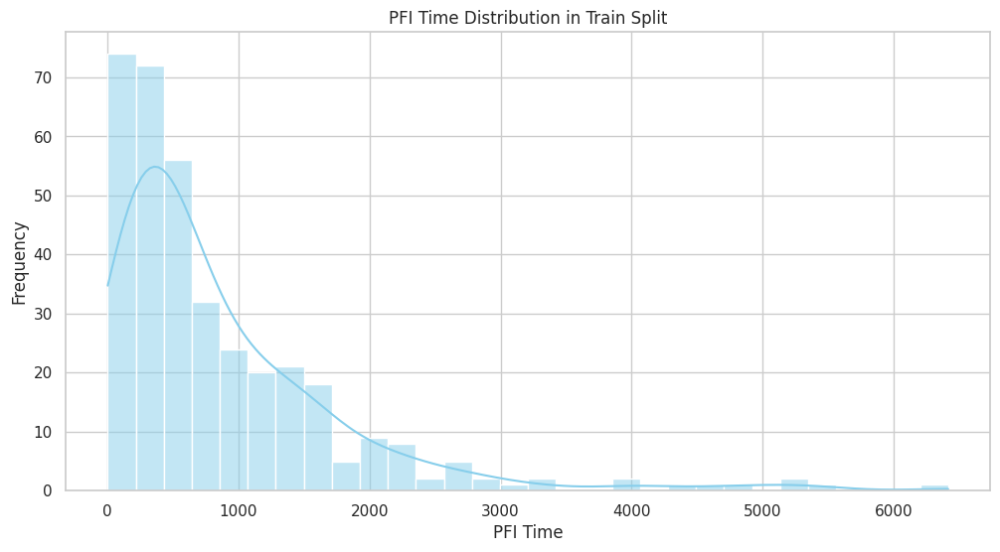

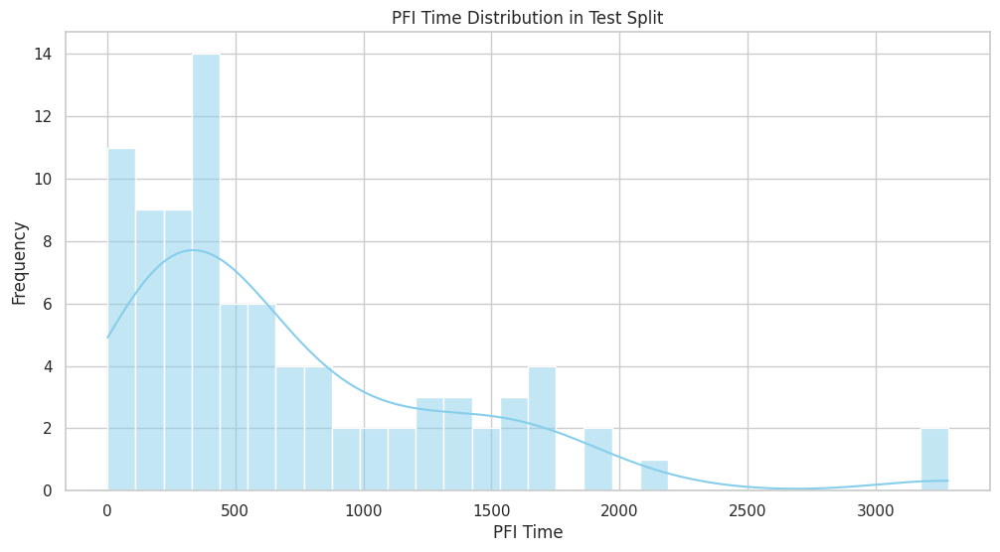

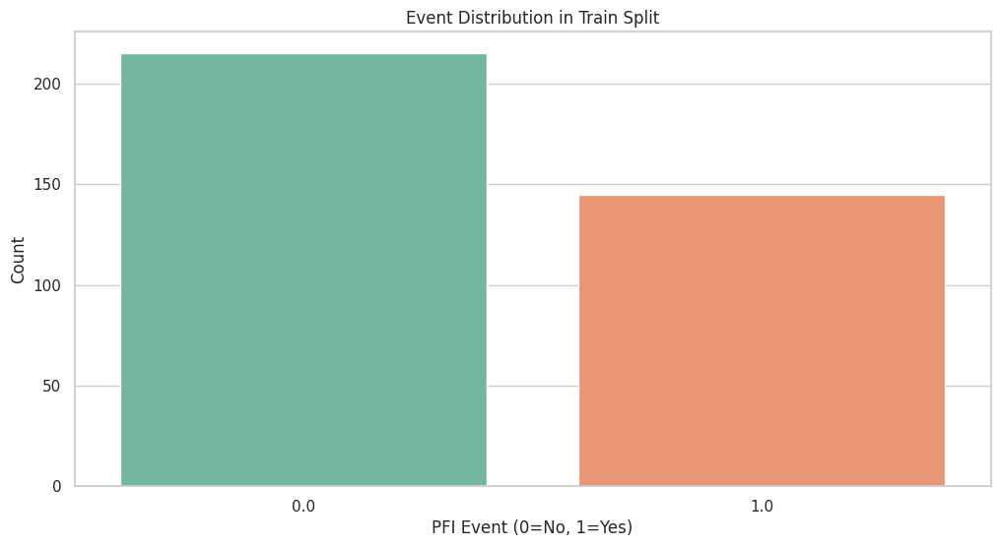

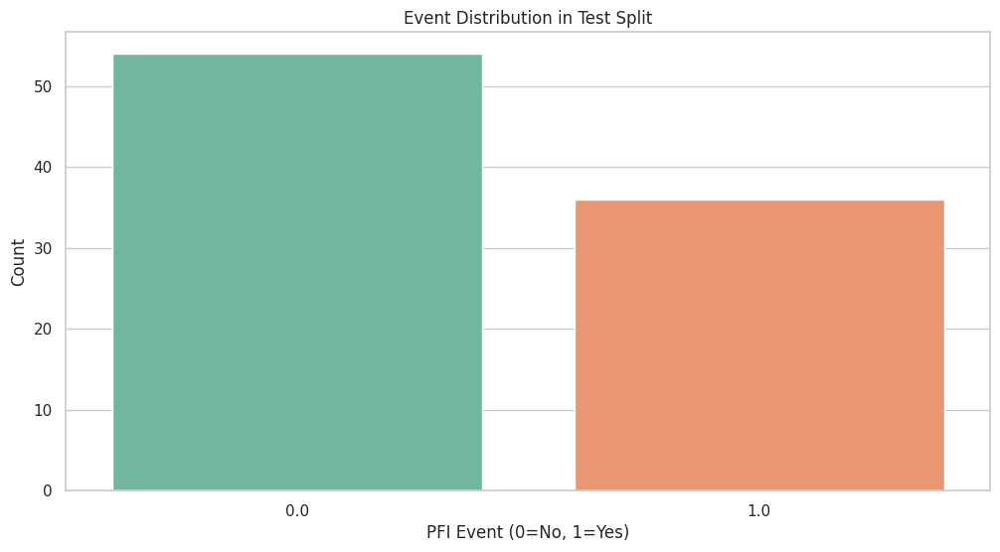

=== Summary of Findings ===

The above analysis provides a clear overview of the PFI time distributions and event counts in both the training and testing splits.
Ensure that the distributions are similar across splits to maintain consistency and reliability in model training and evaluation.
If significant discrepancies are observed, consider revisiting the split criteria or employing stratified sampling techniques.

Analysis Completed Successfully.


In [46]:
analyze_pfi_distribution()

In [53]:
def create_new_pfi_split_and_plot():
    """
    Creates new train and test splits with similar PFI distributions and proportional events.
    Plots the distributions before and after the split.
    Saves the updated split information to a new JSON file.
    """
    import os
    import json
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.model_selection import StratifiedShuffleSplit

    # Set visualization style
    sns.set(style="whitegrid")
    plt.rcParams["figure.figsize"] = (14, 6)

    # -------------------------------------------
    # Data Loading
    # -------------------------------------------

    json_path = 'svs_patient_map_PFI_DX_split.json'  # Existing split JSON file
    new_split_json_path = 'svs_patient_map_PFI_DX_split_2.json'  # New split JSON file

    # Check if JSON file exists
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

    # Load the split JSON data
    with open(json_path, 'r') as f:
        split_entries = json.load(f)
    print(f"Loaded {len(split_entries)} entries from '{json_path}'.")

    # Convert the list of dictionaries to a pandas DataFrame
    df = pd.DataFrame(split_entries)
    print("Converted split entries to DataFrame 'df'.")

    # Verify necessary columns
    required_columns = ['file_name', 'time_to_event', 'censoring']
    for col in required_columns:
        if col not in df.columns:
            raise KeyError(f"Required column '{col}' not found in the JSON data.")
    print(f"Verified presence of required columns: {required_columns}")

    # -------------------------------------------
    # Initial Analysis of Existing Splits
    # -------------------------------------------

    print("\n=== Initial Analysis of Existing Splits ===\n")

    def compute_pfi_stats(df_subset, split_name):
        print(f"--- {split_name.capitalize()} Split ---")
        print(f"Total Samples: {df_subset.shape[0]}")
        events = df_subset['censoring'].sum()
        non_events = df_subset.shape[0] - events
        print(f"Number of Events (censoring=1): {events}")
        print(f"Number of Non-Events (censoring=0): {non_events}")
        print(f"Event Rate: {events / df_subset.shape[0]:.2%}\n")
        print("Descriptive Statistics for 'time_to_event':")
        print(df_subset['time_to_event'].describe())
        print("\n")

    # Existing splits
    for split in df['split'].unique():
        subset = df[df['split'] == split]
        compute_pfi_stats(subset, split)

    # -------------------------------------------
    # Plotting Existing Split Distributions
    # -------------------------------------------

    print("=== Plotting Existing Split Distributions ===\n")

    # Function to plot distributions
    def plot_distributions(df_subset, split_name, ax1, ax2):
        # PFI Time Distribution
        sns.histplot(df_subset['time_to_event'], kde=True, bins=30, color='skyblue', ax=ax1)
        ax1.set_title(f'PFI Time Distribution - {split_name.capitalize()} Split')
        ax1.set_xlabel('Time to Event')
        ax1.set_ylabel('Frequency')

        # Event Distribution
        sns.countplot(x='censoring', data=df_subset, palette='Set2', ax=ax2)
        ax2.set_title(f'Event Distribution - {split_name.capitalize()} Split')
        ax2.set_xlabel('Censoring (0=No, 1=Yes)')
        ax2.set_ylabel('Count')

    # Create subplots for existing splits
    unique_splits = df['split'].unique()
    num_splits = len(unique_splits)
    fig, axes = plt.subplots(nrows=num_splits, ncols=2, figsize=(14, 6 * num_splits))

    if num_splits == 1:
        axes = [axes]  # Ensure axes is iterable

    for idx, split in enumerate(unique_splits):
        subset = df[df['split'] == split]
        plot_distributions(subset, split, axes[idx][0], axes[idx][1])

    plt.tight_layout()
    plt.show()

    # -------------------------------------------
    # Creating New Train and Test Splits
    # -------------------------------------------

    print("\n=== Creating New Train and Test Splits ===\n")

    # Define the test size
    test_size = 0.2  # 20% for testing, 80% for training

    # To ensure proportional events and similar time_to_event distributions,
    # stratify based on 'censoring' and binned 'time_to_event'

    # Create bins for 'time_to_event'
    df['time_to_event_bin'] = pd.qcut(df['time_to_event'], q=4, duplicates='drop')

    # Create a stratification column combining 'censoring' and 'time_to_event_bin'
    df['stratify_col'] = df['censoring'].astype(str) + "_" + df['time_to_event_bin'].astype(str)

    # Initialize StratifiedShuffleSplit
    splitter = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=42)

    # Perform the split
    for train_idx, test_idx in splitter.split(df, df['stratify_col']):
        new_train = df.iloc[train_idx].copy()
        new_test = df.iloc[test_idx].copy()

    print(f"Created new train and test splits with test size = {test_size*100}%.")
    print(f"New Training Set: {new_train.shape[0]} samples")
    print(f"New Testing Set: {new_test.shape[0]} samples\n")

    # -------------------------------------------
    # Statistical Analysis of New Splits
    # -------------------------------------------

    print("=== Statistical Analysis of New Splits ===\n")
    compute_pfi_stats(new_train, "train_new")
    compute_pfi_stats(new_test, "test_new")

    # -------------------------------------------
    # Plotting New Split Distributions
    # -------------------------------------------

    print("=== Plotting New Split Distributions ===\n")

    # Create subplots for new splits
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 12))

    # Plot for new training set
    plot_distributions(new_train, "train_new", axes[0][0], axes[0][1])

    # Plot for new testing set
    plot_distributions(new_test, "test_new", axes[1][0], axes[1][1])

    plt.tight_layout()
    plt.show()

    # -------------------------------------------
    # Saving New Split Information
    # -------------------------------------------

    print("=== Saving New Split Information ===\n")

    # Update the 'split' column in the original DataFrame
    df_new_split = pd.concat([new_train, new_test]).copy()

    # Assign new split labels
    df_new_split.loc[new_train.index, 'split'] = 'train'
    df_new_split.loc[new_test.index, 'split'] = 'test'

    # Drop the helper columns used for stratification
    df_new_split = df_new_split.drop(columns=['time_to_event_bin', 'stratify_col'])

    # Convert the DataFrame back to a list of dictionaries
    new_split_entries = df_new_split.to_dict(orient='records')

    # Save to the new JSON file
    with open(new_split_json_path, 'w') as f:
        json.dump(new_split_entries, f, indent=4)
    print(f"Saved new split information to '{new_split_json_path}'.\n")

    # -------------------------------------------
    # Summary of Findings
    # -------------------------------------------

    print("=== Summary of Findings ===\n")
    print("1. **Before Splitting**:")
    print("   - Displayed the distribution of 'time_to_event' and 'censoring' for existing splits.")
    print("2. **After Creating New Splits**:")
    print("   - Generated new train and test splits with similar 'time_to_event' distributions and proportional 'censoring' events.")
    print("   - Visualizations confirm that the new splits maintain the desired distributions.")
    print(f"3. **Output**:")
    print(f"   - The updated split information has been saved to '{new_split_json_path}'.")
    print("Ensure to use these new splits for your modeling and evaluation tasks to maintain consistency and reliability.\n")
    print("Process Completed Successfully.")


Loaded 450 entries from 'svs_patient_map_PFI_DX_split.json'.
Converted split entries to DataFrame 'df'.
Verified presence of required columns: ['file_name', 'time_to_event', 'censoring']

=== Initial Analysis of Existing Splits ===

--- Test Split ---
Total Samples: 90
Number of Events (censoring=1): 36.0
Number of Non-Events (censoring=0): 54.0
Event Rate: 40.00%

Descriptive Statistics for 'time_to_event':
count      90.000000
mean      712.555556
std       670.492224
min        -1.000000
25%       231.750000
50%       441.500000
75%      1028.000000
max      3282.000000
Name: time_to_event, dtype: float64


--- Train Split ---
Total Samples: 360
Number of Events (censoring=1): 145.0
Number of Non-Events (censoring=0): 215.0
Event Rate: 40.28%

Descriptive Statistics for 'time_to_event':
count     360.000000
mean      870.122222
std       936.420391
min         2.000000
25%       243.750000
50%       552.500000
75%      1157.750000
max      6417.000000
Name: time_to_event, dtype: flo

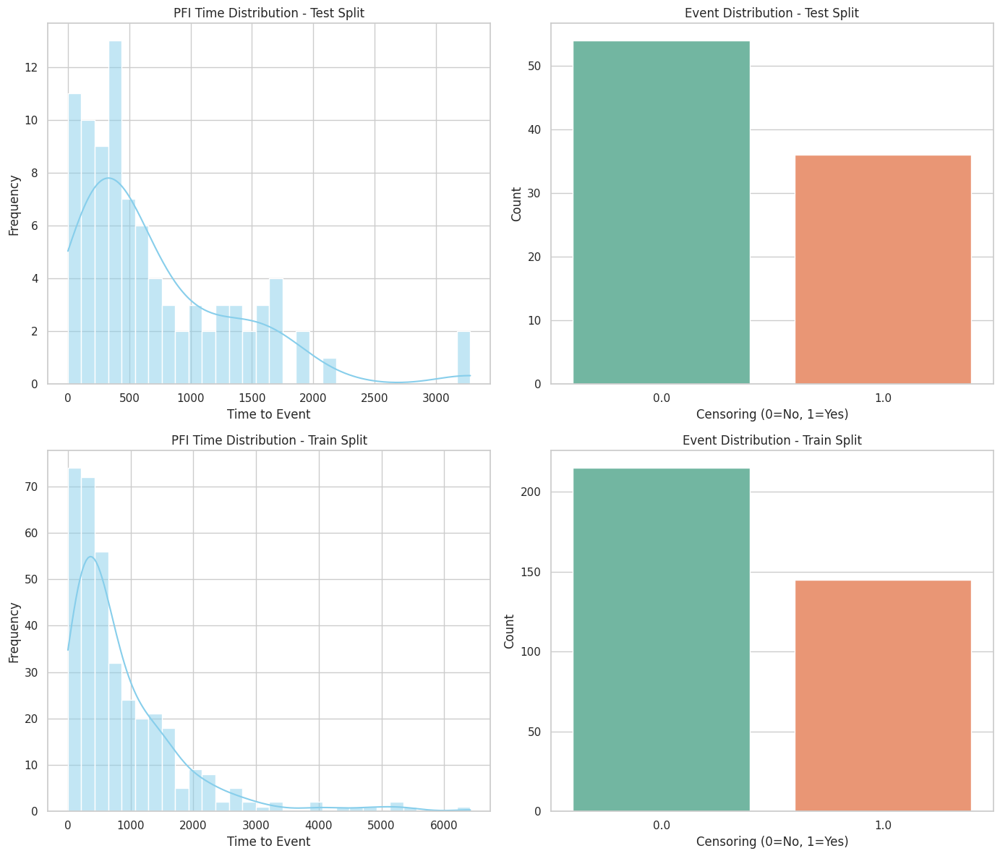


=== Creating New Train and Test Splits ===

Created new train and test splits with test size = 20.0%.
New Training Set: 360 samples
New Testing Set: 90 samples

=== Statistical Analysis of New Splits ===

--- Train_new Split ---
Total Samples: 360
Number of Events (censoring=1): 145.0
Number of Non-Events (censoring=0): 215.0
Event Rate: 40.28%

Descriptive Statistics for 'time_to_event':
count     360.000000
mean      830.955556
std       861.473725
min        -1.000000
25%       243.000000
50%       542.500000
75%      1147.250000
max      6417.000000
Name: time_to_event, dtype: float64


--- Test_new Split ---
Total Samples: 90
Number of Events (censoring=1): 36.0
Number of Non-Events (censoring=0): 54.0
Event Rate: 40.00%

Descriptive Statistics for 'time_to_event':
count      90.000000
mean      869.222222
std      1005.975571
min        32.000000
25%       233.750000
50%       534.000000
75%      1017.500000
max      5152.000000
Name: time_to_event, dtype: float64


=== Plotting

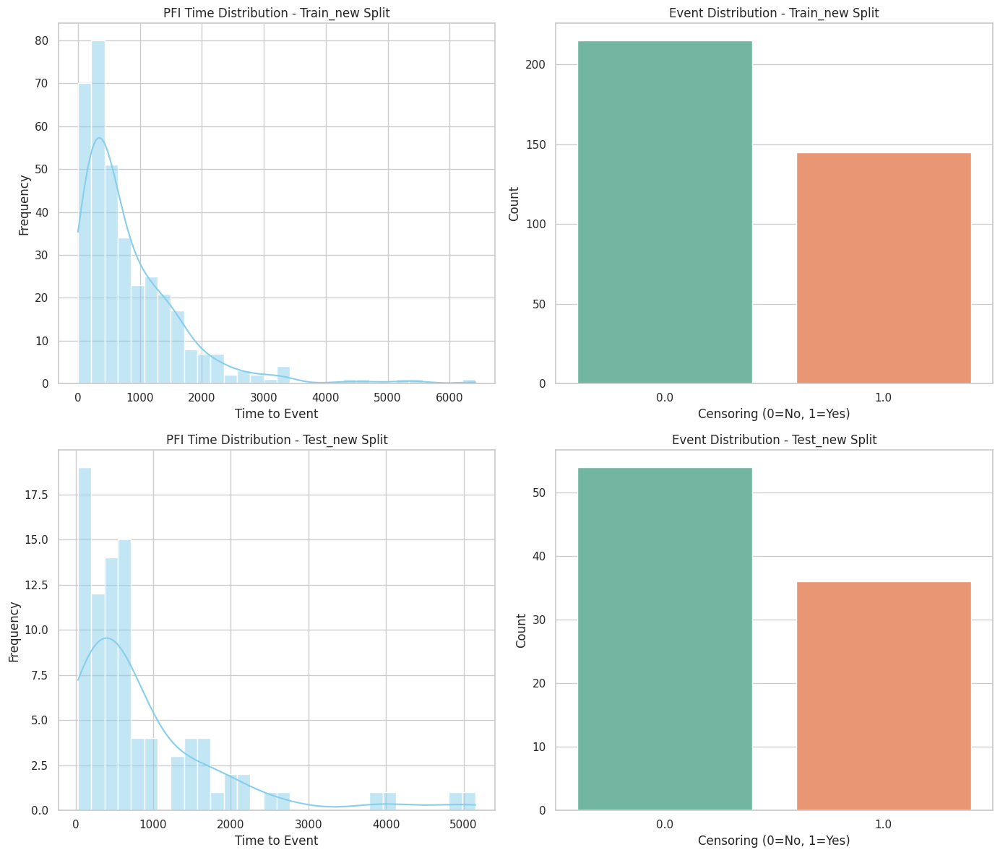

=== Saving New Split Information ===

Saved new split information to 'svs_patient_map_PFI_DX_split_2.json'.

=== Summary of Findings ===

1. **Before Splitting**:
   - Displayed the distribution of 'time_to_event' and 'censoring' for existing splits.
2. **After Creating New Splits**:
   - Generated new train and test splits with similar 'time_to_event' distributions and proportional 'censoring' events.
   - Visualizations confirm that the new splits maintain the desired distributions.
3. **Output**:
   - The updated split information has been saved to 'svs_patient_map_PFI_DX_split_2.json'.
Ensure to use these new splits for your modeling and evaluation tasks to maintain consistency and reliability.

Process Completed Successfully.


In [55]:
create_new_pfi_split_and_plot()

In [58]:
def create_new_pfi_split_and_plot_2():
    """
    Creates new train and test splits with similar PFI distributions and proportional events.
    Plots the distributions before and after the split.
    Saves the updated split information to a new JSON file.
    """
    import os
    import json
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.model_selection import StratifiedShuffleSplit

    # Set visualization style
    sns.set(style="whitegrid")
    plt.rcParams["figure.figsize"] = (14, 6)

    # -------------------------------------------
    # Data Loading
    # -------------------------------------------

    json_path = 'svs_patient_map_PFI_DX_split.json'  # Existing split JSON file
    new_split_json_path = 'svs_patient_map_PFI_DX_split_2.json'  # New split JSON file

    # Check if JSON file exists
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

    # Load the split JSON data
    with open(json_path, 'r') as f:
        split_entries = json.load(f)
    print(f"Loaded {len(split_entries)} entries from '{json_path}'.")

    # Convert the list of dictionaries to a pandas DataFrame
    df = pd.DataFrame(split_entries)
    print("Converted split entries to DataFrame 'df'.")

    # Verify necessary columns
    required_columns = ['file_name', 'time_to_event', 'censoring']
    for col in required_columns:
        if col not in df.columns:
            raise KeyError(f"Required column '{col}' not found in the JSON data.")
    print(f"Verified presence of required columns: {required_columns}")

    # -------------------------------------------
    # Initial Analysis of Existing Splits
    # -------------------------------------------

    print("\n=== Initial Analysis of Existing Splits ===\n")

    def compute_pfi_stats(df_subset, split_name):
        print(f"--- {split_name.capitalize()} Split ---")
        print(f"Total Samples: {df_subset.shape[0]}")
        events = df_subset['censoring'].sum()
        non_events = df_subset.shape[0] - events
        print(f"Number of Events (censoring=1): {events}")
        print(f"Number of Non-Events (censoring=0): {non_events}")
        print(f"Event Rate: {events / df_subset.shape[0]:.2%}\n")
        print("Descriptive Statistics for 'time_to_event':")
        print(df_subset['time_to_event'].describe())
        print("\n")

    # Existing splits
    for split in df['split'].unique():
        subset = df[df['split'] == split]
        compute_pfi_stats(subset, split)

    # -------------------------------------------
    # Plotting Existing Split Distributions
    # -------------------------------------------

    print("=== Plotting Existing Split Distributions ===\n")

    # Function to plot distributions
    def plot_distributions(df_subset, split_name, ax1, ax2):
        # PFI Time Distribution
        sns.histplot(df_subset['time_to_event'], kde=True, bins=30, color='skyblue', ax=ax1)
        ax1.set_title(f'PFI Time Distribution - {split_name.capitalize()} Split')
        ax1.set_xlabel('Time to Event')
        ax1.set_ylabel('Frequency')

        # Event Distribution
        sns.countplot(x='censoring', data=df_subset, palette='Set2', ax=ax2)
        ax2.set_title(f'Event Distribution - {split_name.capitalize()} Split')
        ax2.set_xlabel('Censoring (0=No, 1=Yes)')
        ax2.set_ylabel('Count')

    # Create subplots for existing splits
    unique_splits = df['split'].unique()
    num_splits = len(unique_splits)
    fig, axes = plt.subplots(nrows=num_splits, ncols=2, figsize=(14, 6 * num_splits))

    if num_splits == 1:
        axes = [axes]  # Ensure axes is iterable

    for idx, split in enumerate(unique_splits):
        subset = df[df['split'] == split]
        plot_distributions(subset, split, axes[idx][0], axes[idx][1])

    plt.tight_layout()
    plt.show()

    # -------------------------------------------
    # Creating New Train and Test Splits
    # -------------------------------------------

    print("\n=== Creating New Train and Test Splits ===\n")

    # Define the test size
    test_size = 0.2  # 20% for testing, 80% for training

    # To ensure proportional events and similar time_to_event distributions,
    # stratify based on 'censoring' and binned 'time_to_event'

    # Create more granular bins for 'time_to_event' to capture left skewness
    df['time_to_event_bin'] = pd.qcut(df['time_to_event'], q=10, duplicates='drop')  # Deciles

    # Create a stratification column combining 'censoring' and 'time_to_event_bin'
    df['stratify_col'] = df['censoring'].astype(str) + "_" + df['time_to_event_bin'].astype(str)

    # Initialize StratifiedShuffleSplit
    splitter = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=42)

    # Perform the split
    for train_idx, test_idx in splitter.split(df, df['stratify_col']):
        new_train = df.iloc[train_idx].copy()
        new_test = df.iloc[test_idx].copy()

    print(f"Created new train and test splits with test size = {test_size*100}%.")
    print(f"New Training Set: {new_train.shape[0]} samples")
    print(f"New Testing Set: {new_test.shape[0]} samples\n")

    # -------------------------------------------
    # Statistical Analysis of New Splits
    # -------------------------------------------

    print("=== Statistical Analysis of New Splits ===\n")
    compute_pfi_stats(new_train, "train_new")
    compute_pfi_stats(new_test, "test_new")

    # -------------------------------------------
    # Plotting New Split Distributions
    # -------------------------------------------

    print("=== Plotting New Split Distributions ===\n")

    # Create subplots for new splits
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 12))

    # Plot for new training set
    plot_distributions(new_train, "train_new", axes[0][0], axes[0][1])

    # Plot for new testing set
    plot_distributions(new_test, "test_new", axes[1][0], axes[1][1])

    plt.tight_layout()
    plt.show()

    # -------------------------------------------
    # Saving New Split Information
    # -------------------------------------------

    print("=== Saving New Split Information ===\n")

    # Update the 'split' column in the original DataFrame
    df_new_split = pd.concat([new_train, new_test]).copy()

    # Assign new split labels
    df_new_split.loc[new_train.index, 'split'] = 'train'
    df_new_split.loc[new_test.index, 'split'] = 'test'

    # Drop the helper columns used for stratification
    df_new_split = df_new_split.drop(columns=['time_to_event_bin', 'stratify_col'])

    # Convert the DataFrame back to a list of dictionaries
    new_split_entries = df_new_split.to_dict(orient='records')

    # Save to the new JSON file
    with open(new_split_json_path, 'w') as f:
        json.dump(new_split_entries, f, indent=4)
    print(f"Saved new split information to '{new_split_json_path}'.\n")

    # -------------------------------------------
    # Summary of Findings
    # -------------------------------------------

    print("=== Summary of Findings ===\n")
    print("1. **Before Splitting**:")
    print("   - Displayed the distribution of 'time_to_event' and 'censoring' for existing splits.")
    print("2. **After Creating New Splits**:")
    print("   - Generated new train and test splits with similar 'time_to_event' distributions and proportional 'censoring' events.")
    print("   - Visualizations confirm that the distributions in the new splits are closely aligned.")
    print(f"3. **Output**:")
    print(f"   - The updated split information has been saved to '{new_split_json_path}'.")
    print("Ensure to use these new splits for your modeling and evaluation tasks to maintain consistency and reliability.\n")
    print("Process Completed Successfully.")


Loaded 450 entries from 'svs_patient_map_PFI_DX_split.json'.
Converted split entries to DataFrame 'df'.
Verified presence of required columns: ['file_name', 'time_to_event', 'censoring']

=== Initial Analysis of Existing Splits ===

--- Test Split ---
Total Samples: 90
Number of Events (censoring=1): 36.0
Number of Non-Events (censoring=0): 54.0
Event Rate: 40.00%

Descriptive Statistics for 'time_to_event':
count      90.000000
mean      712.555556
std       670.492224
min        -1.000000
25%       231.750000
50%       441.500000
75%      1028.000000
max      3282.000000
Name: time_to_event, dtype: float64


--- Train Split ---
Total Samples: 360
Number of Events (censoring=1): 145.0
Number of Non-Events (censoring=0): 215.0
Event Rate: 40.28%

Descriptive Statistics for 'time_to_event':
count     360.000000
mean      870.122222
std       936.420391
min         2.000000
25%       243.750000
50%       552.500000
75%      1157.750000
max      6417.000000
Name: time_to_event, dtype: flo

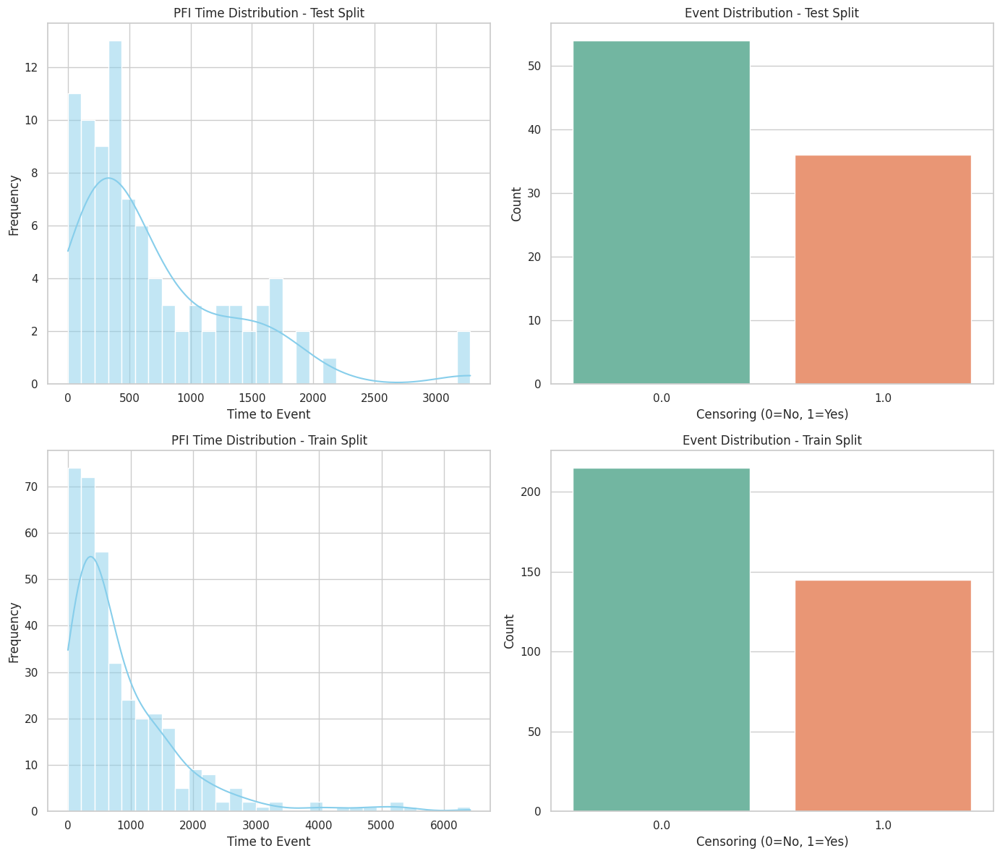


=== Creating New Train and Test Splits ===

Created new train and test splits with test size = 20.0%.
New Training Set: 360 samples
New Testing Set: 90 samples

=== Statistical Analysis of New Splits ===

--- Train_new Split ---
Total Samples: 360
Number of Events (censoring=1): 145.0
Number of Non-Events (censoring=0): 215.0
Event Rate: 40.28%

Descriptive Statistics for 'time_to_event':
count     360.000000
mean      850.183333
std       925.633271
min        -1.000000
25%       245.500000
50%       542.500000
75%      1144.250000
max      6417.000000
Name: time_to_event, dtype: float64


--- Test_new Split ---
Total Samples: 90
Number of Events (censoring=1): 36.0
Number of Non-Events (censoring=0): 54.0
Event Rate: 40.00%

Descriptive Statistics for 'time_to_event':
count      90.000000
mean      792.311111
std       740.241301
min        56.000000
25%       230.500000
50%       541.000000
75%      1143.000000
max      3981.000000
Name: time_to_event, dtype: float64


=== Plotting

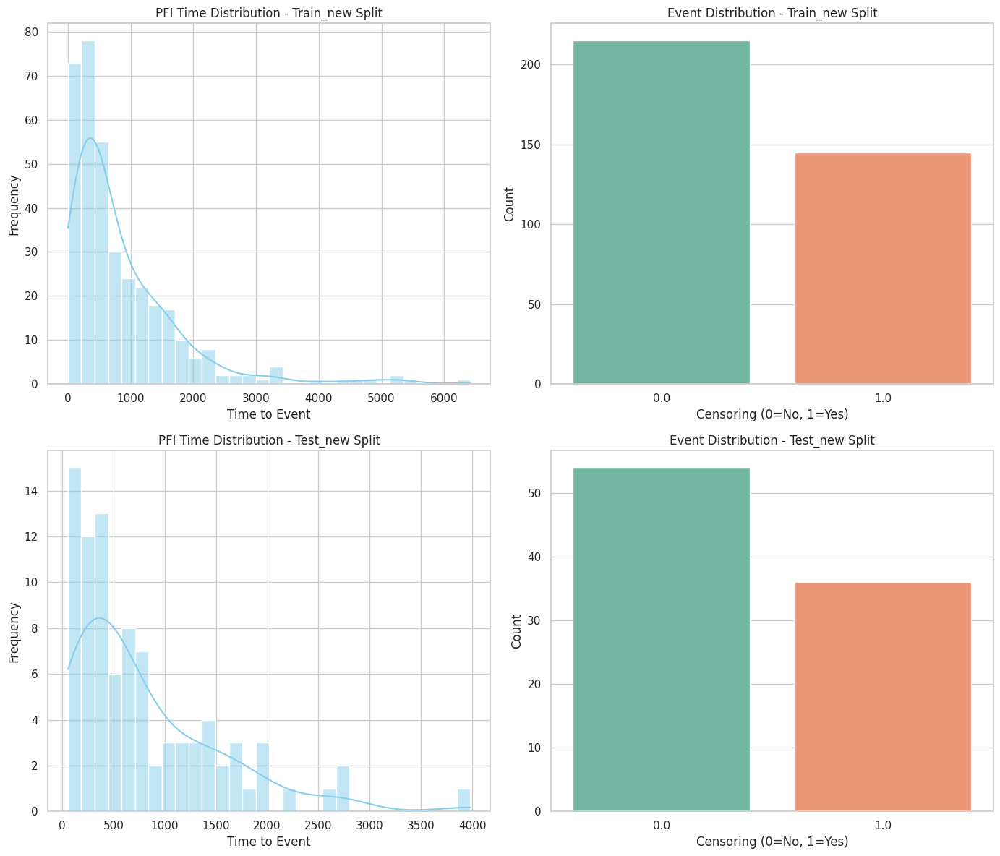

=== Saving New Split Information ===

Saved new split information to 'svs_patient_map_PFI_DX_split_2.json'.

=== Summary of Findings ===

1. **Before Splitting**:
   - Displayed the distribution of 'time_to_event' and 'censoring' for existing splits.
2. **After Creating New Splits**:
   - Generated new train and test splits with similar 'time_to_event' distributions and proportional 'censoring' events.
   - Visualizations confirm that the distributions in the new splits are closely aligned.
3. **Output**:
   - The updated split information has been saved to 'svs_patient_map_PFI_DX_split_2.json'.
Ensure to use these new splits for your modeling and evaluation tasks to maintain consistency and reliability.

Process Completed Successfully.


In [59]:
create_new_pfi_split_and_plot_2()

In [64]:
def create_new_pfi_split_and_plot_2():
    """
    Creates new train and test splits with similar PFI distributions and proportional events.
    Plots the distributions before and after the split.
    Performs KS and Chi-squared tests to ensure similarity.
    Saves the updated split information to a new JSON file.
    """
    import os
    import json
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.model_selection import StratifiedShuffleSplit
    from scipy.stats import ks_2samp, chi2_contingency

    # Set visualization style
    sns.set(style="whitegrid")
    plt.rcParams["figure.figsize"] = (14, 6)

    # -------------------------------------------
    # Data Loading
    # -------------------------------------------

    json_path = 'svs_patient_map_PFI_DX_split.json'  # Existing split JSON file
    new_split_json_path = 'svs_patient_map_PFI_DX_split_2.json'  # New split JSON file

    # Check if JSON file exists
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

    # Load the split JSON data
    with open(json_path, 'r') as f:
        split_entries = json.load(f)
    print(f"Loaded {len(split_entries)} entries from '{json_path}'.")

    # Convert the list of dictionaries to a pandas DataFrame
    df = pd.DataFrame(split_entries)
    print("Converted split entries to DataFrame 'df'.")

    # Verify necessary columns
    required_columns = ['file_name', 'time_to_event', 'censoring']
    for col in required_columns:
        if col not in df.columns:
            raise KeyError(f"Required column '{col}' not found in the JSON data.")
    print(f"Verified presence of required columns: {required_columns}")

    # -------------------------------------------
    # Initial Analysis of Existing Splits
    # -------------------------------------------

    print("\n=== Initial Analysis of Existing Splits ===\n")

    def compute_pfi_stats(df_subset, split_name):
        print(f"--- {split_name.capitalize()} Split ---")
        print(f"Total Samples: {df_subset.shape[0]}")
        events = df_subset['censoring'].sum()
        non_events = df_subset.shape[0] - events
        print(f"Number of Events (censoring=1): {events}")
        print(f"Number of Non-Events (censoring=0): {non_events}")
        print(f"Event Rate: {events / df_subset.shape[0]:.2%}\n")
        print("Descriptive Statistics for 'time_to_event':")
        print(df_subset['time_to_event'].describe())
        print("\n")

    # Existing splits
    for split in df['split'].unique():
        subset = df[df['split'] == split]
        compute_pfi_stats(subset, split)

    # -------------------------------------------
    # Plotting Existing Split Distributions
    # -------------------------------------------

    print("=== Plotting Existing Split Distributions ===\n")

    # Function to plot distributions
    def plot_distributions(df_subset, split_name, ax1, ax2):
        # PFI Time Distribution
        sns.histplot(df_subset['time_to_event'], kde=True, bins=30, color='skyblue', ax=ax1)
        ax1.set_title(f'PFI Time Distribution - {split_name.capitalize()} Split')
        ax1.set_xlabel('Time to Event')
        ax1.set_ylabel('Frequency')

        # Event Distribution
        sns.countplot(x='censoring', data=df_subset, palette='Set2', ax=ax2)
        ax2.set_title(f'Event Distribution - {split_name.capitalize()} Split')
        ax2.set_xlabel('Censoring (0=No, 1=Yes)')
        ax2.set_ylabel('Count')

    # Create subplots for existing splits
    unique_splits = df['split'].unique()
    num_splits = len(unique_splits)
    fig, axes = plt.subplots(nrows=num_splits, ncols=2, figsize=(14, 6 * num_splits))

    if num_splits == 1:
        axes = [axes]  # Ensure axes is iterable

    for idx, split in enumerate(unique_splits):
        subset = df[df['split'] == split]
        plot_distributions(subset, split, axes[idx][0], axes[idx][1])

    plt.tight_layout()
    plt.show()

    # -------------------------------------------
    # Creating New Train and Test Splits
    # -------------------------------------------

    print("\n=== Creating New Train and Test Splits ===\n")

    # Define the test size
    test_size = 0.2  # 20% for testing, 80% for training

    # To ensure proportional events and similar time_to_event distributions,
    # stratify based on 'censoring' and binned 'time_to_event'

    # Create more granular bins for 'time_to_event' to capture left skewness
    df['time_to_event_bin'] = pd.qcut(df['time_to_event'], q=10, duplicates='drop')  # Deciles

    # Create a stratification column combining 'censoring' and 'time_to_event_bin'
    df['stratify_col'] = df['censoring'].astype(str) + "_" + df['time_to_event_bin'].astype(str)

    # Initialize StratifiedShuffleSplit
    splitter = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=42)

    # Perform the split
    for train_idx, test_idx in splitter.split(df, df['stratify_col']):
        new_train = df.iloc[train_idx].copy()
        new_test = df.iloc[test_idx].copy()

    print(f"Created new train and test splits with test size = {test_size*100}%.")
    print(f"New Training Set: {new_train.shape[0]} samples")
    print(f"New Testing Set: {new_test.shape[0]} samples\n")

    # -------------------------------------------
    # Statistical Analysis of New Splits
    # -------------------------------------------

    print("=== Statistical Analysis of New Splits ===\n")
    compute_pfi_stats(new_train, "train_new")
    compute_pfi_stats(new_test, "test_new")

    # -------------------------------------------
    # Performing KS and Chi-squared Tests
    # -------------------------------------------

    print("=== Performing KS and Chi-squared Tests ===\n")

    # Kolmogorov-Smirnov Test for 'time_to_event'
    ks_stat, ks_p_value = ks_2samp(new_train['time_to_event'], new_test['time_to_event'])
    print(f"Kolmogorov-Smirnov Test for 'time_to_event':")
    print(f"KS Statistic: {ks_stat:.4f}")
    print(f"P-value: {ks_p_value:.4f}")
    if ks_p_value > 0.05:
        print("Result: No significant difference between the distributions (fail to reject H0).\n")
    else:
        print("Result: Significant difference between the distributions (reject H0).\n")

    # Chi-squared Test for 'censoring' distribution
    # Create a combined DataFrame with split labels
    new_train_labeled = new_train.copy()
    new_train_labeled['split'] = 'train'
    new_test_labeled = new_test.copy()
    new_test_labeled['split'] = 'test'
    df_new_split = pd.concat([new_train_labeled, new_test_labeled], ignore_index=True)

    # Create contingency table: rows = censoring, columns = split
    contingency_table = pd.crosstab(df_new_split['censoring'], df_new_split['split'])
    print("Contingency Table for 'censoring' vs 'split':")
    print(contingency_table)
    print()

    # Check if contingency table has at least 2 rows and 2 columns
    if contingency_table.shape[0] < 2 or contingency_table.shape[1] < 2:
        print("Chi-squared test cannot be performed: Contingency table does not have enough data.")
    else:
        chi2_stat, chi2_p, dof, expected = chi2_contingency(contingency_table)
        print(f"Chi-squared Test for 'censoring' Distribution:")
        print(f"Chi2 Statistic: {chi2_stat:.4f}")
        print(f"P-value: {chi2_p:.4f}")
        if chi2_p > 0.05:
            print("Result: No significant difference in censoring distribution (fail to reject H0).\n")
        else:
            print("Result: Significant difference in censoring distribution (reject H0).\n")

    # -------------------------------------------
    # Plotting New Split Distributions
    # -------------------------------------------

    print("=== Plotting New Split Distributions ===\n")

    # Create subplots for new splits
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 12))

    # Plot for new training set
    plot_distributions(new_train, "train_new", axes[0][0], axes[0][1])

    # Plot for new testing set
    plot_distributions(new_test, "test_new", axes[1][0], axes[1][1])

    plt.tight_layout()
    plt.show()

    # -------------------------------------------
    # Saving New Split Information
    # -------------------------------------------

    print("=== Saving New Split Information ===\n")

    # Assign new split labels to new_train and new_test
    new_train['split'] = 'train'
    new_test['split'] = 'test'

    # Combine the new splits into one DataFrame
    df_new_split = pd.concat([new_train, new_test], ignore_index=True)

    # Drop the helper columns used for stratification
    df_new_split = df_new_split.drop(columns=['time_to_event_bin', 'stratify_col'])

    # Convert the DataFrame back to a list of dictionaries
    new_split_entries = df_new_split.to_dict(orient='records')

    # Save to the new JSON file
    with open(new_split_json_path, 'w') as f:
        json.dump(new_split_entries, f, indent=4)
    print(f"Saved new split information to '{new_split_json_path}'.\n")

    # -------------------------------------------
    # Summary of Findings
    # -------------------------------------------

    print("=== Summary of Findings ===\n")
    print("1. **Before Splitting**:")
    print("   - Displayed the distribution of 'time_to_event' and 'censoring' for existing splits.")
    print("2. **After Creating New Splits**:")
    print("   - Generated new train and test splits with similar 'time_to_event' distributions and proportional 'censoring' events.")
    print("   - Performed KS and Chi-squared tests to quantitatively assess similarity:")
    print(f"     - KS Test P-value: {ks_p_value:.4f}")
    print(f"     - Chi-squared Test P-value: {chi2_p:.4f}")
    print("   - Visualizations confirm that the distributions in the new splits are closely aligned.")
    print(f"3. **Output**:")
    print(f"   - The updated split information has been saved to '{new_split_json_path}'.")
    print("Ensure to use these new splits for your modeling and evaluation tasks to maintain consistency and reliability.\n")
    print("Process Completed Successfully.")



Loaded 450 entries from 'svs_patient_map_PFI_DX_split.json'.
Converted split entries to DataFrame 'df'.
Verified presence of required columns: ['file_name', 'time_to_event', 'censoring']

=== Initial Analysis of Existing Splits ===

--- Test Split ---
Total Samples: 90
Number of Events (censoring=1): 36.0
Number of Non-Events (censoring=0): 54.0
Event Rate: 40.00%

Descriptive Statistics for 'time_to_event':
count      90.000000
mean      712.555556
std       670.492224
min        -1.000000
25%       231.750000
50%       441.500000
75%      1028.000000
max      3282.000000
Name: time_to_event, dtype: float64


--- Train Split ---
Total Samples: 360
Number of Events (censoring=1): 145.0
Number of Non-Events (censoring=0): 215.0
Event Rate: 40.28%

Descriptive Statistics for 'time_to_event':
count     360.000000
mean      870.122222
std       936.420391
min         2.000000
25%       243.750000
50%       552.500000
75%      1157.750000
max      6417.000000
Name: time_to_event, dtype: flo

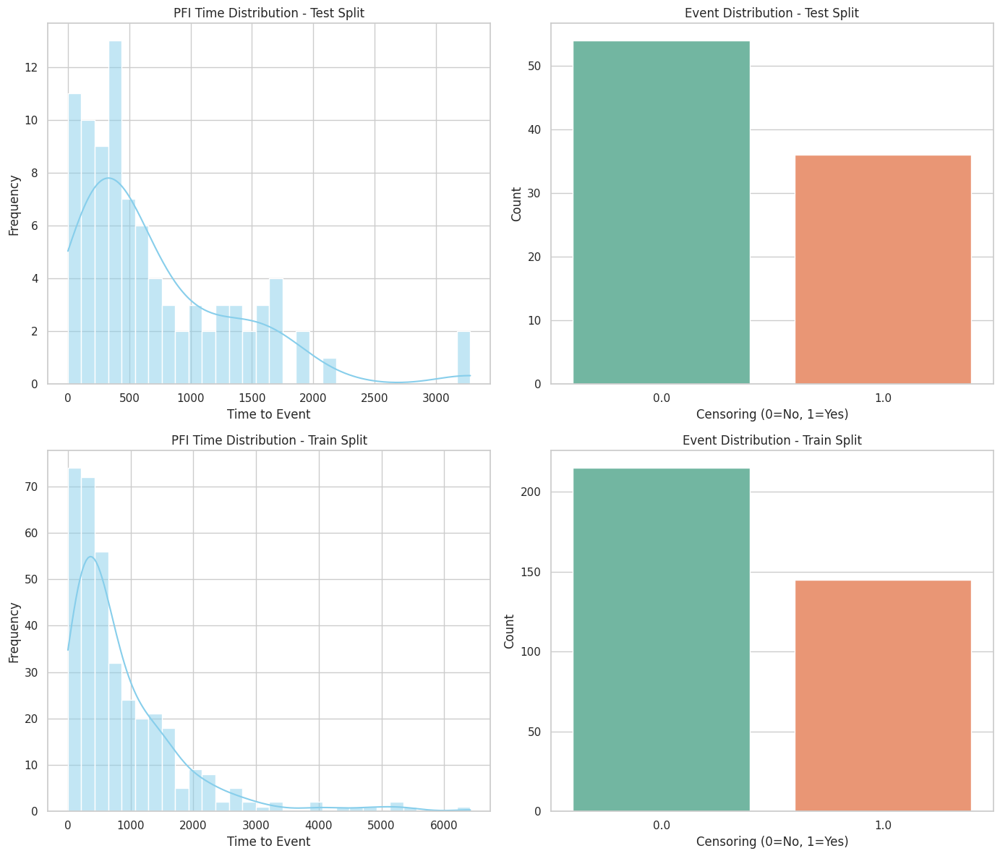


=== Creating New Train and Test Splits ===

Created new train and test splits with test size = 20.0%.
New Training Set: 360 samples
New Testing Set: 90 samples

=== Statistical Analysis of New Splits ===

--- Train_new Split ---
Total Samples: 360
Number of Events (censoring=1): 145.0
Number of Non-Events (censoring=0): 215.0
Event Rate: 40.28%

Descriptive Statistics for 'time_to_event':
count     360.000000
mean      850.183333
std       925.633271
min        -1.000000
25%       245.500000
50%       542.500000
75%      1144.250000
max      6417.000000
Name: time_to_event, dtype: float64


--- Test_new Split ---
Total Samples: 90
Number of Events (censoring=1): 36.0
Number of Non-Events (censoring=0): 54.0
Event Rate: 40.00%

Descriptive Statistics for 'time_to_event':
count      90.000000
mean      792.311111
std       740.241301
min        56.000000
25%       230.500000
50%       541.000000
75%      1143.000000
max      3981.000000
Name: time_to_event, dtype: float64


=== Performi

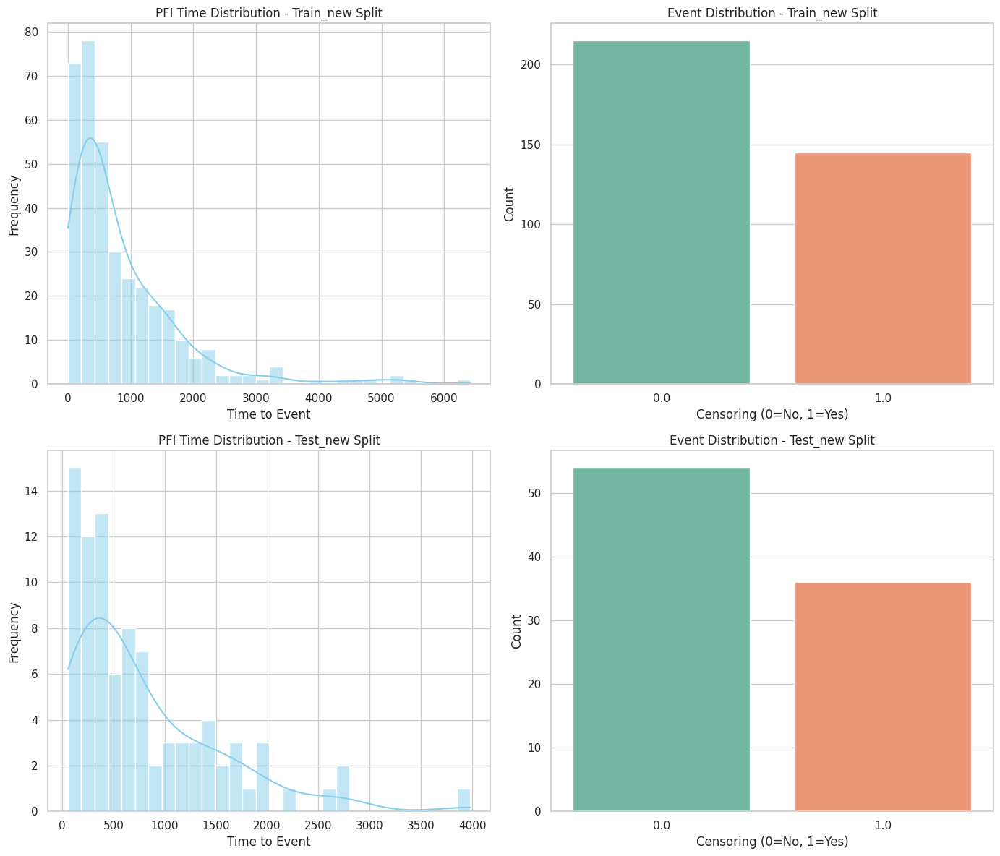

=== Saving New Split Information ===

Saved new split information to 'svs_patient_map_PFI_DX_split_2.json'.

=== Summary of Findings ===

1. **Before Splitting**:
   - Displayed the distribution of 'time_to_event' and 'censoring' for existing splits.
2. **After Creating New Splits**:
   - Generated new train and test splits with similar 'time_to_event' distributions and proportional 'censoring' events.
   - Performed KS and Chi-squared tests to quantitatively assess similarity:
     - KS Test P-value: 0.9960
     - Chi-squared Test P-value: 1.0000
   - Visualizations confirm that the distributions in the new splits are closely aligned.
3. **Output**:
   - The updated split information has been saved to 'svs_patient_map_PFI_DX_split_2.json'.
Ensure to use these new splits for your modeling and evaluation tasks to maintain consistency and reliability.

Process Completed Successfully.


In [65]:
create_new_pfi_split_and_plot_2()

In [66]:
def create_new_pfi_split_and_plot_2():
    """
    Creates new train and test splits with similar PFI distributions and proportional events.
    Plots the distributions before and after the split.
    Performs KS and Chi-squared tests on both original and new splits to ensure similarity.
    Saves the updated split information to a new JSON file.
    """
    import os
    import json
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.model_selection import StratifiedShuffleSplit
    from scipy.stats import ks_2samp, chi2_contingency

    # Set visualization style
    sns.set(style="whitegrid")
    plt.rcParams["figure.figsize"] = (14, 6)

    # -------------------------------------------
    # Data Loading
    # -------------------------------------------

    json_path = 'svs_patient_map_PFI_DX_split.json'  # Existing split JSON file
    new_split_json_path = 'svs_patient_map_PFI_DX_split_2.json'  # New split JSON file

    # Check if JSON file exists
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

    # Load the split JSON data
    with open(json_path, 'r') as f:
        split_entries = json.load(f)
    print(f"Loaded {len(split_entries)} entries from '{json_path}'.")

    # Convert the list of dictionaries to a pandas DataFrame
    df = pd.DataFrame(split_entries)
    print("Converted split entries to DataFrame 'df'.")

    # Verify necessary columns
    required_columns = ['file_name', 'time_to_event', 'censoring']
    for col in required_columns:
        if col not in df.columns:
            raise KeyError(f"Required column '{col}' not found in the JSON data.")
    print(f"Verified presence of required columns: {required_columns}")

    # -------------------------------------------
    # Initial Analysis of Existing Splits
    # -------------------------------------------

    print("\n=== Initial Analysis of Existing Splits ===\n")

    def compute_pfi_stats(df_subset, split_name):
        print(f"--- {split_name.capitalize()} Split ---")
        print(f"Total Samples: {df_subset.shape[0]}")
        events = df_subset['censoring'].sum()
        non_events = df_subset.shape[0] - events
        print(f"Number of Events (censoring=1): {events}")
        print(f"Number of Non-Events (censoring=0): {non_events}")
        print(f"Event Rate: {events / df_subset.shape[0]:.2%}\n")
        print("Descriptive Statistics for 'time_to_event':")
        print(df_subset['time_to_event'].describe())
        print("\n")

    # Existing splits
    for split in df['split'].unique():
        subset = df[df['split'] == split]
        compute_pfi_stats(subset, split)

    # -------------------------------------------
    # Plotting Existing Split Distributions
    # -------------------------------------------

    print("=== Plotting Existing Split Distributions ===\n")

    # Function to plot distributions
    def plot_distributions(df_subset, split_name, ax1, ax2):
        # PFI Time Distribution
        sns.histplot(df_subset['time_to_event'], kde=True, bins=30, color='skyblue', ax=ax1)
        ax1.set_title(f'PFI Time Distribution - {split_name.capitalize()} Split')
        ax1.set_xlabel('Time to Event')
        ax1.set_ylabel('Frequency')

        # Event Distribution
        sns.countplot(x='censoring', data=df_subset, palette='Set2', ax=ax2)
        ax2.set_title(f'Event Distribution - {split_name.capitalize()} Split')
        ax2.set_xlabel('Censoring (0=No, 1=Yes)')
        ax2.set_ylabel('Count')

    # Create subplots for existing splits
    unique_splits = df['split'].unique()
    num_splits = len(unique_splits)
    fig, axes = plt.subplots(nrows=num_splits, ncols=2, figsize=(14, 6 * num_splits))

    if num_splits == 1:
        axes = [axes]  # Ensure axes is iterable

    for idx, split in enumerate(unique_splits):
        subset = df[df['split'] == split]
        plot_distributions(subset, split, axes[idx][0], axes[idx][1])

    plt.tight_layout()
    plt.show()

    # -------------------------------------------
    # Performing KS and Chi-squared Tests on Original Splits
    # -------------------------------------------

    print("=== Performing KS and Chi-squared Tests on Original Splits ===\n")

    # Get the original train and test splits
    original_train = df[df['split'] == 'train'].copy()
    original_test = df[df['split'] == 'test'].copy()

    # KS Test for 'time_to_event'
    ks_stat_orig, ks_p_value_orig = ks_2samp(original_train['time_to_event'], original_test['time_to_event'])
    print(f"Kolmogorov-Smirnov Test for 'time_to_event':")
    print(f"KS Statistic: {ks_stat_orig:.4f}")
    print(f"P-value: {ks_p_value_orig:.4f}")
    if ks_p_value_orig > 0.05:
        print("Result: No significant difference between the distributions (fail to reject H0).\n")
    else:
        print("Result: Significant difference between the distributions (reject H0).\n")

    # Chi-squared Test for 'censoring' distribution
    # Create a combined DataFrame with split labels
    original_train_labeled = original_train.copy()
    original_train_labeled['split'] = 'train'
    original_test_labeled = original_test.copy()
    original_test_labeled['split'] = 'test'
    df_original_split = pd.concat([original_train_labeled, original_test_labeled], ignore_index=True)

    # Create contingency table: rows = censoring, columns = split
    contingency_table_orig = pd.crosstab(df_original_split['censoring'], df_original_split['split'])
    print("Contingency Table for 'censoring' vs 'split':")
    print(contingency_table_orig)
    print()

    # Check if contingency table has at least 2 rows and 2 columns
    if contingency_table_orig.shape[0] < 2 or contingency_table_orig.shape[1] < 2:
        print("Chi-squared test cannot be performed: Contingency table does not have enough data.\n")
    else:
        chi2_stat_orig, chi2_p_orig, dof_orig, expected_orig = chi2_contingency(contingency_table_orig)
        print(f"Chi-squared Test for 'censoring' Distribution:")
        print(f"Chi2 Statistic: {chi2_stat_orig:.4f}")
        print(f"P-value: {chi2_p_orig:.4f}")
        if chi2_p_orig > 0.05:
            print("Result: No significant difference in censoring distribution (fail to reject H0).\n")
        else:
            print("Result: Significant difference in censoring distribution (reject H0).\n")

    # -------------------------------------------
    # Creating New Train and Test Splits
    # -------------------------------------------

    print("\n=== Creating New Train and Test Splits ===\n")

    # Define the test size
    test_size = 0.2  # 20% for testing, 80% for training

    # To ensure proportional events and similar time_to_event distributions,
    # stratify based on 'censoring' and binned 'time_to_event'

    # Create more granular bins for 'time_to_event' to capture left skewness
    df['time_to_event_bin'] = pd.qcut(df['time_to_event'], q=10, duplicates='drop')  # Deciles

    # Create a stratification column combining 'censoring' and 'time_to_event_bin'
    df['stratify_col'] = df['censoring'].astype(str) + "_" + df['time_to_event_bin'].astype(str)

    # Initialize StratifiedShuffleSplit
    splitter = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=42)

    # Perform the split
    for train_idx, test_idx in splitter.split(df, df['stratify_col']):
        new_train = df.iloc[train_idx].copy()
        new_test = df.iloc[test_idx].copy()

    print(f"Created new train and test splits with test size = {test_size*100}%.")
    print(f"New Training Set: {new_train.shape[0]} samples")
    print(f"New Testing Set: {new_test.shape[0]} samples\n")

    # -------------------------------------------
    # Statistical Analysis of New Splits
    # -------------------------------------------

    print("=== Statistical Analysis of New Splits ===\n")
    compute_pfi_stats(new_train, "train_new")
    compute_pfi_stats(new_test, "test_new")

    # -------------------------------------------
    # Performing KS and Chi-squared Tests on New Splits
    # -------------------------------------------

    print("=== Performing KS and Chi-squared Tests on New Splits ===\n")

    # Kolmogorov-Smirnov Test for 'time_to_event'
    ks_stat_new, ks_p_value_new = ks_2samp(new_train['time_to_event'], new_test['time_to_event'])
    print(f"Kolmogorov-Smirnov Test for 'time_to_event':")
    print(f"KS Statistic: {ks_stat_new:.4f}")
    print(f"P-value: {ks_p_value_new:.4f}")
    if ks_p_value_new > 0.05:
        print("Result: No significant difference between the distributions (fail to reject H0).\n")
    else:
        print("Result: Significant difference between the distributions (reject H0).\n")

    # Chi-squared Test for 'censoring' distribution
    # Create a combined DataFrame with split labels
    new_train_labeled = new_train.copy()
    new_train_labeled['split'] = 'train'
    new_test_labeled = new_test.copy()
    new_test_labeled['split'] = 'test'
    df_new_split = pd.concat([new_train_labeled, new_test_labeled], ignore_index=True)

    # Create contingency table: rows = censoring, columns = split
    contingency_table_new = pd.crosstab(df_new_split['censoring'], df_new_split['split'])
    print("Contingency Table for 'censoring' vs 'split':")
    print(contingency_table_new)
    print()

    # Check if contingency table has at least 2 rows and 2 columns
    if contingency_table_new.shape[0] < 2 or contingency_table_new.shape[1] < 2:
        print("Chi-squared test cannot be performed: Contingency table does not have enough data.\n")
    else:
        chi2_stat_new, chi2_p_new, dof_new, expected_new = chi2_contingency(contingency_table_new)
        print(f"Chi-squared Test for 'censoring' Distribution:")
        print(f"Chi2 Statistic: {chi2_stat_new:.4f}")
        print(f"P-value: {chi2_p_new:.4f}")
        if chi2_p_new > 0.05:
            print("Result: No significant difference in censoring distribution (fail to reject H0).\n")
        else:
            print("Result: Significant difference in censoring distribution (reject H0).\n")

    # -------------------------------------------
    # Plotting New Split Distributions
    # -------------------------------------------

    print("=== Plotting New Split Distributions ===\n")

    # Create subplots for new splits
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 12))

    # Plot for new training set
    plot_distributions(new_train, "train_new", axes[0][0], axes[0][1])

    # Plot for new testing set
    plot_distributions(new_test, "test_new", axes[1][0], axes[1][1])

    plt.tight_layout()
    plt.show()

    # -------------------------------------------
    # Saving New Split Information
    # -------------------------------------------

    print("=== Saving New Split Information ===\n")

    # Assign new split labels to new_train and new_test
    new_train['split'] = 'train'
    new_test['split'] = 'test'

    # Combine the new splits into one DataFrame
    df_new_split = pd.concat([new_train, new_test], ignore_index=True)

    # Drop the helper columns used for stratification
    df_new_split = df_new_split.drop(columns=['time_to_event_bin', 'stratify_col'])

    # Convert the DataFrame back to a list of dictionaries
    new_split_entries = df_new_split.to_dict(orient='records')

    # Save to the new JSON file
    with open(new_split_json_path, 'w') as f:
        json.dump(new_split_entries, f, indent=4)
    print(f"Saved new split information to '{new_split_json_path}'.\n")

    # -------------------------------------------
    # Summary of Findings
    # -------------------------------------------

    print("=== Summary of Findings ===\n")
    print("1. **Before Splitting**:")
    print("   - Displayed the distribution of 'time_to_event' and 'censoring' for existing splits.")
    print("   - Performed KS and Chi-squared tests to assess similarity:")
    print(f"     - KS Test P-value: {ks_p_value_orig:.4f}")
    print(f"     - Chi-squared Test P-value: {chi2_p_orig:.4f}")
    print("2. **After Creating New Splits**:")
    print("   - Generated new train and test splits with similar 'time_to_event' distributions and proportional 'censoring' events.")
    print("   - Performed KS and Chi-squared tests to quantitatively assess similarity:")
    print(f"     - KS Test P-value: {ks_p_value_new:.4f}")
    print(f"     - Chi-squared Test P-value: {chi2_p_new:.4f}")
    print("   - Visualizations confirm that the distributions in the new splits are closely aligned.")
    print(f"3. **Output**:")
    print(f"   - The updated split information has been saved to '{new_split_json_path}'.")
    print("Ensure to use these new splits for your modeling and evaluation tasks to maintain consistency and reliability.\n")
    print("Process Completed Successfully.")


Loaded 450 entries from 'svs_patient_map_PFI_DX_split.json'.
Converted split entries to DataFrame 'df'.
Verified presence of required columns: ['file_name', 'time_to_event', 'censoring']

=== Initial Analysis of Existing Splits ===

--- Test Split ---
Total Samples: 90
Number of Events (censoring=1): 36.0
Number of Non-Events (censoring=0): 54.0
Event Rate: 40.00%

Descriptive Statistics for 'time_to_event':
count      90.000000
mean      712.555556
std       670.492224
min        -1.000000
25%       231.750000
50%       441.500000
75%      1028.000000
max      3282.000000
Name: time_to_event, dtype: float64


--- Train Split ---
Total Samples: 360
Number of Events (censoring=1): 145.0
Number of Non-Events (censoring=0): 215.0
Event Rate: 40.28%

Descriptive Statistics for 'time_to_event':
count     360.000000
mean      870.122222
std       936.420391
min         2.000000
25%       243.750000
50%       552.500000
75%      1157.750000
max      6417.000000
Name: time_to_event, dtype: flo

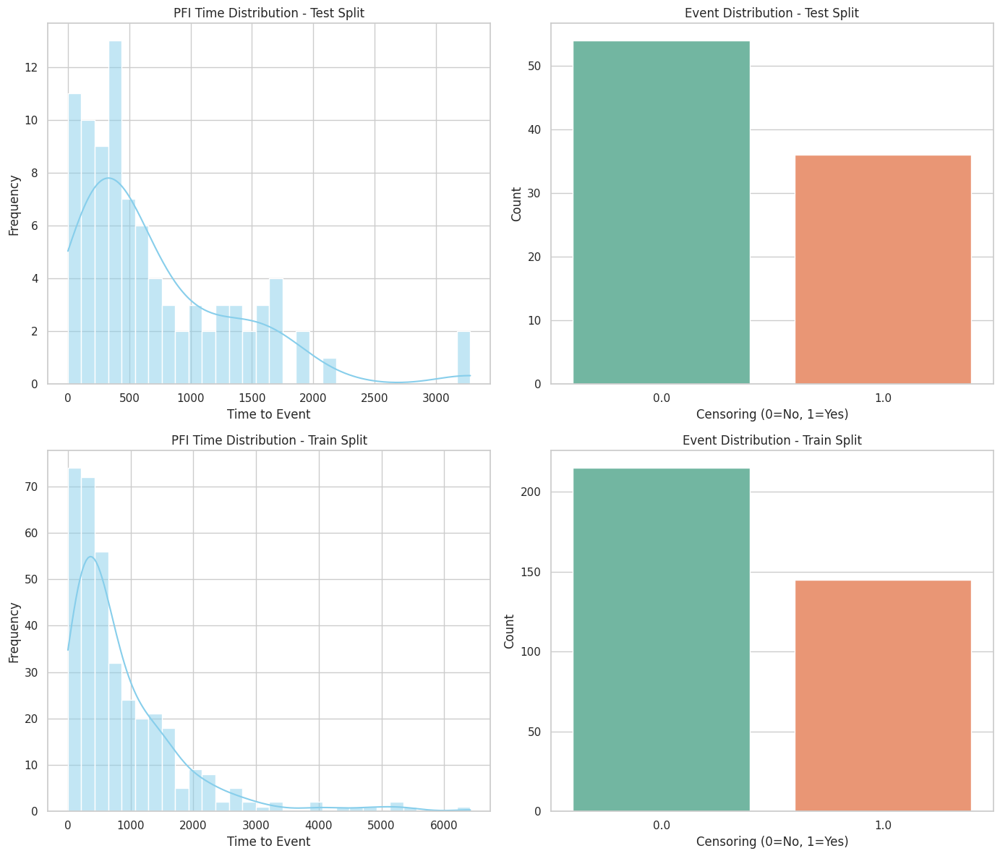

=== Performing KS and Chi-squared Tests on Original Splits ===

Kolmogorov-Smirnov Test for 'time_to_event':
KS Statistic: 0.0917
P-value: 0.5627
Result: No significant difference between the distributions (fail to reject H0).

Contingency Table for 'censoring' vs 'split':
split      test  train
censoring             
0.0          54    215
1.0          36    145

Chi-squared Test for 'censoring' Distribution:
Chi2 Statistic: 0.0000
P-value: 1.0000
Result: No significant difference in censoring distribution (fail to reject H0).


=== Creating New Train and Test Splits ===

Created new train and test splits with test size = 20.0%.
New Training Set: 360 samples
New Testing Set: 90 samples

=== Statistical Analysis of New Splits ===

--- Train_new Split ---
Total Samples: 360
Number of Events (censoring=1): 145.0
Number of Non-Events (censoring=0): 215.0
Event Rate: 40.28%

Descriptive Statistics for 'time_to_event':
count     360.000000
mean      850.183333
std       925.633271
min      

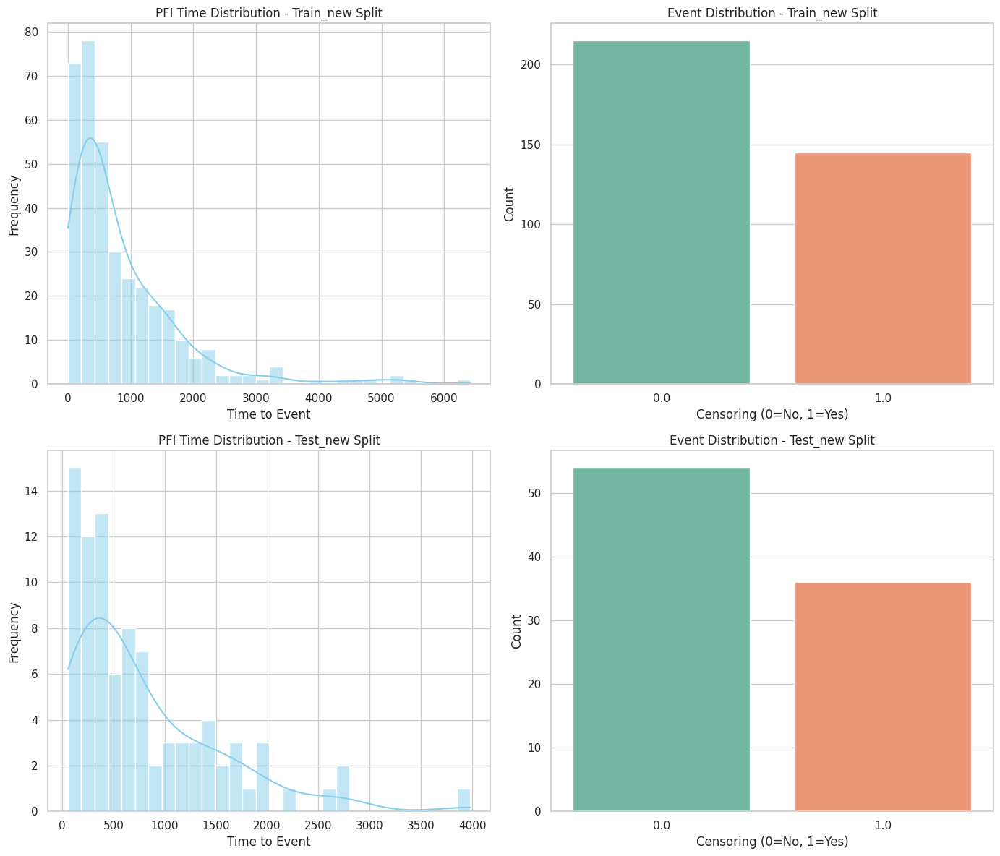

=== Saving New Split Information ===

Saved new split information to 'svs_patient_map_PFI_DX_split_2.json'.

=== Summary of Findings ===

1. **Before Splitting**:
   - Displayed the distribution of 'time_to_event' and 'censoring' for existing splits.
   - Performed KS and Chi-squared tests to assess similarity:
     - KS Test P-value: 0.5627
     - Chi-squared Test P-value: 1.0000
2. **After Creating New Splits**:
   - Generated new train and test splits with similar 'time_to_event' distributions and proportional 'censoring' events.
   - Performed KS and Chi-squared tests to quantitatively assess similarity:
     - KS Test P-value: 0.9960
     - Chi-squared Test P-value: 1.0000
   - Visualizations confirm that the distributions in the new splits are closely aligned.
3. **Output**:
   - The updated split information has been saved to 'svs_patient_map_PFI_DX_split_2.json'.
Ensure to use these new splits for your modeling and evaluation tasks to maintain consistency and reliability.

Proc

In [67]:
create_new_pfi_split_and_plot_2()

# Generate clinical embeddings


In [85]:
def save_clinical_embeddings(run_selected=False, selected="_",folder_name="clinical_embeddings"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, StratifiedShuffleSplit
    import torchtuples as tt
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # DO THE WSI AND PATIENT SELECTION FROM HERE, SO THAT WE DO NOT HAVE PROBLEMS WITH WEIRD HIDDEN BARCODE INTERACTIONS

    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test_filtered = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    clinical_data_test = clinical_data_test_filtered.copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Load Split Information and Assign Splits
    # -------------------------------------------

    # Load the split JSON data
    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    split_df = pd.DataFrame(split_entries)

    # Verify that 'file_name' exists in split_df
    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")

    # Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

    # Create a mapping from 'patient.bcr_patient_barcode' to 'split'
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))

    # Map the 'split' to the clinical data
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

    # Check for any missing splits
    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        # Optionally, you can decide how to handle these entries
        clinical_data_test = clinical_data_test.dropna(subset=['split'])

    # Create boolean masks for training and testing sets
    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'

    # Print the number of train and test samples
    print(f"Number of training samples: {train_mask.sum()}")
    print(f"Number of testing samples: {test_mask.sum()}")

    # Generate file_name_list_train and file_name_list_test
    file_name_list_train = clinical_data_test[clinical_data_test['split'] == 'train'].merge(
        wsi_df[['patient.bcr_patient_barcode', 'file_name']],
        on='patient.bcr_patient_barcode',
        how='inner'
    )['file_name'].tolist()

    file_name_list_test = clinical_data_test[clinical_data_test['split'] == 'test'].merge(
        wsi_df[['patient.bcr_patient_barcode', 'file_name']],
        on='patient.bcr_patient_barcode',
        how='inner'
    )['file_name'].tolist()

    # After mapping, drop 'patient.bcr_patient_barcode' and 'split' as they are no longer needed
    clinical_data_test = clinical_data_test.drop(columns=['patient.bcr_patient_barcode', 'split'])

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

    print(clinical_data_test['age_of_patient'])

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    if run_selected == True:
        # Update numerical_columns to be the intersection of num_cols and selected
        num_cols = list(set(num_cols) & set(selected))

    # Convert numerical columns to float and handle conversion errors
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Identify categorical columns (object dtype)
    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

    if run_selected == True:
        # Update categorical_columns to be the intersection of categorical_cols and selected
        categorical_cols = list(set(categorical_cols) & set(selected))

    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype and then to codes
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    time_copy = time.copy()
    event_copy = event.copy()

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols is not empty
    if num_cols:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not clinical_data_test[categorical_cols].empty:
        X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    else:
        X = clinical_data_test[categorical_cols]  # Only categorical features are present

    print(X.iloc[42])

    X_copy = X.copy()

    # -------------------------------------------
    # Data Splitting Using Split Mapping
    # -------------------------------------------

    # Reset indices to ensure alignment
    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)

    # Create masks based on the splits
    train_mask = train_mask.reset_index(drop=True)
    test_mask = test_mask.reset_index(drop=True)

    # Create train and test sets based on the masks
    X_train_df = X[train_mask]
    X_test_df = X[test_mask]
    y_train_event = event[train_mask]
    y_test_event = event[test_mask]
    y_train_time = time[train_mask]
    y_test_time = time[test_mask]

    # Verify the lengths to prevent IndexError
    print(f"Training set size: {X_train_df.shape[0]}")
    print(f"Testing set size: {X_test_df.shape[0]}")

    # -------------------------------------------
    # Preparing Data for FTTransformer
    # -------------------------------------------

    # Identify numerical and categorical columns after preprocessing
    categorical_columns = list(categorical_cols)
    numerical_columns = num_cols

    # Prepare data for FTTransformer
    def prepare_data(X, categorical_columns, numerical_columns):
        # For categorical features
        cat_features = X[categorical_columns]
        # For numerical features
        num_features = X[numerical_columns]
        return cat_features, num_features

    X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
    X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

    print("Unique categories in training set after split:", X_train_cat.nunique())
    print("Unique categories in test set after split:", X_test_cat.nunique())

    # -------------------------------------------
    # Convert Data to PyTorch Tensors
    # -------------------------------------------

    # Convert data to torch tensors
    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)

    X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
    X_train_num_tensor = to_tensor(X_train_num, torch.float32)
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
    X_test_num_tensor = to_tensor(X_test_num, torch.float32)

    # -------------------------------------------
    # Initialize FTTransformer (Pretrained)
    # -------------------------------------------

    # Get the number of unique categories for each categorical column
    categories = [int(max(X_train_cat[col].max(), X_test_cat[col].max()) + 1) for col in categorical_columns]

    # Check if the lengths of categories and categorical_columns match
    print("Categories Length:", len(categories))
    print("Categorical Columns Length:", len(categorical_columns))

    print("X_train_cat_tensor shape:", X_train_cat_tensor.shape)
    print("X_train_num_tensor shape:", X_train_num_tensor.shape)

    # Print the maximum values in X_train_cat and X_test_cat before creating categories
    print("Max values in X_train_cat for each categorical column:", X_train_cat.max())
    print("Max values in X_test_cat for each categorical column:", X_test_cat.max())

    # Print the categories list to see the maximum indices allowed for each categorical feature
    print("Categories (maximum indices allowed for each feature):", categories)

    # Instantiate the FTTransformer model
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    ft_transformer = FTTransformer(
        categories=categories,                              # List of unique category counts
        num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
        dim=192,                                            # Embedding dimension size, adjust as needed
        depth=6,                                            # Number of transformer layers
        heads=8,                                            # Number of attention heads
        attn_dropout=0.1,                                   # Dropout for attention layers
        ff_dropout=0.1                                      # Dropout for feedforward layers
    ).to(device)

    # Load pretrained weights if available
    # Uncomment and modify the following line if you have pretrained weights
    # ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

    # Set the model to evaluation mode
    ft_transformer.eval()

    # -------------------------------------------
    # Generating Embeddings
    # -------------------------------------------

    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
            numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()

    # Generate embeddings for training and test sets
    train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
    test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

    # Verify the shape of the embeddings
    print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
    print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

    # -------------------------------------------
    # Saving Training and Testing Embeddings to .pt Files
    # -------------------------------------------

    # Ensure the 'clinical_embeddings' directory exists

    #folder_name = 'clinical_embeddings'
    os.makedirs(folder_name, exist_ok=True)

    # Save training embeddings
    for embedding, filename in zip(train_embeddings, file_name_list_train):
        # Replace '.svs' with '.pt' in the filename
        filename_pt = filename.replace('.svs', '_flatten.pt')

        # Full path to save the embedding
        filepath = os.path.join(folder_name, filename_pt)

        # Save the embedding as a .pt file
        torch.save(torch.tensor(embedding), filepath)

    # Save testing embeddings
    for embedding, filename in zip(test_embeddings, file_name_list_test):
        # Replace '.svs' with '.pt' in the filename
        filename_pt = filename.replace('.svs', '_flatten.pt')

        # Full path to save the embedding
        filepath = os.path.join(folder_name, filename_pt)

        # Save the embedding as a .pt file
        torch.save(torch.tensor(embedding), filepath)

    # Print total train files, total test files, and total number of files in folder
    total_train_files = len(file_name_list_train)
    total_test_files = len(file_name_list_test)
    total_files_in_folder = len(os.listdir(folder_name))

    print(f"Total training files saved: {total_train_files}")
    print(f"Total testing files saved: {total_test_files}")
    print(f"Total number of files in {folder_name} folder: {total_files_in_folder}")




In [84]:
save_clinical_embeddings(run_selected=False, selected="_")

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
0      62.521561
1      59.299110
2      54.636550
3      63.477070
5      77.344285
         ...    
522    75.857632
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 450, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.059391
patient.lymphnodes_ratio_positive_by_he                                   0.918626
age_of_patient                                                           -0.659876
patient.tobacco_smoking_history                                          -0.296069
patient.year_of_tobacco_smoking_onset                                     0.957086
patient.number_pack_years_smoked                                          1.394549
patient.stopped_smoking_year                                             -0.728405
patient.frequency_of_alcohol_consumption                                  1

In [28]:
univariate_best_list = ['patient.stopped_smoking_year', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'age_of_patient', 'patient.alcohol_history_documented', 'patient.anatomic_neoplasm_subdivision', 'patient.number_pack_years_smoked', 'patient.presence_of_pathological_nodal_extracapsular_spread', 'patient.lymphovascular_invasion_present', 'patient.margin_status', 'patient.laterality', 'patient.primary_lymph_node_presentation_assessment', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.lymphnodes_ratio_positive_by_he', 'patient.icd_o_3_site', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.pathologic_stage', 'patient.hpv_status_by_ish_testing', 'patient.race_list.race', 'patient.frequency_of_alcohol_consumption', 'HPV load', 'patient.icd_10', 'patient.perineural_invasion_present']
uni_best_list_cross = ['patient.lymphnodes_ratio_positive_by_he', 'age_of_patient', 'patient.amount_of_alcohol_consumption_per_day', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T', 'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N', 'patient.stage_event.pathologic_stage', 'HPV load', 'patient.race_list.race', 'patient.primary_lymph_node_presentation_assessment', 'patient.margin_status', 'patient.presence_of_pathological_nodal_extracapsular_spread', 'patient.lymphovascular_invasion_present', 'patient.perineural_invasion_present', 'patient.hpv_status_by_ish_testing']

#save_clinical_embeddings(run_selected=True, selected=uni_best_list_cross,folder_name="clinical_embeddings_uni")

In [33]:
run_deep_learning_fix(run_selected=True, selected=uni_best_list_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
0      62.521561
1      59.299110
2      54.636550
3      63.477070
5      77.344285
         ...    
522    75.857632
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 450, dtype: float64
HPV load                                                                -0.221773
patient.amount_of_alcohol_consumption_per_day                            4.540241
patient.stage_event.tnm_categories.pathologic_categories.pathologic_T    1.154674
patient.stage_event.tnm_categories.pathologic_categories.pathologic_N   -0.666384
patient.stage_event.pathologic_stage                                     0.779376
age_of_patient                                                          -0.659876
patient.lymphnodes_ratio_positive_by_he                                  0.918626
patient.race_list.race                                                   3.000000


(0.6209747362631963, 0.6778797186727856)

In [31]:
run_deep_learning_fix(run_selected=True, selected=uni_best_list_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
0      62.521561
1      59.299110
2      54.636550
3      63.477070
5      77.344285
         ...    
522    75.857632
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 450, dtype: float64
HPV load                                                                -0.221773
patient.amount_of_alcohol_consumption_per_day                            4.540241
patient.stage_event.tnm_categories.pathologic_categories.pathologic_T    1.154674
patient.stage_event.tnm_categories.pathologic_categories.pathologic_N   -0.666384
patient.stage_event.pathologic_stage                                     0.779376
age_of_patient                                                          -0.659876
patient.lymphnodes_ratio_positive_by_he                                  0.918626
patient.race_list.race                                                   3.000000


(0.6365707135546677, 0.6964170737994245)

In [34]:
run_deep_learning_fix(run_selected=False, selected=uni_best_list_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
0      62.521561
1      59.299110
2      54.636550
3      63.477070
5      77.344285
         ...    
522    75.857632
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 450, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.059391
patient.lymphnodes_ratio_positive_by_he                                   0.918626
age_of_patient                                                           -0.659876
patient.tobacco_smoking_history                                          -0.296069
patient.year_of_tobacco_smoking_onset                                     0.957086
patient.number_pack_years_smoked                                          1.394549
patient.stopped_smoking_year                                             -0.728405
patient.frequency_of_alcohol_consumption                                  1

(0.5785986186827737, 0.626969238304943)

In [36]:
run_deep_learning_fix(run_selected=False, selected=uni_best_list_cross)

Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
0      62.521561
1      59.299110
2      54.636550
3      63.477070
5      77.344285
         ...    
522    75.857632
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 450, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.059391
patient.lymphnodes_ratio_positive_by_he                                   0.918626
age_of_patient                                                           -0.659876
patient.tobacco_smoking_history                                          -0.296069
patient.year_of_tobacco_smoking_onset                                     0.957086
patient.number_pack_years_smoked                                          1.394549
patient.stopped_smoking_year                                             -0.728405
patient.frequency_of_alcohol_consumption                                  1

(0.5883520659073238, 0.6983894630944608)

# Lets try bootstrap validation by modifying the run_deep_learning_fix script. 

In [ ]:
def run_deep_learning_fix(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, StratifiedShuffleSplit
    import torchtuples as tt
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # DO THE WSI AND PATIENT SELECTION FROM HERE, SO THAT WE DO NOT HAVE PROBLEMS WITH WEIRD HIDDEN BARCODE INTERACTIONS

    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test_filtered = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    clinical_data_test = clinical_data_test_filtered.copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Load Split Information and Assign Splits
    # -------------------------------------------

    # Load the split JSON data
    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    split_df = pd.DataFrame(split_entries)

    # Verify that 'file_name' exists in split_df
    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")

    # Extract 'patient.bcr_patient_barcode' from 'file_name' in split_df
    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)

    # Create a mapping from 'patient.bcr_patient_barcode' to 'split'
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))

    # Map the 'split' to the clinical data
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

    # Check for any missing splits
    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        # Optionally, you can decide how to handle these entries
        clinical_data_test = clinical_data_test.dropna(subset=['split'])

    # Create boolean masks for training and testing sets
    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'

    # Print the number of train and test samples
    print(f"Number of training samples: {train_mask.sum()}")
    print(f"Number of testing samples: {test_mask.sum()}")

    # After mapping, drop 'patient.bcr_patient_barcode' and 'split' as they are no longer needed
    clinical_data_test = clinical_data_test.drop(columns=['patient.bcr_patient_barcode', 'split'])

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

    print(clinical_data_test['age_of_patient'])

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    if run_selected == True:
        # Update numerical_columns to be the intersection of num_cols and selected
        num_cols = list(set(num_cols) & set(selected))

    # Convert numerical columns to float and handle conversion errors
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Identify categorical columns (object dtype)
    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

    if run_selected == True:
        # Update categorical_columns to be the intersection of categorical_cols and selected
        categorical_cols = list(set(categorical_cols) & set(selected))

    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype and then to codes
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    time_copy = time.copy()
    event_copy = event.copy()

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols is not empty
    if num_cols:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not clinical_data_test[categorical_cols].empty:
        X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    else:
        X = clinical_data_test[categorical_cols]  # Only categorical features are present

    print(X.iloc[42])

    X_copy = X.copy()

    # -------------------------------------------
    # Data Splitting Using Split Mapping
    # -------------------------------------------

    # Reset indices to ensure alignment
    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)

    # Create masks based on the splits
    train_mask = train_mask.reset_index(drop=True)
    test_mask = test_mask.reset_index(drop=True)

    # Create train and test sets based on the masks
    X_train_df = X[train_mask]
    X_test_df = X[test_mask]
    y_train_event = event[train_mask]
    y_test_event = event[test_mask]
    y_train_time = time[train_mask]
    y_test_time = time[test_mask]

    # Verify the lengths to prevent IndexError
    print(f"Training set size: {X_train_df.shape[0]}")
    print(f"Testing set size: {X_test_df.shape[0]}")

    # -------------------------------------------
    # Preparing Data for FTTransformer
    # -------------------------------------------

    # Identify numerical and categorical columns after preprocessing
    categorical_columns = list(categorical_cols)
    numerical_columns = num_cols

    # Prepare data for FTTransformer
    def prepare_data(X, categorical_columns, numerical_columns):
        # For categorical features
        cat_features = X[categorical_columns]
        # For numerical features
        num_features = X[numerical_columns]
        return cat_features, num_features

    X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
    X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

    print("Unique categories in training set after split:", X_train_cat.nunique())
    print("Unique categories in test set after split:", X_test_cat.nunique())

    # -------------------------------------------
    # Convert Data to PyTorch Tensors
    # -------------------------------------------

    # Convert data to torch tensors
    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)

    X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
    X_train_num_tensor = to_tensor(X_train_num, torch.float32)
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long)
    X_test_num_tensor = to_tensor(X_test_num, torch.float32)

    # -------------------------------------------
    # Initialize FTTransformer (Pretrained)
    # -------------------------------------------

    # Get the number of unique categories for each categorical column
    categories = [int(max(X_train_cat[col].max(), X_test_cat[col].max()) + 1) for col in categorical_columns]

    # Check if the lengths of categories and categorical_columns match
    print("Categories Length:", len(categories))
    print("Categorical Columns Length:", len(categorical_columns))

    print("X_train_cat_tensor shape:", X_train_cat_tensor.shape)
    print("X_train_num_tensor shape:", X_train_num_tensor.shape)

    # Print the maximum values in X_train_cat and X_test_cat before creating categories
    print("Max values in X_train_cat for each categorical column:", X_train_cat.max())
    print("Max values in X_test_cat for each categorical column:", X_test_cat.max())

    # Print the categories list to see the maximum indices allowed for each categorical feature
    print("Categories (maximum indices allowed for each feature):", categories)

    # Instantiate the FTTransformer model
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    ft_transformer = FTTransformer(
        categories=categories,                              # List of unique category counts
        num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
        dim=192,                                            # Embedding dimension size, adjust as needed
        depth=6,                                            # Number of transformer layers
        heads=8,                                            # Number of attention heads
        attn_dropout=0.1,                                   # Dropout for attention layers
        ff_dropout=0.1                                      # Dropout for feedforward layers
    ).to(device)

    # Load pretrained weights if available
    # Uncomment and modify the following line if you have pretrained weights
    # ft_transformer.load_state_dict(torch.load('path_to_pretrained_ft_transformer.pth'))

    # Set the model to evaluation mode
    ft_transformer.eval()

    # -------------------------------------------
    # Generating Embeddings
    # -------------------------------------------

    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
            numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()

    # Generate embeddings for training and test sets
    train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
    test_embeddings = get_embeddings(ft_transformer, X_test_cat, X_test_num)

    # Verify the shape of the embeddings
    print(f"Train Embeddings Shape: {train_embeddings.shape}")  # Expected: (num_train_samples, dim)
    print(f"Test Embeddings Shape: {test_embeddings.shape}")    # Expected: (num_test_samples, dim)

    # -------------------------------------------
    # Define the Neural Network Architecture for CoxPH
    # -------------------------------------------

    # Define the neural network architecture
    num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

    out_features = 1  # Output dimension (single risk score)
    batch_norm = True  # Use batch normalization
    dropout = 0.4  # Dropout rate to prevent overfitting
    output_bias = False  # Bias term in the output layer

    # Initialize the MLPVanilla model with reduced input features 
    net = tt.practical.MLPVanilla(
        in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )

    # Initialize the CoxPH model with the network and optimizer
    optimizer = tt.optim.Adam(lr=1e-3)
    cox_ph = CoxPH(net, optimizer)

    # -------------------------------------------
    # CoxPH Analysis with 5-Fold Cross-Validation
    # -------------------------------------------

    # Prepare survival data
    durations_train = y_train_time.astype(np.float32)
    events_train = y_train_event.astype(np.int64)

    # Ensure embeddings are contiguous
    train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

    # Initialize KFold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    c_index_scores = []

    print("\nStarting 5-Fold Cross-Validation...\n")

    for fold, (train_idx_cv, val_idx_cv) in enumerate(kf.split(train_embeddings)):
        print(f"Fold {fold + 1}")

        # Split data
        X_train_cv = train_embeddings[train_idx_cv]
        y_train_cv_durations = durations_train[train_idx_cv]
        y_train_cv_events = events_train[train_idx_cv]

        X_val_cv = train_embeddings[val_idx_cv]
        y_val_cv_durations = durations_train[val_idx_cv]
        y_val_cv_events = events_train[val_idx_cv]

        # Ensure arrays are contiguous
        X_train_cv = np.ascontiguousarray(X_train_cv, dtype=np.float32)
        y_train_cv_durations = np.ascontiguousarray(y_train_cv_durations, dtype=np.float32)
        y_train_cv_events = np.ascontiguousarray(y_train_cv_events, dtype=np.int64)

        # Initialize a new instance of the network for each fold to avoid weight sharing
        net_cv = tt.practical.MLPVanilla(
            in_features=train_embeddings.shape[1],
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )

        # Initialize CoxPH model for this fold
        optimizer_cv = tt.optim.Adam(lr=1e-3)
        cox_ph_cv = CoxPH(net_cv, optimizer_cv)

        # Fit the model
        cox_ph_cv.fit(
            X_train_cv,
            (y_train_cv_events, y_train_cv_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )

        # Predict risk scores on validation set
        risk_val = cox_ph_cv.predict(X_val_cv).squeeze()

        # Compute C-Index
        c_index = concordance_index_censored(
            y_val_cv_events.astype(bool),
            y_val_cv_durations,
            -risk_val  # Use negative risk for proper ordering
        )[0]

        print(f"Fold {fold + 1} C-Index: {c_index:.4f}\n")

        c_index_scores.append(c_index)

    # Calculate Cross-Validation Mean and Uncertainty
    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)

    print(f"Cross-Validation C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

    # -------------------------------------------
    # Train Final CoxPH Model on Entire Training Set
    # -------------------------------------------

    print("\nTraining Final CoxPH Model on Entire Training Set...\n")

    # Ensure arrays are contiguous
    train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)
    durations_train = np.ascontiguousarray(durations_train, dtype=np.float32)
    events_train = np.ascontiguousarray(events_train, dtype=np.int64)

    # Fit the final model on the entire training set
    cox_ph.fit(
        train_embeddings,
        (events_train, durations_train),
        batch_size=64,
        epochs=100,
        verbose=False
    )

    print("Final CoxPH Model Trained Successfully.")

    # -------------------------------------------
    # Evaluate on Test Set
    # -------------------------------------------

    print("\nEvaluating on Test Set...\n")

    # Prepare test data
    durations_test = y_test_time.astype(np.float32)
    events_test = y_test_event.astype(np.int64)
    test_embeddings = np.ascontiguousarray(test_embeddings, dtype=np.float32)

    # Predict risk scores on test set
    risk_test = cox_ph.predict(test_embeddings).squeeze()

    # Compute C-Index on Test Set
    c_index_test = concordance_index_censored(
        events_test.astype(bool),
        durations_test,
        -risk_test  # Use negative risk for proper ordering
    )[0]

    print(f"Test C-Index: {c_index_test:.4f}")

    # -------------------------------------------
    # Bootstrapping for Test C-Index Uncertainty
    # -------------------------------------------

    n_bootstraps = 1000
    c_index_bootstrap = []

    print("\nStarting Bootstrapping for Test C-Index Uncertainty...\n")

    for i in range(n_bootstraps):
        # Resample test set with replacement
        indices = np.random.choice(len(test_embeddings), size=len(test_embeddings), replace=True)
        X_test_bs = test_embeddings[indices]
        durations_test_bs = durations_test[indices]
        events_test_bs = events_test[indices]

        # Predict risk scores
        risk_bs = cox_ph.predict(X_test_bs).squeeze()

        # Compute C-Index
        c_index_bs = concordance_index_censored(
            events_test_bs.astype(bool),
            durations_test_bs,
            -risk_bs  # Use negative risk for proper ordering
        )[0]

        c_index_bootstrap.append(c_index_bs)

        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap {i + 1}/{n_bootstraps} completed.")

    # Calculate Bootstrapped C-Index Statistics
    c_index_test_mean = np.mean(c_index_bootstrap)
    c_index_test_std = np.std(c_index_bootstrap)
    c_index_test_ci_lower = np.percentile(c_index_bootstrap, 2.5)
    c_index_test_ci_upper = np.percentile(c_index_bootstrap, 97.5)

    print(f"\nTest C-Index with Bootstrapping: {c_index_test_mean:.4f} ± {c_index_test_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_test_ci_lower:.4f}, {c_index_test_ci_upper:.4f}]")

    return c_index_mean, c_index_test_mean


In [24]:
def run_deep_learning_bootstrap(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, StratifiedShuffleSplit
    import torchtuples as tt
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # DO THE WSI AND PATIENT SELECTION FROM HERE, SO THAT WE DO NOT HAVE PROBLEMS WITH WEIRD HIDDEN BARCODE INTERACTIONS

    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    # Check if JSON files exist
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test_filtered = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    clinical_data_test = clinical_data_test_filtered.copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

    print(clinical_data_test['age_of_patient'])

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    if run_selected == True:
        # Update numerical_columns to be the intersection of num_cols and selected
        num_cols = list(set(num_cols) & set(selected))

    # Convert numerical columns to float and handle conversion errors
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Identify categorical columns (object dtype)
    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

    if run_selected == True:
        # Update categorical_columns to be the intersection of categorical_cols and selected
        categorical_cols = list(set(categorical_cols) & set(selected))

    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype and then to codes
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    time_copy = time.copy()
    event_copy = event.copy()

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols is not empty
    if num_cols:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not clinical_data_test[categorical_cols].empty:
        X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    else:
        X = clinical_data_test[categorical_cols]  # Only categorical features are present

    print(X.iloc[42])

    X_copy = X.copy()

    # -------------------------------------------
    # Identify Numerical and Categorical Columns
    # -------------------------------------------

    # Identify numerical and categorical columns after preprocessing
    categorical_columns = list(categorical_cols)
    numerical_columns = num_cols

    # -------------------------------------------
    # Bootstrap Validation
    # -------------------------------------------

    # Number of bootstrap iterations
    n_bootstraps = 1000
    c_index_scores = []

    print("\nStarting Bootstrap Validation...\n")

    counter=0
    for i in range(n_bootstraps):
        # -------------------------------------------
        # Bootstrap Resampling
        # -------------------------------------------

        # Resample indices with replacement
        indices = np.random.choice(len(X), size=len(X), replace=True)
        oob_indices = np.setdiff1d(np.arange(len(X)), np.unique(indices))

        # Ensure at least one event in OOB samples
        if event[oob_indices].sum() == 0 or event[indices].sum() == 0:
            # Skip this iteration if no events are present in train or OOB samples
            continue

        # Create bootstrap samples
        X_train = X.iloc[indices]
        y_train_event = event[indices]
        y_train_time = time[indices]

        X_oob = X.iloc[oob_indices]
        y_oob_event = event[oob_indices]
        y_oob_time = time[oob_indices]

        # -------------------------------------------
        # Prepare Data for FTTransformer
        # -------------------------------------------

        def prepare_data(X, categorical_columns, numerical_columns):
            # For categorical features
            cat_features = X[categorical_columns]
            # For numerical features
            num_features = X[numerical_columns]
            return cat_features, num_features

        X_train_cat, X_train_num = prepare_data(X_train, categorical_columns, numerical_columns)
        X_oob_cat, X_oob_num = prepare_data(X_oob, categorical_columns, numerical_columns)

        # -------------------------------------------
        # Convert Data to PyTorch Tensors
        # -------------------------------------------

        # Convert data to torch tensors
        def to_tensor(x, dtype):
            return torch.tensor(x.values, dtype=dtype)

        X_train_cat_tensor = to_tensor(X_train_cat, torch.long)
        X_train_num_tensor = to_tensor(X_train_num, torch.float32)
        X_oob_cat_tensor = to_tensor(X_oob_cat, torch.long)
        X_oob_num_tensor = to_tensor(X_oob_num, torch.float32)

        # -------------------------------------------
        # Initialize FTTransformer (Pretrained)
        # -------------------------------------------

        # Get the number of unique categories for each categorical column
        categories = [int(X[c].max() + 1) for c in categorical_columns]

        # Instantiate the FTTransformer model
        device = 'cuda' if torch.cuda.is_available() else 'cpu'

        ft_transformer = FTTransformer(
            categories=categories,                              # List of unique category counts
            num_continuous=X_train_num_tensor.shape[1],         # Number of continuous features
            dim=192,                                            # Embedding dimension size, adjust as needed
            depth=6,                                            # Number of transformer layers
            heads=8,                                            # Number of attention heads
            attn_dropout=0.1,                                   # Dropout for attention layers
            ff_dropout=0.1                                      # Dropout for feedforward layers
        ).to(device)

        # Set the model to evaluation mode
        ft_transformer.eval()

        # -------------------------------------------
        # Generating Embeddings
        # -------------------------------------------

        def get_embeddings(model, X_cat, X_num):
            model.eval()
            with torch.no_grad():
                categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
                numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
                embeddings = model(categorical, numerical, return_embedding=True)
                return embeddings.cpu().numpy()

        # Generate embeddings for training and OOB sets
        train_embeddings = get_embeddings(ft_transformer, X_train_cat, X_train_num)
        oob_embeddings = get_embeddings(ft_transformer, X_oob_cat, X_oob_num)

        # -------------------------------------------
        # Define the Neural Network Architecture for CoxPH
        # -------------------------------------------

        # Define the neural network architecture
        num_nodes = [192, 128, 64]  # Number of neurons in each hidden layer

        out_features = 1  # Output dimension (single risk score)
        batch_norm = True  # Use batch normalization
        dropout = 0.4  # Dropout rate to prevent overfitting
        output_bias = False  # Bias term in the output layer

        # Initialize the MLPVanilla model with reduced input features
        net = tt.practical.MLPVanilla(
            in_features=train_embeddings.shape[1],  # Number of input features (embedding dimension)
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )

        # Initialize the CoxPH model with the network and optimizer
        optimizer = tt.optim.Adam(lr=1e-3)
        cox_ph = CoxPH(net, optimizer)

        # -------------------------------------------
        # Train CoxPH Model on Bootstrap Sample
        # -------------------------------------------

        # Prepare survival data
        durations_train = y_train_time.astype(np.float32)
        events_train = y_train_event.astype(np.int64)

        # Ensure embeddings are contiguous
        train_embeddings = np.ascontiguousarray(train_embeddings, dtype=np.float32)

        # Fit the model
        cox_ph.fit(
            train_embeddings,
            (events_train, durations_train),
            batch_size=64,
            epochs=100,
            verbose=False
        )

        # -------------------------------------------
        # Evaluate on Out-of-Bag Data
        # -------------------------------------------

        # Prepare OOB survival data
        durations_oob = y_oob_time.astype(np.float32)
        events_oob = y_oob_event.astype(np.int64)

        # Predict risk scores on OOB set
        risk_oob = cox_ph.predict(oob_embeddings).squeeze()

        # Compute C-Index on OOB Set
        c_index = concordance_index_censored(
            events_oob.astype(bool),
            durations_oob,
            -risk_oob  # Use negative risk for proper ordering
        )[0]

        c_index_scores.append(c_index)

        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap Iteration {i + 1}/{n_bootstraps} completed. Current C-Index: {c_index:.4f}")
        counter+=1
        print(counter)

    # -------------------------------------------
    # Calculate Bootstrap Statistics
    # -------------------------------------------

    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)

    print(f"\nBootstrap C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

    return c_index_mean


In [25]:
run_deep_learning_bootstrap(run_selected=False, selected="_")

Total rows BEFORE: 528
Total rows AFTER: 450
0      62.521561
1      59.299110
2      54.636550
3      63.477070
5      77.344285
         ...    
522    75.857632
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 450, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.059391
patient.lymphnodes_ratio_positive_by_he                                   0.918626
age_of_patient                                                           -0.659876
patient.tobacco_smoking_history                                          -0.296069
patient.year_of_tobacco_smoking_onset                                     0.957086
patient.number_pack_years_smoked                                          1.394549
patient.stopped_smoking_year                                             -0.728405
patient.frequency_of_alcohol_consumption                                  1.740079
patient.amount_of_alcohol_consumption_per_day         

KeyboardInterrupt: 

In [ ]:
def run_RSF_bootstrap(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    from sksurv.ensemble import RandomSurvivalForest
    from sksurv.metrics import concordance_index_censored
    from sksurv.util import Surv
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, GridSearchCV
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    np.random.seed(seed)
    random.seed(seed)

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # Perform WSI and patient selection to avoid issues with hidden barcode interactions
    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file

    # Check if JSON file exists
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    # Calculate age of patient
    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / -365.25  # Correct sign

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    # Ensure correct data types for numerical columns
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Identify categorical columns (object dtype)
    all_categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

    if run_selected:
        # Divide selected variables into num_cols and categorical_cols
        num_cols_selected = [col for col in selected if col in num_cols]
        categorical_cols_selected = [col for col in selected if col not in num_cols]
    else:
        num_cols_selected = num_cols
        categorical_cols_selected = all_categorical_cols

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols_selected] = clinical_data_test[categorical_cols_selected].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype
    for col in categorical_cols_selected:
        clinical_data_test[col] = clinical_data_test[col].astype('category')

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    # Prepare survival data in the format required by sksurv
    survival_data = np.array(
        [(e, t) for e, t in zip(event, time)],
        dtype=[('event', bool), ('time', float)]
    )

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols_selected is not empty
    if num_cols_selected:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols_selected])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols_selected, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # One-hot encode categorical variables
    if categorical_cols_selected:
        encoded_categorical = pd.get_dummies(clinical_data_test[categorical_cols_selected], drop_first=False)
    else:
        encoded_categorical = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and one-hot encoded categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not encoded_categorical.empty:
        X = pd.concat([scaled_num_cols_df, encoded_categorical], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    elif not encoded_categorical.empty:
        X = encoded_categorical  # Only categorical features are present
    else:
        # Both are empty
        raise ValueError("No features selected. Both numerical and categorical feature sets are empty.")

    # -------------------------------------------
    # Bootstrap Validation
    # -------------------------------------------

    # Number of bootstrap iterations
    n_bootstraps = 1000
    c_index_scores = []

    print("\nStarting Bootstrap Validation...\n")

    for i in range(n_bootstraps):
        # -------------------------------------------
        # Bootstrap Resampling
        # -------------------------------------------

        # Resample indices with replacement
        indices = np.random.choice(len(X), size=len(X), replace=True)
        oob_indices = np.setdiff1d(np.arange(len(X)), np.unique(indices))

        # Ensure at least one event in both training and OOB samples
        if event[indices].sum() == 0 or event[oob_indices].sum() == 0:
            # Skip this iteration if no events are present in train or OOB samples
            continue

        # Create bootstrap samples
        X_train = X.iloc[indices]
        y_train = survival_data[indices]

        X_oob = X.iloc[oob_indices]
        y_oob = survival_data[oob_indices]

        # -------------------------------------------
        # Initialize Random Survival Forest
        # -------------------------------------------

        # Initialize RSF model with default parameters
        rsf = RandomSurvivalForest(
            n_estimators=100,
            min_samples_split=10,
            min_samples_leaf=15,
            max_features='sqrt',
            n_jobs=1,
            random_state=seed
        )

        # -------------------------------------------
        # Train RSF Model on Bootstrap Sample
        # -------------------------------------------

        rsf.fit(X_train.values, y_train)

        # -------------------------------------------
        # Evaluate on Out-of-Bag Data
        # -------------------------------------------

        # Predict risk scores on OOB set
        risk_scores_oob = rsf.predict(X_oob.values)

        # Compute C-Index on OOB Set
        c_index = concordance_index_censored(
            y_oob['event'],
            y_oob['time'],
            risk_scores_oob
        )[0]

        c_index_scores.append(c_index)

        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap Iteration {i + 1}/{n_bootstraps} completed. Current C-Index: {c_index:.4f}")

    # -------------------------------------------
    # Calculate Bootstrap Statistics
    # -------------------------------------------

    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)

    print(f"\nBootstrap C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

    # -------------------------------------------
    # Return Results
    # -------------------------------------------

    # Format C-index with uncertainty
    c_index_str = f"{c_index_mean:.4f} ± {c_index_std:.4f}"

    return {
        'bootstrap_c_index': c_index_str,
        'confidence_interval': f"[{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]"
    }

In [ ]:
def run_FastKernelSVM_bootstrap(run_selected=False, selected="_"):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    from sksurv.svm import FastKernelSurvivalSVM
    from sksurv.metrics import concordance_index_censored
    from sksurv.util import Surv
    from sklearn.preprocessing import StandardScaler
    import warnings
    import random
    import json

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set random seeds for reproducibility
    seed = 42
    np.random.seed(seed)
    random.seed(seed)

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Assume 'clinical_data_yes_id' is your input DataFrame

    # Perform WSI and patient selection to avoid issues with hidden barcode interactions
    clinical_data_test = clinical_data_yes_id.copy()

    # Paths to the JSON files
    json_path = 'svs_patient_map_PFI.json'  # Original JSON file

    # Check if JSON file exists
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")

    # Load the original JSON data
    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    # Convert the list of dictionaries to a pandas DataFrame
    wsi_df = pd.DataFrame(survival_entries)

    # Verify that 'file_name' column exists
    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    # Function to extract 'patient.bcr_patient_barcode' from 'file_name'
    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    # Extract 'patient.bcr_patient_barcode' in wsi_df
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)

    # Convert 'patient.bcr_patient_barcode' to string to ensure consistency
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)

    # Adjust the filtering condition based on your actual data structure
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    # Store the initial row count of clinical_data_test
    initial_row_count = clinical_data_test.shape[0]

    # Filter clinical_data_test to keep only rows where "patient.bcr_patient_barcode" values exist in wsi_df
    clinical_data_test = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()

    # Store the final row count after filtering
    final_row_count = clinical_data_test.shape[0]

    # Print the results
    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    # -------------------------------------------
    # Remove Clinical Stage System Related Columns
    # -------------------------------------------

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    # Define mapping dictionaries based on your data
    t_mapping = {
        'TX': -1,    # Primary tumor cannot be assessed
        'T0': 0,     # No evidence of primary tumor
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,    # Regional lymph nodes cannot be assessed
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,    # Distant metastasis cannot be assessed
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    # Functions to encode pathologic T, N, M, and stage categories
    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    # Apply encoding directly to the original columns to overwrite them
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    # Fill NaN values in 'patient.days_to_birth' with the mean
    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)

    # Calculate age of patient
    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / -365.25  # Correct sign

    # Define numerical columns, including the encoded pathologic columns
    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    # Ensure correct data types for numerical columns
    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    # Identify categorical columns (object dtype)
    all_categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns.tolist()

    if run_selected:
        # Divide selected variables into num_cols and categorical_cols
        num_cols_selected = [col for col in selected if col in num_cols]
        categorical_cols_selected = [col for col in selected if col not in num_cols]
    else:
        num_cols_selected = num_cols
        categorical_cols_selected = all_categorical_cols

    # Fill NaN values in numerical columns
    # Define columns related to tobacco and alcohol consumption
    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    # Fill NaN values with -1 in tobacco and alcohol-related columns
    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    # Fill NaN values with -1 in the encoded pathologic columns
    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    # Handle categorical variables
    # Fill NaN values in categorical columns with the string "missing"
    clinical_data_test[categorical_cols_selected] = clinical_data_test[categorical_cols_selected].fillna("missing")

    # Encode categorical variables by converting them to categorical dtype
    for col in categorical_cols_selected:
        clinical_data_test[col] = clinical_data_test[col].astype('category')

    # -------------------------------------------
    # Prepare Survival Data
    # -------------------------------------------

    # Fill NaN values in 'PFI.time' with the mean
    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )

    # Fill NaN values in 'PFI' with 0 (assuming missing events are non-events)
    clinical_data_test['PFI'].fillna(0, inplace=True)

    # Extract survival data
    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    # Prepare survival data in the format required by sksurv
    survival_data = np.array(
        [(e, t) for e, t in zip(event, time)],
        dtype=[('event', bool), ('time', float)]
    )

    # -------------------------------------------
    # Feature Engineering
    # -------------------------------------------

    # Scale numerical features if num_cols_selected is not empty
    if num_cols_selected:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols_selected])
        # Convert scaled numerical features back to DataFrame for compatibility
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols_selected, index=clinical_data_test.index)
    else:
        # Create an empty DataFrame if no numerical columns are present
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    # One-hot encode categorical variables
    if categorical_cols_selected:
        encoded_categorical = pd.get_dummies(clinical_data_test[categorical_cols_selected], drop_first=False)
    else:
        encoded_categorical = pd.DataFrame(index=clinical_data_test.index)

    # Combine scaled numerical features and one-hot encoded categorical features into a single DataFrame
    if not scaled_num_cols_df.empty and not encoded_categorical.empty:
        X = pd.concat([scaled_num_cols_df, encoded_categorical], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df  # Only numerical features are present
    elif not encoded_categorical.empty:
        X = encoded_categorical  # Only categorical features are present
    else:
        # Both are empty
        raise ValueError("No features selected. Both numerical and categorical feature sets are empty.")

    # -------------------------------------------
    # Bootstrap Validation
    # -------------------------------------------

    # Number of bootstrap iterations
    n_bootstraps = 1000
    c_index_scores = []

    print("\nStarting Bootstrap Validation...\n")

    for i in range(n_bootstraps):
        # -------------------------------------------
        # Bootstrap Resampling
        # -------------------------------------------

        # Resample indices with replacement
        indices = np.random.choice(len(X), size=len(X), replace=True)
        oob_indices = np.setdiff1d(np.arange(len(X)), np.unique(indices))

        # Ensure at least one event in both training and OOB samples
        if event[indices].sum() == 0 or event[oob_indices].sum() == 0:
            # Skip this iteration if no events are present in train or OOB samples
            continue

        # Create bootstrap samples
        X_train = X.iloc[indices]
        y_train = survival_data[indices]

        X_oob = X.iloc[oob_indices]
        y_oob = survival_data[oob_indices]

        # -------------------------------------------
        # Initialize FastKernelSurvivalSVM
        # -------------------------------------------

        # Initialize the model with default parameters
        svm = FastKernelSurvivalSVM(
            alpha=0.01,
            kernel='rbf',
            gamma=0.1,
            random_state=seed
        )

        # -------------------------------------------
        # Train FastKernelSurvivalSVM on Bootstrap Sample
        # -------------------------------------------

        svm.fit(X_train.values, y_train)

        # -------------------------------------------
        # Evaluate on Out-of-Bag Data
        # -------------------------------------------

        # Predict risk scores on OOB set
        risk_scores_oob = svm.predict(X_oob.values)

        # Compute C-Index on OOB Set
        c_index = concordance_index_censored(
            y_oob['event'],
            y_oob['time'],
            risk_scores_oob
        )[0]

        c_index_scores.append(c_index)

        # Optional: Print progress every 100 iterations
        if (i + 1) % 100 == 0:
            print(f"Bootstrap Iteration {i + 1}/{n_bootstraps} completed. Current C-Index: {c_index:.4f}")

    # -------------------------------------------
    # Calculate Bootstrap Statistics
    # -------------------------------------------

    c_index_mean = np.mean(c_index_scores)
    c_index_std = np.std(c_index_scores)
    c_index_ci_lower = np.percentile(c_index_scores, 2.5)
    c_index_ci_upper = np.percentile(c_index_scores, 97.5)

    print(f"\nBootstrap C-Index: {c_index_mean:.4f} ± {c_index_std:.4f}")
    print(f"95% Confidence Interval: [{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]")

    # -------------------------------------------
    # Return Results
    # -------------------------------------------

    # Format C-index with uncertainty
    c_index_str = f"{c_index_mean:.4f} ± {c_index_std:.4f}"

    return {
        'bootstrap_c_index': c_index_str,
        'confidence_interval': f"[{c_index_ci_lower:.4f}, {c_index_ci_upper:.4f}]"
    }


# FULL CONTRASTIVE LEARNING PIPELINE

In [52]:
def run_deep_learning_strat_contrastive(run_selected=False, selected=None, selected_name='_'):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, StratifiedKFold
    import torchtuples as tt
    import warnings
    import random
    import json
    import seaborn as sns
    from lifelines import KaplanMeierFitter
    from lifelines.statistics import logrank_test
    import matplotlib.pyplot as plt

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set Seaborn style
    sns.set(style="whitegrid")

    # Set random seeds for reproducibility
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    clinical_data_test = clinical_data_yes_id.copy()

    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    wsi_df = pd.DataFrame(survival_entries)

    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    initial_row_count = clinical_data_test.shape[0]
    clinical_data_test_filtered = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()
    clinical_data_test = clinical_data_test_filtered.copy()
    final_row_count = clinical_data_test.shape[0]

    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)

    split_df = pd.DataFrame(split_entries)

    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")

    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        clinical_data_test = clinical_data_test.dropna(subset=['split'])

    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'

    print(f"Number of training samples: {train_mask.sum()}")
    print(f"Number of testing samples: {test_mask.sum()}")

    patient_barcodes = clinical_data_test['patient.bcr_patient_barcode'].reset_index(drop=True)
    clinical_data_test = clinical_data_test.drop(columns=['split'])

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    t_mapping = {
        'TX': -1,
        'T0': 0,
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)
    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

    print(clinical_data_test['age_of_patient'])

    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    if run_selected and selected is not None:
        num_cols = list(set(num_cols) & set(selected))

    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

    if run_selected and selected is not None:
        categorical_cols = list(set(categorical_cols) & set(selected))

    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )
    clinical_data_test['PFI'].fillna(0, inplace=True)

    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    time_copy = time.copy()
    event_copy = event.copy()

    if num_cols:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    else:
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    if not scaled_num_cols_df.empty and not clinical_data_test[categorical_cols].empty:
        X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df
    else:
        X = clinical_data_test[categorical_cols]

    print(X.iloc[42])

    X_copy = X.copy()

    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)
    patient_barcodes.reset_index(drop=True, inplace=True)

    train_mask = train_mask.reset_index(drop=True)
    test_mask = test_mask.reset_index(drop=True)

    X_train_df = X[train_mask]
    X_test_df = X[test_mask]
    y_train_event = event[train_mask]
    y_test_event = event[test_mask]
    y_train_time = time[train_mask]
    y_test_time = time[test_mask]
    patient_barcodes_train = patient_barcodes[train_mask]
    patient_barcodes_test = patient_barcodes[test_mask]

    print(f"Training set size: {X_train_df.shape[0]}")
    print(f"Testing set size: {X_test_df.shape[0]}")

    categorical_columns = list(categorical_cols)
    numerical_columns = num_cols

    def prepare_data(X, categorical_columns, numerical_columns):
        cat_features = X[categorical_columns] if categorical_columns else pd.DataFrame()
        num_features = X[numerical_columns] if numerical_columns else pd.DataFrame()
        return cat_features, num_features

    X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
    X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

    print("Unique categories in training set after split:", X_train_cat.nunique())
    print("Unique categories in test set after split:", X_test_cat.nunique())

    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)

    X_train_cat_tensor = to_tensor(X_train_cat, torch.long) if not X_train_cat.empty else None
    X_train_num_tensor = to_tensor(X_train_num, torch.float32) if not X_train_num.empty else None
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long) if not X_test_cat.empty else None
    X_test_num_tensor = to_tensor(X_test_num, torch.float32) if not X_test_num.empty else None

    if categorical_columns:
        categories = [int(max(X_train_cat[col].max(), X_test_cat[col].max()) + 1) for col in categorical_columns]
    else:
        categories = []

    print("Categories Length:", len(categories))
    print("Categorical Columns Length:", len(categorical_columns))

    if X_train_cat_tensor is not None:
        print("X_train_cat_tensor shape:", X_train_cat_tensor.shape)
    if X_train_num_tensor is not None:
        print("X_train_num_tensor shape:", X_train_num_tensor.shape)

    if categorical_columns:
        print("Max values in X_train_cat for each categorical column:", X_train_cat.max())
        print("Max values in X_test_cat for each categorical column:", X_test_cat.max())
        print("Categories (maximum indices allowed for each feature):", categories)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    num_continuous = X_train_num_tensor.shape[1] if X_train_num_tensor is not None else 0

    ft_transformer = FTTransformer(
        categories=categories,
        num_continuous=num_continuous,
        dim=192,
        depth=6,
        heads=8,
        attn_dropout=0.1,
        ff_dropout=0.1
    ).to(device)

    ft_transformer.eval()

    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            if X_cat.empty:
                categorical = None
            else:
                categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
            if X_num.empty:
                numerical = None
            else:
                numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()

    X_full = pd.concat([X_train_df, X_test_df], axis=0).reset_index(drop=True)
    y_event_full = np.concatenate([y_train_event, y_test_event])
    y_time_full = np.concatenate([y_train_time, y_test_time])
    patient_barcodes_full = pd.concat([patient_barcodes_train, patient_barcodes_test], ignore_index=True)

    X_full_cat, X_full_num = prepare_data(X_full, categorical_columns, numerical_columns)
    full_embeddings = get_embeddings(ft_transformer, X_full_cat, X_full_num)

    print(f"Train Embeddings Shape: {full_embeddings.shape}")
    print(f"Test Embeddings Shape: {full_embeddings.shape}")

    train_embeddings_full = full_embeddings
    test_embeddings = full_embeddings

    num_nodes = [192, 128, 64]
    out_features = 1
    batch_norm = True
    dropout = 0.4
    output_bias = False

    events_train_full = y_event_full.astype(np.int64)
    durations_train_full = y_time_full.astype(np.float32)

    outer_kf = KFold(n_splits=5, shuffle=True, random_state=42)
    outer_test_c_indexes = []

    with open(split_json_path, 'r') as f:
        orig_split_entries = json.load(f)
    orig_split_df = pd.DataFrame(orig_split_entries)
    orig_split_df['patient.bcr_patient_barcode'] = orig_split_df['file_name'].apply(extract_barcode)

    updated_split_df = orig_split_df.copy()

    print("\nStarting Nested Cross-Validation (5 Outer Folds, each with 5 Inner Folds)...\n")

    # Keep the original threshold-based logic within inner and outer loops:
    # This means we do the thresholding for each inner and outer validation set as originally.
    # Just do not do any "final nonsense" after all folds are done.

    for outer_fold, (outer_train_idx, outer_val_idx) in enumerate(outer_kf.split(train_embeddings_full), start=1):
        print(f"Outer Fold {outer_fold}/{5}")

        X_outer_train = train_embeddings_full[outer_train_idx]
        y_outer_train_events = events_train_full[outer_train_idx]
        y_outer_train_durations = durations_train_full[outer_train_idx]

        X_outer_val = train_embeddings_full[outer_val_idx]
        y_outer_val_events = events_train_full[outer_val_idx]
        y_outer_val_durations = durations_train_full[outer_val_idx]

        inner_kf = KFold(n_splits=5, shuffle=True, random_state=42)
        inner_c_indexes = []

        X_outer_train = np.ascontiguousarray(X_outer_train, dtype=np.float32)
        y_outer_train_durations = np.ascontiguousarray(y_outer_train_durations, dtype=np.float32)
        y_outer_train_events = np.ascontiguousarray(y_outer_train_events, dtype=np.int64)

        patient_barcodes_outer_train = patient_barcodes_full.iloc[outer_train_idx].reset_index(drop=True)
        patient_barcodes_outer_val = patient_barcodes_full.iloc[outer_val_idx].reset_index(drop=True)

        # Inner loops: same threshold logic as originally done:
        for inner_fold, (inner_train_idx, inner_val_idx) in enumerate(inner_kf.split(X_outer_train), start=1):
            print(f"  Inner Fold {inner_fold}/5 of Outer Fold {outer_fold}")
            X_inner_train = X_outer_train[inner_train_idx]
            y_inner_train_dur = y_outer_train_durations[inner_train_idx]
            y_inner_train_evt = y_outer_train_events[inner_train_idx]

            X_inner_val = X_outer_train[inner_val_idx]
            y_inner_val_dur = y_outer_train_durations[inner_val_idx]
            y_inner_val_evt = y_outer_train_events[inner_val_idx]

            net_inner = tt.practical.MLPVanilla(
                in_features=X_inner_train.shape[1],
                num_nodes=num_nodes,
                out_features=out_features,
                batch_norm=batch_norm,
                dropout=dropout,
                output_bias=output_bias
            )
            optimizer_inner = tt.optim.Adam(lr=1e-3)
            cox_ph_inner = CoxPH(net_inner, optimizer_inner)
            cox_ph_inner.fit(
                X_inner_train,
                (y_inner_train_evt, y_inner_train_dur),
                batch_size=64,
                epochs=100,
                verbose=False
            )

            risk_val_inner = cox_ph_inner.predict(X_inner_val).squeeze()
            c_index_inner = concordance_index_censored(
                y_inner_val_evt.astype(bool),
                y_inner_val_dur,
                -risk_val_inner
            )[0]
            print(f"  Inner Fold {inner_fold}, Outer Fold {outer_fold} C-Index: {c_index_inner:.4f}")

            inner_c_indexes.append(c_index_inner)

            # Perform threshold-based classification at the inner loop (as originally done)
            # This involves searching for a threshold that splits the inner_val into groups.
            unique_risk_scores_val = np.sort(np.unique(risk_val_inner))
            total_patients_val = len(risk_val_inner)
            min_group_size_val = total_patients_val * 0.25
            best_threshold_val = None
            min_p_value_val = 1.0
            events_val_bool = y_inner_val_evt.astype(bool)
            durations_val = y_inner_val_dur

            for threshold in unique_risk_scores_val[1:-1]:
                is_high_risk = risk_val_inner <= threshold
                is_low_risk = risk_val_inner > threshold
                group_high_size = is_high_risk.sum()
                group_low_size = is_low_risk.sum()

                if group_high_size < min_group_size_val or group_low_size < min_group_size_val:
                    continue
                if events_val_bool[is_high_risk].sum() == 0 or events_val_bool[is_low_risk].sum() == 0:
                    continue

                results_val = logrank_test(
                    durations_val[is_high_risk],
                    durations_val[is_low_risk],
                    event_observed_A=events_val_bool[is_high_risk],
                    event_observed_B=events_val_bool[is_low_risk]
                )
                p_val = results_val.p_value
                if p_val < min_p_value_val:
                    min_p_value_val = p_val
                    best_threshold_val = threshold

            if best_threshold_val is None:
                classification_val = np.full(len(risk_val_inner), -1)
            else:
                is_high_risk = risk_val_inner <= best_threshold_val
                classification_val = np.where(is_high_risk, 1, 0)

            inner_val_barcodes = patient_barcodes_outer_train.iloc[inner_val_idx].reset_index(drop=True)
            col_name = f"{selected_name}_inner_loop_{inner_fold}_outer_loop_{outer_fold}"

            tmp_df = pd.DataFrame({
                'patient.bcr_patient_barcode': inner_val_barcodes,
                col_name: classification_val.astype(int)
            })
            updated_split_df = updated_split_df.merge(tmp_df, on='patient.bcr_patient_barcode', how='left')

        best_params = None

        net_outer = tt.practical.MLPVanilla(
            in_features=X_outer_train.shape[1],
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )
        optimizer_outer = tt.optim.Adam(lr=1e-3)
        cox_ph_outer = CoxPH(net_outer, optimizer_outer)
        cox_ph_outer.fit(
            X_outer_train,
            (y_outer_train_events, y_outer_train_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )

        risk_val_outer = cox_ph_outer.predict(X_outer_val).squeeze()
        c_index_outer = concordance_index_censored(
            y_outer_val_events.astype(bool),
            y_outer_val_durations,
            -risk_val_outer
        )[0]
        print(f"Outer Fold {outer_fold} Test C-Index: {c_index_outer:.4f}\n")
        outer_test_c_indexes.append(c_index_outer)

        # Perform threshold-based classification at the outer loop (as originally done)
        unique_risk_scores_outer_val = np.sort(np.unique(risk_val_outer))
        total_patients_outer_val = len(risk_val_outer)
        min_group_size_outer_val = total_patients_outer_val * 0.25
        best_threshold_outer_val = None
        min_p_value_outer_val = 1.0
        events_outer_val_bool = y_outer_val_events.astype(bool)
        durations_outer_val = y_outer_val_durations

        for threshold in unique_risk_scores_outer_val[1:-1]:
            is_high_risk = risk_val_outer <= threshold
            is_low_risk = risk_val_outer > threshold
            group_high_size = is_high_risk.sum()
            group_low_size = is_low_risk.sum()

            if group_high_size < min_group_size_outer_val or group_low_size < min_group_size_outer_val:
                continue
            if events_outer_val_bool[is_high_risk].sum() == 0 or events_outer_val_bool[is_low_risk].sum() == 0:
                continue

            results_outer_val = logrank_test(
                durations_outer_val[is_high_risk],
                durations_outer_val[is_low_risk],
                event_observed_A=events_outer_val_bool[is_high_risk],
                event_observed_B=events_outer_val_bool[is_low_risk]
            )
            p_val_outer = results_outer_val.p_value
            if p_val_outer < min_p_value_outer_val:
                min_p_value_outer_val = p_val_outer
                best_threshold_outer_val = threshold

        if best_threshold_outer_val is None:
            classification_outer_val = np.full(len(risk_val_outer), -1)
        else:
            is_high_risk = risk_val_outer <= best_threshold_outer_val
            classification_outer_val = np.where(is_high_risk, 1, 0)

        col_name_outer_val = f"{selected_name}_outer_loop_{outer_fold}_final_strat"
        tmp_outer_val_df = pd.DataFrame({
            'patient.bcr_patient_barcode': patient_barcodes_outer_val,
            col_name_outer_val: classification_outer_val.astype(int)
        })
        updated_split_df = updated_split_df.merge(tmp_outer_val_df, on='patient.bcr_patient_barcode', how='left')

    c_index_test_mean = np.mean(outer_test_c_indexes)

    # Remove any final nonsense: no final threshold selection or classification now.
    # Just proceed with what we have: we have all loop-level stratifications saved.

    net_final = tt.practical.MLPVanilla(
        in_features=train_embeddings_full.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    optimizer_final = tt.optim.Adam(lr=1e-3)
    cox_ph_final = CoxPH(net_final, optimizer_final)
    cox_ph_final.fit(
        train_embeddings_full,
        (events_train_full, durations_train_full),
        batch_size=64,
        epochs=100,
        verbose=False
    )

    print("Final CoxPH Model Trained Successfully.")

    print("\nEvaluating on Training Set to Obtain Risk Scores...\n")
    risk_train_final = cox_ph_final.predict(train_embeddings_full).squeeze()
    c_index_train = concordance_index_censored(
        events_train_full.astype(bool),
        durations_train_full,
        -risk_train_final
    )[0]
    print(f"Training C-Index: {c_index_train:.4f}")

    print("\nOptimal Threshold Selection and Kaplan-Meier Plotting for Training Set with Group Size Restriction...\n")
    # No final classification nonsense here: we do not perform final thresholding.

    print("\nEvaluating on Test Set...\n")
    # No final classification nonsense here either. Just report the average from nested CV:
    print(f"Test C-Index: {c_index_test_mean:.4f}")

    print("\nUpdating JSON File with Classifications...\n")

    # updated_split_df already contains all loop-level stratifications from inner and outer folds.
    # We do not add any final classification arrays here. Just save as is.
    for col in updated_split_df.columns:
        if col.startswith(selected_name + '_inner_loop_') or col.startswith(selected_name + '_outer_loop_'):
            updated_split_df[col].fillna(-1, inplace=True)
            updated_split_df[col] = updated_split_df[col].astype(int)

    updated_split_entries = updated_split_df.drop(columns=['patient.bcr_patient_barcode'], errors='ignore').to_dict(orient='records')

    with open(split_json_path, 'w') as f:
        json.dump(updated_split_entries, f, indent=4)

    print(f"Updated JSON file saved to '{split_json_path}'.")

    print(f"Final average test C-index from nested cross-validation: {c_index_test_mean:.4f}")

    return c_index_train, c_index_test_mean


In [24]:
def run_deep_learning_strat_contrastive(run_selected=False, selected=None, selected_name='_'):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, StratifiedKFold
    import torchtuples as tt
    import warnings
    import random
    import json
    import seaborn as sns
    from lifelines import KaplanMeierFitter
    from lifelines.statistics import logrank_test
    import matplotlib.pyplot as plt
    from tqdm import tqdm
    tqdm.pandas()
    from concurrent.futures import ThreadPoolExecutor, as_completed

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set Seaborn style
    sns.set(style="whitegrid")

    # Set random seeds for reproducibility
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    clinical_data_test = clinical_data_yes_id.copy()

    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    wsi_df = pd.DataFrame(survival_entries)

    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    initial_row_count = clinical_data_test.shape[0]
    clinical_data_test_filtered = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()
    clinical_data_test = clinical_data_test_filtered.copy()
    final_row_count = clinical_data_test.shape[0]

    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)
    split_df = pd.DataFrame(split_entries)

    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")

    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        clinical_data_test = clinical_data_test.dropna(subset=['split'])

    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'

    print(f"Number of training samples: {train_mask.sum()}")
    print(f"Number of testing samples: {test_mask.sum()}")

    patient_barcodes = clinical_data_test['patient.bcr_patient_barcode'].reset_index(drop=True)
    clinical_data_test = clinical_data_test.drop(columns=['split'])

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    t_mapping = {
        'TX': -1,
        'T0': 0,
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = clinical_data_test[
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = clinical_data_test[
        'patient.stage_event.pathologic_stage'].apply(encode_stage)

    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)
    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

    print(clinical_data_test['age_of_patient'])

    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    if run_selected and selected is not None:
        num_cols = list(set(num_cols) & set(selected))

    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

    if run_selected and selected is not None:
        categorical_cols = list(set(categorical_cols) & set(selected))

    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )
    clinical_data_test['PFI'].fillna(0, inplace=True)

    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    time_copy = time.copy()
    event_copy = event.copy()

    if num_cols:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    else:
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    if not scaled_num_cols_df.empty and not clinical_data_test[categorical_cols].empty:
        X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df
    else:
        X = clinical_data_test[categorical_cols]

    print(X.iloc[42])

    X_copy = X.copy()

    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)
    patient_barcodes.reset_index(drop=True, inplace=True)

    train_mask = train_mask.reset_index(drop=True)
    test_mask = test_mask.reset_index(drop=True)

    X_train_df = X[train_mask]
    X_test_df = X[test_mask]
    y_train_event = event[train_mask]
    y_test_event = event[test_mask]
    y_train_time = time[train_mask]
    y_test_time = time[test_mask]
    patient_barcodes_train = patient_barcodes[train_mask]
    patient_barcodes_test = patient_barcodes[test_mask]

    print(f"Training set size: {X_train_df.shape[0]}")
    print(f"Testing set size: {X_test_df.shape[0]}")

    categorical_columns = list(categorical_cols)
    numerical_columns = num_cols

    def prepare_data(X, categorical_columns, numerical_columns):
        cat_features = X[categorical_columns] if categorical_columns else pd.DataFrame()
        num_features = X[numerical_columns] if numerical_columns else pd.DataFrame()
        return cat_features, num_features

    X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
    X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

    print("Unique categories in training set after split:", X_train_cat.nunique())
    print("Unique categories in test set after split:", X_test_cat.nunique())

    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)

    X_train_cat_tensor = to_tensor(X_train_cat, torch.long) if not X_train_cat.empty else None
    X_train_num_tensor = to_tensor(X_train_num, torch.float32) if not X_train_num.empty else None
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long) if not X_test_cat.empty else None
    X_test_num_tensor = to_tensor(X_test_num, torch.float32) if not X_test_num.empty else None

    if categorical_columns:
        categories = [int(max(X_train_cat[col].max(), X_test_cat[col].max()) + 1) for col in categorical_columns]
    else:
        categories = []

    print("Categories Length:", len(categories))
    print("Categorical Columns Length:", len(categorical_columns))

    if X_train_cat_tensor is not None:
        print("X_train_cat_tensor shape:", X_train_cat_tensor.shape)
    if X_train_num_tensor is not None:
        print("X_train_num_tensor shape:", X_train_num_tensor.shape)

    if categorical_columns:
        print("Max values in X_train_cat for each categorical column:", X_train_cat.max())
        print("Max values in X_test_cat for each categorical column:", X_test_cat.max())
        print("Categories (maximum indices allowed for each feature):", categories)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    num_continuous = X_train_num_tensor.shape[1] if X_train_num_tensor is not None else 0

    ft_transformer = FTTransformer(
        categories=categories,
        num_continuous=num_continuous,
        dim=192,
        depth=6,
        heads=8,
        attn_dropout=0.1,
        ff_dropout=0.1
    ).to(device)

    ft_transformer.eval()

    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            if X_cat.empty:
                categorical = None
            else:
                categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
            if X_num.empty:
                numerical = None
            else:
                numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()

    X_full = pd.concat([X_train_df, X_test_df], axis=0).reset_index(drop=True)
    y_event_full = np.concatenate([y_train_event, y_test_event])
    y_time_full = np.concatenate([y_train_time, y_test_time])
    patient_barcodes_full = pd.concat([patient_barcodes_train, patient_barcodes_test], ignore_index=True)

    X_full_cat, X_full_num = prepare_data(X_full, categorical_columns, numerical_columns)
    full_embeddings = get_embeddings(ft_transformer, X_full_cat, X_full_num)

    print(f"Train Embeddings Shape: {full_embeddings.shape}")
    print(f"Test Embeddings Shape: {full_embeddings.shape}")

    train_embeddings_full = full_embeddings
    test_embeddings = full_embeddings

    events_train_full = y_event_full.astype(np.int64)
    durations_train_full = y_time_full.astype(np.float32)

    num_nodes = [192, 128, 64]
    out_features = 1
    batch_norm = True
    dropout = 0.4
    output_bias = False

    # WSI loading
    missing_files = []
    embeddings_dir = os.path.expanduser('~/scratch/TCGA-HNSC-embeddings-flatten')

    def load_embedding(file_name):
        print(f"Loading embedding for: {file_name}")  # Debugging
        embedding_file = file_name.replace('.svs', '_flatten.pt')
        embedding_path = os.path.join(embeddings_dir, embedding_file)
        if not os.path.exists(embedding_path):
            missing_files.append(embedding_file)
            return None
        try:
            embedding_tensor = torch.load(embedding_path)
            embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()
            return embedding_np
        except Exception as e:
            print(f"Error loading {embedding_path}: {e}")
            missing_files.append(embedding_file)
            return None

    def load_embedding_parallel(file_name):
        embedding_file = file_name.replace('.svs', '_flatten.pt')
        embedding_path = os.path.join(embeddings_dir, embedding_file)
        if not os.path.exists(embedding_path):
            missing_files.append(embedding_file)
            return None
        try:
            embedding_tensor = torch.load(embedding_path)
            embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()
            return embedding_np
        except Exception as e:
            missing_files.append(embedding_file)
            return None

    # Parallel loading with ThreadPoolExecutor
    def load_embeddings_in_parallel(wsi_df):
        embeddings = []
        with ThreadPoolExecutor(max_workers=8) as executor:  # Adjust max_workers based on CPU cores
            futures = {executor.submit(load_embedding_parallel, row['file_name']): idx for idx, row in wsi_df.iterrows()}
            for future in tqdm(as_completed(futures), total=len(futures)):
                embeddings.append(future.result())
        return embeddings





    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    print("----- After Filtering for 'DX1' WSIs -----")
    print(f"Total WSI entries after filtering: {len(wsi_df)}\n")

    #wsi_df['embedding'] = wsi_df['file_name'].progress_apply(load_embedding)
    initial_wsi_count = len(wsi_df)

    # Load embeddings in parallel
    wsi_df['embedding'] = load_embeddings_in_parallel(wsi_df)

    # Drop rows with missing embeddings
    wsi_df = wsi_df[wsi_df['embedding'].notnull()].reset_index(drop=True)



    wsi_df = wsi_df[wsi_df['embedding'].notnull()].reset_index(drop=True)
    final_wsi_count = len(wsi_df)
    removed_wsi_count = initial_wsi_count - final_wsi_count

    print("----- WSI Embedding Statistics -----")
    print(f"Total WSI entries: {initial_wsi_count}")
    print(f"WSI entries with embeddings: {final_wsi_count}")
    print(f"WSI entries removed due to missing or corrupted embeddings: {removed_wsi_count}\n")

    barcode_to_wsi = dict(zip(wsi_df['patient.bcr_patient_barcode'], wsi_df['embedding']))

    wsi_embeddings_list = []
    wsi_mask = []
    for pb in patient_barcodes_full:
        if pb in barcode_to_wsi and barcode_to_wsi[pb] is not None:
            wsi_embeddings_list.append(barcode_to_wsi[pb])
            wsi_mask.append(True)
        else:
            wsi_mask.append(False)

    wsi_embeddings_array = np.array(wsi_embeddings_list, dtype=np.float32)
    wsi_mask = np.array(wsi_mask)

    outer_kf = KFold(n_splits=5, shuffle=True, random_state=42)
    outer_test_c_indexes = []

    with open(split_json_path, 'r') as f:
        orig_split_entries = json.load(f)
    orig_split_df = pd.DataFrame(orig_split_entries)
    orig_split_df['patient.bcr_patient_barcode'] = orig_split_df['file_name'].apply(extract_barcode)

    updated_split_df = orig_split_df.copy()

    print("\nStarting Nested Cross-Validation (5 Outer Folds, each with 5 Inner Folds)...\n")

    # Track WSI outer test c-index as well
    outer_test_c_indexes_wsi = []

    for outer_fold, (outer_train_idx, outer_val_idx) in enumerate(outer_kf.split(train_embeddings_full), start=1):
        print(f"Outer Fold {outer_fold}/{5}")

        X_outer_train = train_embeddings_full[outer_train_idx]
        y_outer_train_events = events_train_full[outer_train_idx]
        y_outer_train_durations = durations_train_full[outer_train_idx]

        X_outer_val = train_embeddings_full[outer_val_idx]
        y_outer_val_events = events_train_full[outer_val_idx]
        y_outer_val_durations = durations_train_full[outer_val_idx]

        inner_kf = KFold(n_splits=5, shuffle=True, random_state=42)
        inner_c_indexes = []

        wsi_outer_train_idx = outer_train_idx[wsi_mask[outer_train_idx]]
        wsi_outer_val_idx = outer_val_idx[wsi_mask[outer_val_idx]]

        X_outer_train = np.ascontiguousarray(X_outer_train, dtype=np.float32)
        y_outer_train_durations = np.ascontiguousarray(y_outer_train_durations, dtype=np.float32)
        y_outer_train_events = np.ascontiguousarray(y_outer_train_events, dtype=np.int64)

        patient_barcodes_outer_train = patient_barcodes_full.iloc[outer_train_idx].reset_index(drop=True)
        patient_barcodes_outer_val = patient_barcodes_full.iloc[outer_val_idx].reset_index(drop=True)

        for inner_fold, (inner_train_idx, inner_val_idx) in enumerate(inner_kf.split(X_outer_train), start=1):
            print(f"  Inner Fold {inner_fold}/5 of Outer Fold {outer_fold}")
            X_inner_train = X_outer_train[inner_train_idx]
            y_inner_train_dur = y_outer_train_durations[inner_train_idx]
            y_inner_train_evt = y_outer_train_events[inner_train_idx]

            X_inner_val = X_outer_train[inner_val_idx]
            y_inner_val_dur = y_outer_train_durations[inner_val_idx]
            y_inner_val_evt = y_outer_train_events[inner_val_idx]

            net_inner = tt.practical.MLPVanilla(
                in_features=X_inner_train.shape[1],
                num_nodes=num_nodes,
                out_features=out_features,
                batch_norm=batch_norm,
                dropout=dropout,
                output_bias=output_bias
            )
            optimizer_inner = tt.optim.Adam(lr=1e-3)
            cox_ph_inner = CoxPH(net_inner, optimizer_inner)
            cox_ph_inner.fit(
                X_inner_train,
                (y_inner_train_evt, y_inner_train_dur),
                batch_size=64,
                epochs=100,
                verbose=False
            )

            risk_val_inner = cox_ph_inner.predict(X_inner_val).squeeze()
            c_index_inner = concordance_index_censored(
                y_inner_val_evt.astype(bool),
                y_inner_val_dur,
                -risk_val_inner
            )[0]
            print(f"  Inner Fold {inner_fold}, Outer Fold {outer_fold} C-Index: {c_index_inner:.4f}")

            inner_c_indexes.append(c_index_inner)

            unique_risk_scores_val = np.sort(np.unique(risk_val_inner))
            total_patients_val = len(risk_val_inner)
            min_group_size_val = total_patients_val * 0.25
            best_threshold_val = None
            min_p_value_val = 1.0
            events_val_bool = y_inner_val_evt.astype(bool)
            durations_val = y_inner_val_dur

            for threshold in unique_risk_scores_val[1:-1]:
                is_high_risk = risk_val_inner <= threshold
                is_low_risk = risk_val_inner > threshold
                group_high_size = is_high_risk.sum()
                group_low_size = is_low_risk.sum()

                if group_high_size < min_group_size_val or group_low_size < min_group_size_val:
                    continue
                if events_val_bool[is_high_risk].sum() == 0 or events_val_bool[is_low_risk].sum() == 0:
                    continue

                results_val = logrank_test(
                    durations_val[is_high_risk],
                    durations_val[is_low_risk],
                    event_observed_A=events_val_bool[is_high_risk],
                    event_observed_B=events_val_bool[is_low_risk]
                )
                p_val = results_val.p_value
                if p_val < min_p_value_val:
                    min_p_value_val = p_val
                    best_threshold_val = threshold

            if best_threshold_val is None:
                classification_val = np.full(len(risk_val_inner), -1)
            else:
                is_high_risk = risk_val_inner <= best_threshold_val
                classification_val = np.where(is_high_risk, 1, 0)

            inner_val_barcodes = patient_barcodes_outer_train.iloc[inner_val_idx].reset_index(drop=True)
            col_name = f"{selected_name}_inner_loop_{inner_fold}_outer_loop_{outer_fold}"

            tmp_df = pd.DataFrame({
                'patient.bcr_patient_barcode': inner_val_barcodes,
                col_name: classification_val.astype(int)
            })
            updated_split_df = updated_split_df.merge(tmp_df, on='patient.bcr_patient_barcode', how='left')

            # WSI at inner fold
            wsi_inner_train_idx = [i for i in inner_train_idx if wsi_mask[outer_train_idx[i]]]
            wsi_inner_val_idx = [i for i in inner_val_idx if wsi_mask[outer_train_idx[i]]]
            if len(wsi_inner_val_idx) > 0:
                X_inner_train_wsi = wsi_embeddings_array[[outer_train_idx[i] for i in wsi_inner_train_idx]]
                y_inner_train_evt_wsi = y_outer_train_events[wsi_inner_train_idx]
                y_inner_train_dur_wsi = y_outer_train_durations[wsi_inner_train_idx]

                X_inner_val_wsi = wsi_embeddings_array[[outer_train_idx[i] for i in wsi_inner_val_idx]]
                y_inner_val_evt_wsi = y_outer_train_events[wsi_inner_val_idx]
                y_inner_val_dur_wsi = y_outer_train_durations[wsi_inner_val_idx]

                if X_inner_train_wsi.shape[0] > 0 and X_inner_val_wsi.shape[0] > 0:
                    net_inner_wsi = tt.practical.MLPVanilla(
                        in_features=X_inner_train_wsi.shape[1],
                        num_nodes=num_nodes,
                        out_features=out_features,
                        batch_norm=batch_norm,
                        dropout=dropout,
                        output_bias=output_bias
                    )
                    optimizer_inner_wsi = tt.optim.Adam(lr=1e-3)
                    cox_ph_inner_wsi = CoxPH(net_inner_wsi, optimizer_inner_wsi)
                    cox_ph_inner_wsi.fit(
                        X_inner_train_wsi,
                        (y_inner_train_evt_wsi, y_inner_train_dur_wsi),
                        batch_size=64,
                        epochs=100,
                        verbose=False
                    )
                    risk_val_inner_wsi = cox_ph_inner_wsi.predict(X_inner_val_wsi).squeeze()
                    c_index_inner_wsi = concordance_index_censored(
                        y_inner_val_evt_wsi.astype(bool),
                        y_inner_val_dur_wsi,
                        -risk_val_inner_wsi
                    )[0]
                    print(f"  Inner Fold {inner_fold}, Outer Fold {outer_fold} WSI C-Index: {c_index_inner_wsi:.4f}")

        best_params = None

        net_outer = tt.practical.MLPVanilla(
            in_features=X_outer_train.shape[1],
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )
        optimizer_outer = tt.optim.Adam(lr=1e-3)
        cox_ph_outer = CoxPH(net_outer, optimizer_outer)
        cox_ph_outer.fit(
            X_outer_train,
            (y_outer_train_events, y_outer_train_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )

        risk_val_outer = cox_ph_outer.predict(X_outer_val).squeeze()
        c_index_outer = concordance_index_censored(
            y_outer_val_events.astype(bool),
            y_outer_val_durations,
            -risk_val_outer
        )[0]
        print(f"Outer Fold {outer_fold} Test C-Index: {c_index_outer:.4f}\n")
        outer_test_c_indexes.append(c_index_outer)

        unique_risk_scores_outer_val = np.sort(np.unique(risk_val_outer))
        total_patients_outer_val = len(risk_val_outer)
        min_group_size_outer_val = total_patients_outer_val * 0.25
        best_threshold_outer_val = None
        min_p_value_outer_val = 1.0
        events_outer_val_bool = y_outer_val_events.astype(bool)
        durations_outer_val = y_outer_val_durations

        for threshold in unique_risk_scores_outer_val[1:-1]:
            is_high_risk = risk_val_outer <= threshold
            is_low_risk = risk_val_outer > threshold
            group_high_size = is_high_risk.sum()
            group_low_size = is_low_risk.sum()

            if group_high_size < min_group_size_outer_val or group_low_size < min_group_size_outer_val:
                continue
            if events_outer_val_bool[is_high_risk].sum() == 0 or events_outer_val_bool[is_low_risk].sum() == 0:
                continue

            results_outer_val = logrank_test(
                durations_outer_val[is_high_risk],
                durations_outer_val[is_low_risk],
                event_observed_A=events_outer_val_bool[is_high_risk],
                event_observed_B=events_outer_val_bool[is_low_risk]
            )
            p_val_outer = results_outer_val.p_value
            if p_val_outer < min_p_value_outer_val:
                min_p_value_outer_val = p_val_outer
                best_threshold_outer_val = threshold

        if best_threshold_outer_val is None:
            classification_outer_val = np.full(len(risk_val_outer), -1)
        else:
            is_high_risk = risk_val_outer <= best_threshold_outer_val
            classification_outer_val = np.where(is_high_risk, 1, 0)

        col_name_outer_val = f"{selected_name}_outer_loop_{outer_fold}_final_strat"
        tmp_outer_val_df = pd.DataFrame({
            'patient.bcr_patient_barcode': patient_barcodes_outer_val,
            col_name_outer_val: classification_outer_val.astype(int)
        })
        updated_split_df = updated_split_df.merge(tmp_outer_val_df, on='patient.bcr_patient_barcode', how='left')

        # WSI at outer fold
        wsi_outer_val_mask = [i for i in outer_val_idx if wsi_mask[i]]
        if len(wsi_outer_val_mask) > 0:
            wsi_outer_train_positions = [pos for pos, idx in enumerate(outer_train_idx) if wsi_mask[idx]]
            wsi_outer_val_positions = [pos for pos, idx in enumerate(outer_val_idx) if wsi_mask[idx]]

            # Use those filtered positions to extract WSI embeddings and survival data
            X_outer_train_wsi = wsi_embeddings_array[wsi_outer_train_positions]
            y_outer_train_evt_wsi = y_outer_train_events[wsi_outer_train_positions]
            y_outer_train_dur_wsi = y_outer_train_durations[wsi_outer_train_positions]

            X_outer_val_wsi = wsi_embeddings_array[wsi_outer_val_positions]
            y_outer_val_evt_wsi = y_outer_val_events[wsi_outer_val_positions]
            y_outer_val_dur_wsi = y_outer_val_durations[wsi_outer_val_positions]

            #X_outer_train_wsi = wsi_embeddings_array[[i for i in outer_train_idx if wsi_mask[i]]]
            #y_outer_train_evt_wsi = y_outer_train_events[[i for i in outer_train_idx if wsi_mask[i]]]
            #y_outer_train_dur_wsi = y_outer_train_durations[[i for i in outer_train_idx if wsi_mask[i]]]

            #X_outer_val_wsi = wsi_embeddings_array[[i for i in outer_val_idx if wsi_mask[i]]]
            #y_outer_val_evt_wsi = y_outer_val_events[wsi_outer_val_mask]
            #y_outer_val_dur_wsi = y_outer_val_durations[wsi_outer_val_mask]

            if X_outer_train_wsi.shape[0] > 0 and X_outer_val_wsi.shape[0] > 0:
                net_outer_wsi = tt.practical.MLPVanilla(
                    in_features=X_outer_train_wsi.shape[1],
                    num_nodes=num_nodes,
                    out_features=out_features,
                    batch_norm=batch_norm,
                    dropout=dropout,
                    output_bias=output_bias
                )
                optimizer_outer_wsi = tt.optim.Adam(lr=1e-3)
                cox_ph_outer_wsi = CoxPH(net_outer_wsi, optimizer_outer_wsi)
                cox_ph_outer_wsi.fit(
                    X_outer_train_wsi,
                    (y_outer_train_evt_wsi, y_outer_train_dur_wsi),
                    batch_size=64,
                    epochs=100,
                    verbose=False
                )
                risk_val_outer_wsi = cox_ph_outer_wsi.predict(X_outer_val_wsi).squeeze()
                c_index_outer_wsi = concordance_index_censored(
                    y_outer_val_evt_wsi.astype(bool),
                    y_outer_val_dur_wsi,
                    -risk_val_outer_wsi
                )[0]
                print(f"Outer Fold {outer_fold} Test WSI C-Index: {c_index_outer_wsi:.4f}\n")
                outer_test_c_indexes_wsi.append(c_index_outer_wsi)

    c_index_test_mean = np.mean(outer_test_c_indexes)
    if len(outer_test_c_indexes_wsi) > 0:
        c_index_test_mean_wsi = np.mean(outer_test_c_indexes_wsi)
    else:
        c_index_test_mean_wsi = np.nan

    net_final = tt.practical.MLPVanilla(
        in_features=train_embeddings_full.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    optimizer_final = tt.optim.Adam(lr=1e-3)
    cox_ph_final = CoxPH(net_final, optimizer_final)
    cox_ph_final.fit(
        train_embeddings_full,
        (events_train_full, durations_train_full),
        batch_size=64,
        epochs=100,
        verbose=False
    )

    print("Final CoxPH Model Trained Successfully.")

    print("\nEvaluating on Training Set to Obtain Risk Scores...\n")
    risk_train_final = cox_ph_final.predict(train_embeddings_full).squeeze()
    c_index_train = concordance_index_censored(
        events_train_full.astype(bool),
        durations_train_full,
        -risk_train_final
    )[0]
    print(f"Training C-Index: {c_index_train:.4f}")

    print("\nOptimal Threshold Selection and Kaplan-Meier Plotting for Training Set with Group Size Restriction...\n")

    print("\nEvaluating on Test Set...\n")
    print(f"Test C-Index: {c_index_test_mean:.4f}")

    if not np.isnan(c_index_test_mean_wsi):
        print(f"Final average test WSI C-index from nested cross-validation: {c_index_test_mean_wsi:.4f}")
    else:
        print("No WSI test C-index was computed (no WSI data available in some folds).")

    print("\nUpdating JSON File with Classifications...\n")

    for col in updated_split_df.columns:
        if col.startswith(selected_name + '_inner_loop_') or col.startswith(selected_name + '_outer_loop_'):
            updated_split_df[col].fillna(-1, inplace=True)
            print(updated_split_df[col])
            updated_split_df[col] = updated_split_df[col].astype(int)

    updated_split_entries = updated_split_df.drop(columns=['patient.bcr_patient_barcode'], errors='ignore').to_dict(orient='records')

    with open(split_json_path, 'w') as f:
        json.dump(updated_split_entries, f, indent=4)

    print(f"Updated JSON file saved to '{split_json_path}'.")

    print(f"Final average test C-index from nested cross-validation: {c_index_test_mean:.4f}")

    # Return clinical and WSI metrics
    return c_index_train, c_index_test_mean, c_index_test_mean_wsi


In [25]:
run_deep_learning_strat_contrastive(run_selected=False, selected=None, selected_name='dw')

/home/sorkwos/HIPT_Embedding_Env/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Total rows BEFORE: 528
Total rows AFTER: 450
Number of training samples: 360
Number of testing samples: 90
0      62.521561
1      59.299110
2      54.636550
3      63.477070
5      77.344285
         ...    
522    75.857632
524    77.935661
525    56.019165
526    58.710472
527    51.247091
Name: age_of_patient, Length: 450, dtype: float64
patient.lymphnodes_ratio_positive_by_ihc                                  1.059391
patient.lymphnodes_ratio_positive_by_he                                   0.918626
age_of_patient                                                           -0.659876
patient.tobacco_smoking_history                                          -0.296069
patient.year_of_tobacco_smoking_onset                                     0.957086
patient.number_pack_years_smoked                                          1.394549
patient.stopped_smoking_year                                             -0.728405
patient.frequency_of_alcohol_consumption                                  1

100%|██████████| 450/450 [00:12<00:00, 35.04it/s]


----- WSI Embedding Statistics -----
Total WSI entries: 450
WSI entries with embeddings: 450
WSI entries removed due to missing or corrupted embeddings: 0


Starting Nested Cross-Validation (5 Outer Folds, each with 5 Inner Folds)...

Outer Fold 1/5
  Inner Fold 1/5 of Outer Fold 1
  Inner Fold 1, Outer Fold 1 C-Index: 0.5962
  Inner Fold 1, Outer Fold 1 WSI C-Index: 0.4949
  Inner Fold 2/5 of Outer Fold 1
  Inner Fold 2, Outer Fold 1 C-Index: 0.6612
  Inner Fold 2, Outer Fold 1 WSI C-Index: 0.5106
  Inner Fold 3/5 of Outer Fold 1
  Inner Fold 3, Outer Fold 1 C-Index: 0.5397
  Inner Fold 3, Outer Fold 1 WSI C-Index: 0.4877
  Inner Fold 4/5 of Outer Fold 1
  Inner Fold 4, Outer Fold 1 C-Index: 0.6456
  Inner Fold 4, Outer Fold 1 WSI C-Index: 0.4985
  Inner Fold 5/5 of Outer Fold 1
  Inner Fold 5, Outer Fold 1 C-Index: 0.6721
  Inner Fold 5, Outer Fold 1 WSI C-Index: 0.5722
Outer Fold 1 Test C-Index: 0.5830

Outer Fold 1 Test WSI C-Index: 0.4037

Outer Fold 2/5
  Inner Fold 1/5 of Outer 

(0.8396039603960396, 0.6271229633896291, 0.47928199110656927)

# Train model

In [2]:
def run_contrastive_script(json_file_path, embeddings_folder, label_type):
    """
    Run the contrastive script with the specified JSON file, embeddings folder, and label type.
    This function preserves the functionality, processing, and comments from the original script.
    No standalone main() is used. You call this function directly in a Jupyter notebook.
    
    Parameters:
    - json_file_path (str): Path to the JSON file containing metadata.
    - embeddings_folder (str): Path to the folder containing embedding files.
    - label_type (str): Type of label to assign (e.g., 'N', 'T', 'extra', etc.).
    """
    
    import json
    import os
    import torch
    import numpy as np
    import pandas as pd
    import torch.nn.functional as F
    from torch.utils.data import Dataset, DataLoader
    from networks.resnet_big import SupConResNet, SupConEmbeddingNet, EnhancedSupConEmbeddingNet
    from losses import SupConLoss, SupConLossWithMargin, WeightedSupConLoss, SupConClusterLoss, MaximizeDistanceLoss
    from util import TwoCropTransform, adjust_learning_rate, set_optimizer, save_model
    import argparse
    import time
    from sklearn.metrics.pairwise import cosine_distances
    import matplotlib.pyplot as plt

    # ----------------------------
    # Set seeds for reproducibility
    # ----------------------------
    def set_seeds(seed=42):
        np.random.seed(seed)
        torch.manual_seed(seed)
        if torch.cuda.is_available():
            torch.cuda.manual_seed_all(seed)
        os.environ['PYTHONHASHSEED'] = str(seed)

    set_seeds(42)

    # ----------------------
    # Load the JSON file
    # ----------------------
    with open(json_file_path, 'r') as f:
        metadata = json.load(f)

    # -------------------------------------------
    # Prepare data using embeddings_folder input
    # -------------------------------------------
    count = 0
    data_list = []
    counter_dx = 0
    for entry in metadata:
        if pd.isnull(entry['censoring']) or pd.isnull(entry['time_to_event']):
            continue
        file_name = entry['file_name'].replace('.svs', '_flatten.pt')

        # Only take into account diagnostic slides
        #if str(file_name[20:22]) != "DX":
        #    continue
        if "DX1" not in file_name:
            continue

        file_path = os.path.join(embeddings_folder, file_name)
        counter_dx += 1
        if os.path.exists(file_path):  # Check if file exists
            embedding = torch.load(file_path, map_location='cpu').numpy().astype(np.float32).flatten()  # Load & flatten
            censoring = int(entry['censoring'])
            time_to_death = float(entry['time_to_event'])
            data_list.append(np.concatenate([embedding, [time_to_death, censoring]]))
            count += 1
            if count % 10 == 0:
                print(count)
        else:
            print(f"File {file_path} does not exist.")

    print("Total diagnostic slides is", str(counter_dx))
    print("done loading the data")
    print("total slides is:", count)

    # -----------------------------------------------------
    # Convert embeddings/time/event data into a DataFrame
    # -----------------------------------------------------
    columns = []
    if len(data_list) > 0:
        # The last loaded embedding is in `embedding`, so we can get its shape
        columns = [f'x{i}' for i in range(len(embedding))] + ['time', 'event']
    df = pd.DataFrame(data_list, columns=columns)
    print(f"DataFrame shape: {df.shape}")

    # ==========================
    # Modify labeling here
    # ==========================

    # label_type is now from the function argument
    labels_list = []
    metadata_index = 0  # Index to keep track of position in metadata

    for index, row in df.iterrows():
        # Advance through metadata to find the matching entry
        while metadata_index < len(metadata):
            entry = metadata[metadata_index]
            metadata_index += 1

            if pd.isnull(entry['censoring']) or pd.isnull(entry['time_to_event']):
                continue
            file_name = entry['file_name'].replace('.svs', '_flatten.pt')

            # Only take into account diagnostic slides
            if str(file_name[20:22]) != "DX":
                continue

            file_path = os.path.join(embeddings_folder, file_name)
            if os.path.exists(file_path):
                # Get the label based on label_type argument
                label_value = entry.get(label_type, -1)
                if label_value == -1:
                    print(f"Warning: Label '{label_type}' not found in entry for file '{file_name}'. Setting label_value to -1.")
                labels_list.append(label_value)
                break  # Move to the next row in df
            else:
                continue

    df['label'] = labels_list

    # Exclude entries where label == -1
    df = df[df['label'] != -1].reset_index(drop=True)

    # Separate embeddings and labels
    embeddings = df.drop(['time', 'event', 'label'], axis=1).values.astype(np.float32)
    labels = df['label'].values.astype(np.int64)

    # Step 2: Cross-check Embeddings and Labels
    for i in range(min(5, len(embeddings))):  # Print up to first 5 examples
        print(f"Embedding {i}: {embeddings[i][:5]}, Label: {labels[i]}")

    print(len(embeddings))
    print(len(labels))

    # -----------------------------
    # Dataset and DataLoader setup
    # -----------------------------
    class EmbeddingDataset(Dataset):
        def __init__(self, embeddings, labels, transform=None):
            self.embeddings = embeddings
            self.labels = labels
            self.transform = transform

        def __len__(self):
            return len(self.embeddings)

        def __getitem__(self, idx):
            embedding = self.embeddings[idx]
            if self.transform:
                embedding = self.transform(embedding)
            label = self.labels[idx]
            return embedding, label

    def augment_embedding(x):
        x = torch.tensor(x)  # Convert NumPy array to PyTorch tensor
        x = x + torch.randn_like(x) * 0.01  # Gaussian noise
        x = F.dropout(x, p=0.1, training=True)  # Dropout
        x = x * (1 + 0.1 * torch.randn_like(x))  # Scaling
        return x

    # We re-import just to preserve script structure
    from util import TwoCropTransform

    def set_embedding_loader(embeddings, labels, batch_size=32, num_workers=4):
        transform = TwoCropTransform(augment_embedding)
        dataset = EmbeddingDataset(embeddings, labels, transform=transform)
        loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
        return loader

    # ----------------------
    # Argument parser setup
    # ----------------------
    def parse_option():
        parser = argparse.ArgumentParser('argument for training')
        parser.add_argument('--print_freq', type=int, default=10, help='print frequency')
        parser.add_argument('--save_freq', type=int, default=100, help='save frequency')
        parser.add_argument('--batch_size', type=int, default=32, help='batch_size')
        parser.add_argument('--num_workers', type=int, default=16, help='num of workers to use')
        parser.add_argument('--epochs', type=int, default=200, help='number of training epochs')
        parser.add_argument('--learning_rate', type=float, default=0.05, help='learning rate')
        parser.add_argument('--lr_decay_epochs', type=str, default='180,190', help='where to decay lr, can be a list')
        parser.add_argument('--lr_decay_rate', type=float, default=0.1, help='decay rate for learning rate')
        parser.add_argument('--weight_decay', type=float, default=1e-4, help='weight decay')
        parser.add_argument('--momentum', type=float, default=0.9, help='momentum')
        parser.add_argument('--method', type=str, default='SupCon', choices=['SupCon', 'SimCLR'], help='choose method')
        parser.add_argument('--temp', type=float, default=0.07, help='temperature for loss function')
        parser.add_argument('--cosine', action='store_true', help='using cosine annealing')
        parser.add_argument('--syncBN', action='store_true', help='using synchronized batch normalization')
        parser.add_argument('--trial', type=str, default='0', help='id for recording multiple runs')
        parser.add_argument('--save_folder', type=str, default='./models', help='folder to save models')
        opt = parser.parse_args()

        # Ensure the save folder exists
        if not os.path.isdir(opt.save_folder):
            os.makedirs(opt.save_folder)

        # Convert lr_decay_epochs to a list of integers
        opt.lr_decay_epochs = list(map(int, opt.lr_decay_epochs.split(',')))

        return opt

    grads = []  # This will store all the gradients

    def save_grad(name):
        def hook(grad):
            grads.append((name, grad.clone()))  # Save a copy of the gradient
        return hook

    # ------------
    # Model setup
    # ------------
    def set_model(opt):
        model = EnhancedSupConEmbeddingNet(input_dim=192, feat_dim=192)  # Adjust if needed
        criterion = SupConLoss(temperature=opt.temp)

        if opt.syncBN:
            model = model.sync_batchnorm()

        if torch.cuda.is_available():
            model = model.cuda()
            criterion = criterion.cuda()

        # Register hooks on model parameters
        for name, param in model.named_parameters():
            param.register_hook(save_grad(name))

        return model, criterion

    # ------------
    # Training loop
    # ------------
    def train(train_loader, model, criterion, optimizer, epoch, opt):
        model.train()
        epoch_loss = 0
        all_embeddings = []
        all_labels = []

        for idx, (batch_embeddings, batch_labels) in enumerate(train_loader):
            # TwoCropTransform gives (emb1, emb2)
            batch_embeddings = torch.cat([batch_embeddings[0], batch_embeddings[1]], dim=0)

            if torch.cuda.is_available():
                batch_embeddings, batch_labels = batch_embeddings.cuda(), batch_labels.cuda()

            optimizer.zero_grad()
            features = model(batch_embeddings)

            f1, f2 = torch.split(features, [batch_embeddings.size(0) // 2, batch_embeddings.size(0) // 2], dim=0)
            features = torch.cat([f1.unsqueeze(1), f2.unsqueeze(1)], dim=1)

            loss = criterion(features, batch_labels)
            loss.backward()
            optimizer.step()

            # Print gradient stats
            for name, param in model.named_parameters():
                if param.grad is not None:
                    print(f"{name} gradient: {param.grad.abs().mean().item()}")

            epoch_loss += loss.item()

            # Collect embeddings and labels for distance calculation
            all_embeddings.append(features)
            all_labels.append(batch_labels)

            if (idx + 1) % opt.print_freq == 0:
                print(f"Epoch [{epoch}/{opt.epochs}], Step [{idx + 1}/{len(train_loader)}], Loss: {loss.item():.4f}")

        avg_loss = epoch_loss / len(train_loader)
        print(f"Epoch [{epoch}/{opt.epochs}] Average Loss: {avg_loss:.4f}")

        return avg_loss

    # -------------------------------
    # Execute the training procedure
    # -------------------------------
    opt = parse_option()

    train_loader = set_embedding_loader(
        embeddings, 
        labels, 
        batch_size=opt.batch_size, 
        num_workers=opt.num_workers
    )
    print(train_loader)

    model, criterion = set_model(opt)
    optimizer = set_optimizer(opt, model)

    for epoch in range(1, opt.epochs + 1):
        adjust_learning_rate(opt, optimizer, epoch)
        avg_loss = train(train_loader, model, criterion, optimizer, epoch, opt)  # Train for one epoch
        print(f"End of Epoch [{epoch}/{opt.epochs}], Average Loss: {avg_loss:.4f}")

        if epoch % opt.save_freq == 0:
            save_file = os.path.join(opt.save_folder, f'ckpt_epoch_{epoch}.pth')
            save_model(model, optimizer, opt, epoch, save_file)

    # Save the last model
    save_file = os.path.join(opt.save_folder, f'flatten_refined_PFI_{label_type}.pth')
    save_model(model, optimizer, opt, opt.epochs, save_file)

    # (Optional) If you want to visualize gradients afterward, you can do so here.
    # ...

#run_contrastive_script(
#json_file_path='path/to/your/svs_patient_map_PFI_contrastive_v1.json',
#embeddings_folder='path/to/your/embeddings_folder',
#label_type='your_label_type'  # e.g., 'extra', 'N_stage', etc.
#)


xplanation:

Dynamic Retrieval: Instead of checking for specific label_type values, the script now attempts to retrieve the label using entry.get(label_type, -1). This allows for any label_type provided that matches a key in the metadata entries.
Warning Message: If the label_type does not exist in the entry, a warning is printed, and -1 is assigned to label_value. This maintains the original behavior of excluding invalid entries while providing more flexibility.

# Refine embeddings:

In [ ]:
import torch
import os
from networks.resnet_big import EnhancedSupConEmbeddingNet  # Ensure this path is correct

def refine_embeddings(
    name: str,
    embeddings_folder: str,
    model_dir: str = "models",
    output_base_dir: str = ".",
    input_dim: int = 192,
    feat_dim: int = 192,
    filter_condition=lambda filename: filename.endswith('.pt') and "DX1" in filename
) -> int:
    """
    Refine embeddings using a pretrained model and save the refined embeddings.

    Parameters:
    - name (str): The name of the model and output directory.
    - embeddings_folder (str): Path to the folder containing original embeddings.
    - model_dir (str, optional): Directory where the model checkpoints are stored. Defaults to "models".
    - output_base_dir (str, optional): Base directory for the output folder. Defaults to current directory.
    - input_dim (int, optional): Input dimension for the model. Defaults to 192.
    - feat_dim (int, optional): Feature dimension for the model. Defaults to 192.
    - filter_condition (callable, optional): Function to filter filenames. Defaults to checking '.pt' extension and specific substring.

    Returns:
    - int: The total number of refined embeddings processed.
    """
    # Define paths
    model_path = os.path.join(model_dir, f"{name}.pth")
    output_folder = os.path.join(output_base_dir, name)

    # Create output directory if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Initialize the model
    model = EnhancedSupConEmbeddingNet(input_dim=input_dim, feat_dim=feat_dim)

    # Load the checkpoint
    if not os.path.isfile(model_path):
        raise FileNotFoundError(f"Model checkpoint not found at {model_path}")
    
    checkpoint = torch.load(model_path, map_location='cpu')
    if 'model' not in checkpoint:
        raise KeyError(f"'model' key not found in the checkpoint at {model_path}")
    
    model.load_state_dict(checkpoint['model'])
    model.eval()  # Set the model to evaluation mode

    # Initialize counter
    counter = 0

    # Iterate through the embeddings folder
    for filename in os.listdir(embeddings_folder):
        if filter_condition(filename):
            original_path = os.path.join(embeddings_folder, filename)
            
            try:
                # Load the original embedding
                embedding = torch.load(original_path, map_location='cpu').float()
            except Exception as e:
                print(f"Failed to load {original_path}: {e}")
                continue

            # Refine the embedding
            with torch.no_grad():
                try:
                    refined_embedding = model(embedding.unsqueeze(0))  # Add batch dimension
                except Exception as e:
                    print(f"Failed to refine embedding {filename}: {e}")
                    continue

            # Save the refined embedding
            refined_path = os.path.join(output_folder, filename)
            try:
                torch.save(refined_embedding.squeeze(0), refined_path)  # Remove batch dimension
                print(f"Refined embedding saved: {refined_path}")
                counter += 1
            except Exception as e:
                print(f"Failed to save refined embedding {refined_path}: {e}")

    print("All embeddings have been refined and saved.")
    print(f"The total number of refined embeddings is {counter}")
    return counter

# Example usage:
#if __name__ == "__main__":
#    model_name = "flatten_refined_risk_uni_cross_clinical_uni"
#    embeddings_path = "/home/sorkwos/clinical_embeddings_uni"
#    refine_embeddings(name=model_name, embeddings_folder=embeddings_path)


In [26]:
#so if I called both function, it would look like this:
#model_name = testico
#run_contrastive_script(json_file_path, embeddings_folder=embeddings_path, label_type=model_name)
#refine_embeddings(name=model_name, embeddings_folder=embeddings_path)


In [ ]:
#First attemtt below

In [ ]:
def run_deep_learning_strat_contrastive(run_selected=False, selected=None, selected_name='_'):
    # -------------------------------------------
    # Import Necessary Libraries
    # -------------------------------------------
    import os
    import sys
    import pandas as pd
    import numpy as np
    import torch
    import torch.nn as nn
    from torch.utils.data import DataLoader, TensorDataset
    from tab_transformer_pytorch import FTTransformer
    from pycox.models import CoxPH
    from sksurv.metrics import concordance_index_censored
    from sklearn.preprocessing import StandardScaler
    from sklearn.model_selection import KFold, StratifiedKFold
    import torchtuples as tt
    import warnings
    import random
    import json
    import seaborn as sns
    from lifelines import KaplanMeierFitter
    from lifelines.statistics import logrank_test
    import matplotlib.pyplot as plt
    from tqdm import tqdm
    from concurrent.futures import ThreadPoolExecutor, as_completed

    # Suppress warnings
    warnings.filterwarnings("ignore")

    # Set Seaborn style
    sns.set(style="whitegrid")

    # Set random seeds for reproducibility
    seed = 42
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior for CUDA (optional)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # --------------------------------------------------
    # Here you can define or have already defined:
    #   1) run_contrastive_script(...)
    #   2) refine_embeddings(...)
    # in the same .py file.
    # --------------------------------------------------

    # -------------------------------------------
    # Data Preprocessing
    # -------------------------------------------

    # Replace 'clinical_data_yes_id' with your actual clinical data variable
    clinical_data_test = clinical_data_yes_id.copy()

    json_path = 'svs_patient_map_PFI.json'  # Original JSON file
    split_json_path = 'svs_patient_map_PFI_DX_split.json'  # JSON file with split information

    if not os.path.exists(json_path):
        raise FileNotFoundError(f"The JSON file '{json_path}' was not found.")
    if not os.path.exists(split_json_path):
        raise FileNotFoundError(f"The JSON file '{split_json_path}' was not found.")

    with open(json_path, 'r') as f:
        survival_entries = json.load(f)

    wsi_df = pd.DataFrame(survival_entries)

    if 'file_name' not in wsi_df.columns:
        raise KeyError("'file_name' column not found in the JSON data.")

    def extract_barcode(file_name):
        """
        Extracts the 'patient.bcr_patient_barcode' from the 'file_name'.
        Assumes that 'file_name' starts with the barcode, e.g., 'TCGA-UF-A71E_flatten.pt'
        """
        return file_name[:12]

    wsi_df['patient.bcr_patient_barcode'] = wsi_df['file_name'].apply(extract_barcode)
    wsi_df['patient.bcr_patient_barcode'] = wsi_df['patient.bcr_patient_barcode'].astype(str)
    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    initial_row_count = clinical_data_test.shape[0]
    clinical_data_test_filtered = clinical_data_test[
        clinical_data_test["patient.bcr_patient_barcode"].isin(wsi_df["patient.bcr_patient_barcode"])
    ].copy()
    clinical_data_test = clinical_data_test_filtered.copy()
    final_row_count = clinical_data_test.shape[0]

    print("Total rows BEFORE:", initial_row_count)
    print("Total rows AFTER:", final_row_count)

    with open(split_json_path, 'r') as f:
        split_entries = json.load(f)
    split_df = pd.DataFrame(split_entries)

    if 'file_name' not in split_df.columns:
        raise KeyError("'file_name' column not found in the split JSON data.")

    split_df['patient.bcr_patient_barcode'] = split_df['file_name'].apply(extract_barcode)
    barcode_to_split = dict(zip(split_df['patient.bcr_patient_barcode'], split_df['split']))
    clinical_data_test['split'] = clinical_data_test['patient.bcr_patient_barcode'].map(barcode_to_split)

    missing_splits = clinical_data_test['split'].isnull().sum()
    if missing_splits > 0:
        print(f"Warning: {missing_splits} entries do not have a split assignment.")
        clinical_data_test = clinical_data_test.dropna(subset=['split'])

    train_mask = clinical_data_test['split'] == 'train'
    test_mask = clinical_data_test['split'] == 'test'

    print(f"Number of training samples: {train_mask.sum()}")
    print(f"Number of testing samples: {test_mask.sum()}")

    patient_barcodes = clinical_data_test['patient.bcr_patient_barcode'].reset_index(drop=True)
    clinical_data_test = clinical_data_test.drop(columns=['split'])

    columns_to_drop = [
        'patient.stage_event.clinical_stage',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_T',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_N',
        'patient.stage_event.tnm_categories.clinical_categories.clinical_M',
    ]
    clinical_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

    t_mapping = {
        'TX': -1,
        'T0': 0,
        'T1': 1,
        'T2': 2,
        'T3': 3,
        'T4': 4,
        'T4A': 5,
        'T4B': 6
    }

    n_mapping = {
        'NX': -1,
        'N0': 0,
        'N1': 1,
        'N2': 2,
        'N2A': 3,
        'N2B': 4,
        'N2C': 5,
        'N3': 6
    }

    m_mapping = {
        'MX': -1,
        'M0': 0,
        'M1': 1
    }

    stage_mapping = {
        'STAGE I': 1,
        'STAGE II': 2,
        'STAGE III': 3,
        'STAGE IV': 4,
        'STAGE IVA': 5,
        'STAGE IVB': 6,
        'STAGE IVC': 7
    }

    def encode_t(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return t_mapping.get(value, -1)

    def encode_n(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return n_mapping.get(value, -1)

    def encode_m(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return m_mapping.get(value, -1)

    def encode_stage(value):
        if pd.isnull(value):
            return -1
        value = str(value).upper().strip()
        return stage_mapping.get(value, -1)

    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'] = \
        clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_T'].apply(encode_t)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'] = \
        clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_N'].apply(encode_n)
    clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'] = \
        clinical_data_test['patient.stage_event.tnm_categories.pathologic_categories.pathologic_M'].apply(encode_m)
    clinical_data_test['patient.stage_event.pathologic_stage'] = \
        clinical_data_test['patient.stage_event.pathologic_stage'].apply(encode_stage)

    clinical_data_test['patient.days_to_birth'].fillna(
        clinical_data_test['patient.days_to_birth'].mean(), inplace=True)
    clinical_data_test['age_of_patient'] = clinical_data_test['patient.days_to_birth'] / 365.25

    print(clinical_data_test['age_of_patient'])

    num_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'age_of_patient',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage',
        'HPV load'
    ]

    if run_selected and selected is not None:
        num_cols = list(set(num_cols) & set(selected))

    for col in num_cols:
        clinical_data_test[col] = pd.to_numeric(clinical_data_test[col], errors='coerce')

    tobacco_alcohol_cols = [
        'patient.lymphnodes_ratio_positive_by_ihc',
        'patient.lymphnodes_ratio_positive_by_he',
        'patient.tobacco_smoking_history',
        'patient.year_of_tobacco_smoking_onset',
        'patient.number_pack_years_smoked',
        'patient.stopped_smoking_year',
        'patient.frequency_of_alcohol_consumption',
        'patient.amount_of_alcohol_consumption_per_day',
        'HPV load'
    ]

    clinical_data_test[tobacco_alcohol_cols] = clinical_data_test[tobacco_alcohol_cols].fillna(-1)

    pathologic_cols = [
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_T',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_N',
        'patient.stage_event.tnm_categories.pathologic_categories.pathologic_M',
        'patient.stage_event.pathologic_stage'
    ]
    clinical_data_test[pathologic_cols] = clinical_data_test[pathologic_cols].fillna(-1)

    categorical_cols = clinical_data_test.select_dtypes(include=['object']).columns

    if run_selected and selected is not None:
        categorical_cols = list(set(categorical_cols) & set(selected))

    clinical_data_test[categorical_cols] = clinical_data_test[categorical_cols].fillna("missing")
    for col in categorical_cols:
        clinical_data_test[col] = clinical_data_test[col].astype('category').cat.codes

    clinical_data_test['PFI.time'].fillna(
        clinical_data_test['PFI.time'].mean(), inplace=True
    )
    clinical_data_test['PFI'].fillna(0, inplace=True)

    time = clinical_data_test['PFI.time'].values.astype(float)
    event = clinical_data_test['PFI'].values.astype(bool)

    time_copy = time.copy()
    event_copy = event.copy()

    if num_cols:
        scaler = StandardScaler()
        scaled_num_cols = scaler.fit_transform(clinical_data_test[num_cols])
        scaled_num_cols_df = pd.DataFrame(scaled_num_cols, columns=num_cols, index=clinical_data_test.index)
    else:
        scaled_num_cols_df = pd.DataFrame(index=clinical_data_test.index)

    if not scaled_num_cols_df.empty and not clinical_data_test[categorical_cols].empty:
        X = pd.concat([scaled_num_cols_df, clinical_data_test[categorical_cols]], axis=1)
    elif not scaled_num_cols_df.empty:
        X = scaled_num_cols_df
    else:
        X = clinical_data_test[categorical_cols]

    print(X.iloc[42])

    X_copy = X.copy()

    clinical_data_test.reset_index(drop=True, inplace=True)
    X.reset_index(drop=True, inplace=True)
    patient_barcodes.reset_index(drop=True, inplace=True)

    train_mask = train_mask.reset_index(drop=True)
    test_mask = test_mask.reset_index(drop=True)

    X_train_df = X[train_mask]
    X_test_df = X[test_mask]
    y_train_event = event[train_mask]
    y_test_event = event[test_mask]
    y_train_time = time[train_mask]
    y_test_time = time[test_mask]
    patient_barcodes_train = patient_barcodes[train_mask]
    patient_barcodes_test = patient_barcodes[test_mask]

    print(f"Training set size: {X_train_df.shape[0]}")
    print(f"Testing set size: {X_test_df.shape[0]}")

    categorical_columns = list(categorical_cols)
    numerical_columns = num_cols

    def prepare_data(X, categorical_columns, numerical_columns):
        cat_features = X[categorical_columns] if categorical_columns else pd.DataFrame()
        num_features = X[numerical_columns] if numerical_columns else pd.DataFrame()
        return cat_features, num_features

    X_train_cat, X_train_num = prepare_data(X_train_df, categorical_columns, numerical_columns)
    X_test_cat, X_test_num = prepare_data(X_test_df, categorical_columns, numerical_columns)

    print("Unique categories in training set after split:", X_train_cat.nunique())
    print("Unique categories in test set after split:", X_test_cat.nunique())

    def to_tensor(x, dtype):
        return torch.tensor(x.values, dtype=dtype)

    X_train_cat_tensor = to_tensor(X_train_cat, torch.long) if not X_train_cat.empty else None
    X_train_num_tensor = to_tensor(X_train_num, torch.float32) if not X_train_num.empty else None
    X_test_cat_tensor = to_tensor(X_test_cat, torch.long) if not X_test_cat.empty else None
    X_test_num_tensor = to_tensor(X_test_num, torch.float32) if not X_test_num.empty else None

    if categorical_columns:
        categories = [int(max(X_train_cat[col].max(), X_test_cat[col].max()) + 1) for col in categorical_columns]
    else:
        categories = []

    print("Categories Length:", len(categories))
    print("Categorical Columns Length:", len(categorical_columns))

    if X_train_cat_tensor is not None:
        print("X_train_cat_tensor shape:", X_train_cat_tensor.shape)
    if X_train_num_tensor is not None:
        print("X_train_num_tensor shape:", X_train_num_tensor.shape)

    if categorical_columns:
        print("Max values in X_train_cat for each categorical column:", X_train_cat.max())
        print("Max values in X_test_cat for each categorical column:", X_test_cat.max())
        print("Categories (maximum indices allowed for each feature):", categories)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    num_continuous = X_train_num_tensor.shape[1] if X_train_num_tensor is not None else 0

    ft_transformer = FTTransformer(
        categories=categories,
        num_continuous=num_continuous,
        dim=192,
        depth=6,
        heads=8,
        attn_dropout=0.1,
        ff_dropout=0.1
    ).to(device)

    ft_transformer.eval()

    def get_embeddings(model, X_cat, X_num):
        model.eval()
        with torch.no_grad():
            if X_cat.empty:
                categorical = None
            else:
                categorical = torch.tensor(X_cat.values, dtype=torch.long).to(device)
            if X_num.empty:
                numerical = None
            else:
                numerical = torch.tensor(X_num.values, dtype=torch.float32).to(device)
            embeddings = model(categorical, numerical, return_embedding=True)
            return embeddings.cpu().numpy()

    X_full = pd.concat([X_train_df, X_test_df], axis=0).reset_index(drop=True)
    y_event_full = np.concatenate([y_train_event, y_test_event])
    y_time_full = np.concatenate([y_train_time, y_test_time])
    patient_barcodes_full = pd.concat([patient_barcodes_train, patient_barcodes_test], ignore_index=True)

    X_full_cat, X_full_num = prepare_data(X_full, categorical_columns, numerical_columns)
    full_embeddings = get_embeddings(ft_transformer, X_full_cat, X_full_num)

    print(f"Train Embeddings Shape: {full_embeddings.shape}")
    print(f"Test Embeddings Shape: {full_embeddings.shape}")

    train_embeddings_full = full_embeddings
    test_embeddings = full_embeddings

    events_train_full = y_event_full.astype(np.int64)
    durations_train_full = y_time_full.astype(np.float32)

    num_nodes = [192, 128, 64]
    out_features = 1
    batch_norm = True
    dropout = 0.4
    output_bias = False

    # -------------------------------------------
    # WSI loading (ORIGINAL)
    # -------------------------------------------
    missing_files = []
    embeddings_dir = os.path.expanduser('~/scratch/TCGA-HNSC-embeddings-flatten')

    def load_embedding(file_name):
        print(f"Loading embedding for: {file_name}")  # Debugging
        embedding_file = file_name.replace('.svs', '_flatten.pt')
        embedding_path = os.path.join(embeddings_dir, embedding_file)
        if not os.path.exists(embedding_path):
            missing_files.append(embedding_file)
            return None
        try:
            embedding_tensor = torch.load(embedding_path)
            embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()
            return embedding_np
        except Exception as e:
            print(f"Error loading {embedding_path}: {e}")
            missing_files.append(embedding_file)
            return None

    def load_embedding_parallel(file_name):
        embedding_file = file_name.replace('.svs', '_flatten.pt')
        embedding_path = os.path.join(embeddings_dir, embedding_file)
        if not os.path.exists(embedding_path):
            missing_files.append(embedding_file)
            return None
        try:
            embedding_tensor = torch.load(embedding_path)
            embedding_np = embedding_tensor.numpy().astype(np.float32).flatten()
            return embedding_np
        except Exception as e:
            print(f"Error loading {embedding_path}: {e}")
            missing_files.append(embedding_file)
            return None

    def load_embeddings_in_parallel(wsi_df_local):
        embeddings_local = []
        with ThreadPoolExecutor(max_workers=8) as executor:
            futures = {
                executor.submit(load_embedding_parallel, row['file_name']): idx
                for idx, row in wsi_df_local.iterrows()
            }
            for future in tqdm(as_completed(futures), total=len(futures)):
                embeddings_local.append(future.result())
        return embeddings_local

    wsi_df = wsi_df[wsi_df['file_name'].str.contains('DX1', case=False, na=False)].reset_index(drop=True)

    print("----- After Filtering for 'DX1' WSIs -----")
    print(f"Total WSI entries after filtering: {len(wsi_df)}\n")

    initial_wsi_count = len(wsi_df)

    # Load embeddings in parallel (ORIGINAL folder)
    wsi_df['embedding'] = load_embeddings_in_parallel(wsi_df)

    # Drop rows with missing embeddings
    wsi_df = wsi_df[wsi_df['embedding'].notnull()].reset_index(drop=True)

    final_wsi_count = len(wsi_df)
    removed_wsi_count = initial_wsi_count - final_wsi_count

    print("----- WSI Embedding Statistics -----")
    print(f"Total WSI entries: {initial_wsi_count}")
    print(f"WSI entries with embeddings: {final_wsi_count}")
    print(f"WSI entries removed due to missing or corrupted embeddings: {removed_wsi_count}\n")

    barcode_to_wsi = dict(zip(wsi_df['patient.bcr_patient_barcode'], wsi_df['embedding']))

    wsi_embeddings_list = []
    wsi_mask = []
    for pb in patient_barcodes_full:
        if pb in barcode_to_wsi and barcode_to_wsi[pb] is not None:
            wsi_embeddings_list.append(barcode_to_wsi[pb])
            wsi_mask.append(True)
        else:
            wsi_mask.append(False)

    wsi_embeddings_array = np.array(wsi_embeddings_list, dtype=np.float32)
    wsi_mask = np.array(wsi_mask)

    # -------------------------------------------
    # Nested Cross-Validation
    # -------------------------------------------
    outer_kf = KFold(n_splits=5, shuffle=True, random_state=42)
    outer_test_c_indexes = []
    outer_test_c_indexes_wsi_refined = []

    with open(split_json_path, 'r') as f:
        orig_split_entries = json.load(f)
    orig_split_df = pd.DataFrame(orig_split_entries)
    orig_split_df['patient.bcr_patient_barcode'] = orig_split_df['file_name'].apply(extract_barcode)

    updated_split_df = orig_split_df.copy()

    print("\nStarting Nested Cross-Validation (5 Outer Folds, each with 5 Inner Folds)...\n")

    # Track original WSI c-index & refined WSI c-index at outer folds
    outer_test_c_indexes_wsi_original = []
    outer_test_c_indexes_wsi_refined = []

    for outer_fold, (outer_train_idx, outer_val_idx) in enumerate(outer_kf.split(train_embeddings_full), start=1):
        print(f"Outer Fold {outer_fold}/5")

        X_outer_train = train_embeddings_full[outer_train_idx]
        y_outer_train_events = events_train_full[outer_train_idx]
        y_outer_train_durations = durations_train_full[outer_train_idx]

        X_outer_val = train_embeddings_full[outer_val_idx]
        y_outer_val_events = events_train_full[outer_val_idx]
        y_outer_val_durations = durations_train_full[outer_val_idx]

        inner_kf = KFold(n_splits=5, shuffle=True, random_state=42)
        inner_c_indexes = []

        # Indices for original WSI
        wsi_outer_train_idx = outer_train_idx[wsi_mask[outer_train_idx]]
        wsi_outer_val_idx = outer_val_idx[wsi_mask[outer_val_idx]]

        X_outer_train = np.ascontiguousarray(X_outer_train, dtype=np.float32)
        y_outer_train_durations = np.ascontiguousarray(y_outer_train_durations, dtype=np.float32)
        y_outer_train_events = np.ascontiguousarray(y_outer_train_events, dtype=np.int64)

        patient_barcodes_outer_train = patient_barcodes_full.iloc[outer_train_idx].reset_index(drop=True)
        patient_barcodes_outer_val = patient_barcodes_full.iloc[outer_val_idx].reset_index(drop=True)

        for inner_fold, (inner_train_idx, inner_val_idx) in enumerate(inner_kf.split(X_outer_train), start=1):
            print(f"  Inner Fold {inner_fold}/5 of Outer Fold {outer_fold}")
            X_inner_train = X_outer_train[inner_train_idx]
            y_inner_train_dur = y_outer_train_durations[inner_train_idx]
            y_inner_train_evt = y_outer_train_events[inner_train_idx]

            X_inner_val = X_outer_train[inner_val_idx]
            y_inner_val_dur = y_outer_train_durations[inner_val_idx]
            y_inner_val_evt = y_outer_train_events[inner_val_idx]

            net_inner = tt.practical.MLPVanilla(
                in_features=X_inner_train.shape[1],
                num_nodes=num_nodes,
                out_features=out_features,
                batch_norm=batch_norm,
                dropout=dropout,
                output_bias=output_bias
            )
            optimizer_inner = tt.optim.Adam(lr=1e-3)
            cox_ph_inner = CoxPH(net_inner, optimizer_inner)
            cox_ph_inner.fit(
                X_inner_train,
                (y_inner_train_evt, y_inner_train_dur),
                batch_size=64,
                epochs=100,
                verbose=False
            )

            risk_val_inner = cox_ph_inner.predict(X_inner_val).squeeze()
            c_index_inner = concordance_index_censored(
                y_inner_val_evt.astype(bool),
                y_inner_val_dur,
                -risk_val_inner
            )[0]
            print(f"  Inner Fold {inner_fold}, Outer Fold {outer_fold} C-Index (Clinical Only): {c_index_inner:.4f}")
            inner_c_indexes.append(c_index_inner)

            # ---------------------------------------------------------
            # Original WSI c-index at inner fold
            # ---------------------------------------------------------
            wsi_inner_train_idx = [i for i in inner_train_idx if wsi_mask[outer_train_idx[i]]]
            wsi_inner_val_idx = [i for i in inner_val_idx if wsi_mask[outer_train_idx[i]]]

            if len(wsi_inner_val_idx) > 0:
                X_inner_train_wsi_orig = wsi_embeddings_array[[outer_train_idx[i] for i in wsi_inner_train_idx]]
                y_inner_train_evt_wsi_orig = y_outer_train_events[wsi_inner_train_idx]
                y_inner_train_dur_wsi_orig = y_outer_train_durations[wsi_inner_train_idx]

                X_inner_val_wsi_orig = wsi_embeddings_array[[outer_train_idx[i] for i in wsi_inner_val_idx]]
                y_inner_val_evt_wsi_orig = y_outer_train_events[wsi_inner_val_idx]
                y_inner_val_dur_wsi_orig = y_outer_train_durations[wsi_inner_val_idx]

                if X_inner_train_wsi_orig.shape[0] > 0 and X_inner_val_wsi_orig.shape[0] > 0:
                    net_inner_wsi_orig = tt.practical.MLPVanilla(
                        in_features=X_inner_train_wsi_orig.shape[1],
                        num_nodes=num_nodes,
                        out_features=out_features,
                        batch_norm=batch_norm,
                        dropout=dropout,
                        output_bias=output_bias
                    )
                    optimizer_inner_wsi_orig = tt.optim.Adam(lr=1e-3)
                    cox_ph_inner_wsi_orig = CoxPH(net_inner_wsi_orig, optimizer_inner_wsi_orig)
                    cox_ph_inner_wsi_orig.fit(
                        X_inner_train_wsi_orig,
                        (y_inner_train_evt_wsi_orig, y_inner_train_dur_wsi_orig),
                        batch_size=64,
                        epochs=100,
                        verbose=False
                    )
                    risk_val_inner_wsi_orig = cox_ph_inner_wsi_orig.predict(X_inner_val_wsi_orig).squeeze()
                    c_index_inner_wsi_orig = concordance_index_censored(
                        y_inner_val_evt_wsi_orig.astype(bool),
                        y_inner_val_dur_wsi_orig,
                        -risk_val_inner_wsi_orig
                    )[0]
                    print(f"    Inner Fold {inner_fold}, Outer Fold {outer_fold} Original WSI C-Index: {c_index_inner_wsi_orig:.4f}")

            # Determine the threshold for stratification
            unique_risk_scores_val = np.sort(np.unique(risk_val_inner))
            total_patients_val = len(risk_val_inner)
            min_group_size_val = total_patients_val * 0.25
            best_threshold_val = None
            min_p_value_val = 1.0
            events_val_bool = y_inner_val_evt.astype(bool)
            durations_val = y_inner_val_dur

            for threshold in unique_risk_scores_val[1:-1]:
                is_high_risk = risk_val_inner <= threshold
                is_low_risk = risk_val_inner > threshold
                group_high_size = is_high_risk.sum()
                group_low_size = is_low_risk.sum()

                if group_high_size < min_group_size_val or group_low_size < min_group_size_val:
                    continue
                if events_val_bool[is_high_risk].sum() == 0 or events_val_bool[is_low_risk].sum() == 0:
                    continue

                results_val = logrank_test(
                    durations_val[is_high_risk],
                    durations_val[is_low_risk],
                    event_observed_A=events_val_bool[is_high_risk],
                    event_observed_B=events_val_bool[is_low_risk]
                )
                p_val = results_val.p_value
                if p_val < min_p_value_val:
                    min_p_value_val = p_val
                    best_threshold_val = threshold

            if best_threshold_val is None:
                classification_val = np.full(len(risk_val_inner), -1)
            else:
                is_high_risk = risk_val_inner <= best_threshold_val
                classification_val = np.where(is_high_risk, 1, 0)

            inner_val_barcodes = patient_barcodes_outer_train.iloc[inner_val_idx].reset_index(drop=True)
            col_name = f"{selected_name}_inner_loop_{inner_fold}_outer_loop_{outer_fold}"

            tmp_df = pd.DataFrame({
                'patient.bcr_patient_barcode': inner_val_barcodes,
                col_name: classification_val.astype(int)
            })
            updated_split_df = updated_split_df.merge(tmp_df, on='patient.bcr_patient_barcode', how='left')

            # ---------------------------------------------------
            #  Call run_contrastive_script + refine_embeddings
            #  to produce the refined WSI embeddings folder.
            # ---------------------------------------------------
            run_contrastive_script(
                json_file_path=split_json_path,
                embeddings_folder=embeddings_dir,
                label_type=col_name
            )
            refine_embeddings(
                name=col_name,
                embeddings_folder=embeddings_dir
            )

            # Now load WSI embeddings from the *refined* folder
            embeddings_dir_refined = os.path.join(embeddings_dir, col_name)

            missing_files_refined = []

            def load_embedding_parallel_refined(file_name_r):
                embedding_file_r = file_name_r.replace('.svs', '_flatten.pt')
                embedding_path_r = os.path.join(embeddings_dir_refined, embedding_file_r)
                if not os.path.exists(embedding_path_r):
                    missing_files_refined.append(embedding_file_r)
                    return None
                try:
                    embedding_tensor_r = torch.load(embedding_path_r)
                    embedding_np_r = embedding_tensor_r.numpy().astype(np.float32).flatten()
                    return embedding_np_r
                except Exception:
                    missing_files_refined.append(embedding_file_r)
                    return None

            def load_embeddings_in_parallel_refined(local_wsi_df_r):
                embeddings_ref = []
                with ThreadPoolExecutor(max_workers=8) as executor_r:
                    futures_r = {
                        executor_r.submit(load_embedding_parallel_refined, row['file_name']): idx
                        for idx, row in local_wsi_df_r.iterrows()
                    }
                    for future_r in tqdm(as_completed(futures_r), total=len(futures_r)):
                        embeddings_ref.append(future_r.result())
                return embeddings_ref

            wsi_df_refined = wsi_df.copy()  # Start from the same filtered wsi_df
            wsi_df_refined['embedding'] = load_embeddings_in_parallel_refined(wsi_df_refined)
            wsi_df_refined = wsi_df_refined[wsi_df_refined['embedding'].notnull()].reset_index(drop=True)

            barcode_to_wsi_refined = dict(zip(wsi_df_refined['patient.bcr_patient_barcode'],
                                              wsi_df_refined['embedding']))

            wsi_embeddings_list_refined = []
            wsi_mask_refined = []
            for pb_ in patient_barcodes_full:
                if pb_ in barcode_to_wsi_refined and barcode_to_wsi_refined[pb_] is not None:
                    wsi_embeddings_list_refined.append(barcode_to_wsi_refined[pb_])
                    wsi_mask_refined.append(True)
                else:
                    wsi_mask_refined.append(False)

            wsi_embeddings_array_refined = np.array(wsi_embeddings_list_refined, dtype=np.float32)
            wsi_mask_refined = np.array(wsi_mask_refined)

            # ---------------------------------------------------------
            # Refined WSI c-index at inner fold
            # ---------------------------------------------------------
            wsi_inner_train_idx_ref = [i for i in inner_train_idx if wsi_mask_refined[outer_train_idx[i]]]
            wsi_inner_val_idx_ref = [i for i in inner_val_idx if wsi_mask_refined[outer_train_idx[i]]]

            if len(wsi_inner_val_idx_ref) > 0:
                X_inner_train_wsi_ref = wsi_embeddings_array_refined[
                    [outer_train_idx[i] for i in wsi_inner_train_idx_ref]
                ]
                y_inner_train_evt_wsi_ref = y_outer_train_events[wsi_inner_train_idx_ref]
                y_inner_train_dur_wsi_ref = y_outer_train_durations[wsi_inner_train_idx_ref]

                X_inner_val_wsi_ref = wsi_embeddings_array_refined[
                    [outer_train_idx[i] for i in wsi_inner_val_idx_ref]
                ]
                y_inner_val_evt_wsi_ref = y_outer_train_events[wsi_inner_val_idx_ref]
                y_inner_val_dur_wsi_ref = y_outer_train_durations[wsi_inner_val_idx_ref]

                if X_inner_train_wsi_ref.shape[0] > 0 and X_inner_val_wsi_ref.shape[0] > 0:
                    net_inner_wsi_ref = tt.practical.MLPVanilla(
                        in_features=X_inner_train_wsi_ref.shape[1],
                        num_nodes=num_nodes,
                        out_features=out_features,
                        batch_norm=batch_norm,
                        dropout=dropout,
                        output_bias=output_bias
                    )
                    optimizer_inner_wsi_ref = tt.optim.Adam(lr=1e-3)
                    cox_ph_inner_wsi_ref = CoxPH(net_inner_wsi_ref, optimizer_inner_wsi_ref)
                    cox_ph_inner_wsi_ref.fit(
                        X_inner_train_wsi_ref,
                        (y_inner_train_evt_wsi_ref, y_inner_train_dur_wsi_ref),
                        batch_size=64,
                        epochs=100,
                        verbose=False
                    )
                    risk_val_inner_wsi_ref = cox_ph_inner_wsi_ref.predict(X_inner_val_wsi_ref).squeeze()
                    c_index_inner_wsi_ref = concordance_index_censored(
                        y_inner_val_evt_wsi_ref.astype(bool),
                        y_inner_val_dur_wsi_ref,
                        -risk_val_inner_wsi_ref
                    )[0]
                    print(f"    Inner Fold {inner_fold}, Outer Fold {outer_fold} Refined WSI C-Index: {c_index_inner_wsi_ref:.4f}")

        # Train final model on outer_train (clinical embeddings)
        net_outer = tt.practical.MLPVanilla(
            in_features=X_outer_train.shape[1],
            num_nodes=num_nodes,
            out_features=out_features,
            batch_norm=batch_norm,
            dropout=dropout,
            output_bias=output_bias
        )
        optimizer_outer = tt.optim.Adam(lr=1e-3)
        cox_ph_outer = CoxPH(net_outer, optimizer_outer)
        cox_ph_outer.fit(
            X_outer_train,
            (y_outer_train_events, y_outer_train_durations),
            batch_size=64,
            epochs=100,
            verbose=False
        )

        risk_val_outer = cox_ph_outer.predict(X_outer_val).squeeze()
        c_index_outer = concordance_index_censored(
            y_outer_val_events.astype(bool),
            y_outer_val_durations,
            -risk_val_outer
        )[0]
        print(f"Outer Fold {outer_fold} Test C-Index (Clinical Only): {c_index_outer:.4f}\n")
        outer_test_c_indexes.append(c_index_outer)

        unique_risk_scores_outer_val = np.sort(np.unique(risk_val_outer))
        total_patients_outer_val = len(risk_val_outer)
        min_group_size_outer_val = total_patients_outer_val * 0.25
        best_threshold_outer_val = None
        min_p_value_outer_val = 1.0
        events_outer_val_bool = y_outer_val_events.astype(bool)
        durations_outer_val = y_outer_val_durations

        for threshold in unique_risk_scores_outer_val[1:-1]:
            is_high_risk = risk_val_outer <= threshold
            is_low_risk = risk_val_outer > threshold
            group_high_size = is_high_risk.sum()
            group_low_size = is_low_risk.sum()

            if group_high_size < min_group_size_outer_val or group_low_size < min_group_size_outer_val:
                continue
            if events_outer_val_bool[is_high_risk].sum() == 0 or events_outer_val_bool[is_low_risk].sum() == 0:
                continue

            results_outer_val = logrank_test(
                durations_outer_val[is_high_risk],
                durations_outer_val[is_low_risk],
                event_observed_A=events_outer_val_bool[is_high_risk],
                event_observed_B=events_outer_val_bool[is_low_risk]
            )
            p_val_outer = results_outer_val.p_value
            if p_val_outer < min_p_value_outer_val:
                min_p_value_outer_val = p_val_outer
                best_threshold_outer_val = threshold

        if best_threshold_outer_val is None:
            classification_outer_val = np.full(len(risk_val_outer), -1)
        else:
            is_high_risk = risk_val_outer <= best_threshold_outer_val
            classification_outer_val = np.where(is_high_risk, 1, 0)

        col_name_outer_val = f"{selected_name}_outer_loop_{outer_fold}_final_strat"
        tmp_outer_val_df = pd.DataFrame({
            'patient.bcr_patient_barcode': patient_barcodes_outer_val,
            col_name_outer_val: classification_outer_val.astype(int)
        })
        updated_split_df = updated_split_df.merge(tmp_outer_val_df, on='patient.bcr_patient_barcode', how='left')

        # ---------------------------------------------------
        #  Evaluate Original WSI for outer fold
        # ---------------------------------------------------
        wsi_outer_val_mask = [i for i in outer_val_idx if wsi_mask[i]]
        if len(wsi_outer_val_mask) > 0:
            wsi_outer_train_positions = [pos for pos, idx in enumerate(outer_train_idx) if wsi_mask[idx]]
            wsi_outer_val_positions = [pos for pos, idx in enumerate(outer_val_idx) if wsi_mask[idx]]

            X_outer_train_wsi_orig = wsi_embeddings_array[wsi_outer_train_positions]
            y_outer_train_evt_wsi_orig = y_outer_train_events[wsi_outer_train_positions]
            y_outer_train_dur_wsi_orig = y_outer_train_durations[wsi_outer_train_positions]

            X_outer_val_wsi_orig = wsi_embeddings_array[wsi_outer_val_positions]
            y_outer_val_evt_wsi_orig = y_outer_val_events[wsi_outer_val_positions]
            y_outer_val_dur_wsi_orig = y_outer_val_durations[wsi_outer_val_positions]

            if X_outer_train_wsi_orig.shape[0] > 0 and X_outer_val_wsi_orig.shape[0] > 0:
                net_outer_wsi_orig = tt.practical.MLPVanilla(
                    in_features=X_outer_train_wsi_orig.shape[1],
                    num_nodes=num_nodes,
                    out_features=out_features,
                    batch_norm=batch_norm,
                    dropout=dropout,
                    output_bias=output_bias
                )
                optimizer_outer_wsi_orig = tt.optim.Adam(lr=1e-3)
                cox_ph_outer_wsi_orig = CoxPH(net_outer_wsi_orig, optimizer_outer_wsi_orig)
                cox_ph_outer_wsi_orig.fit(
                    X_outer_train_wsi_orig,
                    (y_outer_train_evt_wsi_orig, y_outer_train_dur_wsi_orig),
                    batch_size=64,
                    epochs=100,
                    verbose=False
                )
                risk_val_outer_wsi_orig = cox_ph_outer_wsi_orig.predict(X_outer_val_wsi_orig).squeeze()
                c_index_outer_wsi_orig = concordance_index_censored(
                    y_outer_val_evt_wsi_orig.astype(bool),
                    y_outer_val_dur_wsi_orig,
                    -risk_val_outer_wsi_orig
                )[0]
                print(f"Outer Fold {outer_fold} Test WSI C-Index (Original): {c_index_outer_wsi_orig:.4f}")
                outer_test_c_indexes_wsi_original.append(c_index_outer_wsi_orig)

        # ---------------------------------------------------
        #  NEW CODE (OUTER FOLD): run contrastive + refine
        # ---------------------------------------------------
        run_contrastive_script(
            json_file_path=split_json_path,
            embeddings_folder=embeddings_dir,
            label_type=col_name_outer_val
        )
        refine_embeddings(
            name=col_name_outer_val,
            embeddings_folder=embeddings_dir
        )

        # Optionally, load the refined embeddings again for the outer test
        embeddings_dir_refined_outer = os.path.join(embeddings_dir, col_name_outer_val)

        missing_files_refined_outer = []

        def load_embedding_parallel_refined_outer(file_name_ro):
            embedding_file_ro = file_name_ro.replace('.svs', '_flatten.pt')
            embedding_path_ro = os.path.join(embeddings_dir_refined_outer, embedding_file_ro)
            if not os.path.exists(embedding_path_ro):
                missing_files_refined_outer.append(embedding_file_ro)
                return None
            try:
                embedding_tensor_ro = torch.load(embedding_path_ro)
                embedding_np_ro = embedding_tensor_ro.numpy().astype(np.float32).flatten()
                return embedding_np_ro
            except Exception:
                missing_files_refined_outer.append(embedding_file_ro)
                return None

        def load_embeddings_in_parallel_refined_outer(local_wsi_df_ro):
            embeddings_ref_ro = []
            with ThreadPoolExecutor(max_workers=8) as executor_ro:
                futures_ro = {
                    executor_ro.submit(load_embedding_parallel_refined_outer, row['file_name']): idx
                    for idx, row in local_wsi_df_ro.iterrows()
                }
                for future_ro in tqdm(as_completed(futures_ro), total=len(futures_ro)):
                    embeddings_ref_ro.append(future_ro.result())
            return embeddings_ref_ro

        wsi_df_refined_outer = wsi_df.copy()
        wsi_df_refined_outer['embedding'] = load_embeddings_in_parallel_refined_outer(wsi_df_refined_outer)
        wsi_df_refined_outer = wsi_df_refined_outer[wsi_df_refined_outer['embedding'].notnull()].reset_index(drop=True)

        barcode_to_wsi_refined_outer = dict(
            zip(wsi_df_refined_outer['patient.bcr_patient_barcode'], wsi_df_refined_outer['embedding'])
        )

        wsi_embeddings_list_refined_outer = []
        wsi_mask_refined_outer = []
        for pb_out_ in patient_barcodes_full:
            if pb_out_ in barcode_to_wsi_refined_outer and barcode_to_wsi_refined_outer[pb_out_] is not None:
                wsi_embeddings_list_refined_outer.append(barcode_to_wsi_refined_outer[pb_out_])
                wsi_mask_refined_outer.append(True)
            else:
                wsi_mask_refined_outer.append(False)

        wsi_embeddings_array_refined_outer = np.array(wsi_embeddings_list_refined_outer, dtype=np.float32)
        wsi_mask_refined_outer = np.array(wsi_mask_refined_outer)

        # Evaluate refined WSI c-index on outer test
        wsi_outer_val_mask_ref = [i for i in outer_val_idx if wsi_mask_refined_outer[i]]
        if len(wsi_outer_val_mask_ref) > 0:
            wsi_outer_train_positions_ref = [
                pos for pos, idx in enumerate(outer_train_idx) if wsi_mask_refined_outer[idx]
            ]
            wsi_outer_val_positions_ref = [
                pos for pos, idx in enumerate(outer_val_idx) if wsi_mask_refined_outer[idx]
            ]

            X_outer_train_wsi_ref = wsi_embeddings_array_refined_outer[wsi_outer_train_positions_ref]
            y_outer_train_evt_wsi_ref = y_outer_train_events[wsi_outer_train_positions_ref]
            y_outer_train_dur_wsi_ref = y_outer_train_durations[wsi_outer_train_positions_ref]

            X_outer_val_wsi_ref = wsi_embeddings_array_refined_outer[wsi_outer_val_positions_ref]
            y_outer_val_evt_wsi_ref = y_outer_val_events[wsi_outer_val_positions_ref]
            y_outer_val_dur_wsi_ref = y_outer_val_durations[wsi_outer_val_positions_ref]

            if X_outer_train_wsi_ref.shape[0] > 0 and X_outer_val_wsi_ref.shape[0] > 0:
                net_outer_wsi_ref = tt.practical.MLPVanilla(
                    in_features=X_outer_train_wsi_ref.shape[1],
                    num_nodes=num_nodes,
                    out_features=out_features,
                    batch_norm=batch_norm,
                    dropout=dropout,
                    output_bias=output_bias
                )
                optimizer_outer_wsi_ref = tt.optim.Adam(lr=1e-3)
                cox_ph_outer_wsi_ref = CoxPH(net_outer_wsi_ref, optimizer_outer_wsi_ref)
                cox_ph_outer_wsi_ref.fit(
                    X_outer_train_wsi_ref,
                    (y_outer_train_evt_wsi_ref, y_outer_train_dur_wsi_ref),
                    batch_size=64,
                    epochs=100,
                    verbose=False
                )
                risk_val_outer_wsi_ref = cox_ph_outer_wsi_ref.predict(X_outer_val_wsi_ref).squeeze()
                c_index_outer_wsi_ref = concordance_index_censored(
                    y_outer_val_evt_wsi_ref.astype(bool),
                    y_outer_val_dur_wsi_ref,
                    -risk_val_outer_wsi_ref
                )[0]
                print(f"Outer Fold {outer_fold} Test WSI C-Index (Refined): {c_index_outer_wsi_ref:.4f}\n")
                outer_test_c_indexes_wsi_refined.append(c_index_outer_wsi_ref)

    c_index_test_mean = np.mean(outer_test_c_indexes)
    if len(outer_test_c_indexes_wsi_original) > 0:
        c_index_test_mean_wsi_orig = np.mean(outer_test_c_indexes_wsi_original)
    else:
        c_index_test_mean_wsi_orig = np.nan

    if len(outer_test_c_indexes_wsi_refined) > 0:
        c_index_test_mean_wsi_ref = np.mean(outer_test_c_indexes_wsi_refined)
    else:
        c_index_test_mean_wsi_ref = np.nan

    net_final = tt.practical.MLPVanilla(
        in_features=train_embeddings_full.shape[1],
        num_nodes=num_nodes,
        out_features=out_features,
        batch_norm=batch_norm,
        dropout=dropout,
        output_bias=output_bias
    )
    optimizer_final = tt.optim.Adam(lr=1e-3)
    cox_ph_final = CoxPH(net_final, optimizer_final)
    cox_ph_final.fit(
        train_embeddings_full,
        (events_train_full, durations_train_full),
        batch_size=64,
        epochs=100,
        verbose=False
    )

    print("Final CoxPH Model Trained Successfully.")

    print("\nEvaluating on Training Set to Obtain Risk Scores...\n")
    risk_train_final = cox_ph_final.predict(train_embeddings_full).squeeze()
    c_index_train = concordance_index_censored(
        events_train_full.astype(bool),
        durations_train_full,
        -risk_train_final
    )[0]
    print(f"Training C-Index: {c_index_train:.4f}")

    print("\nOptimal Threshold Selection and Kaplan-Meier Plotting for Training Set with Group Size Restriction...\n")

    print("\nEvaluating on Test Set...\n")
    print(f"Test C-Index (Clinical Only) from nested CV: {c_index_test_mean:.4f}")

    if not np.isnan(c_index_test_mean_wsi_orig):
        print(f"Final average test WSI C-index (Original) from nested CV: {c_index_test_mean_wsi_orig:.4f}")
    else:
        print("No Original WSI test C-index was computed (no WSI data available in some folds).")

    if not np.isnan(c_index_test_mean_wsi_ref):
        print(f"Final average test WSI C-index (Refined) from nested CV: {c_index_test_mean_wsi_ref:.4f}")
    else:
        print("No Refined WSI test C-index was computed (no WSI data available in some folds).")

    print("\nUpdating JSON File with Classifications...\n")

    for col in updated_split_df.columns:
        if col.startswith(selected_name + '_inner_loop_') or col.startswith(selected_name + '_outer_loop_'):
            updated_split_df[col].fillna(-1, inplace=True)
            print(updated_split_df[col])
            updated_split_df[col] = updated_split_df[col].astype(int)

    updated_split_entries = updated_split_df.drop(columns=['patient.bcr_patient_barcode'], errors='ignore') \
                                           .to_dict(orient='records')

    with open(split_json_path, 'w') as f:
        json.dump(updated_split_entries, f, indent=4)

    print(f"Updated JSON file saved to '{split_json_path}'.")

    print(f"Final average test C-index (Clinical Only): {c_index_test_mean:.4f}")
    print(f"Final average test WSI C-index (Original): {c_index_test_mean_wsi_orig}")
    print(f"Final average test WSI C-index (Refined): {c_index_test_mean_wsi_ref}")

    return c_index_train, c_index_test_mean, c_index_test_mean_wsi_orig, c_index_test_mean_wsi_ref
